<a href="https://colab.research.google.com/github/Jenny023/Decision-Tree-Classifier-for-SNLI/blob/main/LoLa_DT_JB_AP_AL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Logic & Language: SNLI Decision Tree Classifier

Originally by Lasha.Abzianidze@gmail.com

Edited by Jenifer Batchelor, Anne Leendertse and Aniek Peters




# Decision trees on SNLI

The following code demonstrates how to load and process the SNLI dataset using the snli_jsonl2dict function. This function efficiently extracts data by separating NLI problem information from sentence annotations, since many sentences appear in multiple NLI problems. By avoiding redundant processing, this approach saves both memory and computation time, which is crucial when handling 550K NLI problems.

To facilitate feature extraction, the following functions are provided in this notebook:



*   sen2features: Extracts features at the sentence level.
*   problem2features: Extracts features at the NLI problem level.
*   probs2df: Converts extracted features into a structured DataFrame for further analysis.

In [ ]:
from tqdm import tqdm
import pandas as pd

In [ ]:
# assigntools package is a course specific collection of useful tools
!rm -fr assigntools # helps to rerun this cell witthout errors, if recloning needed
! git clone https://github.com/kovvalsky/assigntools.git

Cloning into 'assigntools'...
remote: Enumerating objects: 259, done.
remote: Counting objects: 100% (59/59), done.
remote: Compressing objects: 100% (55/55), done.
remote: Total 259 (delta 25), reused 7 (delta 3), pack-reused 200 (from 1)
Receiving objects: 100% (259/259), 63.63 KiB | 1.16 MiB/s, done.
Resolving deltas: 100% (127/127), done.


In [ ]:
from assigntools.LoLa.read_nli import snli_jsonl2dict, sen2anno_from_nli_problems
from assigntools.LoLa.sen_analysis import spacy_process_sen2tok, display_doc_dep

## Reading data

In [ ]:
from nltk.tree import Tree

In [ ]:
# Get SNLI data on fly
!wget https://nlp.stanford.edu/projects/snli/snli_1.0.zip
!unzip snli_1.0.zip
# !rm -r __MACOSX/ snli_1.0/*_test*

--2025-02-11 13:44:17--  https://nlp.stanford.edu/projects/snli/snli_1.0.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 94550081 (90M) [application/zip]
Saving to: ‘snli_1.0.zip’

snli_1.0.zip        100%[===================>]  90.17M  7.15MB/s    in 14s     

2025-02-11 13:44:31 (6.34 MB/s) - ‘snli_1.0.zip’ saved [94550081/94550081]

Archive:  snli_1.0.zip
   creating: snli_1.0/
  inflating: snli_1.0/.DS_Store      
   creating: __MACOSX/
   creating: __MACOSX/snli_1.0/
  inflating: __MACOSX/snli_1.0/._.DS_Store  
 extracting: snli_1.0/Icon           
  inflating: __MACOSX/snli_1.0/._Icon  
  inflating: snli_1.0/README.txt     
  inflating: __MACOSX/snli_1.0/._README.txt  
  inflating: snli_1.0/snli_1.0_dev.jsonl  
  inflating: snli_1.0/snli_1.0_dev.txt  
  inflating: snli_1.0/snli_1.0_test.jsonl  
  inflating: snli_1.0/snli_1.0_

In [ ]:
# takes ~1min to read and pre-process data
# By default it reads the problems that have a gold label.
# SNLI is dict {part: {problem_id: problem_info}}
# S2A is dict {sentence: sentence annotation dict}
SNLI, S2A = snli_jsonl2dict('snli_1.0')

Found .json files for ['dev', 'test', 'train'] parts
processing DEV:	

10000it [00:01, 7892.18it/s]


158 problems without a gold label were ignored
0 problems have a wrong annotator label
9842 problems were returned
processing TEST:	

10000it [00:01, 9946.13it/s]


176 problems without a gold label were ignored
0 problems have a wrong annotator label
9824 problems were returned
processing TRAIN:	

550152it [00:45, 11989.63it/s]

785 problems without a gold label were ignored
198 problems have a wrong annotator label
549169 problems were returned
Most common wrong annotator labels: //(198)


In [ ]:
# access a problem with its ID in the train part
some_prob = SNLI['train']['4804607632.jpg#0r1e']
display(some_prob) # you can use print but the data will be squeezed in a single line

{'g': 'neutral',
 'pid': '4804607632.jpg#0r1e',
 'cid': '4804607632.jpg#0',
 'lnum': 5,
 'lcnt': Counter({'entailment': 2, 'neutral': 3}),
 'ltype': '230',
 'p': 'An older man sits with his orange juice at a small table in a coffee shop while employees in bright colored shirts smile in the background.',
 'h': 'An elderly man sits in a small shop.'}

In [ ]:
# The analysis/annotation of the hypothesis sentence
# It includes tokenization, tree structures and pos tags.
# Additionally, for each sentence you can find out in which
# parts, problems, and role (premise or hypothesis) it occurs.
# Check the key "pids" (problemIDs) for this info.
print(f"Sentence: {some_prob['h']}")
S2A[some_prob['h']]

Sentence: An elderly man sits in a small shop.


{'tree': '(ROOT (S (NP (DT An) (JJ elderly) (NN man)) (VP (VBZ sits) (PP (IN in) (NP (DT a) (JJ small) (NN shop)))) (. .)))',
 'btree': '( ( An ( elderly man ) ) ( ( sits ( in ( a ( small shop ) ) ) ) . ) )',
 'tok': ['An', 'elderly', 'man', 'sits', 'in', 'a', 'small', 'shop', '.'],
 'pos': ['DT', 'JJ', 'NN', 'VBZ', 'IN', 'DT', 'JJ', 'NN', '.'],
 'pids': {('train', '4804607632.jpg#0r1e', 'h')}}

In [ ]:
# It is a good idea to keep the problem annotations and sentence annotations separately
# because many sentences occur in many NLI problems and you don't want to extract features
# for the same sentence for each problem it occurs in.
# For example the following sentence occurs many times in NLI problems
len(S2A["A man is sleeping."]['pids'])

343

### Displaying syntax trees

In [ ]:
# we can read tree representations as NLTK Tree objects
t = Tree.fromstring(S2A[some_prob['h']]['tree'])
print(t)
# better printing
t.pretty_print()

(ROOT
  (S
    (NP (DT An) (JJ elderly) (NN man))
    (VP (VBZ sits) (PP (IN in) (NP (DT a) (JJ small) (NN shop))))
    (. .)))
                     ROOT                       
                      |                          
                      S                         
        ______________|_______________________   
       |                   VP                 | 
       |          _________|___               |  
       |         |             PP             | 
       |         |     ________|____          |  
       NP        |    |             NP        | 
  _____|_____    |    |     ________|____     |  
 DT    JJ    NN VBZ   IN   DT       JJ   NN   . 
 |     |     |   |    |    |        |    |    |  
 An elderly man sits  in   a      small shop  . 



In [ ]:
# you need to have svgline installed to display tree objects
! pip install svgling

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.1/67.1 kB 3.4 MB/s eta 0:00:00


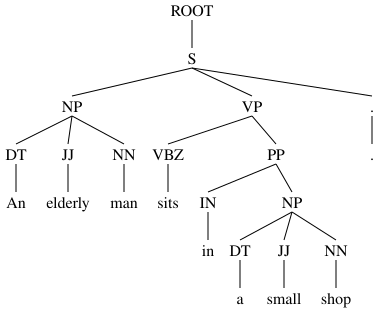

In [ ]:
# display tree
t

### Datasplit

In [ ]:
# Separate training instances labeled by 5 annotators
labeled_5 = {pid: ex for pid, ex in SNLI['train'].items() if ex['lnum'] == 5}

# Take the first 10,000 instances as the pre-development set
SNLI['dev_set_new'] = {pid: labeled_5[pid] for pid in sorted(labeled_5)[:10000]}

# Remaining training data: everything in 'train' except the dev set
SNLI['sub_train2'] = {pid: ex for pid, ex in SNLI['train'].items() if pid not in SNLI['dev_set_new']}

# Final training set used for analysis: first 200,000 of sub_train2
SNLI['sub_train3'] = { pid: SNLI['sub_train2'][pid] for pid in sorted(SNLI['sub_train2'])[:200000] }

In [ ]:
# Print the sizes of the datasets
print(f"Total training examples in SNLI['train']: {len(SNLI['train'])}")
print(f"Number of examples in SNLI['dev_set_new']: {len(SNLI['dev_set_new'])}")
print(f"Number of examples in SNLI['sub_train2']: {len(SNLI['sub_train2'])}")
print(f"Number of examples in SNLI['sub_train3']: {len(SNLI['sub_train3'])}")

# Check if the split was done correctly
assert len(SNLI['train']) == len(SNLI['dev_set_new']) + len(SNLI['sub_train2']), "Split error: Sizes don't match!"

Total training examples in SNLI['train']: 549169
Number of examples in SNLI['dev_set_new']: 10000
Number of examples in SNLI['sub_train2']: 539169
Number of examples in SNLI['sub_train3']: 200000


## Processing with spaCy


For more reasoning-relevant features, one can use [spaCy](https://spacy.io/) to get dependency parse trees for sentences. In addition to the dependency parsing, spaCy pipeline also does part-of-speech tagging (with general and fine-grained POS tags), named entity recognition, and lemmatization. SpaCy is used for some of the smart features that were implemented in this notebook file.

In [ ]:
# downloading spaCy's large model
# !python -m spacy download en_core_web_lg
import spacy

In [ ]:
NLP = spacy.load("en_core_web_sm")

In [ ]:
# SNLI train part contains 640K different sentences
# First, processing all these sentences with spaCy and then using the analyses
# for feature extraction is not feasible as the colab will run out of the memory
# There are two options, either reduce the number of sentecnes by using subpart
# of the training part, or process the sentences with spaCy in batches while
# at the same time converting NLI problems into a set of feature-values
# The former is simpler and this is how you can create new SNLI and S2A variables
print(f"Train contains {len(SNLI['train'])} problems")
print(f"The number of different sentences in SNLI: {len(S2A)}")
# Let's decide that we take first 10K problems from TRAIN
# (the label distribution should reflect the original distribution from the training data)

sub_S2A = sen2anno_from_nli_problems({**SNLI['sub_train3'], **SNLI['dev'], **SNLI['dev_set_new'], **SNLI['test']}, S2A)
print(f"The number of different sentences in subTRAIN, DEV and TEST: {len(sub_S2A)}")

Train contains 549169 problems
The number of different sentences in SNLI: 651357
The number of different sentences in subTRAIN, DEV and TEST: 265569


In [ ]:
# process all sentecnes in DEV and subTRAIN with spaCy
# Note thet the following function takes spaCy pipeline and sen->tokens dict
# With the tokenization input, the pipeline is forced to use the same tokenization
sen2Doc = spacy_process_sen2tok(NLP, { sen: anno['tok'] for sen, anno in sub_S2A.items() })

265569it [07:24, 597.69it/s]


## Display trees

In [ ]:
display_doc_dep(sen2Doc["A man is sleeping."])

doc = sen2Doc["A man is sleeping."]
for token in doc:
    print(f"Token: {token.text}, POS: {token.pos_}, Lemma: {token.lemma_}, Dependency: {token.dep_}, Head: {token.head.text}")

Token: A, POS: DET, Lemma: a, Dependency: det, Head: man
Token: man, POS: NOUN, Lemma: man, Dependency: nsubj, Head: sleeping
Token: is, POS: AUX, Lemma: be, Dependency: aux, Head: sleeping
Token: sleeping, POS: VERB, Lemma: sleep, Dependency: ROOT, Head: sleeping
Token: ., POS: PUNCT, Lemma: ., Dependency: punct, Head: sleeping


## Create features

This section contains all the code for the feature extraction. We implemented different functions for most of the features (both shallow and smart). The smart features are all grouped together with other smart features that are aimed at the same label (Neutral, Entailment, Contradiction).

All these feature functions get combined in two different functions that work on different levels:

*   **sen2features():** Sentence-level features – extracted first and used as building blocks.
*   **problem2features():** Problem/pair-level features – constructed using sentence-level features.

Finally there is a function called **problems2df()** that puts all the extracted features in a Pandas Dataframe for further analysis.


### Shallow Features

In [ ]:
from nltk.translate.bleu_score import sentence_bleu, SmoothingFunction

#### Finding negations (improved)

In [ ]:
def find_negations(doc):

    negation_words = {"n't", "no", "not", "none", "neither", "nobody", "nothing", "nowhere", "never", "hardly"}
    negations = []

    for token in doc:
        # Check for negation words from the predefined set or if the dependency relation is 'neg'
        if token.text.lower() in negation_words or token.dep_ == 'neg':
            # Add token to negations list if it's a negation
            negations.append(token.text)

    return len(negations)

#### Frequent Words

In [ ]:
# Words associated with entailment
entailment_words = [
    "instrument", "touching", "least", "humans",
    "transportation", "speaking", "screen", "arts",
    "activity", "opposing", "outdoors", "outside"
]

# Words associated with neutral
neutral_words = [
    "tall", "competition", "because", "birthday",
    "mom", "win", "got", "trip",
    "tries", "owner"
]

# Words associated with contradiction
contradiction_words = [
    "sleeping", "driving", "nobody", "alone",
    "cat", "asleep", "no", "empty",
    "eats", "sleeps"
]

In [ ]:
def check_label_words(sentence, entailment_words, neutral_words, contradiction_words):
    """
    Input: sentence (str) and three lists of inference related words.
    Function: Checks if a sentence contains any words from the entailment, neutral, or contradiction word lists.
    Output: three binary notations indicating whether associated words were present in the sentence.
    """

    # Tokenize the sentence into words
    sentence_words = set(sentence.lower().split())

    # Check for matches in each list
    entailment_flag = 1 if any(word in sentence_words for word in entailment_words) else 0
    neutral_flag = 1 if any(word in sentence_words for word in neutral_words) else 0
    contradiction_flag = 1 if any(word in sentence_words for word in contradiction_words) else 0

    return entailment_flag, neutral_flag, contradiction_flag

#### BLEU-score

In [ ]:
def compute_bleu_scores(premise, hypothesis):
    """
    Input: premise and hypothesis sentence (str)
    Function: Compute BLEU scores for n-grams (1 to 4) between a premise and a hypothesis.
    Output: Returns None for BLEU-N if N is greater than the length of either sentence.
    """

    # Tokenize premise and hypothesis
    premise_tokens = premise.lower().split()
    hypothesis_tokens = hypothesis.lower().split()

    # Store BLEU scores for different n-grams
    bleu_scores = {}

    for n in range(1, 5):
        # Check if the hypothesis and premise are long enough for the n-gram
        if len(premise_tokens) < n or len(hypothesis_tokens) < n:
            bleu_scores[f'BLEU-{n}'] = None
            continue

        # BLEU computation with n-gram weights
        weights = tuple((1/n if i < n else 0) for i in range(4))
        bleu_score = sentence_bleu(
            [premise_tokens],
            hypothesis_tokens,
            weights=weights,
            smoothing_function=SmoothingFunction().method1
        )
        bleu_scores[f'BLEU-{n}'] = bleu_score

    return bleu_scores

{'BLEU-1': 0.75, 'BLEU-2': 0.7071067811865475, 'BLEU-3': 0.6299605249474366, 'BLEU-4': 0.3976353643835253}


### Smart Features: Neutral

In [ ]:
import nltk
nltk.download('wordnet')
from nltk.corpus import wordnet as wn
from nltk.corpus.reader.wordnet import Lemma

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package verbnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/verbnet.zip.
[nltk_data] Downloading package framenet_v17 to /root/nltk_data...
[nltk_data]   Unzipping corpora/framenet_v17.zip.


#### Detail addition (hyponym)

In [1]:
def check_hyponyms(words1, words2, pos=wn.NOUN):
    """
    Input: Two lists of word tokens.
    Function: Includes hardcoded hyponym checks for common animal-related terms, profession terms, person, and human-related terms.
    Output: Returns 1 if any word in words2 is a hyponym of any word in words1, else 0.
    """

    # Hardcoded list of specific hyponym relationships
    specific_hyponyms = {
        "animal": ["dog", "cat", "lion", "elephant", "horse", "cow", "bird", "fish"],  # general to specific animals
        "tree": ["oak", "pine", "maple", "birch", "cedar"],  # general to tree types
        "flower": ["rose", "lily", "tulip", "sunflower", "daisy"],  # general to flower types
        "vehicle": ["car", "truck", "bike", "motorcycle", "bus"],  # general to vehicle types
        "fruit": ["apple", "banana", "cherry", "orange", "grape"],  # general to fruits
        "profession": ["doctor", "engineer", "teacher", "lawyer", "chef"],  # general to profession types
        "person": ["man", "woman", "girl", "boy", "child", "adult"],  # person-related terms
        "human": ["man", "woman", "girl", "boy", "child", "adult"],  # human-related terms
    }

    # Check if either list is empty or if the word lists contain only None values
    if not words1 or not words2 or all(word is None for word in words1) or all(word is None for word in words2):
        return 0

    # Check for specific hardcoded hyponym relationships
    for word1 in words1:
        word1 = word1.lower()

        # Check if word1 is in the general categories and if any word2 is in its specific hyponyms
        for general_category, hyponyms in specific_hyponyms.items():
            if word1 == general_category:  # If the word1 is a general category
                for word2 in words2:
                    if word2.lower() in hyponyms:
                        return 1

        # Otherwise, perform WordNet-based hyponym checks
        synsets1 = wn.synsets(word1, pos=pos)
        for syn1 in synsets1:
            hyponyms1 = syn1.hyponyms()  # Get all hyponyms for the synset
            for hyponym in hyponyms1:
                hyponym_lemmas = {lemma.name() for lemma in hyponym.lemmas()}
                for word2 in words2:
                    if word2 is None:
                        continue
                    if word2.lower() in hyponym_lemmas and word1.lower() != word2.lower():
                        return 1
    return 0


#### Additional Purpose Clause

In [ ]:
def contains_purpose_clause_spacy2(doc):
    """
    Input: doc (spacy.tokens.Doc): The parsed spaCy document.
    Function: Detects if a sentence contains a purpose clause or 'for + a noun phrase' using SpaCy.
    Output: (integer) 1 if a purpose clause or 'for + noun phrase' is found, 0 otherwise.
    """

    for token in doc:
      # Look for verbs followed by "for", "to", or "so"
      if token.pos_ == "VERB":
          for child in token.children:
              if child.text in {"for", "to", "so"}:

                  # Check for a purpose-related structure
                  for grandchild in child.children:
                      if grandchild.dep_ == "pobj" or grandchild.pos_ == "VERB":
                          return 1

      if token.text.lower() == "for" and token.dep_ == "prep":
          if any(child.dep_ == "pobj" and child.pos_ in {"NOUN", "PRON", "PROPN"} for child in token.children):
              return 1

    return 0

In [2]:
def contains_purpose_clause_spacy(doc):
    """
    Input: doc (spacy.tokens.Doc): The parsed spaCy document.
    Function: Detects if a sentence contains a purpose clause or 'for + a noun phrase' using SpaCy.
    Output: (integer) 1 if a purpose clause or 'for + noun phrase' is found, 0 otherwise.
    """

    # Iterate over tokens to check for purpose-related structures
    for token in doc:
        # Look for verbs followed by "for", "to", or "so"
        if token.pos_ == "VERB" and any(child.text in {"for", "to", "so"} for child in token.children):
            # Check for a purpose-related structure
            if any(grandchild.dep_ == "pobj" or grandchild.pos_ == "VERB" for child in token.children for grandchild in child.children):
                return 1

        # Check for 'for + a noun phrase'
        if token.text.lower() == "for" and token.dep_ == "prep":
            if any(child.dep_ == "pobj" and child.pos_ in {"NOUN", "PRON", "PROPN"} for child in token.children):
                return 1


    return 0

In [ ]:
def has_purpose_clause_simple(hypothesis, hypothesis_doc):
    """
    Input: The hypothesis sentence (str) and hypothesis document (SpaCy annotation dictionary)
    Function: Detects if the hypothesis contains a purpose clause using explicit phrases.
    Output: (integer) 1 if a purpose clause is found, 0 otherwise.
    """

    # Define purpose-indicating phrases
    purpose_phrases = [
        "in order to", "for the purpose of", "so that", "for the sake of",
        "aimed at", "with the goal of", "with the intention of", "in an attempt to",
        "meant to", "designed to", "intended for", "so as to", "in order that",
        "goal", "reason", "aim", "objective", "purpose"
    ]

    hypothesis_lower = hypothesis.lower()

    for phrase in purpose_phrases:
        if phrase in hypothesis_lower:
            return 1

    if contains_purpose_clause_spacy(hypothesis_doc) == 1:
        return 1

    return 0

### Smart Features: Entailment

In [ ]:
NLP = spacy.load("en_core_web_sm")

#### Generalization (hypernym)

In [ ]:
def extract_subject_object(sentence):
    """
    Input: A string representing the sentence
    Function: Extracts the subject, direct object, and prepositional objects from a given sentence using SpaCy.
    Output: (tuple) containing subject (str or None), direct object (str or None) and prepositional objects (list)
    """

    doc = sen2Doc[sentence]
    subject = None
    direct_object = None
    prepositional_objects = []

    for token in doc:
        # Check for nominal subject
        if token.dep_ == "nsubj":
            subject = token.text
        # Check for direct object (the noun receiving the action)
        elif token.dep_ == "dobj":
            direct_object = token.text
        # Check for prepositional object (the object of a preposition)
        elif token.dep_ == "pobj":
            prepositional_objects.append(token.text)

    return subject, direct_object, prepositional_objects

In [ ]:
def extract_subject_object2(doc):
    subject = None
    direct_object = None
    prepositional_objects = []

    for token in doc:
        # Check for nominal subject
        if token.dep_ == "nsubj":
            subject = token.text
        # Check for direct object (the noun receiving the action)
        elif token.dep_ == "dobj":
            direct_object = token.text
        # Check for prepositional object (the object of a preposition)
        elif token.dep_ == "pobj":
            prepositional_objects.append(token.text)

    return [subject], [direct_object], prepositional_objects

In [7]:
def check_hypernyms(words1, words2, pos=wn.NOUN):
    """
    Input: Two lists of word tokens.
    Function: Checks whether word2 is a hypernym of word1 using SpaCy.
    Additionally, includes hardcoded check for common animals and their hypernym "animal".
    Output: Returns 1 if any word in words2 is a hypernym of any word in words1, else 0.
    """

    # Common animals and their hypernym
    animal_hypernyms = {
        "dog": "animal", "cat": "animal", "lion": "animal", "tiger": "animal", "elephant": "animal",
        "horse": "animal", "cow": "animal", "sheep": "animal", "bird": "animal", "fish": "animal",
        "rabbit": "animal", "bear": "animal", "wolf": "animal", "deer": "animal", "kangaroo": "animal",
        "giraffe": "animal", "zebra": "animal", "hippopotamus": "animal", "leopard": "animal", "cheetah": "animal",
        "whale": "animal", "dolphin": "animal", "shark": "animal", "penguin": "animal", "panda": "animal",
        "koala": "animal", "octopus": "animal", "seal": "animal", "otter": "animal"
    }

    # Human-related terms and their hypernym
    human_related = {
        "woman": "human", "man": "human", "child": "human", "girl": "human", "boy": "human", "adult": "human",
        "student": "human", "teacher": "human", "scientist": "human", "doctor": "human", "nurse": "human",
        "patient": "human", "actor": "human", "actress": "human", "musician": "human", "author": "human",
        "parent": "human", "son": "human", "daughter": "human", "baby": "human", "grandmother": "human",
        "grandfather": "human", "sibling": "human", "manager": "human", "worker": "human", "engineer": "human",
        "driver": "human", "chef": "human", "waiter": "human", "police": "human", "officer": "human",
        "student": "human", "employee": "human", "employer": "human", "lawyer": "human", "judge": "human"
    }

    # Person-related terms and their hypernym
    person_related = {
        "woman": "person", "man": "person", "child": "person", "girl": "person", "boy": "person", "adult": "person",
        "student": "person", "teacher": "person", "scientist": "person", "doctor": "person", "nurse": "person",
        "patient": "person", "actor": "person", "actress": "person", "musician": "person", "author": "person",
        "parent": "person", "son": "person", "daughter": "person", "baby": "person", "grandmother": "person",
        "grandfather": "person", "sibling": "person", "manager": "person", "worker": "person", "engineer": "person",
        "driver": "person", "chef": "person", "waiter": "person", "police": "person", "officer": "person",
        "student": "person", "employee": "person", "employer": "person", "lawyer": "person", "judge": "person"
    }


    if not words1 or not words2 or all(word is None for word in words1) or all(word is None for word in words2):
        return 0

    for word1 in words1:

        if word1 is None:
            continue

        # Check for specific animal-to-animal hypernyms
        if word1.lower() in animal_hypernyms and "animal" in words2:
            return 1

        # Check for specific human-related hypernyms
        if word1.lower() in human_related and "human" in words2:
            return 1

        # Check for specific person-related hypernyms
        if word1.lower() in person_related and "person" in words2:
            return 1

        # Otherwise, perform WordNet hypernym checks
        synsets1 = wn.synsets(word1, pos=pos)
        for syn1 in synsets1:
            for hypernym in syn1.hypernyms():
                hypernym_lemmas = {lemma.name() for lemma in hypernym.lemmas()}
                for word2 in words2:
                    if word2 is None:
                        continue
                    if word2 in hypernym_lemmas and word1.lower() != word2.lower():
                        return 1
    return 0


#### Rephrasing the premise (synonym)

In [ ]:
def check_overlap(words1, words2, pos=wn.NOUN):
    """
    Input: two word lists
    Function: Iterates through all word pairs from the two input lists and performs a case-insensitive comparison to check for matching words.
    Output: Returns 1 if any word pair from the lists is the same, else 0.
    """
    if not words1 or not words2:
        return 0

    for word1 in words1:
        for word2 in words2:
            if word1.lower() == word2.lower():
                return 1
    return 0

In [ ]:
def check_synonyms(words1, words2, pos=wn.NOUN):
    """
    Input: two word lists
    Function: Retrieves synonym sets for each word in both lists using WordNet and checks for intersections between these sets.
    Output: Returns 1 if there is any overlap in the synonym sets of any word pair from the lists, else 0.
    """
    if not words1 or not words2:
        return 0

    for word1 in words1:
        synonyms1 = set(lemma.name() for synset in wn.synsets(word1, pos=pos) for lemma in synset.lemmas())
        for word2 in words2:
            synonyms2 = set(lemma.name() for synset in wn.synsets(word2, pos=pos) for lemma in synset.lemmas())
            if synonyms1 & synonyms2:
                return 1
    return 0

### Smart Features: Contradiction

In [ ]:
!pip install vaderSentiment
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
sentiment_analyzer = SentimentIntensityAnalyzer()

NLP = spacy.load("en_core_web_sm")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 2.6 MB/s eta 0:00:00


#### Adverb/Adjective Alteration

In [ ]:
def extract_modifiers(doc):
    """
    Input: SpaCy Annotation Document.
    Function: Extracts a mapping of nouns/verbs to their associated modifiers (adjectives/adverbs).
    Output: Returns a dictionary where keys are nouns/verbs and values are sets of their corresponding modifiers.
    """

    modifiers = {}
    for token in doc:
        if token.pos_ in ['ADJ', 'ADV'] and token.dep_ in ['amod', 'advmod']:
            head_token = token.head
            if head_token.pos_ in ['NOUN', 'VERB']:
                head_text = head_token.text.lower()
                if head_text not in modifiers:
                    modifiers[head_text] = set()
                modifiers[head_text].add(token.text.lower())
    return modifiers

In [ ]:
def are_words_synonyms(word1, word2):
    """
    Input: Two words
    Function: Retrieves synsets for both words and compares their similarity using WordNet’s Wu-Palmer similarity metric.
    Output: Returns True if the similarity between any synset pair exceeds 0.9, indicating synonymy, else False.
    """

    # Get the synsets for each word
    synsets1 = wn.synsets(word1)
    synsets2 = wn.synsets(word2)

    # Check for synonymy (intersection of synsets)
    for syn1 in synsets1:
        for syn2 in synsets2:
            if syn1.wup_similarity(syn2) is not None and syn1.wup_similarity(syn2) > 0.9:
                return True

    return False

In [ ]:
def are_words_related(word1, word2, similarity_threshold=0.8):
    """
    Input: two word strings and an optional similarity treshold (float)
    Function: Determines if two words are synonyms or antonyms using WordNet, considering synonyms of each word.
    Output: (tuple) True if the words are synonyms/antonyms or highly similar.
    """

    # hardcoded list of common color names
    colors = {
        "red", "blue", "green", "yellow", "orange", "purple",
        "pink", "brown", "black", "white", "gray", "grey", "cyan", "magenta"
    }

    # special case: if both words are colors and different, treat them as distinct
    if word1 in colors and word2 in colors and word1 != word2:
        color_distinction_count += 1
        return False, True

    # special case 2: old & elderly
    if word1 == 'elderly' and word2 == 'old':
        elderly_old_count += 1
        return True, False

    if word1 == 'old' and word2 == 'elderly':
        elderly_old_count += 1
        return True, False

    is_synonym = False
    is_antonym = False

    # Get synsets for both words
    synsets1 = wn.synsets(word1)
    synsets2 = wn.synsets(word2)

    # Create a set of candidate synonyms for each word
    candidate_synonyms_word1 = set()
    candidate_synonyms_word2 = set()

    # Populate candidate synonyms for word1
    for syn1 in synsets1:
        candidate_synonyms_word1.update(lemma.name().lower() for lemma in syn1.lemmas())

    # Populate candidate synonyms for word2
    for syn2 in synsets2:
        candidate_synonyms_word2.update(lemma.name().lower() for lemma in syn2.lemmas())

    # Check for synonymy
    for syn1 in synsets1:
        for syn2 in synsets2:
            # Check similarity between synsets
            similarity = syn1.wup_similarity(syn2)
            if similarity is not None and similarity >= similarity_threshold:
                is_synonym = True

    # Check for antonymy directly or through synonyms
    for syn1 in synsets1:
        for lemma1 in syn1.lemmas():
            # Check if lemma1's antonyms match word2 or its synonyms
            for antonym in lemma1.antonyms():
                if antonym.name().lower() == word2.lower() or antonym.name().lower() in candidate_synonyms_word2:
                    is_antonym = True
            # Check if word1 or its synonyms are antonyms of word2's synonyms
            for syn2 in synsets2:
                for lemma2 in syn2.lemmas():
                    if lemma2.name().lower() in candidate_synonyms_word1:
                        for antonym in lemma2.antonyms():
                            if antonym.name().lower() == word1.lower():
                                is_antonym = True

    return is_synonym, is_antonym

In [ ]:
def compute_dif_adjs_advs(premise_doc, hypothesis_doc):
    """
    Input: The parsed spaCy documents for the premise and hypothesis.
    Function: Computes whether there are new/different adjectives or adverbs in the hypothesis
    compared to the premise, accounting for both synonymy and antonymy using WordNet.
    Ouput: (tuple) A flag indicating if differences exist (1 or 0) and the set of differing adjectives/adverbs.

    """

    # Extract modifiers (adjectives and adverbs) from the premise and hypothesis
    premise_modifiers = extract_modifiers(premise_doc)
    hypothesis_modifiers = extract_modifiers(hypothesis_doc)

    # Check for differences in modifiers
    dif_adjs_advs = set()
    for noun_or_verb, hypothesis_mods in hypothesis_modifiers.items():
        # If the same noun/verb exists in the premise
        if noun_or_verb in premise_modifiers:
            # Find modifiers in the hypothesis that are not in the premise
            new_mods = hypothesis_mods - premise_modifiers[noun_or_verb]

            # Check if the new modifier is a synonym or antonym of any existing modifier in the premise
            for new_mod in new_mods:
                should_add = True
                for premise_mod in premise_modifiers[noun_or_verb]:
                    is_synonym, is_antonym = are_words_related(new_mod, premise_mod)

                    # If they're synonyms but not antonyms, skip adding
                    if is_synonym and not is_antonym:
                        should_add = False
                        break

                    # If they're both synonyms and antonyms, add them
                    if is_synonym and is_antonym:
                        should_add = True
                        break

                if should_add:
                    dif_adjs_advs.add(new_mod)

        else:
            continue

    return (1 if dif_adjs_advs else 0, dif_adjs_advs)

#### Semantic Negation of Matching Terms

In [ ]:
def extract_negations(sentence):
    """
    Input: A sentence (str)
    Function: Extracts explicit negations (such as "not" or "never") and implicit negations using common negation prefixes from the parsed sentence.
    Output: Returns a list of negation phrases or prefix-modified words.
    """

    doc = sen2Doc[sentence]
    negs = []
    negation_prefixes = ['un', 'in', 'im', 'dis', 'non']

    for token in doc:
        # Check for explicit negations
        if token.dep_ == 'neg':
            neg_pair = f"{token.text} {token.head.text}"
            negs.append(neg_pair)

        # Check for implicit negation via prefixes
        if token.pos_ in {"ADJ", "VERB", "NOUN"}:
            lemma = token.lemma_
            for prefix in negation_prefixes:
                if lemma.startswith(prefix) and len(lemma) > len(prefix):
                    root_word = lemma[len(prefix):]
                    negs.append(f"{prefix}-{root_word}")
    return negs


def check_negation(anno1, anno2):
    """
    Input: Two annotations from SpaCy Doc containing negation words and tokens.
    Function: Checks for mismatched negation pairs by comparing unique negations and verifying if their parent words are present in both annotations.
    Output: Returns 1 if a parent is common across both annotations despite differing negations, else 0.
    """
    unique_negations = set(anno1['neg_word']).symmetric_difference(set(anno2['neg_word']))

    for negation_pair in unique_negations:
        parent = negation_pair.split()[1] if " " in negation_pair else negation_pair.split('-')[-1]

        # Check whether the parent is present in both sentences
        if (parent in anno1['tok']) and (parent in anno2['tok']):
            return 1

    return 0

#### Opposing Sentiment (VADER model)

In [ ]:
def get_sentiment(sentence):
    """
    Input: A sentence (str)
    Function: Analyzes the sentiment of the sentence using VADER sentiment analyzer and retrieves the compound score from the sentiment polarity scores.
    Output: Returns 1 for positive sentiment (compound ≥ 0.05), -1 for negative sentiment (compound ≤ -0.05), and 0 for neutral sentiment (compound between -0.05 and 0.05).
    """
    scores = sentiment_analyzer.polarity_scores(sentence)
    compound = scores['compound']

    if compound >= 0.05:
        return 1
    elif compound <= -0.05:
        return -1
    else:
        return 0

#### Antagonym



In [ ]:
def get_antonyms(word):
    """
    Input: A word (str)
    Function: Retrieves antonyms of the given word by exploring WordNet synsets and their associated lemmas.
    Output: Returns a set of antonyms for the given word.
    """
    antonyms = []
    for synset in wn.synsets(word, pos=wn.VERB):
        for lemma in synset.lemmas():
            for ant in lemma.antonyms():
                antonyms.append(ant.name())
    return set(antonyms)

In [8]:
def check_antagonyms(words1, words2):
    """
    Returns 1 if any word in words2 is an antagonym (contronym) of any word in words1, else 0.
    Uses both WordNet antonym relationships and a hardcoded list of known antagonyms.
    """

    # Common antonyms
    antagonyms = {
        "sanction": ["prohibit", "permit"],
        "cleave": ["separate", "stick"],
        "dust": ["remove", "add"],
        "oversight": ["supervision", "error"],
        "screen": ["hide", "show"],
        "fast": ["quick", "stuck"],
        "bound": ["moving", "tied"],
        "custom": ["usual", "unique"],
    }

    if not words1 or not words2 or all(word is None for word in words1) or all(word is None for word in words2):
        return 0

    for word1 in words1:
        if word1 is None:
            continue

        if word1.lower() in antagonyms:
            for word2 in words2:
                if word2 in antagonyms[word1.lower()]:
                    return 1

        # Check for antonyms in WordNet
        synsets1 = wn.synsets(word1)
        for syn1 in synsets1:
            for lemma in syn1.lemmas():
                if lemma.antonyms():
                    antonym_lemmas = {ant.name() for ant in lemma.antonyms()}
                    for word2 in words2:
                        if word2 is None:
                            continue
                        if word2 in antonym_lemmas and word1.lower() != word2.lower():
                            return 1

    return 0


### Combining feature functions

In [ ]:
def sen2features(sen, anno):
    '''
    Takes a sentence and its annotation and returns a dictionary
    of feature:value that characterizes the sentence
    '''
    feats = {}

    sen_doc = sen2Doc[sen]


    # =================== SHALLOW FEATURES ===================

    # === Pre-existing Features ===
    # 1. number of tokens
    feats['tok_num'] = len(anno['tok'])

    # For improved version, see (12.)
    # 2. number of negation words
    # neg_words = "n't no not"
    # feats['neg_num'] = len([ t for t in anno['tok'] if t.lower() in neg_words ])

    # 3. number of nouns
    feats['noun_num'] = len([ t for t in anno['pos'] if t == "NNS" or t == "NN" ])

    # === Newly Added Features ===

    # 4. number of verbs
    feats['verb_num'] = len([ t for t in anno['pos'] if t == "VB" or t == "VBD" or t == 'VBG' or t == 'VBN' or t == 'VBP' or t == 'VBZ'])

    # 5. number of adjectives
    feats['adj_num'] = len([ t for t in anno['pos'] if t == "JJ" or t == "JJR" or t == 'JJS' or t == 'RB' or t == 'RBR' or t == 'RBS'])

    # 6. number of upper case words
    feats['uppcase_num'] = len([ t for t in anno['tok'] if any(c.isupper() for c in t) ])

    # 7. number of characters
    feats['char_num'] = len(sen.replace(" ", ""))

    # 8. number of punctuations
    punctuations = ".,!?"
    feats['punc_num'] = len([ t for t in anno['tok'] if t in punctuations ])

    # 9. number of articles/determiners
    feats['art_num'] = len([ t for t in anno['pos'] if t == "DT"])

    # 10. subject and objects
    subject, direct_object, prepositional_objects = extract_subject_object(sen)
    feats['subj'] = subject
    feats['dobj'] = direct_object
    feats['pobj'] = prepositional_objects

    # 11. neg+word (list)
    negations = extract_negations(sen)
    feats['neg_word'] = negations

    # 12. number of negations deeper (with help of spacy and more negation words)
    feats['neg_num'] = find_negations(sen_doc)

    # 13. sentiment score using VADER
    feats['sentiment'] = get_sentiment(sen)

    return {**feats, **anno}

In [ ]:
# Add features to the sentence annotations
s2af = { s: sen2features(s, a) for s, a in tqdm(sub_S2A.items()) }

100%|██████████| 265569/265569 [00:29<00:00, 9044.10it/s]


In [ ]:
# an example of a sentence with feature-added annotations
s2af['The women is not on her phone.']

{'tok_num': 8,
 'noun_num': 2,
 'verb_num': 1,
 'adj_num': 1,
 'uppcase_num': 1,
 'char_num': 24,
 'punc_num': 1,
 'art_num': 1,
 'subj': 'women',
 'dobj': None,
 'pobj': ['phone'],
 'neg_word': ['not is'],
 'neg_num': 1,
 'sentiment': 0,
 'tree': '(ROOT (S (NP (DT The) (NNS women)) (VP (VBZ is) (RB not) (PP (IN on) (NP (PRP$ her) (NN phone)))) (. .)))',
 'btree': '( ( The women ) ( ( ( is not ) ( on ( her phone ) ) ) . ) )',
 'tok': ['The', 'women', 'is', 'not', 'on', 'her', 'phone', '.'],
 'pos': ['DT', 'NNS', 'VBZ', 'RB', 'IN', 'PRP$', 'NN', '.'],
 'pids': {('train', '109770830.jpg#0r5c', 'h')}}

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity

def problem2features(sen1, anno1, sen2, anno2, sen_feats=set(['tok_num', 'neg_num', 'noun_numm'])):
    '''
    Takes two sentences and their anotations (_features) and returns a dictionary of
    feature:value that characterizes the sentence pair, i.e. feature is about both sentences
    '''
    features = {}
    # define the sentence-based features that will be part of the problem features
    sen_feats = set('tok_num neg_num noun_num verb_num adj_num uppcase_num char_num, art_num, sentiment'.split())
    sen1_feats = { f"{k}1": v for k, v in anno1.items() if k in sen_feats }
    sen2_feats = { f"{k}2": v for k, v in anno2.items() if k in sen_feats }
    # not very smart idea: putting single sentence-based features as pair features
    features = {**sen1_feats, **sen2_feats} # merge two dicts

    # token and POS sets for later use
    premise_pos = anno1['pos']
    hypothesis_pos = anno2['pos']

    # obtains spacy doc for premise and hypothesis
    premise_doc = sen2Doc[sen1]
    hypothesis_doc = sen2Doc[sen2]


    # =================== SHALLOW FEATURES ===================
    # === Pre-existing Features ===
    # pair-related features
    # 1. If only one of the sentences has a negation
    neg_set = set([anno1['neg_num'], anno2['neg_num']])
    features['neg_diff'] = 1 if (0 in neg_set and len(neg_set) > 1) else 0

    if anno2['neg_num'] > anno1['neg_num']:
        features['more_neg_in_hyp'] = 1
    else:
        features['more_neg_in_hyp'] = 0

    # if diff == 0:
    #     # 2. If premise contains more tokens than hypothesis has
    #     features['tok1>2'] = int(anno1['tok_num'] > anno2['tok_num'])

    #     # 3. If premise has more nouns than hypothesis has
    #     features['noun1>2'] = int(anno1['noun_num'] > anno2['noun_num'])

    #     # === Newly Added Features ===

    #     # 4. If premise has more verbs than hypothesis
    #     features['verb1>2'] = int(anno1['verb_num'] > anno2['verb_num'])

    #     # 5. If premise has more adjectives than hypothesis
    #     features['adj1>2'] = int(anno1['adj_num'] > anno2['adj_num'])

    #     # 6. Calculates Jaccard similarity between premise and hypothesis
    #     premise_set = set(anno1['tok'])
    #     hypothesis_set = set(anno2['tok'])
    #     features['jaccard_sim'] = len(premise_set & hypothesis_set) / len(premise_set | hypothesis_set)

    #     # 7. If premise has more upper case numbers than hypothesis
    #     features['uppcase1>2'] = int(anno1['uppcase_num'] > anno2['uppcase_num'])

    #     # 8. If premise has more characters than hypothesis
    #     features['charnum1>2'] = int(anno1['char_num'] > anno2['char_num'])

    #     # 9. If premise has more characters than hypothesis
    #     features['punc1>2'] = int(anno1['punc_num'] > anno2['punc_num'])

    #     # 10. If premise has more articles than hypothesis
    #     features['art1>2'] = int(anno1['art_num'] > anno2['art_num'])

    # else:

    # 2. Difference in number of tokens between premise and hypothesis (from paper by Gururangan et al. (2018))
    features['tok_diff'] = anno1['tok_num'] - anno2['tok_num']

    # 3. Difference in nouns between premise and hypothesis
    features['noun_diff'] = anno1['noun_num'] - anno2['noun_num']

    # === Newly Added Features ===
    # 4. Difference in number of verbs between premise and hypothesis
    features['verb_diff'] = anno1['verb_num'] - anno2['verb_num']

    # 5. Difference in number of adjectives between premise and hypothesis
    features['adj_diff'] = anno1['adj_num'] - anno2['adj_num']

    # 6. Jaccard similarity between premise and hypothesis
    premise_set = set(anno1['tok'])
    hypothesis_set = set(anno2['tok'])
    features['jaccard_sim'] = len(premise_set & hypothesis_set) / len(premise_set | hypothesis_set)

    # 7. Difference in number of uppercase characters between premise and hypothesis
    features['uppcase_diff'] = anno1['uppcase_num'] - anno2['uppcase_num']

    # 8. Difference in number of characters between premise and hypothesis
    features['charnum_diff'] = anno1['char_num'] - anno2['char_num']

    # 9. Difference in number of punctuation marks between premise and hypothesis
    features['punc_diff'] = anno1['punc_num'] - anno2['punc_num']

    # 10. Difference in number of articles/determiners between premise and hypothesis
    features['art_diff'] = anno1['art_num'] - anno2['art_num']

    # 11.  === Common words from paper by Poliak et al. (2018)
    features['entailment_words'], features['neutral_words'], features['contradiction_words'] = check_label_words(sen2, entailment_words, neutral_words, contradiction_words)

    # 12.  === Purpose clause in neutral labels from paper by Gururangan et al. (2018)
    features['purpose_neutral'] = has_purpose_clause_simple(sen2, hypothesis_doc)

    # 13. Sentiment score using VADER
    # oposite sentiment (positive and negative)
    if anno1['sentiment'] == 1 and anno2['sentiment'] == -1:
        features['opposite_sentiment'] = 1
    elif anno1['sentiment'] == -1 and anno2['sentiment'] == 1:
        features['opposite_sentiment'] = 1
    else:
        features['opposite_sentiment'] = 0

    # =================== SMART FEATURES ===================

    # 14.  === (USING SPACY other way) Newly Added Smart Feature: Adjective and Adverb Additions ===
    dif_adjs_advs_feature, dif_adjs_advs = compute_dif_adjs_advs(premise_doc, hypothesis_doc)
    features['dif_adjs_advs'] = dif_adjs_advs_feature

    if len(dif_adjs_advs) > 0:
      features['dif_adjs_advs'] = 1
      adjs_advs_diff_count += 1

    else:
      features['dif_adjs_advs'] = 0

    # 15. Check for hypernyms, hyponyms, antonyms and synonyms
    prem_sub, prem_dobj, prem_pobj = extract_subject_object2(premise_doc)
    hyp_sub, hyp_dobj, hyp_pobj = extract_subject_object2(hypothesis_doc)

    features['sub_hypothesis_hyper'] = check_hypernyms(prem_sub, hyp_sub, pos=wn.NOUN)
    features['dobj_hypothesis_hyper'] = check_hypernyms(prem_dobj, hyp_dobj, pos=wn.NOUN)
    features['pobj_hypothesis_hyper'] = check_hypernyms(prem_pobj, hyp_pobj, pos=wn.NOUN)

    features['sub_hypothesis_anto'] = check_antagonyms(prem_sub, hyp_sub)
    features['dobj_hypothesis_anto'] = check_antagonyms(prem_dobj, hyp_dobj)
    features['pobj_hypothesis_anto'] = check_antagonyms(prem_pobj, hyp_pobj)

    features['sub_hypothesis_hypo'] = check_hyponyms(prem_sub, hyp_sub, pos=wn.NOUN)
    features['dobj_hypothesis_hypo'] = check_hyponyms(prem_dobj, hyp_dobj, pos=wn.NOUN)
    features['pobj_hypothesis_hypo'] = check_hyponyms(prem_pobj, hyp_pobj, pos=wn.NOUN)

    features['subj_synonym'] = check_synonyms(anno1['subj'], anno2['subj'])
    features['dobj_synonym'] = check_synonyms(anno1['dobj'], anno2['dobj'])
    features['pobj_synonym'] = check_synonyms(anno1['pobj'], anno2['pobj'])

    # 16. Presence of negation+word and word
    # must be at least one negation in hypothesis XOR premise
    features['neg_word_and_word'] = check_negation(anno1, anno2)

    # === SHALLOW ===
    # 17. BLEU-scores (n-gram 1 to 4)
    bleu_scores = compute_bleu_scores(sen1, sen2)
    features['BLEU1'] = bleu_scores['BLEU-1']
    features['BLEU2'] = bleu_scores['BLEU-2']
    features['BLEU3'] = bleu_scores['BLEU-3']
    features['BLEU4'] = bleu_scores['BLEU-4']


    return features

In [ ]:
# You can modify the function, but it might not be necessary as it is pretty general
def problems2df(data_dict, sen2af):
    '''
    Read a dictionary of NLI problems {pid->prob} and
    a dictionary of sentence annotations {sent->anno_feats}
    and represent each problem as a set of feature-values in DatFrame.
    DataFrame offers an easy way of viewing and manipulating data.
    Separate DataFrames are created for labels, features, and sentence pairs
    https://pandas.pydata.org/pandas-docs/stable/user_guide/10min.html
    '''
    dict_of_feats = { pid: problem2features(prob['p'], sen2af[prob['p']], prob['h'], sen2af[prob['h']])
                      for pid, prob in tqdm(data_dict.items()) }
    # Use  {key : list or dict} to create DataFrame
    gold_labels = { pid:[prob['g']] for pid, prob in data_dict.items() }
    # Don't use label annotations as features as this will be cheating :)
    # Create DataFrame for sentence pairs for visualization
    pair_df = { pid:[f"{prob['p']} ??? {prob['h']}"] for pid, prob in tqdm(data_dict.items()) }
    # make each problem charactersistics as a row
    feat_df = pd.DataFrame(dict_of_feats).transpose()
    lab_df = pd.DataFrame(gold_labels).transpose()
    pair_df = pd.DataFrame(pair_df).transpose()
    # match the order in label, feature and pair farmes
    lab_df.reindex(feat_df.index)
    pair_df.reindex(feat_df.index)
    return feat_df, lab_df, pair_df

In [ ]:
feat_df, lab_df, pair_df = problems2df(SNLI['sub_train3'], s2af)

100%|██████████| 200000/200000 [00:00<00:00, 542829.00it/s]


4995
tot:  200000
col count:  1431
old eld count:  162


In [ ]:
# Let's put all three dataframes together for visualization
# Press the magic wand icon after the frame appears
df = pd.concat([lab_df, feat_df, pair_df], axis=1)
df

adj and adv:
0
contradiction    2426
neutral          1462
entailment       1107
Name: count, dtype: int64
4995
0
contradiction    48.568569
neutral          29.269269
entailment       22.162162
Name: count, dtype: float64
2.4975
purpose:

0
neutral          9652
contradiction    3209
entailment       2219
Name: count, dtype: int64
15080
0
neutral          64.005305
contradiction    21.279841
entailment       14.714854
Name: count, dtype: float64
7.539999999999999
neg word:

0
contradiction    302
entailment        79
neutral           49
Name: count, dtype: int64
430
neg dif:

0
contradiction    67.987680
neutral          17.084189
entailment       14.928131
Name: count, dtype: float64
2.435

op sent:

0
contradiction    2698
neutral          1655
entailment        563
Name: count, dtype: int64
4916
0
contradiction    54.882018
neutral          33.665582
entailment       11.452400
Name: count, dtype: float64
2.458

sub hyper:

0
entailment       1666
neutral           864
contradictio

,0,tok_num1,noun_num1,verb_num1,adj_num1,uppcase_num1,neg_num1,sentiment1,tok_num2,noun_num2,...,pobj_hypothesis_hypo,neg_word_and_word,subj_synonym,dobj_synonym,pobj_synonym,BLEU1,BLEU2,BLEU3,BLEU4,0
1000092795.jpg#0r1c,contradiction,17.0,4.0,2.0,2.0,1.0,0.0,0.0,6.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,Two young guys with shaggy hair look at their ...
1000092795.jpg#0r1e,entailment,17.0,4.0,2.0,2.0,1.0,0.0,0.0,6.0,2.0,...,0.0,0.0,1.0,0.0,1.0,0.094438,0.018888,0.011898,0.010148,Two young guys with shaggy hair look at their ...
1000092795.jpg#0r1n,neutral,17.0,4.0,2.0,2.0,1.0,0.0,0.0,4.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,Two young guys with shaggy hair look at their ...
1000092795.jpg#1r1c,contradiction,11.0,2.0,1.0,4.0,2.0,0.0,0.0,5.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,"Two young, White males are outside near many b..."
1000092795.jpg#1r1e,entailment,11.0,2.0,1.0,4.0,2.0,0.0,0.0,9.0,2.0,...,0.0,0.0,1.0,0.0,1.0,0.551561,0.083388,0.046765,0.036655,"Two young, White males are outside near many b..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3042488474.jpg#4r1c,contradiction,8.0,2.0,1.0,1.0,0.0,0.0,0.0,13.0,3.0,...,0.0,0.0,1.0,0.0,0.0,0.416667,0.337100,0.224822,0.106003,a blond man looks at the camera. ??? A blond m...
3042488474.jpg#4r1e,entailment,8.0,2.0,1.0,1.0,0.0,0.0,0.0,7.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.423241,0.378558,0.311847,0.171033,a blond man looks at the camera. ??? A blond m...
3042488474.jpg#4r1n,neutral,8.0,2.0,1.0,1.0,0.0,0.0,0.0,8.0,3.0,...,0.0,0.0,1.0,0.0,1.0,0.428571,0.267261,0.112625,0.077306,a blond man looks at the camera. ??? The man i...
3042604058.jpg#0r1c,contradiction,10.0,3.0,2.0,0.0,1.0,0.0,1.0,8.0,2.0,...,0.0,0.0,1.0,0.0,0.0,0.214708,0.051857,0.034318,0.029519,College students sitting on the floor cheering...


## Training and Evaluation

This section contains the code we implemented to find all the performance results we included in the paper. This includes code to see the performance on the pre-development set, code to find the optimal hyperparameters, and the final evaluation on the SNLI test set.

### Splitting the smart and shallow features and training example

In [ ]:
feat_df

shallow_features = ['tok_num1', 'noun_num1', 'verb_num1', 'adj_num1', 'uppcase_num1',
       'neg_num1', 'sentiment1', 'tok_num2', 'noun_num2', 'verb_num2',
       'adj_num2', 'uppcase_num2', 'neg_num2', 'sentiment2', 'neg_diff',
       'more_neg_in_hyp', 'tok_diff', 'noun_diff', 'verb_diff', 'adj_diff',
       'jaccard_sim', 'uppcase_diff', 'charnum_diff', 'punc_diff', 'art_diff',
       'entailment_words', 'neutral_words', 'contradiction_words', 'BLEU1', 'BLEU2', 'BLEU3', 'BLEU4']

smart_features = ['purpose_neutral', 'sub_hypothesis_hypo', 'dobj_hypothesis_hypo',
       'pobj_hypothesis_hypo', 'sub_hypothesis_hyper', 'dobj_hypothesis_hyper',
       'pobj_hypothesis_hyper', 'subj_synonym',
       'dobj_synonym', 'pobj_synonym', 'dif_adjs_advs', 'neg_word_and_word', 'sub_hypothesis_anto', 'dobj_hypothesis_anto',
       'pobj_hypothesis_anto',  'opposite_sentiment']

# Split the DataFrame into two parts for analysis on both feature types
shallow_df = feat_df[shallow_features]
smart_df = feat_df[smart_features]

Index(['tok_num1', 'noun_num1', 'verb_num1', 'adj_num1', 'uppcase_num1',
       'neg_num1', 'sentiment1', 'tok_num2', 'noun_num2', 'verb_num2',
       'adj_num2', 'uppcase_num2', 'neg_num2', 'sentiment2', 'neg_diff',
       'more_neg_in_hyp', 'tok_diff', 'noun_diff', 'verb_diff', 'adj_diff',
       'jaccard_sim', 'uppcase_diff', 'charnum_diff', 'punc_diff', 'art_diff',
       'entailment_words', 'neutral_words', 'contradiction_words',
       'purpose_neutral', 'opposite_sentiment', 'dif_adjs_advs',
       'sub_hypothesis_hyper', 'dobj_hypothesis_hyper',
       'pobj_hypothesis_hyper', 'sub_hypothesis_anto', 'dobj_hypothesis_anto',
       'pobj_hypothesis_anto', 'sub_hypothesis_hypo', 'dobj_hypothesis_hypo',
       'pobj_hypothesis_hypo', 'neg_word_and_word', 'subj_synonym',
       'dobj_synonym', 'pobj_synonym', 'BLEU1', 'BLEU2', 'BLEU3', 'BLEU4'],
      dtype='object')
200000
200000


In [ ]:
# Just an example with decision trees
from sklearn.tree import DecisionTreeClassifier as DTC

# initializing a DT classifier and training it
DT = DTC(criterion="gini", max_depth=10, random_state=0)
default_DT = DT.fit(feat_df, lab_df)

MODEL = {'cheater': default_DT}

### Evaluation functions

In [ ]:
def evaluate(model, dataset, sen2anno):
    """
    function to evaluate on both feature types
    """

    # a sample code wich is adapted to the previous code about decision trees
    s2af = { s: sen2features(s, a) for s, a in tqdm(sen2anno.items()) }
    feat_df, lab_df, pair_df = problems2df(dataset, s2af)

    pred_list = model.predict(feat_df)
    return pred_list.tolist(), lab_df.values.squeeze().tolist()

In [ ]:
def evaluate2(model, dataset, sen2anno):
    """
    function to evaluate on smart features only
    """

    # Extract feature values and labels only for shallow_features
    s2af = {s: sen2features(s, a) for s, a in tqdm(sen2anno.items())}
    smart_df, lab_df, pair_df = problems2df(dataset, s2af)

    # Ensure only shallow features are used for prediction
    smart_df = smart_df[smart_features]

    # Predict using the trained model
    pred_list = model.predict(smart_df)

    return pred_list.tolist(), lab_df.values.squeeze().tolist()

In [ ]:
def evaluate3(model, dataset, sen2anno):
    """
    function to evaluate on shallow features only
    """

    # Extract feature values and labels only for shallow_features
    s2af = {s: sen2features(s, a) for s, a in tqdm(sen2anno.items())}
    shallow_df, lab_df, pair_df = problems2df(dataset, s2af)

    # Ensure only shallow features are used for prediction
    shallow_df = shallow_df[shallow_features]

    # Predict using the trained model
    pred_list = model.predict(shallow_df)

    return pred_list.tolist(), lab_df.values.squeeze().tolist()

### Evaluating on the pre-development set

In [ ]:
from nltk.metrics.scores import accuracy as Accuracy
from nltk.metrics import ConfusionMatrix

In [ ]:
# TEST
S2A_dev = sen2anno_from_nli_problems(SNLI['dev_set_new'], S2A)

for name in MODEL:
    pred, gold = evaluate(MODEL[name], SNLI['dev_set_new'], S2A_dev)
    print(f"{name:=^80}")
    cm = ConfusionMatrix(gold, pred)  # Ensure labels match unique gold values
    print(cm)
    print(f"Accuracy = {Accuracy(gold, pred)}")
    print(f"{'':=^80}")

100%|██████████| 10000/10000 [00:00<00:00, 433604.95it/s]


====================================cheater=====================================
              |    c           |
              |    o           |
              |    n           |
              |    t    e      |
              |    r    n      |
              |    a    t      |
              |    d    a    n |
              |    i    i    e |
              |    c    l    u |
              |    t    m    t |
              |    i    e    r |
              |    o    n    a |
              |    n    t    l |
--------------+----------------+
contradiction |<1818> 814  732 |
   entailment |  572<2226> 512 |
      neutral | 1040  763<1523>|
--------------+----------------+
(row = reference; col = test)

Accuracy = 0.5567


### Find hyperparameters with SNLI development set

#### max_depth

In [ ]:
max_depth_values = [8, 9, 10, 11, 12, 13, 14]
accuracies = []

S2A_dev = sen2anno_from_nli_problems(SNLI['dev'], S2A)

for max_depth_value in max_depth_values:
    DT_find_maxdepth = DTC(criterion="gini", max_depth=max_depth_value, random_state=0)
    maxdepth_DT = DT_find_maxdepth.fit(feat_df, lab_df)
    pred, gold = evaluate(maxdepth_DT, SNLI['dev'], S2A_dev)
    accuracies.append(Accuracy(gold, pred))


print(accuracies)




  0%|          | 0/12982 [00:00<?, ?it/s]

  2%|▏         | 293/12982 [00:00<00:04, 2845.78it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der



  4%|▍         | 578/12982 [00:00<00:04, 2682.32it/s]

  7%|▋         | 847/12982 [00:00<00:05, 2426.42it/s]


FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 



  9%|▊         | 1108/12982 [00:00<00:04, 2438.92it/s]

 11%|█         | 1368/12982 [00:00<00:04, 2492.33it/s]


FINAL LIST: ['un-amused']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terest
FINAL LIST: ['in-terest']
FINAL LIST: []
FINAL LIST: []



 13%|█▎        | 1631/12982 [00:00<00:04, 2534.29it/s]

 15%|█▍        | 1904/12982 [00:00<00:04, 2594.46it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 17%|█▋        | 2166/12982 [00:00<00:04, 2601.51it/s]

 19%|█▊        | 2427/12982 [00:00<00:04, 2554.81it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 21%|██        | 2684/12982 [00:01<00:04, 2551.67it/s]

 23%|██▎       | 2960/12982 [00:01<00:03, 2599.47it/s]

 25%|██▌       | 3263/12982 [00:01<00:03, 2727.87it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LI



 27%|██▋       | 3537/12982 [00:01<00:03, 2539.20it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['never wears']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:



 29%|██▉       | 3794/12982 [00:01<00:03, 2534.53it/s]

 31%|███       | 4050/12982 [00:01<00:04, 1999.79it/s]

FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spect
FINAL LIST: ['in-spect']
!!!in-spect
FINAL LIST: ['in-spect']
!!!in-spect
FINAL LIST: ['in-spect']
FINAL LIST: []
!!!in-scribe
FINAL LIST: ['in-scribe']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 33%|███▎      | 4294/12982 [00:01<00:04, 2008.02it/s]

 35%|███▍      | 4508/12982 [00:01<00:04, 2029.76it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 37%|███▋      | 4744/12982 [00:01<00:03, 2114.88it/s]

 38%|███▊      | 4985/12982 [00:02<00:03, 2184.23it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 40%|████      | 5249/12982 [00:02<00:03, 2278.90it/s]

 42%|████▏     | 5482/12982 [00:02<00:03, 2086.92it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dulge
FINAL LIST: ['in-dulge']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA



 44%|████▍     | 5697/12982 [00:02<00:03, 2047.13it/s]

 46%|████▌     | 5939/12982 [00:02<00:03, 2147.25it/s]


FINAL LIST: []
!!!in-ternet
FINAL LIST: ['in-ternet']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structor']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA



 48%|████▊     | 6209/12982 [00:02<00:02, 2286.66it/s]

 50%|████▉     | 6477/12982 [00:02<00:02, 2394.30it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-provise
FINAL LIST: ['im-provise']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 



 52%|█████▏    | 6727/12982 [00:02<00:02, 2384.37it/s]

 54%|█████▎    | 6975/12982 [00:02<00:02, 2405.69it/s]


!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not smiling']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 



 56%|█████▌    | 7231/12982 [00:03<00:02, 2450.10it/s]




FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not look']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
!!!in-flatable
FINAL LIST: ['in-door', 'in-flatable']
FINAL LIST: []
FINAL LIST: []
!!!in-flatable
FINAL LIST: ['in-flatable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL

 58%|█████▊    | 7478/12982 [00:03<00:02, 2404.93it/s]

 59%|█████▉    | 7720/12982 [00:03<00:02, 2108.98it/s]

 61%|██████    | 7938/12982 [00:03<00:02, 2005.43it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 63%|██████▎   | 8144/12982 [00:03<00:02, 1920.81it/s]

 65%|██████▍   | 8401/12982 [00:03<00:02, 2091.98it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-tend
FINAL LIST: ['in-tend']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-line
FINAL LIST: ['in-line']
!!!in-line
!!!im-p



 66%|██████▋   | 8616/12982 [00:03<00:02, 1742.96it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
!!!un-dercover
FINAL LIST: ['un-dercover']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
!!!in-dian
FINAL LIST: ['in-dian', 'in-dian']
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 68%|██████▊   | 8846/12982 [00:03<00:02, 1820.72it/s]

 70%|██████▉   | 9038/12982 [00:04<00:02, 1739.49it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['im-age']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 



 71%|███████▏  | 9250/12982 [00:04<00:02, 1830.60it/s]

 73%|███████▎  | 9473/12982 [00:04<00:01, 1912.57it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 74%|███████▍  | 9670/12982 [00:04<00:01, 1785.17it/s]

 76%|███████▌  | 9854/12982 [00:04<00:01, 1762.26it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
!!!in-dividual
FINA



 78%|███████▊  | 10068/12982 [00:04<00:01, 1863.83it/s]

 79%|███████▉  | 10296/12982 [00:04<00:01, 1979.16it/s]


FINAL LIST: ['dis-play']
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-corporate
FINAL LIST: ['in-corporate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 81%|████████  | 10498/12982 [00:04<00:01, 1883.09it/s]

 83%|████████▎ | 10756/12982 [00:04<00:01, 2046.28it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ner
FINAL LIST: ['in-ner']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L



 84%|████████▍ | 10964/12982 [00:05<00:01, 1872.38it/s]

 86%|████████▌ | 11160/12982 [00:05<00:00, 1895.72it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't know"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 88%|████████▊ | 11407/12982 [00:05<00:00, 2008.21it/s]

 90%|████████▉ | 11659/12982 [00:05<00:00, 2121.24it/s]

 91%|█████████▏| 11874/12982 [00:05<00:00, 2103.86it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 93%|█████████▎| 12086/12982 [00:05<00:00, 2043.99it/s]

 95%|█████████▍| 12311/12982 [00:05<00:00, 2047.28it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not embarrass']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 97%|█████████▋| 12530/12982 [00:05<00:00, 1942.71it/s]

 98%|█████████▊| 12726/12982 [00:05<00:00, 1943.11it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-itate
FINAL LIST: ['im-itate']
FINAL LIST: []



100%|██████████| 12982/12982 [00:06<00:00, 2140.04it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 



  0%|          | 0/9842 [00:00<?, ?it/s]

  0%|          | 13/9842 [00:00<01:15, 129.61it/s]

  0%|          | 27/9842 [00:00<03:05, 52.78it/s] 

  0%|          | 35/9842 [00:00<03:13, 50.65it/s]

  0%|          | 45/9842 [00:00<03:02, 53.74it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------




  1%|          | 54/9842 [00:01<03:41, 44.10it/s]

  1%|          | 65/9842 [00:01<03:21, 48.63it/s]

  1%|          | 71/9842 [00:01<05:02, 32.32it/s]

  1%|          | 91/9842 [00:01<03:00, 54.17it/s]

---- woman ↔ man (WordNet Antonym) ----




  1%|          | 102/9842 [00:02<02:39, 61.08it/s]

  1%|          | 111/9842 [00:02<02:27, 65.87it/s]

  1%|          | 120/9842 [00:02<02:26, 66.40it/s]

---- woman ↔ man (WordNet Antonym) ----




  1%|▏         | 142/9842 [00:02<01:38, 98.37it/s]

  2%|▏         | 190/9842 [00:02<00:51, 187.67it/s]

----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------




  3%|▎         | 256/9842 [00:02<00:31, 305.47it/s]

  3%|▎         | 292/9842 [00:02<00:31, 306.61it/s]

  4%|▎         | 363/9842 [00:02<00:22, 413.31it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----
---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----




  4%|▍         | 434/9842 [00:02<00:19, 494.71it/s]

  5%|▌         | 500/9842 [00:02<00:17, 541.07it/s]

  6%|▌         | 561/9842 [00:02<00:16, 559.87it/s]

----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----




  7%|▋         | 643/9842 [00:03<00:14, 633.71it/s]

  7%|▋         | 713/9842 [00:03<00:14, 650.93it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




  8%|▊         | 780/9842 [00:03<00:14, 625.62it/s]

  9%|▊         | 844/9842 [00:03<00:14, 613.97it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------
----  architecture building ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler



  9%|▉         | 907/9842 [00:03<00:14, 597.93it/s]

 10%|▉         | 971/9842 [00:03<00:14, 609.03it/s]

 child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------




 11%|█         | 1038/9842 [00:03<00:14, 625.78it/s]

 11%|█         | 1101/9842 [00:03<00:14, 611.26it/s]

 12%|█▏        | 1175/9842 [00:03<00:13, 647.15it/s]

---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----
----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----




 13%|█▎        | 1246/9842 [00:04<00:12, 665.17it/s]

 13%|█▎        | 1326/9842 [00:04<00:12, 703.99it/s]

----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----




 14%|█▍        | 1397/9842 [00:04<00:12, 672.20it/s]

 15%|█▍        | 1465/9842 [00:04<00:13, 634.81it/s]

---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----
---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman



 16%|█▌        | 1530/9842 [00:04<00:13, 623.91it/s]

 16%|█▋        | 1618/9842 [00:04<00:11, 689.94it/s]

 ------
---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------




 17%|█▋        | 1688/9842 [00:04<00:12, 646.05it/s]

 18%|█▊        | 1754/9842 [00:04<00:12, 638.42it/s]

---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----




 18%|█▊        | 1819/9842 [00:04<00:12, 628.94it/s]

 19%|█▉        | 1883/9842 [00:05<00:12, 630.83it/s]

----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------




 20%|█▉        | 1957/9842 [00:05<00:11, 661.25it/s]

 21%|██        | 2024/9842 [00:05<00:11, 658.36it/s]

---- person → man is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 21%|██        | 2091/9842 [00:05<00:12, 633.60it/s]

 22%|██▏       | 2170/9842 [00:05<00:11, 675.62it/s]

----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  merry-go-round ride ------
----  head front ------
----  woman female ------




 23%|██▎       | 2243/9842 [00:05<00:11, 689.25it/s]

 24%|██▎       | 2327/9842 [00:05<00:10, 732.25it/s]

 24%|██▍       | 2401/9842 [00:05<00:10, 724.78it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----




 25%|██▌       | 2474/9842 [00:05<00:11, 657.79it/s]

 26%|██▌       | 2542/9842 [00:06<00:11, 636.93it/s]



----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → boy is a hyponym ----


 27%|██▋       | 2619/9842 [00:06<00:10, 672.76it/s]

 27%|██▋       | 2688/9842 [00:06<00:12, 581.64it/s]

---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------




 28%|██▊       | 2749/9842 [00:06<00:12, 581.76it/s]

 29%|██▊       | 2818/9842 [00:06<00:11, 610.47it/s]

----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------




 29%|██▉       | 2893/9842 [00:06<00:10, 648.03it/s]

 30%|███       | 2967/9842 [00:06<00:10, 671.54it/s]

 31%|███       | 3036/9842 [00:06<00:10, 673.68it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----




 32%|███▏      | 3105/9842 [00:06<00:11, 610.33it/s]



---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----
----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------


 32%|███▏      | 3168/9842 [00:07<00:10, 612.64it/s]

 33%|███▎      | 3231/9842 [00:07<00:11, 575.04it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  floor room ------




 33%|███▎      | 3290/9842 [00:07<00:11, 573.81it/s]

 34%|███▍      | 3352/9842 [00:07<00:11, 586.32it/s]

 35%|███▍      | 3419/9842 [00:07<00:10, 609.95it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------




 35%|███▌      | 3481/9842 [00:07<00:10, 601.96it/s]

 36%|███▌      | 3550/9842 [00:07<00:10, 624.32it/s]

 37%|███▋      | 3616/9842 [00:07<00:09, 634.34it/s]

---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------
---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----




 37%|███▋      | 3680/9842 [00:07<00:10, 586.64it/s]

 38%|███▊      | 3752/9842 [00:07<00:09, 623.17it/s]

----  people group ------
----  sidewalk walk ------
----  guy man ------
----  guy man ------
----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----




 39%|███▉      | 3825/9842 [00:08<00:09, 653.40it/s]

 40%|███▉      | 3892/9842 [00:08<00:09, 650.37it/s]

---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------




 40%|████      | 3958/9842 [00:08<00:09, 641.19it/s]

 41%|████      | 4027/9842 [00:08<00:08, 654.10it/s]

---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------




 42%|████▏     | 4093/9842 [00:08<00:08, 650.49it/s]

---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------
---- man ↔ woman (WordNet Antonym) ----




 42%|████▏     | 4159/9842 [00:08<00:10, 558.01it/s]

 43%|████▎     | 4223/9842 [00:08<00:09, 577.68it/s]

 44%|████▎     | 4299/9842 [00:08<00:08, 626.27it/s]

---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------
----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------




 44%|████▍     | 4364/9842 [00:08<00:08, 627.79it/s]

----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----




 45%|████▌     | 4429/9842 [00:09<00:11, 469.26it/s]

 46%|████▌     | 4483/9842 [00:09<00:11, 459.06it/s]

 46%|████▌     | 4544/9842 [00:09<00:10, 494.09it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  people group ------
----  people group ------
----  people group ------




 47%|████▋     | 4604/9842 [00:09<00:10, 516.74it/s]

 47%|████▋     | 4661/9842 [00:09<00:09, 530.73it/s]

 48%|████▊     | 4721/9842 [00:09<00:09, 549.21it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01



 49%|████▊     | 4780/9842 [00:09<00:09, 559.07it/s]

 49%|████▉     | 4841/9842 [00:09<00:08, 573.24it/s]

----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 50%|████▉     | 4900/9842 [00:10<00:09, 528.14it/s]

 50%|█████     | 4955/9842 [00:10<00:11, 438.94it/s]



----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 51%|█████     | 5003/9842 [00:10<00:10, 447.01it/s]

 51%|█████▏    | 5051/9842 [00:10<00:10, 450.44it/s]

 52%|█████▏    | 5103/9842 [00:10<00:10, 468.65it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------




 52%|█████▏    | 5152/9842 [00:10<00:10, 461.28it/s]

 53%|█████▎    | 5202/9842 [00:10<00:09, 470.25it/s]

---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------




 53%|█████▎    | 5258/9842 [00:10<00:09, 494.68it/s]

 54%|█████▍    | 5309/9842 [00:10<00:09, 486.57it/s]

---- man ↔ woman (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------




 54%|█████▍    | 5359/9842 [00:11<00:09, 451.21it/s]

 55%|█████▍    | 5409/9842 [00:11<00:09, 463.04it/s]

---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 55%|█████▌    | 5456/9842 [00:11<00:11, 394.16it/s]


---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  clothes clothing ------




 56%|█████▌    | 5498/9842 [00:11<00:11, 392.87it/s]

 56%|█████▋    | 5546/9842 [00:11<00:10, 414.64it/s]

---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 57%|█████▋    | 5602/9842 [00:11<00:09, 453.29it/s]

 57%|█████▋    | 5651/9842 [00:11<00:09, 461.18it/s]


----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 58%|█████▊    | 5699/9842 [00:11<00:09, 458.45it/s]

 59%|█████▊    | 5758/9842 [00:11<00:08, 495.59it/s]

 59%|█████▉    | 5809/9842 [00:12<00:08, 478.51it/s]

----  front area ------
----  coffee drink ------
----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------




 60%|█████▉    | 5858/9842 [00:12<00:08, 462.73it/s]

 60%|█████▉    | 5905/9842 [00:12<00:08, 461.67it/s]

----  tires ring ------
----  man group ------




 61%|██████    | 5961/9842 [00:12<00:07, 487.99it/s]

 61%|██████    | 6011/9842 [00:12<00:07, 489.12it/s]

----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----




 62%|██████▏   | 6061/9842 [00:12<00:07, 482.10it/s]

 62%|██████▏   | 6110/9842 [00:12<00:07, 479.24it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----




 63%|██████▎   | 6159/9842 [00:12<00:08, 422.28it/s]

 63%|██████▎   | 6207/9842 [00:12<00:08, 437.17it/s]

 64%|██████▎   | 6255/9842 [00:13<00:07, 448.46it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----




 64%|██████▍   | 6301/9842 [00:13<00:08, 436.87it/s]

 64%|██████▍   | 6346/9842 [00:13<00:09, 385.03it/s]

 65%|██████▍   | 6387/9842 [00:13<00:08, 391.46it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 65%|██████▌   | 6441/9842 [00:13<00:07, 430.17it/s]

 66%|██████▌   | 6487/9842 [00:13<00:07, 437.96it/s]



---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----


 66%|██████▋   | 6532/9842 [00:13<00:07, 426.32it/s]

 67%|██████▋   | 6592/9842 [00:13<00:06, 474.56it/s]

 67%|██████▋   | 6642/9842 [00:13<00:06, 479.63it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- 



 68%|██████▊   | 6691/9842 [00:14<00:06, 466.25it/s]

 69%|██████▊   | 6755/9842 [00:14<00:05, 514.66it/s]

 man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----




 69%|██████▉   | 6807/9842 [00:14<00:07, 428.51it/s]

----  head top ------
----  head top ------
----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




 70%|██████▉   | 6861/9842 [00:14<00:06, 456.37it/s]

 70%|███████   | 6909/9842 [00:14<00:07, 408.28it/s]

 71%|███████   | 6966/9842 [00:14<00:06, 446.99it/s]

 71%|███████▏  | 7017/9842 [00:14<00:06, 458.86it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----




 72%|███████▏  | 7077/9842 [00:14<00:05, 492.63it/s]

 72%|███████▏  | 7128/9842 [00:15<00:05, 454.95it/s]

---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------




 73%|███████▎  | 7175/9842 [00:15<00:05, 452.34it/s]

 73%|███████▎  | 7222/9842 [00:15<00:05, 451.56it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------
----  man male ------




 74%|███████▍  | 7268/9842 [00:15<00:06, 395.83it/s]



---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----


 74%|███████▍  | 7310/9842 [00:15<00:06, 382.46it/s]

 75%|███████▍  | 7350/9842 [00:15<00:06, 378.84it/s]

 75%|███████▌  | 7394/9842 [00:15<00:06, 394.39it/s]

---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----




 76%|███████▌  | 7435/9842 [00:15<00:06, 382.19it/s]

 76%|███████▌  | 7474/9842 [00:15<00:06, 381.42it/s]

----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
---- 



 76%|███████▋  | 7526/9842 [00:16<00:05, 419.10it/s]

 77%|███████▋  | 7574/9842 [00:16<00:05, 435.62it/s]

 man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------




 77%|███████▋  | 7618/9842 [00:16<00:05, 406.49it/s]

 78%|███████▊  | 7665/9842 [00:16<00:05, 422.33it/s]

----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------




 78%|███████▊  | 7717/9842 [00:16<00:04, 448.68it/s]

 79%|███████▉  | 7764/9842 [00:16<00:04, 453.46it/s]

---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 79%|███████▉  | 7815/9842 [00:16<00:04, 468.03it/s]

 80%|███████▉  | 7863/9842 [00:16<00:04, 442.39it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 80%|████████  | 7908/9842 [00:16<00:04, 436.50it/s]

---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----




 81%|████████  | 7952/9842 [00:17<00:06, 305.95it/s]

 81%|████████▏ | 7998/9842 [00:17<00:05, 339.64it/s]

 82%|████████▏ | 8046/9842 [00:17<00:04, 373.08it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 82%|████████▏ | 8088/9842 [00:17<00:04, 374.71it/s]

 83%|████████▎ | 8129/9842 [00:17<00:04, 375.68it/s]

----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------




 83%|████████▎ | 8173/9842 [00:17<00:04, 390.58it/s]

 83%|████████▎ | 8214/9842 [00:17<00:05, 318.93it/s]

 84%|████████▍ | 8261/9842 [00:17<00:04, 353.50it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----




 84%|████████▍ | 8300/9842 [00:18<00:04, 347.29it/s]

 85%|████████▍ | 8337/9842 [00:18<00:04, 351.12it/s]

----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----




 85%|████████▌ | 8374/9842 [00:18<00:04, 350.88it/s]

 85%|████████▌ | 8412/9842 [00:18<00:04, 356.63it/s]

---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------




 86%|████████▌ | 8461/9842 [00:18<00:03, 393.89it/s]

 86%|████████▋ | 8507/9842 [00:18<00:03, 406.82it/s]

 87%|████████▋ | 8564/9842 [00:18<00:02, 451.18it/s]

---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------




 88%|████████▊ | 8612/9842 [00:18<00:02, 458.68it/s]

 88%|████████▊ | 8659/9842 [00:18<00:02, 440.25it/s]

----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 88%|████████▊ | 8710/9842 [00:19<00:02, 458.28it/s]

 89%|████████▉ | 8757/9842 [00:19<00:02, 450.74it/s]

----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  lady woman ------
----  lady woman ------
---- 



 90%|████████▉ | 8810/9842 [00:19<00:02, 473.11it/s]

 90%|█████████ | 8858/9842 [00:19<00:02, 469.93it/s]

 lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------




 90%|█████████ | 8906/9842 [00:19<00:02, 435.72it/s]

 91%|█████████ | 8951/9842 [00:19<00:02, 432.10it/s]

---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----
----  toddler child ------




 91%|█████████▏| 9001/9842 [00:19<00:01, 450.32it/s]

 92%|█████████▏| 9047/9842 [00:19<00:01, 435.42it/s]

----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----




 92%|█████████▏| 9091/9842 [00:19<00:01, 408.64it/s]

 93%|█████████▎| 9133/9842 [00:20<00:01, 406.93it/s]

 93%|█████████▎| 9183/9842 [00:20<00:01, 431.54it/s]

---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----




 94%|█████████▍| 9227/9842 [00:20<00:01, 422.04it/s]

 94%|█████████▍| 9270/9842 [00:20<00:01, 408.97it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----




 95%|█████████▍| 9312/9842 [00:20<00:01, 382.49it/s]

 95%|█████████▌| 9354/9842 [00:20<00:01, 375.18it/s]

----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------



 95%|█████████▌| 9392/9842 [00:20<00:01, 360.39it/s]




----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----
---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----


 96%|█████████▌| 9429/9842 [00:20<00:01, 336.96it/s]

 96%|█████████▌| 9465/9842 [00:20<00:01, 341.11it/s]

 97%|█████████▋| 9514/9842 [00:21<00:00, 380.93it/s]

---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----




 97%|█████████▋| 9553/9842 [00:21<00:00, 376.79it/s]

 98%|█████████▊| 9603/9842 [00:21<00:00, 410.69it/s]

---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 98%|█████████▊| 9645/9842 [00:21<00:00, 409.40it/s]

 98%|█████████▊| 9690/9842 [00:21<00:00, 417.19it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------




 99%|█████████▉| 9732/9842 [00:21<00:00, 381.46it/s]

 99%|█████████▉| 9771/9842 [00:21<00:00, 365.16it/s]

---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




100%|██████████| 9842/9842 [00:21<00:00, 449.79it/s]


----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------




100%|██████████| 9842/9842 [00:00<00:00, 380288.71it/s]


  0%|          | 0/12982 [00:00<?, ?it/s]

  1%|▏         | 175/12982 [00:00<00:07, 1747.66it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der



  3%|▎         | 412/12982 [00:00<00:06, 2057.69it/s]

  5%|▍         | 618/12982 [00:00<00:07, 1662.76it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-flatable
FINAL LIST: ['in-flatable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-aware
FINAL LIST: ['un-aware']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




  6%|▌         | 792/12982 [00:00<00:07, 1641.52it/s]

  7%|▋         | 961/12982 [00:00<00:07, 1656.75it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-flate
FINAL LIST: ['in-flate']
!!!in-flate
FINAL LIST: ['in-flate']
FINAL LIST: []
!!!in-flate
FINAL LIST: ['in-flate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN



 10%|▉         | 1276/12982 [00:00<00:06, 1932.87it/s]

 11%|█▏        | 1469/12982 [00:00<00:06, 1694.40it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 14%|█▎        | 1770/12982 [00:00<00:05, 2045.05it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tant
FINAL LIST: ['dis-tant']
!!!un-climbable
FINAL LIST: ['un-climbable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:



 15%|█▌        | 1984/12982 [00:01<00:06, 1633.21it/s]

 17%|█▋        | 2208/12982 [00:01<00:06, 1776.47it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terpretive
FINAL LIST: ['in-terpretive']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 19%|█▉        | 2473/12982 [00:01<00:05, 1836.89it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-formation
FINAL LIST: ['in-formation']
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 21%|██        | 2682/12982 [00:01<00:05, 1842.39it/s]

 23%|██▎       | 2923/12982 [00:01<00:05, 1855.54it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FIN



 24%|██▍       | 3114/12982 [00:01<00:05, 1791.77it/s]

 25%|██▌       | 3297/12982 [00:01<00:05, 1647.38it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 27%|██▋       | 3545/12982 [00:01<00:05, 1819.48it/s]

FINAL LIST: ["n't is"]
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-usual
FINAL LIST: ['un-usual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FIN



 29%|██▊       | 3732/12982 [00:02<00:05, 1625.10it/s]

 30%|███       | 3901/12982 [00:02<00:05, 1558.47it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 31%|███▏      | 4061/12982 [00:02<00:05, 1526.96it/s]

 33%|███▎      | 4253/12982 [00:02<00:05, 1554.06it/s]


FINAL LIST: ['im-age']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F



 34%|███▍      | 4448/12982 [00:02<00:05, 1606.77it/s]

 36%|███▌      | 4638/12982 [00:02<00:05, 1632.70it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-agery
FINAL LIST: ['im-agery']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-atate
FINAL LIST: ['im-atate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['Not Predators']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 



 37%|███▋      | 4805/12982 [00:02<00:04, 1642.28it/s]

 38%|███▊      | 4971/12982 [00:02<00:04, 1611.26it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terior
FINAL LIST: ['in-terior']
!!!in-side
FINAL LIST: ['in-side']
!!!in-side
FINAL LIST: ['in-side']
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-nertube
FINAL LIST: ['in-nertube']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 



 40%|███▉      | 5171/12982 [00:03<00:05, 1561.55it/s]




FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F

 41%|████▏     | 5372/12982 [00:03<00:04, 1680.42it/s]

 43%|████▎     | 5543/12982 [00:03<00:04, 1624.32it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN



 44%|████▍     | 5735/12982 [00:03<00:04, 1704.80it/s]

 46%|████▌     | 5908/12982 [00:03<00:04, 1656.02it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 47%|████▋     | 6087/12982 [00:03<00:04, 1686.63it/s]

 48%|████▊     | 6261/12982 [00:03<00:04, 1632.52it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-tersection
FINAL LIST: ['in-tersection']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-comfortable
FINAL LIST: ['un-comfortable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN



 50%|████▉     | 6481/12982 [00:03<00:03, 1790.78it/s]

 51%|█████▏    | 6662/12982 [00:03<00:03, 1737.64it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 53%|█████▎    | 6862/12982 [00:04<00:03, 1787.29it/s]

 55%|█████▍    | 7082/12982 [00:04<00:03, 1667.17it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: ['not sitting']
FINAL LIST: []
!!!in-tersection
FINAL LIST: ['in-tersection']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-finished
FINAL LIST: ['un-finished']
FINAL LIST: []
FINAL LIST: []
!!!un-finished
FINAL LIST: ['un-finished']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 56%|█████▌    | 7252/12982 [00:04<00:03, 1547.10it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
!!!in-flatable
FINAL LIST: ['in-door', 'in-flatable']
FINAL LIST: []
FINAL LIST: []
!!!in-flatable
FINAL LIST: ['in-flatable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F



 57%|█████▋    | 7446/12982 [00:04<00:03, 1594.81it/s]

 59%|█████▊    | 7615/12982 [00:04<00:03, 1566.12it/s]




!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL

 60%|██████    | 7845/12982 [00:04<00:02, 1761.32it/s]

 62%|██████▏   | 8079/12982 [00:04<00:02, 1907.70it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST

 64%|██████▎   | 8274/12982 [00:04<00:02, 1808.49it/s]

 65%|██████▌   | 8459/12982 [00:05<00:02, 1536.91it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-famous
FINAL LIST: ['in-famous']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't wearing"]
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 66%|██████▋   | 8628/12982 [00:05<00:02, 1472.14it/s]

 68%|██████▊   | 8866/12982 [00:05<00:02, 1654.52it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structor']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not reading']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
!!!dis-tance
FINAL LIST: ['in-strument', 'dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 70%|██████▉   | 9038/12982 [00:05<00:02, 1497.19it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terior
FINAL LIST: ['in-terior']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
!!!in-spect
FINAL LIST: ['in-spect']
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-div



 71%|███████   | 9202/12982 [00:05<00:02, 1525.94it/s]

 72%|███████▏  | 9368/12982 [00:05<00:02, 1560.56it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 74%|███████▍  | 9656/12982 [00:05<00:01, 1918.42it/s]

 76%|███████▌  | 9855/12982 [00:05<00:01, 1643.81it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
!!!in-dividual
FINAL LIST: ['in-dividual', 'in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not standing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: 



 78%|███████▊  | 10099/12982 [00:05<00:01, 1827.58it/s]

 79%|███████▉  | 10293/12982 [00:06<00:01, 1763.42it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


FINAL LIST: ['in-structor']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform


 81%|████████  | 10477/12982 [00:06<00:01, 1378.60it/s]

 82%|████████▏ | 10662/12982 [00:06<00:01, 1484.61it/s]

 84%|████████▍ | 10926/12982 [00:06<00:01, 1765.34it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ner
FINAL LIST: ['in-ner']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI



 86%|████████▌ | 11177/12982 [00:06<00:00, 1937.05it/s]

 88%|████████▊ | 11460/12982 [00:06<00:00, 2145.09it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-pack
FINAL LIST: ['un-pack']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 90%|█████████ | 11687/12982 [00:06<00:00, 2179.04it/s]

 92%|█████████▏| 11930/12982 [00:06<00:00, 2246.52it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't stand"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F



 94%|█████████▍| 12177/12982 [00:07<00:00, 2292.87it/s]


FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!dis-play
FINAL LIST: ['un-iform', 'dis-play']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
!!!in-strument
FINAL L



 96%|█████████▌| 12411/12982 [00:07<00:00, 1856.66it/s]

 97%|█████████▋| 12613/12982 [00:07<00:00, 1874.97it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-itate
FINAL LIST: ['im-itate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



100%|██████████| 12982/12982 [00:07<00:00, 1741.08it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['im-age']
!!!in-terpret
FINAL LIST: ['in-terpret']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L



  0%|          | 0/9842 [00:00<?, ?it/s]

  0%|          | 26/9842 [00:00<00:38, 256.61it/s]

  1%|          | 53/9842 [00:00<00:38, 255.68it/s]

  1%|          | 79/9842 [00:00<00:41, 238.08it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----




  1%|          | 104/9842 [00:00<00:40, 242.45it/s]

  1%|▏         | 129/9842 [00:00<00:40, 242.59it/s]

---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




  2%|▏         | 154/9842 [00:00<00:44, 220.15it/s]

  2%|▏         | 182/9842 [00:00<00:41, 234.96it/s]

----  people group ------




  2%|▏         | 206/9842 [00:00<00:49, 193.36it/s]

  2%|▏         | 227/9842 [00:01<00:54, 176.43it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------




  2%|▏         | 246/9842 [00:01<00:53, 179.34it/s]

  3%|▎         | 267/9842 [00:01<00:51, 186.63it/s]

  3%|▎         | 287/9842 [00:01<00:56, 169.24it/s]

  3%|▎         | 331/9842 [00:01<00:39, 238.02it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----




  4%|▎         | 365/9842 [00:01<00:35, 265.03it/s]

  4%|▍         | 403/9842 [00:01<00:32, 293.89it/s]

  4%|▍         | 440/9842 [00:01<00:29, 315.07it/s]

----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----
---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows



  5%|▍         | 473/9842 [00:01<00:29, 315.37it/s]

  5%|▌         | 508/9842 [00:02<00:28, 323.33it/s]

 water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------




  6%|▌         | 543/9842 [00:02<00:28, 329.53it/s]

  6%|▌         | 577/9842 [00:02<00:29, 310.44it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----




  6%|▋         | 622/9842 [00:02<00:26, 349.00it/s]

  7%|▋         | 658/9842 [00:02<00:26, 351.22it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----




  7%|▋         | 703/9842 [00:02<00:24, 378.11it/s]

  8%|▊         | 748/9842 [00:02<00:23, 391.55it/s]

----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- man ↔ woman (WordNet Antonym) ----




  8%|▊         | 789/9842 [00:02<00:23, 393.37it/s]

  8%|▊         | 829/9842 [00:02<00:23, 382.09it/s]

---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------
----  architecture building ------




  9%|▉         | 874/9842 [00:03<00:23, 388.35it/s]

  9%|▉         | 913/9842 [00:03<00:23, 377.37it/s]

 10%|▉         | 956/9842 [00:03<00:22, 390.09it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----




 10%|█         | 999/9842 [00:03<00:22, 398.98it/s]

 11%|█         | 1040/9842 [00:03<00:21, 401.72it/s]

----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------
---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------




 11%|█         | 1083/9842 [00:03<00:21, 408.69it/s]

 11%|█▏        | 1124/9842 [00:03<00:22, 396.23it/s]

---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----




 12%|█▏        | 1164/9842 [00:03<00:24, 358.77it/s]

 12%|█▏        | 1219/9842 [00:03<00:21, 410.59it/s]

 13%|█▎        | 1270/9842 [00:03<00:19, 438.31it/s]

----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----




 13%|█▎        | 1315/9842 [00:04<00:19, 441.16it/s]

 14%|█▍        | 1360/9842 [00:04<00:19, 441.29it/s]

 14%|█▍        | 1412/9842 [00:04<00:18, 461.65it/s]

----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----




 15%|█▍        | 1459/9842 [00:04<00:19, 426.15it/s]

---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----
---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------




 15%|█▌        | 1509/9842 [00:04<00:18, 446.56it/s]

 16%|█▌        | 1555/9842 [00:04<00:21, 385.70it/s]

 16%|█▋        | 1608/9842 [00:04<00:19, 419.51it/s]

---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----




 17%|█▋        | 1652/9842 [00:04<00:19, 418.80it/s]

 17%|█▋        | 1696/9842 [00:05<00:20, 403.49it/s]

----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----




 18%|█▊        | 1744/9842 [00:05<00:19, 421.63it/s]

 18%|█▊        | 1787/9842 [00:05<00:20, 388.99it/s]

----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------




 19%|█▊        | 1827/9842 [00:05<00:21, 375.85it/s]

 19%|█▉        | 1866/9842 [00:05<00:22, 359.89it/s]

---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----




 19%|█▉        | 1906/9842 [00:05<00:21, 370.06it/s]

 20%|█▉        | 1944/9842 [00:05<00:21, 362.60it/s]

----  boy man ------
----  baby child ------
---- person → man is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 20%|██        | 1985/9842 [00:05<00:20, 374.98it/s]

 21%|██        | 2023/9842 [00:05<00:20, 376.31it/s]

---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 21%|██        | 2074/9842 [00:05<00:18, 413.34it/s]

 22%|██▏       | 2127/9842 [00:06<00:17, 442.89it/s]

 22%|██▏       | 2174/9842 [00:06<00:17, 449.21it/s]

----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




 23%|██▎       | 2220/9842 [00:06<00:17, 440.44it/s]

 23%|██▎       | 2265/9842 [00:06<00:17, 439.24it/s]

----  merry-go-round ride ------
----  head front ------
----  woman female ------




 23%|██▎       | 2310/9842 [00:06<00:17, 437.16it/s]

 24%|██▍       | 2354/9842 [00:06<00:17, 418.48it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------




 24%|██▍       | 2397/9842 [00:06<00:19, 390.60it/s]

 25%|██▍       | 2437/9842 [00:06<00:19, 385.20it/s]

---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----




 25%|██▌       | 2476/9842 [00:07<00:22, 329.28it/s]

 26%|██▌       | 2511/9842 [00:07<00:22, 323.20it/s]

----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----




 26%|██▌       | 2545/9842 [00:07<00:24, 295.44it/s]

 26%|██▌       | 2583/9842 [00:07<00:22, 316.34it/s]

----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----




 27%|██▋       | 2616/9842 [00:07<00:22, 316.87it/s]

 27%|██▋       | 2649/9842 [00:07<00:22, 315.30it/s]

---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------



 27%|██▋       | 2682/9842 [00:07<00:25, 286.25it/s]

 28%|██▊       | 2736/9842 [00:07<00:20, 348.86it/s]


----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----




 28%|██▊       | 2779/9842 [00:07<00:19, 369.18it/s]

 29%|██▊       | 2823/9842 [00:08<00:18, 388.43it/s]

----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------




 29%|██▉       | 2863/9842 [00:08<00:18, 379.51it/s]

 29%|██▉       | 2902/9842 [00:08<00:18, 379.80it/s]

 30%|██▉       | 2948/9842 [00:08<00:17, 396.75it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------




 30%|███       | 2990/9842 [00:08<00:17, 399.21it/s]

 31%|███       | 3031/9842 [00:08<00:19, 353.20it/s]

----  woman person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----




 31%|███       | 3068/9842 [00:08<00:20, 328.74it/s]

 32%|███▏      | 3102/9842 [00:08<00:20, 328.77it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----




 32%|███▏      | 3136/9842 [00:08<00:20, 323.45it/s]

 32%|███▏      | 3176/9842 [00:09<00:19, 343.78it/s]

 33%|███▎      | 3215/9842 [00:09<00:18, 355.41it/s]

----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----




 33%|███▎      | 3251/9842 [00:09<00:21, 312.01it/s]

 34%|███▎      | 3305/9842 [00:09<00:17, 371.28it/s]

----  floor room ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----




 34%|███▍      | 3352/9842 [00:09<00:16, 393.79it/s]

 34%|███▍      | 3393/9842 [00:09<00:17, 367.98it/s]

----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 35%|███▍      | 3443/9842 [00:09<00:15, 403.34it/s]

 35%|███▌      | 3485/9842 [00:09<00:16, 393.32it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------




 36%|███▌      | 3537/9842 [00:09<00:14, 427.44it/s]

 36%|███▋      | 3585/9842 [00:10<00:14, 441.30it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----




 37%|███▋      | 3630/9842 [00:10<00:14, 429.20it/s]

 37%|███▋      | 3674/9842 [00:10<00:14, 427.46it/s]

----  people group ------
----  sidewalk walk ------
----  guy man ------
----  guy man ------




 38%|███▊      | 3718/9842 [00:10<00:16, 374.94it/s]

 38%|███▊      | 3757/9842 [00:10<00:16, 372.77it/s]

----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 39%|███▊      | 3796/9842 [00:10<00:16, 356.99it/s]

 39%|███▉      | 3837/9842 [00:10<00:16, 369.39it/s]

 39%|███▉      | 3875/9842 [00:10<00:16, 356.66it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------




 40%|███▉      | 3912/9842 [00:10<00:16, 357.85it/s]

 40%|████      | 3959/9842 [00:11<00:15, 387.62it/s]

---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------




 41%|████      | 4003/9842 [00:11<00:14, 401.73it/s]

 41%|████      | 4044/9842 [00:11<00:15, 378.11it/s]

----  dog animal ------
----  adult person ------
---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- 



 41%|████▏     | 4084/9842 [00:11<00:15, 379.32it/s]

 42%|████▏     | 4124/9842 [00:11<00:14, 382.72it/s]

 girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------




 42%|████▏     | 4163/9842 [00:11<00:21, 266.33it/s]

 43%|████▎     | 4199/9842 [00:11<00:19, 285.74it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------




 43%|████▎     | 4238/9842 [00:11<00:18, 310.13it/s]

 44%|████▎     | 4289/9842 [00:12<00:15, 357.61it/s]

 44%|████▍     | 4343/9842 [00:12<00:13, 405.27it/s]

----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----




 45%|████▍     | 4387/9842 [00:12<00:14, 377.51it/s]

---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----




 45%|████▍     | 4428/9842 [00:12<00:23, 232.85it/s]

 45%|████▌     | 4460/9842 [00:12<00:21, 248.18it/s]

 46%|████▌     | 4496/9842 [00:12<00:19, 271.02it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 46%|████▌     | 4536/9842 [00:12<00:17, 298.13it/s]

 47%|████▋     | 4581/9842 [00:13<00:15, 334.44it/s]

----  people group ------
----  people group ------
----  people group ------




 47%|████▋     | 4619/9842 [00:13<00:16, 314.01it/s]

 47%|████▋     | 4667/9842 [00:13<00:14, 355.32it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----




 48%|████▊     | 4707/9842 [00:13<00:14, 365.89it/s]

 48%|████▊     | 4762/9842 [00:13<00:12, 405.93it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----
----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----




 49%|████▉     | 4805/9842 [00:13<00:14, 338.90it/s]

 49%|████▉     | 4856/9842 [00:13<00:13, 379.40it/s]

----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 50%|████▉     | 4897/9842 [00:13<00:13, 377.36it/s]

 50%|█████     | 4937/9842 [00:14<00:14, 328.38it/s]

 51%|█████     | 5012/9842 [00:14<00:11, 429.82it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------



 52%|█████▏    | 5069/9842 [00:14<00:10, 464.37it/s]

 52%|█████▏    | 5130/9842 [00:14<00:09, 502.36it/s]


----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------




 53%|█████▎    | 5184/9842 [00:14<00:09, 512.25it/s]

 53%|█████▎    | 5239/9842 [00:14<00:08, 521.25it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----
----  boy person ------




 54%|█████▍    | 5293/9842 [00:14<00:08, 506.86it/s]

 55%|█████▍    | 5368/9842 [00:14<00:07, 574.64it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 55%|█████▌    | 5427/9842 [00:14<00:07, 576.43it/s]

 56%|█████▌    | 5486/9842 [00:15<00:08, 526.67it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----




 56%|█████▋    | 5540/9842 [00:15<00:08, 515.08it/s]

 57%|█████▋    | 5610/9842 [00:15<00:07, 564.98it/s]

---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 58%|█████▊    | 5668/9842 [00:15<00:07, 542.19it/s]

 58%|█████▊    | 5746/9842 [00:15<00:06, 607.43it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------




 59%|█████▉    | 5808/9842 [00:15<00:07, 571.92it/s]

 60%|█████▉    | 5867/9842 [00:15<00:07, 564.45it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------
----  man group ------




 60%|██████    | 5938/9842 [00:15<00:06, 603.47it/s]

 61%|██████    | 6014/9842 [00:15<00:05, 647.25it/s]

 62%|██████▏   | 6080/9842 [00:15<00:05, 640.48it/s]

----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 62%|██████▏   | 6145/9842 [00:16<00:06, 604.29it/s]

 63%|██████▎   | 6219/9842 [00:16<00:05, 641.07it/s]

----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
----  male person ------




 64%|██████▍   | 6284/9842 [00:16<00:05, 618.03it/s]

 65%|██████▍   | 6349/9842 [00:16<00:05, 620.66it/s]

---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----
---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----




 65%|██████▌   | 6412/9842 [00:16<00:05, 605.41it/s]

----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----




 66%|██████▌   | 6473/9842 [00:16<00:05, 574.05it/s]

 66%|██████▋   | 6531/9842 [00:16<00:05, 559.29it/s]

 67%|██████▋   | 6606/9842 [00:16<00:05, 611.77it/s]

----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----




 68%|██████▊   | 6668/9842 [00:16<00:05, 598.24it/s]

 69%|██████▊   | 6744/9842 [00:17<00:04, 643.45it/s]

----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----
----  head top ------




 69%|██████▉   | 6809/9842 [00:17<00:05, 569.99it/s]

 70%|██████▉   | 6868/9842 [00:17<00:05, 573.44it/s]

----  head top ------
----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




 70%|███████   | 6927/9842 [00:17<00:05, 553.88it/s]

 71%|███████   | 6991/9842 [00:17<00:04, 575.92it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----




 72%|███████▏  | 7050/9842 [00:17<00:04, 567.10it/s]

 72%|███████▏  | 7108/9842 [00:17<00:05, 545.34it/s]

---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----




 73%|███████▎  | 7174/9842 [00:17<00:04, 575.64it/s]

 73%|███████▎  | 7233/9842 [00:17<00:04, 557.67it/s]

 74%|███████▍  | 7290/9842 [00:18<00:04, 547.88it/s]

----  sea water ------
----  man person ------
----  man male ------
---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------




 75%|███████▍  | 7346/9842 [00:18<00:04, 532.41it/s]

 75%|███████▌  | 7411/9842 [00:18<00:04, 565.03it/s]

---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----




 76%|███████▌  | 7468/9842 [00:18<00:04, 545.37it/s]

 76%|███████▋  | 7529/9842 [00:18<00:04, 560.98it/s]

----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




 77%|███████▋  | 7586/9842 [00:18<00:04, 498.10it/s]

 78%|███████▊  | 7646/9842 [00:18<00:04, 520.51it/s]

----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------




 78%|███████▊  | 7710/9842 [00:18<00:03, 552.81it/s]

 79%|███████▉  | 7785/9842 [00:18<00:03, 607.26it/s]

----  boy man ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 80%|███████▉  | 7847/9842 [00:19<00:03, 574.79it/s]

 80%|████████  | 7908/9842 [00:19<00:03, 583.15it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------



 81%|████████  | 7968/9842 [00:19<00:03, 501.59it/s]


----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----




 82%|████████▏ | 8031/9842 [00:19<00:03, 534.21it/s]

 82%|████████▏ | 8087/9842 [00:19<00:03, 523.33it/s]

----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 83%|████████▎ | 8141/9842 [00:19<00:03, 493.40it/s]

 83%|████████▎ | 8192/9842 [00:19<00:03, 441.95it/s]

----  counter table ------
----  ocean water ------
----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----




 84%|████████▍ | 8244/9842 [00:19<00:03, 460.11it/s]

 84%|████████▍ | 8305/9842 [00:20<00:03, 498.93it/s]

----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----




 85%|████████▍ | 8357/9842 [00:20<00:02, 503.04it/s]

 86%|████████▌ | 8424/9842 [00:20<00:02, 549.75it/s]

 86%|████████▌ | 8487/9842 [00:20<00:02, 571.84it/s]

---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----




 87%|████████▋ | 8546/9842 [00:20<00:02, 575.73it/s]

 87%|████████▋ | 8607/9842 [00:20<00:02, 585.03it/s]

----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------
----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 88%|████████▊ | 8666/9842 [00:20<00:02, 528.09it/s]

 89%|████████▉ | 8735/9842 [00:20<00:01, 572.35it/s]


---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 89%|████████▉ | 8798/9842 [00:20<00:01, 588.20it/s]

 90%|█████████ | 8869/9842 [00:20<00:01, 620.83it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
----  men group ------




 91%|█████████ | 8932/9842 [00:21<00:01, 602.46it/s]

 91%|█████████▏| 8995/9842 [00:21<00:01, 608.76it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----
----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----




 92%|█████████▏| 9057/9842 [00:21<00:01, 574.93it/s]

 93%|█████████▎| 9116/9842 [00:21<00:01, 578.68it/s]

 93%|█████████▎| 9175/9842 [00:21<00:01, 576.88it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----




 94%|█████████▍| 9234/9842 [00:21<00:01, 550.29it/s]

 94%|█████████▍| 9296/9842 [00:21<00:00, 568.63it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset



 95%|█████████▌| 9354/9842 [00:21<00:00, 539.74it/s]

 96%|█████████▌| 9409/9842 [00:22<00:00, 487.23it/s]

------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----
---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----




 96%|█████████▌| 9466/9842 [00:22<00:00, 508.43it/s]

 97%|█████████▋| 9526/9842 [00:22<00:00, 531.59it/s]

---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----




 97%|█████████▋| 9581/9842 [00:22<00:00, 527.29it/s]

 98%|█████████▊| 9655/9842 [00:22<00:00, 586.25it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------




 99%|█████████▊| 9715/9842 [00:22<00:00, 539.49it/s]

 99%|█████████▉| 9771/9842 [00:22<00:00, 512.50it/s]

100%|██████████| 9842/9842 [00:22<00:00, 431.75it/s]


---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------




100%|██████████| 9842/9842 [00:00<00:00, 398620.48it/s]


  0%|          | 0/12982 [00:00<?, ?it/s]

  2%|▏         | 241/12982 [00:00<00:05, 2408.91it/s]

  4%|▎         | 482/12982 [00:00<00:05, 2388.83it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der



  6%|▌         | 731/12982 [00:00<00:05, 2370.00it/s]

  7%|▋         | 969/12982 [00:00<00:05, 2259.79it/s]


FINAL LIST: ['in-door']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't want"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



  9%|▉         | 1196/12982 [00:00<00:08, 1333.83it/s]

 11%|█         | 1457/12982 [00:00<00:07, 1620.97it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-even
FINAL LIST: ['un-even']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 13%|█▎        | 1682/12982 [00:00<00:06, 1773.34it/s]

 15%|█▍        | 1932/12982 [00:01<00:05, 1894.03it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 17%|█▋        | 2145/12982 [00:01<00:06, 1699.02it/s]

 18%|█▊        | 2366/12982 [00:01<00:05, 1801.96it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 



 20%|█▉        | 2566/12982 [00:01<00:06, 1685.51it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-armed
FINAL LIST: ['un-armed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
F



 22%|██▏       | 2830/12982 [00:01<00:05, 1924.57it/s]

 24%|██▍       | 3120/12982 [00:01<00:04, 2181.30it/s]




FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side', 'not standing']
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-derwater']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['not is', 'im-age']
!!!dis-play
!!!im-age
FINAL LIST: ['dis-play', 'im-age']
!!!im-age
FINAL LIST: ['im-age']
!!!im-age
FINAL LIST: ['im-age']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL

 26%|██▌       | 3361/12982 [00:01<00:04, 2243.22it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't is"]
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-usual
FINAL LIST: ['un-usual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 



 28%|██▊       | 3595/12982 [00:02<00:07, 1185.46it/s]

 30%|██▉       | 3854/12982 [00:02<00:06, 1421.64it/s]

 32%|███▏      | 4104/12982 [00:02<00:05, 1634.32it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-door
FINAL LIST: ['in-door']
!!!in-door
FINAL LIST: ['in-door']
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:



 34%|███▎      | 4359/12982 [00:02<00:04, 1835.60it/s]

 35%|███▌      | 4588/12982 [00:02<00:04, 1943.76it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not



 37%|███▋      | 4837/12982 [00:02<00:03, 2082.23it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terior
FINAL LIST: ['in-terior']
!!!in-side
FINAL LIST: ['in-side']
!!!in-side
FINAL LIST: ['in-side']
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI



 39%|███▉      | 5072/12982 [00:02<00:04, 1708.21it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 41%|████      | 5272/12982 [00:03<00:07, 992.82it/s] 

 42%|████▏     | 5495/12982 [00:03<00:06, 1186.17it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not in']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-tense
FINAL LIST: ['in-tense']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-wrap
FINAL LIST: ['un-wrap']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA



 44%|████▎     | 5670/12982 [00:03<00:05, 1257.90it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-k
FINAL LIST: ['in-k']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FIN



 45%|████▍     | 5839/12982 [00:03<00:08, 848.32it/s] 

 47%|████▋     | 6085/12982 [00:04<00:06, 1075.05it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
!!!in-spect
FINAL LIST: ['in-spect']
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 48%|████▊     | 6242/12982 [00:04<00:06, 1098.84it/s]

 50%|█████     | 6501/12982 [00:04<00:04, 1331.03it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['never skated']
FINAL LIST: []
FINAL LIST: []
FINAL LIST:



 52%|█████▏    | 6709/12982 [00:04<00:04, 1372.91it/s]

 53%|█████▎    | 6876/12982 [00:04<00:04, 1415.58it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-nertube
FINAL LIST: ['in-nertube']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-load
FINAL LIST: ['un-load']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-pairment
FINAL LIST: ['im-pairment']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 54%|█████▍    | 7035/12982 [00:04<00:05, 1093.64it/s]

 56%|█████▌    | 7277/12982 [00:04<00:04, 1337.92it/s]


FINAL LIST: []
!!!in-vade
FINAL LIST: ['in-vade']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icycle
FINAL LIST: ['un-icycle']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 58%|█████▊    | 7539/12982 [00:04<00:03, 1591.72it/s]

 60%|█████▉    | 7745/12982 [00:05<00:03, 1692.10it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spire
FINAL LIST: ['in-spire']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L



 61%|██████▏   | 7957/12982 [00:05<00:02, 1788.16it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-hale
FINAL LIST: ['in-hale']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't collecting"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL L



 63%|██████▎   | 8152/12982 [00:05<00:03, 1436.39it/s]

 64%|██████▍   | 8320/12982 [00:05<00:03, 1491.21it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-sert
FINAL LIST: ['in-sert']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA

 66%|██████▌   | 8570/12982 [00:05<00:02, 1737.84it/s]

 67%|██████▋   | 8761/12982 [00:05<00:03, 1249.95it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structor']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not reading']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
!!!dis-tance
FINAL LIST: ['in-strument', 'dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: [



 69%|██████▉   | 9021/12982 [00:05<00:02, 1510.90it/s]

 71%|███████   | 9204/12982 [00:06<00:02, 1453.15it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't doing"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 73%|███████▎  | 9477/12982 [00:06<00:02, 1744.01it/s]

 75%|███████▍  | 9689/12982 [00:06<00:02, 1589.52it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cu



 76%|███████▌  | 9868/12982 [00:06<00:02, 1485.25it/s]




FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-covery
FINAL LIST: ['dis-covery']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 77%|███████▋  | 10031/12982 [00:06<00:01, 1517.11it/s]

 79%|███████▉  | 10297/12982 [00:06<00:01, 1549.15it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-corporate
FINAL LIST: ['in-corporate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-gredient
FINAL LIST: ['in-gredient']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L



 81%|████████  | 10473/12982 [00:06<00:01, 1544.20it/s]

 83%|████████▎ | 10819/12982 [00:06<00:01, 2011.93it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 85%|████████▌ | 11078/12982 [00:07<00:01, 1716.70it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icycle
FINAL LIST: ['un-icycle']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 



 87%|████████▋ | 11357/12982 [00:07<00:00, 1960.06it/s]

 89%|████████▉ | 11615/12982 [00:07<00:00, 2078.84it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-promptu
FINAL LIST: ['im-promptu']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not holding']
FINAL LIST: []
!!!im-itate
FINAL LIST: ['im-itate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 91%|█████████ | 11840/12982 [00:07<00:00, 2114.48it/s]

 93%|█████████▎| 12103/12982 [00:07<00:00, 2163.34it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terest
!!!in-terested
FINAL LIST: ['in-terest', 'in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 96%|█████████▌| 12402/12982 [00:07<00:00, 2384.82it/s]

 97%|█████████▋| 12649/12982 [00:07<00:00, 2392.71it/s]


FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not moving']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-nard
FINAL LIST: ['in-nard']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []



100%|██████████| 12982/12982 [00:07<00:00, 1635.34it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI



  0%|          | 0/9842 [00:00<?, ?it/s]

  0%|          | 16/9842 [00:00<01:18, 125.67it/s]

  0%|          | 29/9842 [00:00<01:25, 114.40it/s]

  1%|          | 52/9842 [00:00<01:01, 159.79it/s]

  1%|          | 72/9842 [00:00<00:56, 173.01it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----




  1%|          | 101/9842 [00:00<00:47, 205.47it/s]

  1%|          | 123/9842 [00:00<00:48, 199.16it/s]

---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------




  2%|▏         | 182/9842 [00:00<00:30, 317.04it/s]

  2%|▏         | 227/9842 [00:00<00:27, 348.74it/s]

  3%|▎         | 268/9842 [00:00<00:26, 364.99it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------




  3%|▎         | 306/9842 [00:01<00:30, 316.21it/s]

  4%|▎         | 363/9842 [00:01<00:24, 383.17it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----




  4%|▍         | 423/9842 [00:01<00:21, 441.16it/s]

  5%|▍         | 470/9842 [00:01<00:21, 441.47it/s]

---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------




  5%|▌         | 519/9842 [00:01<00:20, 454.35it/s]

  6%|▌         | 566/9842 [00:01<00:21, 436.12it/s]

  6%|▋         | 636/9842 [00:01<00:18, 507.52it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----
---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----




  7%|▋         | 688/9842 [00:01<00:18, 498.58it/s]

  8%|▊         | 740/9842 [00:01<00:18, 504.00it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




  8%|▊         | 791/9842 [00:02<00:18, 499.18it/s]

  9%|▊         | 845/9842 [00:02<00:17, 509.60it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------
----  architecture building ------




  9%|▉         | 897/9842 [00:02<00:18, 483.00it/s]

 10%|▉         | 946/9842 [00:02<00:19, 462.45it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----




 10%|█         | 993/9842 [00:02<00:19, 453.99it/s]

 11%|█         | 1039/9842 [00:02<00:19, 452.16it/s]

----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------
---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------




 11%|█         | 1096/9842 [00:02<00:18, 479.77it/s]

 12%|█▏        | 1145/9842 [00:02<00:19, 440.17it/s]

---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----
----  house dwelling ------




 12%|█▏        | 1199/9842 [00:02<00:18, 466.61it/s]

 13%|█▎        | 1247/9842 [00:03<00:18, 465.36it/s]

---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----




 13%|█▎        | 1300/9842 [00:03<00:17, 482.70it/s]

 14%|█▍        | 1361/9842 [00:03<00:16, 518.09it/s]

 14%|█▍        | 1422/9842 [00:03<00:15, 544.63it/s]

----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----




 15%|█▌        | 1477/9842 [00:03<00:17, 467.67it/s]

 16%|█▌        | 1528/9842 [00:03<00:17, 473.54it/s]

---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------
---- man ↔ woman (WordNet Antonym) ----
----  girl person ------




 16%|█▌        | 1585/9842 [00:03<00:16, 498.96it/s]

 17%|█▋        | 1645/9842 [00:03<00:15, 525.53it/s]



---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----


 17%|█▋        | 1699/9842 [00:03<00:15, 525.45it/s]

 18%|█▊        | 1753/9842 [00:04<00:15, 525.91it/s]

 18%|█▊        | 1807/9842 [00:04<00:15, 510.04it/s]

 19%|█▉        | 1859/9842 [00:04<00:16, 498.39it/s]

----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----




 19%|█▉        | 1913/9842 [00:04<00:15, 508.30it/s]

 20%|█▉        | 1965/9842 [00:04<00:15, 509.56it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 20%|██        | 2017/9842 [00:04<00:15, 512.52it/s]

 21%|██        | 2069/9842 [00:04<00:15, 494.59it/s]

---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- 



 22%|██▏       | 2129/9842 [00:04<00:14, 524.07it/s]

 22%|██▏       | 2187/9842 [00:04<00:14, 538.57it/s]

 man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  merry-go-round ride ------
----  head front ------




 23%|██▎       | 2242/9842 [00:05<00:14, 532.51it/s]

 23%|██▎       | 2296/9842 [00:05<00:14, 531.60it/s]

----  woman female ------




 24%|██▍       | 2350/9842 [00:05<00:14, 531.94it/s]

 25%|██▍       | 2412/9842 [00:05<00:13, 557.40it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 25%|██▌       | 2468/9842 [00:05<00:13, 534.54it/s]

---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----




 26%|██▌       | 2522/9842 [00:05<00:16, 443.57it/s]

 26%|██▋       | 2585/9842 [00:05<00:14, 490.54it/s]



----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----


 27%|██▋       | 2637/9842 [00:05<00:14, 480.89it/s]

 27%|██▋       | 2687/9842 [00:05<00:15, 460.46it/s]

---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----




 28%|██▊       | 2745/9842 [00:06<00:14, 491.77it/s]

 28%|██▊       | 2796/9842 [00:06<00:14, 474.07it/s]



----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------


 29%|██▉       | 2845/9842 [00:06<00:15, 458.39it/s]

 29%|██▉       | 2899/9842 [00:06<00:14, 478.66it/s]

 30%|██▉       | 2948/9842 [00:06<00:14, 475.26it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------




 30%|███       | 2996/9842 [00:06<00:14, 472.91it/s]

 31%|███       | 3044/9842 [00:06<00:16, 406.38it/s]

----  woman person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----




 31%|███▏      | 3087/9842 [00:06<00:17, 389.99it/s]

---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----




 32%|███▏      | 3128/9842 [00:06<00:17, 374.98it/s]

 32%|███▏      | 3175/9842 [00:07<00:16, 398.08it/s]

----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----




 33%|███▎      | 3225/9842 [00:07<00:19, 343.89it/s]

 33%|███▎      | 3278/9842 [00:07<00:16, 386.76it/s]

 34%|███▍      | 3329/9842 [00:07<00:15, 417.63it/s]

----  floor room ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----




 34%|███▍      | 3374/9842 [00:07<00:16, 394.06it/s]

 35%|███▍      | 3416/9842 [00:07<00:16, 396.05it/s]

----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 35%|███▌      | 3462/9842 [00:07<00:15, 412.22it/s]

 36%|███▌      | 3505/9842 [00:07<00:16, 382.77it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------




 36%|███▌      | 3551/9842 [00:08<00:15, 398.26it/s]

 37%|███▋      | 3600/9842 [00:08<00:14, 422.81it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----




 37%|███▋      | 3644/9842 [00:08<00:15, 388.76it/s]

---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----
----  people group ------
----  sidewalk walk ------




 37%|███▋      | 3684/9842 [00:08<00:17, 346.92it/s]

 38%|███▊      | 3727/9842 [00:08<00:16, 366.34it/s]

 38%|███▊      | 3776/9842 [00:08<00:15, 395.00it/s]

----  guy man ------
----  guy man ------
----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 39%|███▉      | 3817/9842 [00:08<00:15, 384.38it/s]

 39%|███▉      | 3864/9842 [00:08<00:14, 402.98it/s]

 40%|███▉      | 3923/9842 [00:08<00:13, 454.38it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----




 40%|████      | 3984/9842 [00:09<00:11, 496.10it/s]

---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------




 41%|████      | 4035/9842 [00:09<00:13, 437.07it/s]

 42%|████▏     | 4085/9842 [00:09<00:12, 448.79it/s]

 42%|████▏     | 4132/9842 [00:09<00:13, 436.31it/s]

---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------




 42%|████▏     | 4177/9842 [00:09<00:17, 326.68it/s]

 43%|████▎     | 4215/9842 [00:09<00:17, 325.33it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water 



 43%|████▎     | 4263/9842 [00:09<00:15, 361.21it/s]

 44%|████▍     | 4315/9842 [00:09<00:13, 400.85it/s]

------
----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------




 44%|████▍     | 4365/9842 [00:10<00:12, 425.00it/s]

----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----




 45%|████▍     | 4410/9842 [00:10<00:21, 250.69it/s]

 45%|████▌     | 4447/9842 [00:10<00:19, 272.44it/s]

 46%|████▌     | 4483/9842 [00:10<00:19, 279.87it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 46%|████▌     | 4529/9842 [00:10<00:16, 319.27it/s]

 46%|████▋     | 4571/9842 [00:10<00:15, 342.83it/s]

----  people group ------
----  people group ------
----  people group ------




 47%|████▋     | 4610/9842 [00:11<00:16, 313.12it/s]

 47%|████▋     | 4657/9842 [00:11<00:14, 351.22it/s]



---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----


 48%|████▊     | 4696/9842 [00:11<00:14, 348.93it/s]

 48%|████▊     | 4742/9842 [00:11<00:13, 377.32it/s]

---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----
----  hairstyle hair ------




 49%|████▊     | 4782/9842 [00:11<00:15, 318.49it/s]

 49%|████▉     | 4817/9842 [00:11<00:15, 317.09it/s]

---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----




 49%|████▉     | 4867/9842 [00:11<00:13, 362.00it/s]

 50%|████▉     | 4906/9842 [00:11<00:15, 315.44it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 50%|█████     | 4943/9842 [00:11<00:14, 328.39it/s]

 51%|█████     | 4991/9842 [00:12<00:13, 365.15it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 51%|█████     | 5030/9842 [00:12<00:13, 357.72it/s]

 52%|█████▏    | 5071/9842 [00:12<00:12, 370.12it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----




 52%|█████▏    | 5112/9842 [00:12<00:12, 379.55it/s]

 52%|█████▏    | 5151/9842 [00:12<00:12, 361.67it/s]

----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----




 53%|█████▎    | 5191/9842 [00:12<00:12, 370.50it/s]

 53%|█████▎    | 5236/9842 [00:12<00:11, 391.47it/s]

----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----
----  boy person ------




 54%|█████▎    | 5276/9842 [00:12<00:11, 390.76it/s]

 54%|█████▍    | 5322/9842 [00:12<00:11, 405.04it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----




 54%|█████▍    | 5363/9842 [00:13<00:11, 405.31it/s]

 55%|█████▍    | 5404/9842 [00:13<00:11, 399.05it/s]

---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 55%|█████▌    | 5445/9842 [00:13<00:11, 396.65it/s]

 56%|█████▌    | 5485/9842 [00:13<00:11, 370.89it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----




 56%|█████▌    | 5523/9842 [00:13<00:12, 341.28it/s]

 57%|█████▋    | 5570/9842 [00:13<00:11, 374.89it/s]

---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----




 57%|█████▋    | 5619/9842 [00:13<00:10, 401.42it/s]

 58%|█████▊    | 5660/9842 [00:13<00:11, 363.80it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 58%|█████▊    | 5720/9842 [00:13<00:09, 425.71it/s]

 59%|█████▊    | 5766/9842 [00:14<00:09, 434.30it/s]

 59%|█████▉    | 5811/9842 [00:14<00:09, 426.34it/s]

----  front area ------
----  coffee drink ------
----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------




 60%|█████▉    | 5859/9842 [00:14<00:09, 430.41it/s]

 60%|██████    | 5910/9842 [00:14<00:08, 451.21it/s]

----  tires ring ------
----  man group ------




 61%|██████    | 5962/9842 [00:14<00:08, 468.99it/s]

 61%|██████    | 6020/9842 [00:14<00:07, 499.87it/s]

----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----




 62%|██████▏   | 6071/9842 [00:14<00:07, 492.80it/s]

 62%|██████▏   | 6121/9842 [00:14<00:07, 482.29it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----




 63%|██████▎   | 6170/9842 [00:14<00:08, 425.06it/s]

 63%|██████▎   | 6216/9842 [00:15<00:08, 433.51it/s]



---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------


 64%|██████▎   | 6261/9842 [00:15<00:08, 420.02it/s]

 64%|██████▍   | 6317/9842 [00:15<00:07, 458.24it/s]

---- man ↔ woman (WordNet Antonym) ----
---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----



 65%|██████▍   | 6364/9842 [00:15<00:08, 427.66it/s]

 65%|██████▌   | 6417/9842 [00:15<00:07, 453.89it/s]


---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man person ------




 66%|██████▌   | 6464/9842 [00:15<00:07, 453.04it/s]

 66%|██████▌   | 6510/9842 [00:15<00:07, 436.94it/s]

 67%|██████▋   | 6569/9842 [00:15<00:06, 479.59it/s]

----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----




 67%|██████▋   | 6618/9842 [00:15<00:06, 476.45it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
---- man ↔ woman (WordNet Antonym) ----




 68%|██████▊   | 6667/9842 [00:16<00:06, 458.58it/s]

 68%|██████▊   | 6721/9842 [00:16<00:06, 481.04it/s]

---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----




 69%|██████▉   | 6770/9842 [00:16<00:07, 413.96it/s]

 69%|██████▉   | 6818/9842 [00:16<00:07, 430.89it/s]

----  head top ------
----  head top ------
----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




 70%|██████▉   | 6863/9842 [00:16<00:06, 428.66it/s]

 70%|███████   | 6909/9842 [00:16<00:07, 403.16it/s]

 71%|███████   | 6966/9842 [00:16<00:06, 446.67it/s]

 71%|███████   | 7012/9842 [00:16<00:06, 448.82it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----




 72%|███████▏  | 7073/9842 [00:16<00:05, 491.58it/s]

 72%|███████▏  | 7123/9842 [00:17<00:05, 460.22it/s]

---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------




 73%|███████▎  | 7176/9842 [00:17<00:05, 478.94it/s]

 73%|███████▎  | 7225/9842 [00:17<00:05, 478.59it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------
----  man male ------




 74%|███████▍  | 7274/9842 [00:17<00:06, 425.40it/s]

---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----




 74%|███████▍  | 7318/9842 [00:17<00:06, 411.30it/s]

 75%|███████▍  | 7367/9842 [00:17<00:05, 431.03it/s]

 75%|███████▌  | 7414/9842 [00:17<00:05, 428.21it/s]

----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----




 76%|███████▌  | 7458/9842 [00:17<00:05, 429.63it/s]

 76%|███████▋  | 7512/9842 [00:17<00:05, 460.03it/s]

----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 77%|███████▋  | 7562/9842 [00:18<00:04, 469.47it/s]

---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
----  man person ------
----  worker person ------




 77%|███████▋  | 7610/9842 [00:18<00:05, 416.05it/s]

 78%|███████▊  | 7653/9842 [00:18<00:05, 416.51it/s]

 78%|███████▊  | 7709/9842 [00:18<00:04, 455.14it/s]

---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 79%|███████▉  | 7756/9842 [00:18<00:04, 458.12it/s]

 79%|███████▉  | 7811/9842 [00:18<00:04, 482.07it/s]

 80%|███████▉  | 7860/9842 [00:18<00:04, 468.88it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 80%|████████  | 7908/9842 [00:18<00:04, 470.42it/s]

---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----




 81%|████████  | 7956/9842 [00:18<00:05, 362.81it/s]

 81%|████████▏ | 7999/9842 [00:19<00:04, 378.64it/s]

 82%|████████▏ | 8042/9842 [00:19<00:04, 389.98it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 82%|████████▏ | 8084/9842 [00:19<00:04, 385.22it/s]

 83%|████████▎ | 8125/9842 [00:19<00:04, 381.89it/s]

----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------




 83%|████████▎ | 8173/9842 [00:19<00:04, 402.33it/s]

 83%|████████▎ | 8215/9842 [00:19<00:04, 326.35it/s]

 84%|████████▍ | 8260/9842 [00:19<00:04, 351.69it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----




 84%|████████▍ | 8300/9842 [00:19<00:04, 362.68it/s]

 85%|████████▍ | 8352/9842 [00:20<00:03, 404.01it/s]

----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----
---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----




 85%|████████▌ | 8411/9842 [00:20<00:03, 452.33it/s]

 86%|████████▌ | 8458/9842 [00:20<00:03, 419.25it/s]

----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----




 86%|████████▋ | 8502/9842 [00:20<00:03, 405.31it/s]

 87%|████████▋ | 8546/9842 [00:20<00:03, 413.66it/s]

---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------




 87%|████████▋ | 8604/9842 [00:20<00:02, 458.40it/s]

 88%|████████▊ | 8651/9842 [00:20<00:02, 449.85it/s]

----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------




 88%|████████▊ | 8710/9842 [00:20<00:02, 487.49it/s]

 89%|████████▉ | 8760/9842 [00:20<00:02, 487.92it/s]

 90%|████████▉ | 8823/9842 [00:20<00:01, 528.30it/s]

----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----




 90%|█████████ | 8877/9842 [00:21<00:01, 514.27it/s]

 91%|█████████ | 8929/9842 [00:21<00:01, 474.49it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 91%|█████████ | 8978/9842 [00:21<00:01, 463.34it/s]

---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----
----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----




 92%|█████████▏| 9025/9842 [00:21<00:01, 434.20it/s]

 92%|█████████▏| 9072/9842 [00:21<00:01, 443.19it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 93%|█████████▎| 9125/9842 [00:21<00:01, 465.44it/s]

 93%|█████████▎| 9173/9842 [00:21<00:01, 465.02it/s]

 94%|█████████▎| 9220/9842 [00:21<00:01, 460.66it/s]

---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----




 94%|█████████▍| 9275/9842 [00:21<00:01, 485.68it/s]

 95%|█████████▍| 9328/9842 [00:22<00:01, 497.34it/s]

----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----




 95%|█████████▌| 9378/9842 [00:22<00:01, 435.14it/s]

----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----




 96%|█████████▌| 9424/9842 [00:22<00:01, 391.02it/s]

 96%|█████████▌| 9465/9842 [00:22<00:00, 385.91it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----




 97%|█████████▋| 9513/9842 [00:22<00:00, 409.93it/s]

 97%|█████████▋| 9561/9842 [00:22<00:00, 428.31it/s]

----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 98%|█████████▊| 9624/9842 [00:22<00:00, 483.81it/s]

 98%|█████████▊| 9676/9842 [00:22<00:00, 492.37it/s]

 99%|█████████▉| 9727/9842 [00:22<00:00, 489.13it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------




 99%|█████████▉| 9777/9842 [00:23<00:00, 487.35it/s]

100%|██████████| 9842/9842 [00:23<00:00, 423.18it/s]


---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------




100%|██████████| 9842/9842 [00:00<00:00, 540516.68it/s]


  0%|          | 0/12982 [00:00<?, ?it/s]

  2%|▏         | 275/12982 [00:00<00:06, 1902.80it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der



  4%|▍         | 544/12982 [00:00<00:05, 2293.89it/s]

  6%|▋         | 822/12982 [00:00<00:04, 2494.90it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not have']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA



  8%|▊         | 1089/12982 [00:00<00:04, 2559.22it/s]

 10%|█         | 1357/12982 [00:00<00:04, 2547.74it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terest
FINAL LIST: ['in-terest']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
FINAL



 13%|█▎        | 1674/12982 [00:00<00:04, 2750.70it/s]

 15%|█▌        | 1952/12982 [00:00<00:04, 2496.31it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-fant
FINAL LIST: ['in-fant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-dershirt
FINAL LIST: ['un-dershirt']




 17%|█▋        | 2212/12982 [00:00<00:04, 2526.47it/s]

 19%|█▉        | 2469/12982 [00:01<00:05, 2077.62it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icorn
FINAL LIST: ['un-icorn']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 21%|██        | 2692/12982 [00:01<00:04, 2093.16it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 23%|██▎       | 2960/12982 [00:01<00:04, 2025.90it/s]

 25%|██▍       | 3226/12982 [00:01<00:04, 2186.88it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 



 27%|██▋       | 3494/12982 [00:01<00:04, 2020.07it/s]

 29%|██▉       | 3734/12982 [00:01<00:05, 1685.69it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-secure
FINAL LIST: ['in-secure']
FINAL LIST: ["n't like"]
FINAL LIST: []
!!!in-secure
FINAL LIST: ['in-secure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not blend']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dex
FINAL LIST: ['in-dex']
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 31%|███       | 3967/12982 [00:01<00:05, 1651.52it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-struct
FINAL LIST: ['in-struct']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINA



 32%|███▏      | 4143/12982 [00:02<00:06, 1262.76it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
!!!im-age
!!!im-age
!!!im-age
!!!im-age
!!!im-age
!!!im-age
FINAL LIST: ['im-age', 'im-age', 'im-age', 'im-age', 'im-age', 'im-age']
!!!im-age
FINAL LIST: ['im-age']
!!!im-age
FINAL LIST: ['im-age']
!!!im-age
FINAL LIST: ['im-age']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 



 33%|███▎      | 4287/12982 [00:02<00:08, 1056.06it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 35%|███▍      | 4542/12982 [00:02<00:06, 1308.50it/s]

 37%|███▋      | 4779/12982 [00:02<00:05, 1525.86it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIS



 39%|███▉      | 5031/12982 [00:02<00:04, 1750.04it/s]

 41%|████      | 5309/12982 [00:02<00:03, 2001.37it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't laugh"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 43%|████▎     | 5584/12982 [00:02<00:03, 2169.20it/s]

 45%|████▌     | 5862/12982 [00:02<00:03, 2320.06it/s]




FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-k
FINAL LIST: ['in-k']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 47%|████▋     | 6164/12982 [00:03<00:02, 2512.29it/s]

 50%|████▉     | 6428/12982 [00:03<00:02, 2481.85it/s]

 52%|█████▏    | 6720/12982 [00:03<00:02, 2604.99it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-certain
FINAL LIST: ['un-certain']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not have']
FINAL LIST: []
FINAL LIST: ['not lik



 54%|█████▍    | 6988/12982 [00:03<00:02, 2585.51it/s]

 56%|█████▋    | 7305/12982 [00:03<00:02, 2677.86it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: ['not sitting']
FINAL LIST: []
!!!in-tersection
FINAL LIST: ['in-tersection']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-finished
FINAL LIST: ['un-finished']
FINAL LIST: []
FINAL LIST: []
!!!un-finished
FINAL LIST:



 58%|█████▊    | 7576/12982 [00:03<00:02, 2654.00it/s]

 61%|██████    | 7867/12982 [00:03<00:01, 2714.54it/s]


FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-seen
FINAL LIST: ['un-seen']
FINAL LIST: []
FINAL LIST: []
!!!un-seen
FINAL LIST: ['un-seen']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['i



 63%|██████▎   | 8159/12982 [00:03<00:01, 2772.86it/s]

 65%|██████▍   | 8438/12982 [00:03<00:01, 2710.94it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-line
FINAL LIST: ['in-line']
!!!in-line
!!!im-press
FINAL LIST: ['in-line', 'im-press']
!!!in-line
FINAL LIST: ['in-line']
!!!in-line
FINAL LIST: ['in-line']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-fant
FINAL LIST: ['in-fant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL



 67%|██████▋   | 8711/12982 [00:04<00:01, 2679.11it/s]

 69%|██████▉   | 8980/12982 [00:04<00:01, 2577.81it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 71%|███████▏  | 9260/12982 [00:04<00:01, 2640.22it/s]

 73%|███████▎  | 9532/12982 [00:04<00:01, 2663.18it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 76%|███████▌  | 9816/12982 [00:04<00:01, 2697.59it/s]

 78%|███████▊  | 10096/12982 [00:04<00:01, 2726.78it/s]


!!!un-iform
FINAL LIST: ["n't is", 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-land
FINAL LIST: ['in-land']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 80%|███████▉  | 10370/12982 [00:04<00:01, 2545.52it/s]

 82%|████████▏ | 10638/12982 [00:04<00:00, 2565.05it/s]

 84%|████████▍ | 10897/12982 [00:04<00:00, 2549.52it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 86%|████████▌ | 11154/12982 [00:05<00:00, 1959.45it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST



 88%|████████▊ | 11371/12982 [00:05<00:01, 1274.67it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-promptu
FINAL LIST: ['im-promptu']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not holding']
FINAL LIST: []
!!!im-itate
FINAL LIST: ['im-itate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 89%|████████▉ | 11542/12982 [00:05<00:01, 1139.75it/s]

 90%|█████████ | 11720/12982 [00:05<00:01, 1252.41it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 92%|█████████▏| 11931/12982 [00:05<00:00, 1420.00it/s]

 93%|█████████▎| 12126/12982 [00:05<00:00, 1527.65it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terest
!!!in-terested
FINAL LIST: ['in-terest', 'in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 95%|█████████▌| 12358/12982 [00:06<00:00, 1709.21it/s]

 97%|█████████▋| 12619/12982 [00:06<00:00, 1924.27it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-coming
FINAL LIST: ['in-coming']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 



100%|██████████| 12982/12982 [00:06<00:00, 2058.61it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



  0%|          | 0/9842 [00:00<?, ?it/s]

  0%|          | 27/9842 [00:00<00:41, 236.55it/s]

  1%|          | 51/9842 [00:00<00:51, 190.12it/s]

  1%|          | 71/9842 [00:00<00:58, 165.69it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------




  1%|          | 88/9842 [00:00<01:11, 136.94it/s]

  1%|          | 103/9842 [00:00<01:15, 129.39it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




  1%|▏         | 132/9842 [00:00<00:56, 170.88it/s]

  2%|▏         | 164/9842 [00:00<00:45, 211.25it/s]

----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------




  2%|▏         | 187/9842 [00:01<00:54, 176.19it/s]

  2%|▏         | 207/9842 [00:01<01:55, 83.15it/s] 

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------




  2%|▏         | 222/9842 [00:01<02:08, 74.78it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------




  2%|▏         | 234/9842 [00:02<02:11, 72.88it/s]

  2%|▏         | 245/9842 [00:02<02:16, 70.08it/s]

  3%|▎         | 259/9842 [00:02<01:57, 81.32it/s]

  3%|▎         | 270/9842 [00:02<02:21, 67.77it/s]

  3%|▎         | 283/9842 [00:02<02:03, 77.31it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----




  3%|▎         | 293/9842 [00:02<02:15, 70.36it/s]

  3%|▎         | 309/9842 [00:03<01:49, 86.85it/s]

  4%|▎         | 347/9842 [00:03<01:03, 149.59it/s]

---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----




  4%|▍         | 381/9842 [00:03<00:49, 192.73it/s]

  4%|▍         | 419/9842 [00:03<00:39, 238.59it/s]

----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----
---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----




  5%|▍         | 461/9842 [00:03<00:32, 284.47it/s]

  5%|▌         | 494/9842 [00:03<00:31, 296.64it/s]

----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------




  5%|▌         | 529/9842 [00:03<00:30, 310.15it/s]

  6%|▌         | 562/9842 [00:03<00:32, 287.31it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----




  6%|▌         | 607/9842 [00:03<00:28, 326.98it/s]

  7%|▋         | 647/9842 [00:04<00:26, 345.61it/s]

  7%|▋         | 683/9842 [00:04<00:26, 343.33it/s]

  7%|▋         | 728/9842 [00:04<00:24, 373.19it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




  8%|▊         | 767/9842 [00:04<00:25, 362.85it/s]



---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----


  8%|▊         | 804/9842 [00:04<00:25, 356.08it/s]

  9%|▊         | 846/9842 [00:04<00:24, 373.07it/s]

  9%|▉         | 888/9842 [00:04<00:23, 386.51it/s]

---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------
----  architecture building ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- 



  9%|▉         | 927/9842 [00:04<00:23, 374.79it/s]

 10%|▉         | 973/9842 [00:04<00:22, 395.43it/s]

 man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----




 10%|█         | 1017/9842 [00:04<00:21, 406.40it/s]

----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------




 11%|█         | 1058/9842 [00:05<00:24, 351.78it/s]

 11%|█         | 1100/9842 [00:05<00:23, 369.26it/s]

 12%|█▏        | 1139/9842 [00:05<00:23, 372.13it/s]

---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----




 12%|█▏        | 1188/9842 [00:05<00:21, 400.02it/s]

 12%|█▏        | 1229/9842 [00:05<00:21, 396.42it/s]

----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----




 13%|█▎        | 1270/9842 [00:05<00:21, 394.67it/s]

 13%|█▎        | 1313/9842 [00:05<00:21, 402.08it/s]

---- girl ↔ boy (WordNet Antonym) ----
----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------




 14%|█▍        | 1354/9842 [00:05<00:21, 388.82it/s]

 14%|█▍        | 1400/9842 [00:05<00:20, 408.09it/s]

---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----




 15%|█▍        | 1446/9842 [00:06<00:19, 422.21it/s]

 15%|█▌        | 1489/9842 [00:06<00:21, 380.19it/s]

---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------




 16%|█▌        | 1528/9842 [00:06<00:23, 352.42it/s]

 16%|█▌        | 1571/9842 [00:06<00:22, 372.46it/s]

 16%|█▋        | 1618/9842 [00:06<00:21, 390.35it/s]

---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----




 17%|█▋        | 1659/9842 [00:06<00:20, 395.70it/s]

 17%|█▋        | 1700/9842 [00:06<00:21, 374.09it/s]

----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----




 18%|█▊        | 1752/9842 [00:06<00:19, 413.41it/s]

 18%|█▊        | 1795/9842 [00:06<00:20, 393.05it/s]

----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----




 19%|█▊        | 1835/9842 [00:07<00:21, 379.26it/s]

 19%|█▉        | 1874/9842 [00:07<00:20, 382.10it/s]

----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------




 20%|█▉        | 1920/9842 [00:07<00:19, 403.85it/s]

 20%|█▉        | 1961/9842 [00:07<00:20, 388.97it/s]

----  baby child ------
---- person → man is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 20%|██        | 2016/9842 [00:07<00:18, 434.14it/s]

 21%|██        | 2060/9842 [00:07<00:19, 404.87it/s]

---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man male ------
----  man male ------




 21%|██▏       | 2116/9842 [00:07<00:17, 445.61it/s]

 22%|██▏       | 2167/9842 [00:07<00:16, 461.60it/s]



---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  merry-go-round ride ------
----  head front ------
----  woman female ------


 22%|██▏       | 2214/9842 [00:07<00:16, 454.78it/s]

 23%|██▎       | 2267/9842 [00:08<00:16, 470.14it/s]

 24%|██▎       | 2315/9842 [00:08<00:16, 455.86it/s]

 24%|██▍       | 2361/9842 [00:08<00:17, 419.31it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------




 24%|██▍       | 2404/9842 [00:08<00:18, 402.87it/s]

 25%|██▍       | 2447/9842 [00:08<00:18, 409.60it/s]

---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----




 25%|██▌       | 2489/9842 [00:08<00:19, 370.92it/s]

 26%|██▌       | 2527/9842 [00:08<00:22, 318.07it/s]

----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----




 26%|██▌       | 2568/9842 [00:08<00:21, 340.21it/s]

 26%|██▋       | 2608/9842 [00:09<00:20, 354.42it/s]

---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → boy is a hyponym ----




 27%|██▋       | 2645/9842 [00:09<00:21, 334.82it/s]

 27%|██▋       | 2680/9842 [00:09<00:21, 327.75it/s]

---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------




 28%|██▊       | 2723/9842 [00:09<00:20, 354.45it/s]

----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------




 28%|██▊       | 2760/9842 [00:09<00:20, 342.48it/s]

 29%|██▊       | 2805/9842 [00:09<00:18, 370.37it/s]

 29%|██▉       | 2843/9842 [00:09<00:19, 355.16it/s]

---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------




 29%|██▉       | 2891/9842 [00:09<00:17, 389.46it/s]

 30%|██▉       | 2931/9842 [00:09<00:17, 390.34it/s]

 30%|███       | 2971/9842 [00:10<00:18, 379.11it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------




 31%|███       | 3012/9842 [00:10<00:18, 375.97it/s]

----  woman person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----



 31%|███       | 3050/9842 [00:10<00:20, 337.20it/s]

 31%|███▏      | 3089/9842 [00:10<00:19, 348.24it/s]


---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----




 32%|███▏      | 3125/9842 [00:10<00:19, 339.92it/s]

 32%|███▏      | 3163/9842 [00:10<00:19, 349.35it/s]

 33%|███▎      | 3209/9842 [00:10<00:17, 378.78it/s]

----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----




 33%|███▎      | 3248/9842 [00:10<00:19, 343.40it/s]

 34%|███▎      | 3304/9842 [00:10<00:16, 398.42it/s]

----  floor room ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----




 34%|███▍      | 3354/9842 [00:11<00:15, 425.64it/s]

 35%|███▍      | 3398/9842 [00:11<00:15, 427.55it/s]

----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----



 35%|███▌      | 3453/9842 [00:11<00:13, 462.42it/s]

 36%|███▌      | 3500/9842 [00:11<00:15, 413.47it/s]


----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------




 36%|███▌      | 3546/9842 [00:11<00:14, 423.56it/s]

 36%|███▋      | 3590/9842 [00:11<00:14, 417.99it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----




 37%|███▋      | 3633/9842 [00:11<00:15, 398.66it/s]

 37%|███▋      | 3676/9842 [00:11<00:16, 382.07it/s]

---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----
----  people group ------
----  sidewalk walk ------




 38%|███▊      | 3724/9842 [00:11<00:15, 405.95it/s]

 38%|███▊      | 3776/9842 [00:12<00:14, 432.65it/s]

----  guy man ------
----  guy man ------
----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 39%|███▉      | 3825/9842 [00:12<00:13, 448.29it/s]

 39%|███▉      | 3871/9842 [00:12<00:13, 439.90it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----




 40%|███▉      | 3930/9842 [00:12<00:12, 481.26it/s]

 40%|████      | 3981/9842 [00:12<00:11, 489.33it/s]



---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------


 41%|████      | 4031/9842 [00:12<00:12, 460.95it/s]

 41%|████▏     | 4078/9842 [00:12<00:12, 462.99it/s]

 42%|████▏     | 4125/9842 [00:12<00:12, 462.30it/s]

---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------




 42%|████▏     | 4172/9842 [00:12<00:15, 368.97it/s]

 43%|████▎     | 4217/9842 [00:13<00:14, 388.52it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------
----  wall bed ------




 43%|████▎     | 4264/9842 [00:13<00:13, 409.64it/s]

 44%|████▍     | 4316/9842 [00:13<00:12, 438.69it/s]

----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----




 44%|████▍     | 4367/9842 [00:13<00:11, 458.33it/s]

---- person → man is a hyponym ----
---- person → man is a hyponym ----




 45%|████▍     | 4415/9842 [00:13<00:19, 278.20it/s]

 45%|████▌     | 4464/9842 [00:13<00:16, 319.20it/s]

 46%|████▌     | 4513/9842 [00:13<00:14, 356.22it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  people group ------




 46%|████▋     | 4558/9842 [00:13<00:13, 378.39it/s]

 47%|████▋     | 4604/9842 [00:14<00:13, 385.90it/s]

----  people group ------
----  people group ------
---- Man ↔ woman (WordNet Antonym) ----




 47%|████▋     | 4650/9842 [00:14<00:12, 403.74it/s]

 48%|████▊     | 4694/9842 [00:14<00:12, 398.75it/s]

---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----




 48%|████▊     | 4747/9842 [00:14<00:11, 433.91it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----
----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----




 49%|████▊     | 4793/9842 [00:14<00:13, 362.73it/s]

 49%|████▉     | 4843/9842 [00:14<00:12, 396.11it/s]

----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 50%|████▉     | 4899/9842 [00:14<00:11, 437.87it/s]

 50%|█████     | 4946/9842 [00:14<00:12, 389.30it/s]

 51%|█████     | 5012/9842 [00:15<00:10, 454.40it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 51%|█████▏    | 5063/9842 [00:15<00:10, 468.91it/s]

 52%|█████▏    | 5116/9842 [00:15<00:09, 485.37it/s]

----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
---- 



 52%|█████▏    | 5167/9842 [00:15<00:09, 480.92it/s]

 53%|█████▎    | 5225/9842 [00:15<00:09, 508.27it/s]

 man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----
----  boy person ------




 54%|█████▎    | 5284/9842 [00:15<00:08, 529.76it/s]

 54%|█████▍    | 5338/9842 [00:15<00:09, 498.13it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----




 55%|█████▍    | 5390/9842 [00:15<00:08, 503.88it/s]

 55%|█████▌    | 5442/9842 [00:15<00:08, 490.25it/s]

---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----




 56%|█████▌    | 5492/9842 [00:16<00:10, 428.54it/s]

 56%|█████▋    | 5540/9842 [00:16<00:09, 440.59it/s]

----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------




 57%|█████▋    | 5597/9842 [00:16<00:08, 474.08it/s]

 57%|█████▋    | 5651/9842 [00:16<00:09, 464.92it/s]

----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 58%|█████▊    | 5699/9842 [00:16<00:09, 449.25it/s]

 58%|█████▊    | 5745/9842 [00:16<00:09, 441.39it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------




 59%|█████▉    | 5790/9842 [00:16<00:09, 415.47it/s]

 59%|█████▉    | 5836/9842 [00:16<00:09, 427.13it/s]

 60%|█████▉    | 5895/9842 [00:16<00:08, 471.83it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------




 60%|██████    | 5951/9842 [00:17<00:07, 496.08it/s]

 61%|██████    | 6016/9842 [00:17<00:07, 538.46it/s]

----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----




 62%|██████▏   | 6073/9842 [00:17<00:06, 547.46it/s]

 62%|██████▏   | 6129/9842 [00:17<00:07, 525.08it/s]



---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----


 63%|██████▎   | 6182/9842 [00:17<00:07, 518.47it/s]

 63%|██████▎   | 6235/9842 [00:17<00:07, 486.24it/s]

----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----




 64%|██████▍   | 6285/9842 [00:17<00:08, 431.97it/s]

 64%|██████▍   | 6330/9842 [00:17<00:08, 415.62it/s]

 65%|██████▍   | 6373/9842 [00:17<00:08, 408.72it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 65%|██████▌   | 6430/9842 [00:18<00:07, 451.52it/s]

 66%|██████▌   | 6480/9842 [00:18<00:07, 462.87it/s]

 66%|██████▋   | 6528/9842 [00:18<00:07, 466.18it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----




 67%|██████▋   | 6587/9842 [00:18<00:06, 500.79it/s]

 67%|██████▋   | 6642/9842 [00:18<00:06, 513.77it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----




 68%|██████▊   | 6694/9842 [00:18<00:06, 502.83it/s]

 69%|██████▊   | 6748/9842 [00:18<00:06, 512.63it/s]

---- man ↔ woman (WordNet Antonym) ----
----  head top ------
----  head top ------
----  people group



 69%|██████▉   | 6800/9842 [00:18<00:07, 420.01it/s]

 70%|██████▉   | 6862/9842 [00:18<00:06, 468.24it/s]

 ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




 70%|███████   | 6912/9842 [00:19<00:06, 419.60it/s]

 71%|███████   | 6973/9842 [00:19<00:06, 466.51it/s]

 71%|███████▏  | 7032/9842 [00:19<00:05, 497.96it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----




 72%|███████▏  | 7087/9842 [00:19<00:05, 500.50it/s]

 73%|███████▎  | 7139/9842 [00:19<00:05, 492.74it/s]

---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------




 73%|███████▎  | 7190/9842 [00:19<00:05, 460.46it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------
----  man male ------




 74%|███████▎  | 7238/9842 [00:19<00:06, 404.72it/s]

 74%|███████▍  | 7283/9842 [00:19<00:06, 415.04it/s]

---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----




 74%|███████▍  | 7326/9842 [00:20<00:06, 408.84it/s]

 75%|███████▍  | 7374/9842 [00:20<00:05, 426.89it/s]

---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----




 75%|███████▌  | 7422/9842 [00:20<00:05, 438.39it/s]

 76%|███████▌  | 7472/9842 [00:20<00:05, 454.75it/s]

----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 76%|███████▋  | 7529/9842 [00:20<00:04, 487.33it/s]

 77%|███████▋  | 7579/9842 [00:20<00:04, 458.45it/s]

---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
----  man person ------
----  worker person ------




 77%|███████▋  | 7626/9842 [00:20<00:05, 421.58it/s]

 78%|███████▊  | 7670/9842 [00:20<00:05, 408.44it/s]

---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------
---- woman ↔ man (WordNet Antonym) ----




 78%|███████▊  | 7722/9842 [00:20<00:04, 437.77it/s]

 79%|███████▉  | 7769/9842 [00:21<00:04, 445.30it/s]

---- man ↔ woman (WordNet Antonym) ----
----  volleyball ball



 79%|███████▉  | 7815/9842 [00:21<00:04, 433.76it/s]

 80%|███████▉  | 7860/9842 [00:21<00:04, 437.89it/s]

 ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 80%|████████  | 7905/9842 [00:21<00:04, 428.94it/s]

 81%|████████  | 7950/9842 [00:21<00:04, 433.59it/s]

---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----




 81%|████████  | 7994/9842 [00:21<00:05, 313.63it/s]

 82%|████████▏ | 8045/9842 [00:21<00:05, 354.25it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 82%|████████▏ | 8085/9842 [00:21<00:04, 364.02it/s]

 83%|████████▎ | 8125/9842 [00:21<00:04, 365.20it/s]

----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------




 83%|████████▎ | 8169/9842 [00:22<00:04, 384.76it/s]

 83%|████████▎ | 8210/9842 [00:22<00:05, 316.29it/s]

 84%|████████▍ | 8260/9842 [00:22<00:04, 359.68it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----




 84%|████████▍ | 8309/9842 [00:22<00:03, 392.76it/s]

 85%|████████▌ | 8368/9842 [00:22<00:03, 445.31it/s]

 86%|████████▌ | 8416/9842 [00:22<00:03, 448.18it/s]

---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----
---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 86%|████████▌ | 8463/9842 [00:22<00:03, 437.68it/s]

 86%|████████▋ | 8509/9842 [00:22<00:03, 428.93it/s]

----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----



 87%|████████▋ | 8570/9842 [00:22<00:02, 477.45it/s]

 88%|████████▊ | 8619/9842 [00:23<00:02, 479.83it/s]


----  curve line ------
----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----




 88%|████████▊ | 8668/9842 [00:23<00:02, 469.55it/s]

 89%|████████▊ | 8727/9842 [00:23<00:02, 502.84it/s]

---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 89%|████████▉ | 8790/9842 [00:23<00:01, 534.56it/s]

 90%|████████▉ | 8853/9842 [00:23<00:01, 560.21it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------




 91%|█████████ | 8910/9842 [00:23<00:01, 505.79it/s]

 91%|█████████ | 8971/9842 [00:23<00:01, 533.25it/s]

---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----
----  toddler child ------
----  babies child ------




 92%|█████████▏| 9026/9842 [00:23<00:01, 519.25it/s]

 92%|█████████▏| 9079/9842 [00:23<00:01, 502.70it/s]

---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----




 93%|█████████▎| 9130/9842 [00:24<00:01, 477.40it/s]

 93%|█████████▎| 9179/9842 [00:24<00:01, 460.28it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----




 94%|█████████▎| 9226/9842 [00:24<00:01, 438.79it/s]

 94%|█████████▍| 9273/9842 [00:24<00:01, 446.64it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------




 95%|█████████▍| 9318/9842 [00:24<00:01, 421.38it/s]

 95%|█████████▌| 9361/9842 [00:24<00:01, 359.64it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------




 95%|█████████▌| 9399/9842 [00:24<00:01, 300.76it/s]

----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----
---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----




 96%|█████████▌| 9450/9842 [00:25<00:01, 346.85it/s]

 97%|█████████▋| 9503/9842 [00:25<00:00, 389.99it/s]

---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----




 97%|█████████▋| 9546/9842 [00:25<00:00, 380.15it/s]

 97%|█████████▋| 9588/9842 [00:25<00:00, 389.39it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 98%|█████████▊| 9631/9842 [00:25<00:00, 398.82it/s]

 98%|█████████▊| 9673/9842 [00:25<00:00, 398.62it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------




 99%|█████████▊| 9714/9842 [00:25<00:00, 360.15it/s]

 99%|█████████▉| 9752/9842 [00:25<00:00, 352.51it/s]

---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




100%|█████████▉| 9797/9842 [00:25<00:00, 375.12it/s]

100%|██████████| 9842/9842 [00:26<00:00, 378.12it/s]


----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------




100%|██████████| 9842/9842 [00:00<00:00, 533310.16it/s]


  0%|          | 0/12982 [00:00<?, ?it/s]

  1%|▏         | 168/12982 [00:00<00:08, 1469.01it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der



  2%|▏         | 315/12982 [00:00<00:09, 1318.54it/s]

  4%|▍         | 516/12982 [00:00<00:07, 1604.87it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teresting
FINAL LIST: ['in-teresting']
FINAL LIST: []
!!!in-teresting
FINAL LIST: ['in-teresting']
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['im-age']
FINAL LIST: 



  6%|▌         | 726/12982 [00:00<00:06, 1780.85it/s]

  8%|▊         | 981/12982 [00:00<00:05, 2039.32it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-flate
FINAL LIST: ['in-flate']
!!!in-flate
FINAL LIST: ['in-flate']
FINAL LIST: []
!!!in-flate
FINAL LIST: ['in-flate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN



 10%|▉         | 1246/12982 [00:00<00:05, 2162.40it/s]

 12%|█▏        | 1512/12982 [00:00<00:04, 2311.56it/s]

 14%|█▎        | 1771/12982 [00:00<00:04, 2394.85it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 15%|█▌        | 2012/12982 [00:00<00:04, 2230.55it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 17%|█▋        | 2238/12982 [00:01<00:05, 2118.11it/s]

 19%|█▉        | 2508/12982 [00:01<00:04, 2219.00it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 21%|██▏       | 2774/12982 [00:01<00:04, 2342.07it/s]

 23%|██▎       | 3011/12982 [00:01<00:04, 2147.09it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 25%|██▍       | 3230/12982 [00:01<00:04, 2094.58it/s]

 27%|██▋       | 3454/12982 [00:01<00:04, 2069.54it/s]


FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't like"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-guise
FINAL LIST: ['dis-guise']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 28%|██▊       | 3688/12982 [00:01<00:04, 2143.20it/s]

 30%|███       | 3905/12982 [00:01<00:04, 2146.03it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL



 32%|███▏      | 4122/12982 [00:02<00:04, 1896.48it/s]

 33%|███▎      | 4346/12982 [00:02<00:04, 1977.80it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-pack
FINAL LIST: ['un-pack']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 35%|███▌      | 4584/12982 [00:02<00:04, 2087.26it/s]

 37%|███▋      | 4822/12982 [00:02<00:03, 2086.31it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 39%|███▉      | 5034/12982 [00:02<00:07, 1018.47it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
F



 41%|████      | 5292/12982 [00:02<00:06, 1264.72it/s]

 42%|████▏     | 5515/12982 [00:03<00:05, 1435.01it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dulge
FINAL LIST: ['in-dulge']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA



 45%|████▍     | 5798/12982 [00:03<00:04, 1695.70it/s]

 47%|████▋     | 6083/12982 [00:03<00:03, 1957.37it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-k
FINAL LIST: ['in-k']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 49%|████▉     | 6378/12982 [00:03<00:03, 2199.97it/s]

 51%|█████     | 6632/12982 [00:03<00:02, 2277.43it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-certain
FINAL LIST: ['un-certain']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not have']
FINAL LIST: []
FINAL LIST: ['not like']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-cline
FINAL LIST: ['in-cline']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN



 53%|█████▎    | 6893/12982 [00:03<00:02, 2317.33it/s]

 55%|█████▌    | 7154/12982 [00:03<00:02, 2397.24it/s]


FINAL LIST: ['un-kempt']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 57%|█████▋    | 7422/12982 [00:03<00:02, 2476.04it/s]

 59%|█████▉    | 7712/12982 [00:03<00:02, 2597.14it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-personate
FINAL LIST: ['im-personate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icorn
FINAL LIST: ['un-icorn']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 



 61%|██████▏   | 7980/12982 [00:03<00:01, 2615.17it/s]

 64%|██████▎   | 8247/12982 [00:04<00:01, 2504.05it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-hale
FINAL LIST: ['in-hale']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't collecting"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 



 66%|██████▌   | 8505/12982 [00:04<00:01, 2524.91it/s]

 67%|██████▋   | 8761/12982 [00:04<00:01, 2517.24it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
!!!un-dercover
FINAL LIST: ['un-dercover']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 70%|██████▉   | 9033/12982 [00:04<00:01, 2531.94it/s]

 72%|███████▏  | 9309/12982 [00:04<00:01, 2589.98it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't doing"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 



 74%|███████▍  | 9607/12982 [00:04<00:01, 2702.85it/s]

 76%|███████▌  | 9879/12982 [00:04<00:01, 2653.24it/s]

 78%|███████▊  | 10170/12982 [00:04<00:01, 2726.35it/s]


FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 80%|████████  | 10444/12982 [00:04<00:01, 2519.80it/s]




FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not waiting']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not guarded']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform', 'not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 82%|████████▏ | 10700/12982 [00:05<00:00, 2423.51it/s]

 85%|████████▍ | 10970/12982 [00:05<00:00, 2499.83it/s]

 86%|████████▋ | 11229/12982 [00:05<00:00, 2487.82it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 88%|████████▊ | 11480/12982 [00:05<00:00, 2481.33it/s]

 91%|█████████ | 11771/12982 [00:05<00:00, 2604.25it/s]

!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-promptu
FINAL LIST: ['im-promptu']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not holding']
FINAL LIST: []
!!!im-itate
FINAL LIST: ['im-itate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 93%|█████████▎| 12048/12982 [00:05<00:00, 2630.70it/s]

 95%|█████████▌| 12339/12982 [00:05<00:00, 2711.56it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not embarrass']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:



 97%|█████████▋| 12612/12982 [00:05<00:00, 2665.99it/s]

100%|██████████| 12982/12982 [00:05<00:00, 2205.14it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spector
!!!in-spect
FINAL LIST: ['in-spector', 'in-spect']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-pressive
FINAL LIST: ['im-pressive']
!!!im-pressed
FINAL LIST: ['not are', 'im-pressed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



  0%|          | 0/9842 [00:00<?, ?it/s]

  0%|          | 24/9842 [00:00<00:43, 224.51it/s]

  1%|          | 50/9842 [00:00<00:40, 244.21it/s]

  1%|          | 75/9842 [00:00<00:41, 236.59it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




  1%|          | 108/9842 [00:00<00:36, 269.49it/s]

  1%|▏         | 136/9842 [00:00<00:36, 263.74it/s]

  2%|▏         | 163/9842 [00:00<00:44, 217.97it/s]

----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------




  2%|▏         | 194/9842 [00:00<00:40, 237.05it/s]

  2%|▏         | 221/9842 [00:00<00:39, 246.13it/s]

  3%|▎         | 248/9842 [00:01<00:39, 241.52it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------




  3%|▎         | 273/9842 [00:01<01:01, 156.07it/s]

  3%|▎         | 300/9842 [00:01<00:53, 179.06it/s]

  3%|▎         | 334/9842 [00:01<00:44, 214.72it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
---- 



  4%|▎         | 368/9842 [00:01<00:38, 243.73it/s]

  4%|▍         | 399/9842 [00:01<00:36, 259.97it/s]

 dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----




  4%|▍         | 431/9842 [00:01<00:34, 274.97it/s]

  5%|▍         | 461/9842 [00:01<00:34, 273.35it/s]

---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------




  5%|▍         | 490/9842 [00:02<00:37, 246.34it/s]

  5%|▌         | 517/9842 [00:02<00:37, 247.20it/s]

---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------




  6%|▌         | 543/9842 [00:02<00:37, 248.24it/s]

  6%|▌         | 569/9842 [00:02<00:43, 213.67it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----




  6%|▌         | 592/9842 [00:02<00:45, 202.51it/s]

  6%|▋         | 620/9842 [00:02<00:41, 220.38it/s]

  7%|▋         | 650/9842 [00:02<00:38, 236.60it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------




  7%|▋         | 681/9842 [00:02<00:36, 249.88it/s]

  7%|▋         | 707/9842 [00:03<00:38, 240.24it/s]

  7%|▋         | 737/9842 [00:03<00:35, 253.19it/s]

---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




  8%|▊         | 764/9842 [00:03<00:35, 257.32it/s]

  8%|▊         | 791/9842 [00:03<00:35, 257.22it/s]

  8%|▊         | 817/9842 [00:03<00:36, 246.09it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------




  9%|▊         | 845/9842 [00:03<00:35, 253.96it/s]

----  school building ------
----  architecture building ------




  9%|▉         | 871/9842 [00:03<00:48, 183.48it/s]

  9%|▉         | 893/9842 [00:03<00:49, 182.03it/s]

  9%|▉         | 914/9842 [00:04<00:47, 187.38it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----




 10%|▉         | 935/9842 [00:04<00:55, 159.84it/s]

 10%|▉         | 953/9842 [00:04<00:59, 149.58it/s]

---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----




 10%|▉         | 980/9842 [00:04<00:50, 176.78it/s]

 10%|█         | 1000/9842 [00:04<00:49, 178.18it/s]

 10%|█         | 1019/9842 [00:04<00:51, 171.62it/s]

----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------




 11%|█         | 1038/9842 [00:04<00:50, 173.46it/s]

 11%|█         | 1067/9842 [00:04<00:42, 204.27it/s]

 11%|█         | 1089/9842 [00:05<00:49, 175.84it/s]

---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 12%|█▏        | 1133/9842 [00:05<00:36, 240.72it/s]

 12%|█▏        | 1180/9842 [00:05<00:28, 299.62it/s]


---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----
----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----




 13%|█▎        | 1234/9842 [00:05<00:23, 360.95it/s]

 13%|█▎        | 1289/9842 [00:05<00:20, 412.85it/s]

----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------




 14%|█▎        | 1338/9842 [00:05<00:19, 434.62it/s]

 14%|█▍        | 1393/9842 [00:05<00:18, 467.76it/s]

---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----




 15%|█▍        | 1450/9842 [00:05<00:18, 456.99it/s]

 15%|█▌        | 1501/9842 [00:05<00:17, 470.36it/s]



---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------
---- man ↔ woman (WordNet Antonym) ----
----  girl person ------


 16%|█▌        | 1549/9842 [00:06<00:18, 459.59it/s]

 16%|█▋        | 1608/9842 [00:06<00:16, 495.13it/s]

 17%|█▋        | 1659/9842 [00:06<00:17, 471.65it/s]

---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
---- 



 17%|█▋        | 1707/9842 [00:06<00:18, 451.15it/s]

 18%|█▊        | 1765/9842 [00:06<00:16, 486.25it/s]

 rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----




 18%|█▊        | 1815/9842 [00:06<00:16, 475.08it/s]

 19%|█▉        | 1863/9842 [00:06<00:17, 462.40it/s]

----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----




 19%|█▉        | 1916/9842 [00:06<00:16, 479.70it/s]

 20%|██        | 1977/9842 [00:06<00:15, 516.71it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 21%|██        | 2031/9842 [00:06<00:14, 522.96it/s]

 21%|██        | 2084/9842 [00:07<00:16, 467.24it/s]

---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man male ------
----  man male ------




 22%|██▏       | 2133/9842 [00:07<00:16, 456.25it/s]

 22%|██▏       | 2180/9842 [00:07<00:17, 446.68it/s]

---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  merry-go-round ride ------
----  head front ------
----  woman female ------




 23%|██▎       | 2226/9842 [00:07<00:17, 441.74it/s]

 23%|██▎       | 2271/9842 [00:07<00:17, 426.54it/s]

 24%|██▎       | 2330/9842 [00:07<00:16, 465.26it/s]

 24%|██▍       | 2377/9842 [00:07<00:17, 433.64it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------




 25%|██▍       | 2421/9842 [00:07<00:17, 427.42it/s]

 25%|██▌       | 2465/9842 [00:08<00:18, 398.91it/s]

---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----




 25%|██▌       | 2506/9842 [00:08<00:20, 366.10it/s]

 26%|██▌       | 2544/9842 [00:08<00:21, 342.86it/s]

----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----




 26%|██▋       | 2591/9842 [00:08<00:19, 375.22it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----




 27%|██▋       | 2630/9842 [00:08<00:20, 357.73it/s]

 27%|██▋       | 2680/9842 [00:08<00:18, 383.48it/s]

---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----




 28%|██▊       | 2727/9842 [00:08<00:17, 402.69it/s]

 28%|██▊       | 2768/9842 [00:08<00:18, 380.15it/s]

 29%|██▊       | 2814/9842 [00:08<00:17, 399.00it/s]

---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----




 29%|██▉       | 2855/9842 [00:09<00:18, 385.35it/s]

 29%|██▉       | 2903/9842 [00:09<00:16, 409.64it/s]

---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------




 30%|███       | 2955/9842 [00:09<00:15, 439.69it/s]

 31%|███       | 3006/9842 [00:09<00:15, 455.17it/s]

---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 31%|███       | 3052/9842 [00:09<00:17, 393.07it/s]

 31%|███▏      | 3099/9842 [00:09<00:16, 411.76it/s]


---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------




 32%|███▏      | 3142/9842 [00:09<00:17, 384.77it/s]



---- father ↔ mother (WordNet Antonym) ----
----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------


 33%|███▎      | 3199/9842 [00:09<00:15, 433.33it/s]

 33%|███▎      | 3244/9842 [00:10<00:18, 356.66it/s]

----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  floor room ------




 33%|███▎      | 3286/9842 [00:10<00:17, 371.77it/s]

 34%|███▍      | 3332/9842 [00:10<00:16, 390.76it/s]

 34%|███▍      | 3374/9842 [00:10<00:16, 391.93it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 35%|███▍      | 3415/9842 [00:10<00:16, 389.24it/s]

 35%|███▌      | 3461/9842 [00:10<00:15, 403.66it/s]

 36%|███▌      | 3503/9842 [00:10<00:17, 370.79it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 36%|███▌      | 3548/9842 [00:10<00:16, 387.81it/s]

 37%|███▋      | 3597/9842 [00:10<00:15, 414.44it/s]


----  baby child ------
---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------




 37%|███▋      | 3640/9842 [00:11<00:16, 385.57it/s]

---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----
----  people group ------
----  sidewalk walk ------




 37%|███▋      | 3680/9842 [00:11<00:18, 337.64it/s]

 38%|███▊      | 3726/9842 [00:11<00:16, 367.97it/s]

 38%|███▊      | 3771/9842 [00:11<00:15, 389.47it/s]

----  guy man ------
----  guy man ------
----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 39%|███▊      | 3812/9842 [00:11<00:16, 362.27it/s]

 39%|███▉      | 3850/9842 [00:11<00:16, 359.49it/s]

 40%|███▉      | 3894/9842 [00:11<00:15, 380.79it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------




 40%|████      | 3951/9842 [00:11<00:13, 433.07it/s]

 41%|████      | 4004/9842 [00:11<00:12, 458.69it/s]

---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------




 41%|████      | 4051/9842 [00:12<00:14, 398.89it/s]

 42%|████▏     | 4093/9842 [00:12<00:14, 387.43it/s]

----  adult person ------
---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 42%|████▏     | 4143/9842 [00:12<00:13, 416.48it/s]

---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------




 43%|████▎     | 4186/9842 [00:12<00:18, 303.36it/s]

 43%|████▎     | 4222/9842 [00:12<00:18, 309.18it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----




 43%|████▎     | 4260/9842 [00:12<00:17, 323.96it/s]

 44%|████▍     | 4315/9842 [00:12<00:14, 379.72it/s]

----  lake water ------
----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------




 44%|████▍     | 4361/9842 [00:12<00:13, 398.78it/s]

----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----




 45%|████▍     | 4404/9842 [00:13<00:18, 301.14it/s]

 45%|████▌     | 4440/9842 [00:13<00:20, 257.75it/s]

 46%|████▌     | 4486/9842 [00:13<00:17, 299.54it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 46%|████▌     | 4535/9842 [00:13<00:15, 339.61it/s]

 47%|████▋     | 4583/9842 [00:13<00:14, 372.70it/s]

----  people group ------
----  people group ------
----  people group ------




 47%|████▋     | 4625/9842 [00:13<00:15, 329.39it/s]

 47%|████▋     | 4662/9842 [00:13<00:15, 333.59it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----




 48%|████▊     | 4698/9842 [00:14<00:16, 313.66it/s]

 48%|████▊     | 4747/9842 [00:14<00:14, 357.20it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----




 49%|████▊     | 4785/9842 [00:14<00:16, 311.75it/s]

 49%|████▉     | 4819/9842 [00:14<00:15, 314.89it/s]

----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----




 49%|████▉     | 4867/9842 [00:14<00:13, 355.92it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 50%|████▉     | 4905/9842 [00:14<00:16, 305.95it/s]

 50%|█████     | 4942/9842 [00:14<00:15, 320.73it/s]

 51%|█████     | 4998/9842 [00:14<00:12, 382.37it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 51%|█████     | 5039/9842 [00:15<00:12, 370.32it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----




 52%|█████▏    | 5078/9842 [00:15<00:12, 366.51it/s]

 52%|█████▏    | 5126/9842 [00:15<00:11, 396.62it/s]

 53%|█████▎    | 5170/9842 [00:15<00:11, 408.08it/s]

----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------




 53%|█████▎    | 5212/9842 [00:15<00:11, 402.15it/s]

 53%|█████▎    | 5260/9842 [00:15<00:10, 422.32it/s]

 54%|█████▍    | 5309/9842 [00:15<00:10, 441.30it/s]

---- man ↔ woman (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------




 54%|█████▍    | 5354/9842 [00:15<00:10, 442.89it/s]

 55%|█████▍    | 5399/9842 [00:15<00:10, 440.42it/s]

---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 55%|█████▌    | 5444/9842 [00:16<00:10, 402.10it/s]

 56%|█████▌    | 5485/9842 [00:16<00:12, 338.20it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  clothes clothing ------




 56%|█████▌    | 5523/9842 [00:16<00:12, 347.60it/s]

 57%|█████▋    | 5567/9842 [00:16<00:11, 371.66it/s]

---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----




 57%|█████▋    | 5618/9842 [00:16<00:10, 407.81it/s]

 58%|█████▊    | 5661/9842 [00:16<00:11, 379.45it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----




 58%|█████▊    | 5713/9842 [00:16<00:10, 411.05it/s]

 59%|█████▊    | 5760/9842 [00:16<00:09, 425.47it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------




 59%|█████▉    | 5804/9842 [00:16<00:10, 387.73it/s]

 59%|█████▉    | 5844/9842 [00:17<00:10, 376.43it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------




 60%|█████▉    | 5886/9842 [00:17<00:10, 387.03it/s]

 60%|██████    | 5936/9842 [00:17<00:09, 410.44it/s]

 61%|██████    | 6001/9842 [00:17<00:08, 473.88it/s]

----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----




 61%|██████▏   | 6050/9842 [00:17<00:08, 454.48it/s]

 62%|██████▏   | 6097/9842 [00:17<00:08, 446.65it/s]

---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------




 62%|██████▏   | 6143/9842 [00:17<00:09, 400.47it/s]

----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----




 63%|██████▎   | 6190/9842 [00:17<00:08, 414.18it/s]

 63%|██████▎   | 6240/9842 [00:17<00:08, 436.33it/s]

 64%|██████▍   | 6285/9842 [00:18<00:08, 420.30it/s]

----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----




 64%|██████▍   | 6328/9842 [00:18<00:08, 407.71it/s]

 65%|██████▍   | 6370/9842 [00:18<00:08, 405.41it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 65%|██████▌   | 6419/9842 [00:18<00:08, 426.59it/s]

 66%|██████▌   | 6463/9842 [00:18<00:08, 419.36it/s]

 66%|██████▌   | 6506/9842 [00:18<00:08, 378.66it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------




 67%|██████▋   | 6548/9842 [00:18<00:08, 388.81it/s]

 67%|██████▋   | 6595/9842 [00:18<00:07, 410.02it/s]

---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----




 68%|██████▊   | 6644/9842 [00:18<00:07, 432.34it/s]

 68%|██████▊   | 6688/9842 [00:19<00:07, 396.59it/s]

----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----




 68%|██████▊   | 6737/9842 [00:19<00:07, 416.96it/s]

 69%|██████▉   | 6780/9842 [00:19<00:08, 382.40it/s]

 69%|██████▉   | 6826/9842 [00:19<00:07, 402.32it/s]

----  head top ------
----  head top ------
----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




 70%|██████▉   | 6868/9842 [00:19<00:07, 403.35it/s]

 70%|███████   | 6910/9842 [00:19<00:08, 362.45it/s]

 71%|███████   | 6952/9842 [00:19<00:07, 371.66it/s]

 71%|███████   | 6991/9842 [00:19<00:07, 376.37it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------




 71%|███████▏  | 7032/9842 [00:20<00:07, 384.28it/s]

 72%|███████▏  | 7078/9842 [00:20<00:06, 402.94it/s]

---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----




 72%|███████▏  | 7119/9842 [00:20<00:06, 392.17it/s]

 73%|███████▎  | 7162/9842 [00:20<00:06, 401.11it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----




 73%|███████▎  | 7203/9842 [00:20<00:06, 398.43it/s]

----  sea water ------
----  man person ------
----  man male ------
---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----




 74%|███████▎  | 7244/9842 [00:20<00:07, 329.72it/s]

 74%|███████▍  | 7288/9842 [00:20<00:07, 357.43it/s]

 74%|███████▍  | 7331/9842 [00:20<00:06, 375.39it/s]

---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----




 75%|███████▍  | 7371/9842 [00:20<00:06, 365.85it/s]

 75%|███████▌  | 7410/9842 [00:21<00:06, 370.76it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----




 76%|███████▌  | 7448/9842 [00:21<00:07, 340.66it/s]

 76%|███████▋  | 7507/9842 [00:21<00:05, 402.73it/s]

---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




 77%|███████▋  | 7550/9842 [00:21<00:05, 409.86it/s]

 77%|███████▋  | 7592/9842 [00:21<00:05, 396.59it/s]

----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------




 78%|███████▊  | 7646/9842 [00:21<00:05, 426.93it/s]

 78%|███████▊  | 7704/9842 [00:21<00:04, 467.93it/s]

 79%|███████▉  | 7758/9842 [00:21<00:04, 486.87it/s]

----  boy man ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 79%|███████▉  | 7811/9842 [00:21<00:04, 497.69it/s]

 80%|███████▉  | 7862/9842 [00:22<00:04, 479.50it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 80%|████████  | 7911/9842 [00:22<00:04, 459.32it/s]

---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----




 81%|████████  | 7958/9842 [00:22<00:05, 362.89it/s]

 81%|████████▏ | 8005/9842 [00:22<00:04, 384.92it/s]

 82%|████████▏ | 8057/9842 [00:22<00:04, 418.56it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 82%|████████▏ | 8102/9842 [00:22<00:04, 419.03it/s]

 83%|████████▎ | 8146/9842 [00:22<00:04, 416.39it/s]

----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------




 83%|████████▎ | 8189/9842 [00:22<00:04, 342.08it/s]

 84%|████████▎ | 8235/9842 [00:23<00:04, 368.62it/s]

 84%|████████▍ | 8278/9842 [00:23<00:04, 383.69it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----




 85%|████████▍ | 8323/9842 [00:23<00:03, 400.13it/s]

 85%|████████▌ | 8379/9842 [00:23<00:03, 442.12it/s]

----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----
---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----




 86%|████████▌ | 8435/9842 [00:23<00:02, 472.63it/s]

 86%|████████▌ | 8484/9842 [00:23<00:02, 459.39it/s]

----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----




 87%|████████▋ | 8532/9842 [00:23<00:02, 464.64it/s]

 87%|████████▋ | 8589/9842 [00:23<00:02, 493.40it/s]

----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------
----  men group ------
----  men group



 88%|████████▊ | 8639/9842 [00:23<00:02, 481.41it/s]

 88%|████████▊ | 8694/9842 [00:23<00:02, 499.69it/s]

 ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------




 89%|████████▉ | 8745/9842 [00:24<00:02, 456.70it/s]

 89%|████████▉ | 8792/9842 [00:24<00:02, 456.53it/s]

----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------




 90%|████████▉ | 8850/9842 [00:24<00:02, 488.18it/s]

 90%|█████████ | 8900/9842 [00:24<00:01, 486.71it/s]

---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
----  men group ------




 91%|█████████ | 8952/9842 [00:24<00:01, 495.68it/s]

 91%|█████████▏| 9002/9842 [00:24<00:01, 490.09it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----
----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----




 92%|█████████▏| 9052/9842 [00:24<00:01, 480.69it/s]

 92%|█████████▏| 9101/9842 [00:24<00:01, 467.48it/s]

 93%|█████████▎| 9153/9842 [00:24<00:01, 480.93it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----




 93%|█████████▎| 9202/9842 [00:25<00:01, 478.68it/s]

 94%|█████████▍| 9250/9842 [00:25<00:01, 478.31it/s]

 95%|█████████▍| 9303/9842 [00:25<00:01, 484.02it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 95%|█████████▌| 9352/9842 [00:25<00:01, 479.75it/s]

---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----




 96%|█████████▌| 9401/9842 [00:25<00:01, 378.14it/s]

 96%|█████████▌| 9448/9842 [00:25<00:00, 396.66it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----




 96%|█████████▋| 9492/9842 [00:25<00:00, 407.06it/s]

 97%|█████████▋| 9543/9842 [00:25<00:00, 433.81it/s]

 98%|█████████▊| 9605/9842 [00:25<00:00, 483.56it/s]

----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 98%|█████████▊| 9655/9842 [00:26<00:00, 487.56it/s]

 99%|█████████▊| 9705/9842 [00:26<00:00, 471.01it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------




 99%|█████████▉| 9753/9842 [00:26<00:00, 461.82it/s]

100%|██████████| 9842/9842 [00:26<00:00, 371.94it/s]


---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------




100%|██████████| 9842/9842 [00:00<00:00, 568544.91it/s]


  0%|          | 0/12982 [00:00<?, ?it/s]

  2%|▏         | 272/12982 [00:00<00:04, 2717.34it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der



  4%|▍         | 577/12982 [00:00<00:04, 2833.98it/s]

  7%|▋         | 861/12982 [00:00<00:04, 2833.19it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA



  9%|▉         | 1145/12982 [00:00<00:04, 2496.60it/s]

 11%|█         | 1400/12982 [00:00<00:04, 2470.98it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 13%|█▎        | 1692/12982 [00:00<00:04, 2532.32it/s]

 15%|█▌        | 1984/12982 [00:00<00:04, 2589.78it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN



 17%|█▋        | 2245/12982 [00:00<00:04, 2399.13it/s]

 19%|█▉        | 2521/12982 [00:00<00:04, 2500.63it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icorn
FINAL LIST: ['un-icorn']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI



 22%|██▏       | 2808/12982 [00:01<00:03, 2605.66it/s]

 24%|██▎       | 3075/12982 [00:01<00:03, 2624.12it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA



 26%|██▌       | 3340/12982 [00:01<00:03, 2590.61it/s]

 28%|██▊       | 3601/12982 [00:01<00:03, 2481.02it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['never wears']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:



 30%|██▉       | 3876/12982 [00:01<00:03, 2557.56it/s]

 32%|███▏      | 4138/12982 [00:01<00:03, 2568.29it/s]

 34%|███▍      | 4420/12982 [00:01<00:03, 2640.63it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI



 36%|███▌      | 4686/12982 [00:01<00:03, 2616.18it/s]


FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L



 38%|███▊      | 4949/12982 [00:02<00:04, 1800.42it/s]

 40%|███▉      | 5180/12982 [00:02<00:04, 1913.96it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 42%|████▏     | 5400/12982 [00:02<00:04, 1724.44it/s]


FINAL LIST: ["n't making"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not in']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-tense
FINAL LIST: ['in-tense']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-wrap
FINAL LIST: ['un-wrap']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L



 43%|████▎     | 5595/12982 [00:02<00:04, 1614.80it/s]

 45%|████▌     | 5878/12982 [00:02<00:03, 1863.83it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 48%|████▊     | 6191/12982 [00:02<00:03, 2127.37it/s]

 50%|████▉     | 6467/12982 [00:02<00:02, 2287.92it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-provise
FINAL LIST: ['im-provise']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 52%|█████▏    | 6710/12982 [00:02<00:02, 2257.90it/s]

 54%|█████▎    | 6971/12982 [00:03<00:02, 2305.34it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not smiling']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-nertube
FINAL LIST: ['in-nertube']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI



 56%|█████▌    | 7266/12982 [00:03<00:02, 2481.31it/s]

 58%|█████▊    | 7523/12982 [00:03<00:02, 2458.37it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
!!!in-flatable
FINAL LIST: ['in-door', 'in-flatable']
FINAL LIST: []
FINAL LIST: []
!!!in-flatable
FINAL LIST: ['in-flatable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 60%|██████    | 7823/12982 [00:03<00:02, 2575.64it/s]

 62%|██████▏   | 8103/12982 [00:03<00:01, 2617.91it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-defeated
FINAL LIST: ['un-defeated']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spect
FINAL LIST: ['in-spect']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 64%|██████▍   | 8368/12982 [00:03<00:01, 2609.83it/s]

 67%|██████▋   | 8636/12982 [00:03<00:01, 2629.19it/s]




FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not running']
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI

 69%|██████▉   | 8930/12982 [00:03<00:01, 2719.61it/s]

 71%|███████   | 9204/12982 [00:03<00:01, 2508.29it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terior
FINAL LIST: ['in-terior']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
!!!in-spect
FINAL LIST: ['in-spect']
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 73%|███████▎  | 9459/12982 [00:04<00:01, 1947.19it/s]

 75%|███████▌  | 9761/12982 [00:04<00:01, 2159.74it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not walk']
!!!dis-abled
FINAL LIST: ['dis-abled']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icycle
FINAL LIST: ['un-icycle']
!!!un-icycle
FINAL LIST: ['un-icycle']
!!!un-icycle
FINAL LIST: ['un-icycle']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 77%|███████▋  | 10026/12982 [00:04<00:01, 2280.83it/s]

 79%|███████▉  | 10272/12982 [00:04<00:01, 2327.50it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
!!!un-iform
FINAL LIST: ["n't is", 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-land
FINAL LIST: ['in-land']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
!!!in-j



 81%|████████  | 10522/12982 [00:04<00:01, 2343.84it/s]

 83%|████████▎ | 10765/12982 [00:04<00:00, 2314.38it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 85%|████████▌ | 11035/12982 [00:04<00:00, 2356.13it/s]

 87%|████████▋ | 11308/12982 [00:04<00:00, 2460.36it/s]


FINAL LIST: ['in-descript']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't know"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F



 89%|████████▉ | 11558/12982 [00:05<00:01, 1284.24it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 91%|█████████ | 11751/12982 [00:05<00:01, 841.67it/s] 


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terest
!!!in-terested
FINAL LIST: ['in-terest', 'in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 92%|█████████▏| 11898/12982 [00:06<00:01, 704.25it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't have"]
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL



 93%|█████████▎| 12014/12982 [00:06<00:01, 706.37it/s]

 94%|█████████▍| 12256/12982 [00:06<00:00, 946.07it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not embarrass']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 97%|█████████▋| 12548/12982 [00:06<00:00, 1264.83it/s]

 99%|█████████▊| 12797/12982 [00:06<00:00, 1476.77it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 

100%|██████████| 12982/12982 [00:06<00:00, 1971.69it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




  0%|          | 0/9842 [00:00<?, ?it/s]

  0%|          | 26/9842 [00:00<00:40, 241.68it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------




  1%|          | 51/9842 [00:00<00:41, 236.76it/s]

  1%|          | 75/9842 [00:00<00:49, 198.50it/s]

---- woman ↔ man (WordNet Antonym) ----




  1%|          | 104/9842 [00:00<00:42, 229.09it/s]

  1%|▏         | 130/9842 [00:00<00:41, 232.56it/s]

---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------




  2%|▏         | 158/9842 [00:00<00:40, 240.15it/s]

  2%|▏         | 190/9842 [00:00<00:36, 262.78it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------




  2%|▏         | 217/9842 [00:00<00:37, 256.57it/s]

  2%|▏         | 243/9842 [00:01<00:37, 252.76it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------




  3%|▎         | 269/9842 [00:01<00:38, 248.15it/s]

  3%|▎         | 294/9842 [00:01<01:03, 149.69it/s]

  3%|▎         | 321/9842 [00:01<00:54, 173.35it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------




  4%|▎         | 347/9842 [00:01<00:50, 189.22it/s]

  4%|▍         | 378/9842 [00:01<00:44, 214.31it/s]

----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----




  4%|▍         | 409/9842 [00:01<00:39, 237.30it/s]

  4%|▍         | 436/9842 [00:02<00:59, 158.60it/s]

---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------




  5%|▍         | 458/9842 [00:02<00:59, 158.77it/s]

  5%|▍         | 486/9842 [00:02<00:51, 183.30it/s]

---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------




  5%|▌         | 514/9842 [00:02<00:46, 200.27it/s]

  6%|▌         | 543/9842 [00:02<00:42, 217.67it/s]

  6%|▌         | 568/9842 [00:02<00:48, 189.82it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----




  6%|▌         | 598/9842 [00:02<00:43, 211.85it/s]

  6%|▋         | 629/9842 [00:03<00:39, 235.41it/s]

  7%|▋         | 659/9842 [00:03<00:37, 245.95it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------




  7%|▋         | 686/9842 [00:03<00:38, 235.31it/s]

  7%|▋         | 711/9842 [00:03<00:47, 190.74it/s]

---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------




  7%|▋         | 733/9842 [00:03<00:53, 169.10it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




  8%|▊         | 752/9842 [00:03<00:58, 155.68it/s]

  8%|▊         | 776/9842 [00:03<00:52, 172.36it/s]

  8%|▊         | 813/9842 [00:03<00:41, 218.71it/s]

  9%|▊         | 858/9842 [00:04<00:32, 276.10it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------
----  architecture building ------




  9%|▉         | 893/9842 [00:04<00:30, 292.91it/s]

  9%|▉         | 925/9842 [00:04<00:31, 286.20it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----




 10%|▉         | 956/9842 [00:04<00:30, 291.70it/s]

 10%|█         | 989/9842 [00:04<00:29, 302.17it/s]

 10%|█         | 1033/9842 [00:04<00:25, 340.48it/s]

---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------




 11%|█         | 1071/9842 [00:04<00:25, 343.34it/s]

 11%|█▏        | 1127/9842 [00:04<00:21, 404.91it/s]

---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----




 12%|█▏        | 1169/9842 [00:04<00:21, 398.14it/s]

 12%|█▏        | 1217/9842 [00:05<00:20, 419.50it/s]

 13%|█▎        | 1262/9842 [00:05<00:20, 427.78it/s]

----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----




 13%|█▎        | 1308/9842 [00:05<00:19, 435.46it/s]

 14%|█▍        | 1358/9842 [00:05<00:18, 453.10it/s]

 14%|█▍        | 1418/9842 [00:05<00:17, 494.60it/s]

----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----




 15%|█▍        | 1468/9842 [00:05<00:19, 433.24it/s]

 15%|█▌        | 1519/9842 [00:05<00:18, 451.71it/s]

---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------




 16%|█▌        | 1566/9842 [00:05<00:18, 451.66it/s]

 16%|█▋        | 1623/9842 [00:05<00:16, 484.61it/s]

---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------




 17%|█▋        | 1673/9842 [00:05<00:17, 473.41it/s]

 17%|█▋        | 1721/9842 [00:06<00:17, 464.54it/s]

---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
----  cafeteria restaurant ------




 18%|█▊        | 1772/9842 [00:06<00:17, 463.09it/s]

 18%|█▊        | 1820/9842 [00:06<00:17, 467.39it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------




 19%|█▉        | 1867/9842 [00:06<00:17, 451.06it/s]

 20%|█▉        | 1920/9842 [00:06<00:16, 471.60it/s]

---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----




 20%|██        | 1969/9842 [00:06<00:16, 476.62it/s]

 21%|██        | 2021/9842 [00:06<00:16, 486.04it/s]

 21%|██        | 2070/9842 [00:06<00:16, 484.62it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 22%|██▏       | 2126/9842 [00:06<00:15, 505.24it/s]

 22%|██▏       | 2180/9842 [00:07<00:14, 512.83it/s]

----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  merry-go-round ride ------
----  



 23%|██▎       | 2232/9842 [00:07<00:14, 511.41it/s]

 23%|██▎       | 2286/9842 [00:07<00:14, 518.04it/s]

head front ------
----  woman female ------




 24%|██▍       | 2340/9842 [00:07<00:14, 523.06it/s]

 24%|██▍       | 2395/9842 [00:07<00:14, 528.38it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 25%|██▍       | 2455/9842 [00:07<00:13, 546.75it/s]

 26%|██▌       | 2510/9842 [00:07<00:15, 465.88it/s]

---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------




 26%|██▌       | 2559/9842 [00:07<00:16, 438.12it/s]



---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----


 27%|██▋       | 2611/9842 [00:07<00:15, 457.88it/s]

 27%|██▋       | 2659/9842 [00:08<00:16, 434.04it/s]

---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----




 27%|██▋       | 2704/9842 [00:08<00:16, 419.91it/s]

 28%|██▊       | 2753/9842 [00:08<00:16, 429.34it/s]

 29%|██▊       | 2808/9842 [00:08<00:15, 460.76it/s]

----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----




 29%|██▉       | 2859/9842 [00:08<00:14, 472.02it/s]

 30%|██▉       | 2912/9842 [00:08<00:14, 485.08it/s]

---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----



 30%|███       | 2968/9842 [00:08<00:13, 504.75it/s]

 31%|███       | 3019/9842 [00:08<00:14, 475.03it/s]


----  people family ------
----  people group ------
----  people group ------
----  woman person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----




 31%|███       | 3068/9842 [00:08<00:15, 449.00it/s]

 32%|███▏      | 3114/9842 [00:09<00:14, 449.54it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----




 32%|███▏      | 3160/9842 [00:09<00:14, 449.06it/s]

 33%|███▎      | 3211/9842 [00:09<00:14, 465.67it/s]

----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----




 33%|███▎      | 3258/9842 [00:09<00:17, 387.20it/s]

 34%|███▎      | 3314/9842 [00:09<00:15, 429.23it/s]

----  floor room ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----




 34%|███▍      | 3362/9842 [00:09<00:14, 434.65it/s]

 35%|███▍      | 3411/9842 [00:09<00:14, 448.14it/s]

----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----



 35%|███▌      | 3461/9842 [00:09<00:13, 460.36it/s]

 36%|███▌      | 3509/9842 [00:09<00:14, 435.25it/s]


---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------




 36%|███▌      | 3565/9842 [00:10<00:13, 468.65it/s]

 37%|███▋      | 3613/9842 [00:10<00:13, 450.47it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----




 37%|███▋      | 3669/9842 [00:10<00:12, 480.24it/s]

 38%|███▊      | 3718/9842 [00:10<00:14, 434.97it/s]

----  people group ------
----  sidewalk walk ------
----  guy man ------
----  guy man ------
----  lunch meal ------




 38%|███▊      | 3773/9842 [00:10<00:13, 463.49it/s]

 39%|███▉      | 3824/9842 [00:10<00:12, 474.06it/s]

---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform 



 39%|███▉      | 3873/9842 [00:10<00:12, 466.52it/s]

 40%|███▉      | 3932/9842 [00:10<00:11, 500.55it/s]

------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- back ↔ front (WordNet Antonym) ----




 40%|████      | 3983/9842 [00:10<00:11, 502.46it/s]

 41%|████      | 4035/9842 [00:11<00:11, 507.42it/s]

----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------
---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
---- 



 42%|████▏     | 4087/9842 [00:11<00:11, 507.01it/s]

 42%|████▏     | 4142/9842 [00:11<00:10, 518.88it/s]

 girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------




 43%|████▎     | 4195/9842 [00:11<00:15, 372.90it/s]

 43%|████▎     | 4244/9842 [00:11<00:14, 397.40it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------
----  wall bed ------
---- 



 44%|████▎     | 4297/9842 [00:11<00:12, 428.86it/s]

 44%|████▍     | 4353/9842 [00:11<00:11, 462.55it/s]

 ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----




 45%|████▍     | 4403/9842 [00:12<00:15, 341.20it/s]

 45%|████▌     | 4444/9842 [00:12<00:18, 299.03it/s]

 46%|████▌     | 4486/9842 [00:12<00:16, 323.95it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 46%|████▌     | 4532/9842 [00:12<00:15, 353.46it/s]

 47%|████▋     | 4585/9842 [00:12<00:13, 396.21it/s]

----  people group ------
----  people group ------
----  people group ------
---- Man ↔ woman (WordNet Antonym) ----




 47%|████▋     | 4629/9842 [00:12<00:14, 365.90it/s]

 48%|████▊     | 4676/9842 [00:12<00:13, 390.12it/s]

---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----




 48%|████▊     | 4721/9842 [00:12<00:12, 404.36it/s]

 48%|████▊     | 4769/9842 [00:12<00:12, 404.54it/s]

 49%|████▉     | 4811/9842 [00:13<00:12, 391.04it/s]

---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----
----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------




 49%|████▉     | 4869/9842 [00:13<00:11, 440.25it/s]

---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 50%|████▉     | 4915/9842 [00:13<00:12, 380.77it/s]

 50%|█████     | 4967/9842 [00:13<00:11, 415.30it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 51%|█████     | 5020/9842 [00:13<00:10, 443.98it/s]

 52%|█████▏    | 5073/9842 [00:13<00:10, 464.27it/s]

 52%|█████▏    | 5121/9842 [00:13<00:10, 467.08it/s]

----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----




 53%|█████▎    | 5169/9842 [00:13<00:10, 462.04it/s]

 53%|█████▎    | 5225/9842 [00:13<00:09, 489.74it/s]

----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----




 54%|█████▎    | 5275/9842 [00:14<00:09, 484.98it/s]

 54%|█████▍    | 5335/9842 [00:14<00:08, 515.94it/s]

----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----




 55%|█████▍    | 5387/9842 [00:14<00:09, 472.16it/s]

 55%|█████▌    | 5436/9842 [00:14<00:09, 459.26it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 56%|█████▌    | 5483/9842 [00:14<00:10, 423.91it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------




 56%|█████▌    | 5527/9842 [00:14<00:10, 413.92it/s]

 57%|█████▋    | 5581/9842 [00:14<00:09, 447.45it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 57%|█████▋    | 5641/9842 [00:14<00:08, 489.46it/s]

 58%|█████▊    | 5691/9842 [00:14<00:09, 451.52it/s]

 58%|█████▊    | 5754/9842 [00:15<00:08, 493.95it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------




 59%|█████▉    | 5805/9842 [00:15<00:08, 474.80it/s]

 59%|█████▉    | 5854/9842 [00:15<00:08, 457.28it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------




 60%|█████▉    | 5901/9842 [00:15<00:08, 457.82it/s]

 61%|██████    | 5969/9842 [00:15<00:07, 519.17it/s]

 61%|██████    | 6023/9842 [00:15<00:07, 523.33it/s]

----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----




 62%|██████▏   | 6076/9842 [00:15<00:07, 503.90it/s]

 62%|██████▏   | 6127/9842 [00:15<00:07, 482.75it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----




 63%|██████▎   | 6176/9842 [00:15<00:08, 446.22it/s]

 63%|██████▎   | 6231/9842 [00:16<00:07, 471.25it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----




 64%|██████▍   | 6279/9842 [00:16<00:07, 447.25it/s]

 64%|██████▍   | 6325/9842 [00:16<00:07, 439.82it/s]

 65%|██████▍   | 6370/9842 [00:16<00:08, 420.07it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 65%|██████▌   | 6426/9842 [00:16<00:07, 457.37it/s]

 66%|██████▌   | 6479/9842 [00:16<00:07, 477.04it/s]

 66%|██████▋   | 6528/9842 [00:16<00:06, 473.81it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----




 67%|██████▋   | 6589/9842 [00:16<00:06, 510.88it/s]

 67%|██████▋   | 6641/9842 [00:16<00:06, 512.21it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----




 68%|██████▊   | 6693/9842 [00:17<00:06, 508.27it/s]

 69%|██████▊   | 6758/9842 [00:17<00:05, 543.15it/s]

---- man ↔ woman (WordNet Antonym) ----
----  head top ------
----  head top ------




 69%|██████▉   | 6813/9842 [00:17<00:07, 429.72it/s]

 70%|██████▉   | 6863/9842 [00:17<00:06, 432.49it/s]

----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




 70%|███████   | 6909/9842 [00:17<00:07, 412.36it/s]

 71%|███████   | 6967/9842 [00:17<00:06, 454.04it/s]

 71%|███████▏  | 7025/9842 [00:17<00:05, 486.38it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----




 72%|███████▏  | 7087/9842 [00:17<00:05, 486.10it/s]

---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------




 73%|███████▎  | 7137/9842 [00:18<00:06, 447.04it/s]

 73%|███████▎  | 7183/9842 [00:18<00:06, 441.76it/s]

 73%|███████▎  | 7228/9842 [00:18<00:06, 421.98it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------
----  man male ------




 74%|███████▍  | 7271/9842 [00:18<00:06, 376.10it/s]

---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----




 74%|███████▍  | 7310/9842 [00:18<00:07, 354.64it/s]

 75%|███████▍  | 7347/9842 [00:18<00:07, 352.89it/s]

 75%|███████▌  | 7393/9842 [00:18<00:06, 379.51it/s]

---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----




 76%|███████▌  | 7432/9842 [00:18<00:06, 350.92it/s]

 76%|███████▌  | 7476/9842 [00:19<00:06, 372.24it/s]

----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----




 76%|███████▋  | 7515/9842 [00:19<00:06, 375.35it/s]

 77%|███████▋  | 7556/9842 [00:19<00:06, 380.56it/s]

----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------




 77%|███████▋  | 7595/9842 [00:19<00:06, 334.97it/s]

 78%|███████▊  | 7633/9842 [00:19<00:06, 344.60it/s]

----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----




 78%|███████▊  | 7671/9842 [00:19<00:06, 352.99it/s]

 78%|███████▊  | 7716/9842 [00:19<00:05, 374.87it/s]

----  paint makeup ------
----  boy man ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 79%|███████▉  | 7760/9842 [00:19<00:05, 391.04it/s]

 79%|███████▉  | 7805/9842 [00:19<00:05, 405.86it/s]

 80%|███████▉  | 7848/9842 [00:19<00:04, 401.64it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 80%|████████  | 7891/9842 [00:20<00:04, 409.22it/s]

 81%|████████  | 7933/9842 [00:20<00:04, 389.52it/s]

---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----




 81%|████████  | 7973/9842 [00:20<00:06, 297.70it/s]

 81%|████████▏ | 8009/9842 [00:20<00:05, 311.90it/s]

 82%|████████▏ | 8052/9842 [00:20<00:05, 340.60it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 82%|████████▏ | 8090/9842 [00:20<00:05, 344.04it/s]

 83%|████████▎ | 8127/9842 [00:20<00:04, 350.47it/s]

----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------




 83%|████████▎ | 8174/9842 [00:20<00:04, 383.07it/s]

 83%|████████▎ | 8214/9842 [00:21<00:05, 304.26it/s]

 84%|████████▍ | 8249/9842 [00:21<00:05, 314.57it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----



 84%|████████▍ | 8286/9842 [00:21<00:04, 325.23it/s]

 85%|████████▍ | 8334/9842 [00:21<00:04, 364.90it/s]


----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----




 85%|████████▌ | 8390/9842 [00:21<00:03, 418.11it/s]

 86%|████████▌ | 8434/9842 [00:21<00:03, 421.73it/s]

---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------




 86%|████████▌ | 8478/9842 [00:21<00:03, 402.62it/s]

 87%|████████▋ | 8520/9842 [00:21<00:03, 370.28it/s]

---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
---- 



 87%|████████▋ | 8561/9842 [00:21<00:03, 380.27it/s]

 87%|████████▋ | 8604/9842 [00:22<00:03, 392.16it/s]

 Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------
----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----




 88%|████████▊ | 8644/9842 [00:22<00:03, 371.66it/s]

 88%|████████▊ | 8682/9842 [00:22<00:03, 359.90it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 89%|████████▊ | 8729/9842 [00:22<00:02, 384.86it/s]

 89%|████████▉ | 8785/9842 [00:22<00:02, 430.91it/s]

----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  lady woman ------
----  lady woman ------
----  



 90%|████████▉ | 8838/9842 [00:22<00:02, 457.94it/s]



lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------


 90%|█████████ | 8885/9842 [00:22<00:02, 433.58it/s]

 91%|█████████ | 8929/9842 [00:22<00:02, 402.35it/s]

 91%|█████████ | 8970/9842 [00:22<00:02, 403.53it/s]

---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----




 92%|█████████▏| 9011/9842 [00:23<00:02, 384.10it/s]

----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----




 92%|█████████▏| 9050/9842 [00:23<00:02, 357.19it/s]

 92%|█████████▏| 9087/9842 [00:23<00:02, 346.44it/s]

 93%|█████████▎| 9123/9842 [00:23<00:02, 346.00it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----




 93%|█████████▎| 9161/9842 [00:23<00:01, 354.45it/s]

 94%|█████████▎| 9213/9842 [00:23<00:01, 396.93it/s]

---- man ↔ woman (WordNet Antonym) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- 



 94%|█████████▍| 9255/9842 [00:23<00:01, 398.84it/s]

 95%|█████████▍| 9302/9842 [00:23<00:01, 414.88it/s]

 boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 95%|█████████▍| 9344/9842 [00:23<00:01, 388.73it/s]

 95%|█████████▌| 9384/9842 [00:24<00:01, 358.33it/s]

---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----




 96%|█████████▌| 9421/9842 [00:24<00:01, 307.82it/s]

 96%|█████████▌| 9465/9842 [00:24<00:01, 338.89it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----




 97%|█████████▋| 9514/9842 [00:24<00:00, 377.58it/s]

 97%|█████████▋| 9554/9842 [00:24<00:00, 378.99it/s]

----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 98%|█████████▊| 9611/9842 [00:24<00:00, 429.52it/s]

 98%|█████████▊| 9657/9842 [00:24<00:00, 437.63it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----




 99%|█████████▊| 9702/9842 [00:24<00:00, 410.93it/s]

 99%|█████████▉| 9745/9842 [00:25<00:00, 395.32it/s]

----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------




100%|█████████▉| 9799/9842 [00:25<00:00, 432.54it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------


100%|██████████| 9842/9842 [00:25<00:00, 389.28it/s]


100%|██████████| 9842/9842 [00:00<00:00, 463886.59it/s]


  0%|          | 0/12982 [00:00<?, ?it/s]

  2%|▏         | 258/12982 [00:00<00:04, 2576.43it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der

  4%|▍         | 534/12982 [00:00<00:04, 2682.50it/s]

  6%|▌         | 803/12982 [00:00<00:04, 2550.39it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't want"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST

  9%|▊         | 1104/12982 [00:00<00:04, 2725.06it/s]

 11%|█         | 1378/12982 [00:00<00:04, 2664.45it/s]

 13%|█▎        | 1682/12982 [00:00<00:04, 2685.44it/s]

!!!in-terest
FINAL LIST: ['in-terest']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 15%|█▌        | 1951/12982 [00:00<00:04, 2440.61it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press

 48%|████▊     | 9383/19542 [33:47<36:35,  4.63it/s]  


 17%|█▋        | 2199/12982 [00:06<01:11, 149.81it/s] 

 18%|█▊        | 2370/12982 [00:06<00:56, 186.78it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 20%|██        | 2637/12982 [00:06<00:38, 270.32it/s]

 22%|██▏       | 2829/12982 [00:06<00:29, 342.20it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA



 24%|██▍       | 3088/12982 [00:06<00:20, 478.97it/s]

 26%|██▌       | 3343/12982 [00:06<00:14, 643.66it/s]


FINAL LIST: []
FINAL LIST: ['not drop']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-guise
FINAL LIST: ['dis-guise']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 28%|██▊       | 3610/12982 [00:06<00:11, 851.08it/s]

 30%|██▉       | 3890/12982 [00:06<00:08, 1097.86it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-secure
FINAL LIST: ['in-secure']
FINAL LIST: ["n't like"]
FINAL LIST: []
!!!in-secure
FINAL LIST: ['in-secure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not blend']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dex
FINAL LIST: ['in-dex']
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 32%|███▏      | 4136/12982 [00:07<00:06, 1293.74it/s]

 34%|███▍      | 4396/12982 [00:07<00:05, 1510.38it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-pack
FINAL LIST: ['un-pack']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA



 36%|███▌      | 4663/12982 [00:07<00:04, 1731.11it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FI



 38%|███▊      | 4910/12982 [00:07<00:05, 1502.75it/s]

 40%|███▉      | 5138/12982 [00:07<00:04, 1639.58it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 42%|████▏     | 5442/12982 [00:07<00:03, 1949.23it/s]

 44%|████▍     | 5680/12982 [00:07<00:03, 2009.21it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 46%|████▌     | 5912/12982 [00:07<00:03, 2060.15it/s]

 48%|████▊     | 6203/12982 [00:08<00:02, 2262.34it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested



 50%|████▉     | 6479/12982 [00:08<00:02, 2336.85it/s]

 52%|█████▏    | 6779/12982 [00:08<00:02, 2516.60it/s]

FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST



 54%|█████▍    | 7042/12982 [00:08<00:02, 2161.66it/s]

 56%|█████▌    | 7293/12982 [00:08<00:02, 2249.48it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-itate
FINAL LIST: ['im-itate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 58%|█████▊    | 7531/12982 [00:08<00:03, 1726.70it/s]


FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINA



 60%|█████▉    | 7730/12982 [00:08<00:03, 1716.06it/s]

 61%|██████▏   | 7973/12982 [00:08<00:02, 1870.81it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-formation
FINAL LIST: ['in-formation']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI



 64%|██████▎   | 8246/12982 [00:09<00:02, 2085.11it/s]

 66%|██████▌   | 8534/12982 [00:09<00:01, 2240.92it/s]


FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-sert
FINAL LIST: ['in-sert']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN



 68%|██████▊   | 8818/12982 [00:09<00:01, 2384.19it/s]

 70%|██████▉   | 9067/12982 [00:09<00:02, 1916.39it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-gredient
!!!dis-h
FINAL LIST: ['in-gredient', 'dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['im-age']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 72%|███████▏  | 9340/12982 [00:09<00:01, 2055.07it/s]

 74%|███████▍  | 9611/12982 [00:09<00:01, 2216.61it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 76%|███████▌  | 9873/12982 [00:09<00:01, 2321.42it/s]

 78%|███████▊  | 10118/12982 [00:09<00:01, 2269.54it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-covery
FINAL LIST: ['dis-covery']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL



 80%|███████▉  | 10354/12982 [00:09<00:01, 2139.39it/s]

 81%|████████▏ | 10580/12982 [00:10<00:01, 2152.68it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not waiting']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not guarded']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform', 'not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 83%|████████▎ | 10801/12982 [00:10<00:01, 1662.15it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIS



 85%|████████▍ | 10987/12982 [00:10<00:01, 1648.93it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't know"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: [



 86%|████████▌ | 11166/12982 [00:10<00:01, 1391.20it/s]

 88%|████████▊ | 11394/12982 [00:10<00:01, 1561.81it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-timate
FINAL LIST: ['in-timate']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in



 89%|████████▉ | 11565/12982 [00:10<00:00, 1481.52it/s]

 91%|█████████ | 11781/12982 [00:10<00:00, 1643.72it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 92%|█████████▏| 12007/12982 [00:11<00:00, 1765.14it/s]

 95%|█████████▍| 12297/12982 [00:11<00:00, 2063.05it/s]



FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structor']
!!!in-struct
FINAL LIST: ['in-struct']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI

 96%|█████████▋| 12514/12982 [00:11<00:00, 2062.00it/s]

 98%|█████████▊| 12735/12982 [00:11<00:00, 2095.98it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spector
!!!in-spect
FINAL LIST: ['in-spector', 'in-spect']
FINAL LIST: []
FINAL LIS



100%|██████████| 12982/12982 [00:11<00:00, 1124.70it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIS

  1%|          | 68/9842 [00:00<00:45, 214.63it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----


  1%|▏         | 137/9842 [00:00<00:46, 209.38it/s]

---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


  2%|▏         | 202/9842 [00:00<00:37, 260.53it/s]

----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------


  3%|▎         | 309/9842 [00:02<01:50, 86.47it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----


  4%|▎         | 358/9842 [00:02<01:18, 121.25it/s]

----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----


  4%|▍         | 392/9842 [00:02<01:15, 126.00it/s]

----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----


  4%|▍         | 427/9842 [00:03<01:13, 128.62it/s]

---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----


  5%|▍         | 455/9842 [00:03<01:35, 98.18it/s] 

----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------


  5%|▌         | 497/9842 [00:03<01:22, 113.79it/s]

----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------


  6%|▌         | 565/9842 [00:04<01:24, 109.82it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----


  7%|▋         | 651/9842 [00:04<00:44, 205.78it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------


  8%|▊         | 772/9842 [00:05<00:26, 340.28it/s]

---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


  9%|▊         | 843/9842 [00:05<00:26, 337.14it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------


  9%|▉         | 919/9842 [00:05<00:26, 333.11it/s]

----  architecture building ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----


 10%|█         | 1012/9842 [00:05<00:22, 393.36it/s]

---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------


 11%|█         | 1097/9842 [00:05<00:21, 397.99it/s]

---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----


 13%|█▎        | 1234/9842 [00:06<00:20, 419.48it/s]

----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----


 13%|█▎        | 1322/9842 [00:06<00:20, 412.51it/s]

---- girl ↔ boy (WordNet Antonym) ----
----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----


 15%|█▍        | 1428/9842 [00:06<00:17, 471.99it/s]

---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----
---- person → man is a hyponym ----


 15%|█▌        | 1521/9842 [00:06<00:19, 422.22it/s]

----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------


 16%|█▋        | 1616/9842 [00:07<00:18, 441.67it/s]

---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----


 17%|█▋        | 1704/9842 [00:07<00:21, 381.95it/s]

----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----


 18%|█▊        | 1797/9842 [00:07<00:19, 408.67it/s]

----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------


 20%|█▉        | 1932/9842 [00:07<00:19, 405.12it/s]

---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----


 21%|██        | 2022/9842 [00:08<00:18, 425.82it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----


 21%|██▏       | 2113/9842 [00:08<00:18, 412.97it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


 23%|██▎       | 2251/9842 [00:08<00:17, 444.38it/s]

----  merry-go-round ride ------
----  head front ------
----  woman female ------


 24%|██▍       | 2403/9842 [00:08<00:15, 472.82it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----


 25%|██▌       | 2461/9842 [00:09<00:14, 503.71it/s]

----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------


 26%|██▌       | 2556/9842 [00:09<00:18, 404.37it/s]

---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 27%|██▋       | 2654/9842 [00:09<00:16, 429.69it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----


 28%|██▊       | 2745/9842 [00:09<00:16, 434.97it/s]

----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----


 29%|██▉       | 2845/9842 [00:09<00:15, 464.05it/s]

----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------


 30%|███       | 2959/9842 [00:10<00:13, 507.75it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------


 31%|███       | 3060/9842 [00:10<00:15, 438.54it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------


 33%|███▎      | 3208/9842 [00:10<00:14, 465.36it/s]

---- father ↔ mother (WordNet Antonym) ----
----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------


 33%|███▎      | 3255/9842 [00:10<00:16, 404.53it/s]

----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  floor room ------


 35%|███▍      | 3407/9842 [00:11<00:15, 425.16it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 36%|███▌      | 3508/9842 [00:11<00:14, 444.95it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------
---- boy ↔ girl (WordNet Antonym) ----

 37%|███▋      | 3611/9842 [00:11<00:13, 464.05it/s]


----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----


 38%|███▊      | 3716/9842 [00:11<00:13, 438.16it/s]

----  people group ------
----  sidewalk walk ------
----  guy man ------
----  guy man ------
----  lunch meal ------


 39%|███▉      | 3825/9842 [00:12<00:12, 486.30it/s]

---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----


 40%|███▉      | 3931/9842 [00:12<00:11, 500.41it/s]

----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------


 41%|████      | 4049/9842 [00:12<00:10, 527.99it/s]

----  dog animal ------
----  adult person ------
---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 42%|████▏     | 4155/9842 [00:12<00:14, 396.25it/s]

---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------
---- man ↔ woman (WordNet Antonym) ----


 43%|████▎     | 4260/9842 [00:13<00:12, 443.06it/s]

---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------
----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs 

 44%|████▍     | 4366/9842 [00:13<00:11, 474.78it/s]

race ------
----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----


 46%|████▌     | 4516/9842 [00:13<00:14, 375.26it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  people group ------
----  people group ------
----  people group ------


 47%|████▋     | 4618/9842 [00:14<00:13, 396.03it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----


 47%|████▋     | 4666/9842 [00:14<00:12, 415.60it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 49%|████▉     | 4811/9842 [00:14<00:12, 395.04it/s]

---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----
----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------


 49%|████▉     | 4871/9842 [00:14<00:11, 446.86it/s]

---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 51%|█████     | 4974/9842 [00:14<00:11, 435.95it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 52%|█████▏    | 5077/9842 [00:15<00:10, 472.59it/s]

----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----


 53%|█████▎    | 5179/9842 [00:15<00:10, 463.32it/s]

----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----


 54%|█████▍    | 5298/9842 [00:15<00:08, 522.13it/s]

----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----


 55%|█████▍    | 5404/9842 [00:15<00:08, 511.02it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----


 56%|█████▋    | 5555/9842 [00:16<00:09, 470.34it/s]

----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------
----  miniskirt skirt ------


 57%|█████▋    | 5619/9842 [00:16<00:08, 516.72it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----


 58%|█████▊    | 5733/9842 [00:16<00:08, 487.65it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------


 60%|█████▉    | 5904/9842 [00:16<00:07, 512.91it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------


 61%|██████▏   | 6035/9842 [00:16<00:06, 563.50it/s]

----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----


 62%|██████▏   | 6151/9842 [00:17<00:06, 533.97it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----


 64%|██████▍   | 6322/9842 [00:17<00:06, 543.97it/s]

----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----
---- person → girl is a hyponym ----


 65%|██████▍   | 6377/9842 [00:17<00:07, 483.94it/s]

----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 66%|██████▌   | 6494/9842 [00:17<00:06, 495.40it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----


 67%|██████▋   | 6601/9842 [00:18<00:06, 507.25it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
---- man ↔ woman (WordNet Antonym) ----


 68%|██████▊   | 6711/9842 [00:18<00:06, 514.20it/s]

---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----
----  head top ------


 69%|██████▉   | 6823/9842 [00:18<00:06, 478.12it/s]

----  head top ------
----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


 70%|███████   | 6922/9842 [00:18<00:09, 292.03it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------


 71%|███████   | 6992/9842 [00:19<00:16, 174.35it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----


 72%|███████▏  | 7044/9842 [00:19<00:14, 197.97it/s]

---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----


 72%|███████▏  | 7101/9842 [00:19<00:12, 223.28it/s]

---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----


 73%|███████▎  | 7204/9842 [00:20<00:07, 337.99it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------
----  man male ------


 74%|███████▍  | 7295/9842 [00:20<00:06, 371.48it/s]

---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----


 75%|███████▌  | 7388/9842 [00:20<00:05, 414.81it/s]

----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----


 76%|███████▌  | 7480/9842 [00:20<00:05, 417.45it/s]

----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------


 77%|███████▋  | 7576/9842 [00:21<00:05, 431.02it/s]

----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
----  man person ------
----  worker person ------


 78%|███████▊  | 7675/9842 [00:21<00:04, 460.13it/s]

---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 80%|████████  | 7891/9842 [00:21<00:03, 499.77it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----


 81%|████████  | 7942/9842 [00:21<00:03, 486.36it/s]

----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----


 82%|████████▏ | 8033/9842 [00:22<00:04, 389.09it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 83%|████████▎ | 8120/9842 [00:22<00:04, 390.67it/s]

----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------


 83%|████████▎ | 8161/9842 [00:22<00:04, 386.36it/s]

----  ocean water ------
----  wall bed ------


 84%|████████▍ | 8284/9842 [00:22<00:04, 356.26it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----


 85%|████████▌ | 8370/9842 [00:23<00:03, 383.32it/s]

---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----
---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 86%|████████▋ | 8512/9842 [00:23<00:03, 373.42it/s]

----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------


 88%|████████▊ | 8613/9842 [00:23<00:02, 412.09it/s]

----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------
----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- 

 88%|████████▊ | 8710/9842 [00:23<00:02, 438.70it/s]

 man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------


 90%|████████▉ | 8810/9842 [00:24<00:02, 462.19it/s]

----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------


 90%|████████▉ | 8857/9842 [00:24<00:02, 457.85it/s]

---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----


 91%|█████████ | 8950/9842 [00:24<00:02, 435.66it/s]

----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----
----  toddler child ------
----  babies 

 92%|█████████▏| 9054/9842 [00:24<00:01, 469.38it/s]

child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----


 93%|█████████▎| 9154/9842 [00:24<00:01, 472.35it/s]

---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----


 94%|█████████▍| 9263/9842 [00:25<00:01, 446.96it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 95%|█████████▌| 9364/9842 [00:25<00:01, 388.43it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace 

 96%|█████████▌| 9406/9842 [00:25<00:01, 356.73it/s]

------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----
---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- 

 97%|█████████▋| 9523/9842 [00:25<00:00, 455.63it/s]

 pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----


 98%|█████████▊| 9634/9842 [00:25<00:00, 498.34it/s]

---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----


 99%|█████████▉| 9737/9842 [00:26<00:00, 457.01it/s]

----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


100%|██████████| 9842/9842 [00:26<00:00, 373.32it/s]


----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------


100%|██████████| 9842/9842 [00:00<00:00, 460949.58it/s]


[0.5406421459053038, 0.5477545214387319, 0.55049786628734, 0.5560861613493192, 0.5522251574883154, 0.5539524486892908, 0.5543588701483438]


In [ ]:
max_value = max(accuracies)
max_index = accuracies.index(max_value)
print('max_depth_values: ', max_depth_values)
print('accuracies: ', accuracies)
print('best max_depth accuracy: ',  max_value)
print('max depth value: ', max_depth_values[max_index])

max_depth_values:  [8, 9, 10, 11, 12, 13, 14]
accuracies:  [0.5406421459053038, 0.5477545214387319, 0.55049786628734, 0.5560861613493192, 0.5522251574883154, 0.5539524486892908, 0.5543588701483438]
best max_depth accuracy:  0.5560861613493192
max depth value:  11


#### min_samples_split

In [ ]:
min_samples_split_values = [400, 500, 600, 700, 800, 900]

accuracies2 = []

S2A_dev = sen2anno_from_nli_problems(SNLI['dev'], S2A)

for min_samples_split_value in min_samples_split_values:
    DT_find_minsamples = DTC(criterion="gini", max_depth=11, min_samples_split=min_samples_split_value, random_state=0)
    minsamples_DT = DT_find_minsamples.fit(feat_df, lab_df)
    pred, gold = evaluate(minsamples_DT, SNLI['dev'], S2A_dev)
    accuracies2.append(Accuracy(gold, pred))


print(accuracies2)

  2%|▏         | 286/12982 [00:00<00:04, 2706.14it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der

  7%|▋         | 908/12982 [00:00<00:04, 3016.01it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA

 12%|█▏        | 1497/12982 [00:00<00:04, 2771.31it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI

 19%|█▊        | 2413/12982 [00:00<00:03, 2882.10it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-derwater']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 

 21%|██        | 2702/12982 [00:00<00:03, 2776.32it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-armed
FINAL LIST: ['un-armed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINA

 25%|██▍       | 3245/12982 [00:01<00:03, 2436.88it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!i

 29%|██▉       | 3793/12982 [00:01<00:03, 2503.89it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-usual
FINAL LIST: ['un-usual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 33%|███▎      | 4289/12982 [00:01<00:03, 2402.50it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-ique
FINAL LIST: ['un-ique']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL

 37%|███▋      | 4790/12982 [00:01<00:03, 2294.55it/s]


FINAL LIST: ['Not Predators']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA

 41%|████      | 5307/12982 [00:02<00:03, 2450.30it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derway
FINAL LIST: ['un-derway']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't laugh"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA

 45%|████▌     | 5859/12982 [00:02<00:02, 2599.83it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternet
FINAL LIST: ['in-ternet']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structor']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA

 49%|████▉     | 6397/12982 [00:02<00:02, 2584.02it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['never skated']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FIN

 54%|█████▎    | 6959/12982 [00:02<00:02, 2641.59it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-hygenic
FINAL LIST: ['un-hygenic']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-guise
FINAL LIST: ['dis-guise']
!!!un-kempt
FINAL LIST: ['un-kempt']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []

 58%|█████▊    | 7523/12982 [00:02<00:02, 2721.97it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 65%|██████▍   | 8386/12982 [00:03<00:01, 2730.64it/s]


FINAL LIST: ['in-spect']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []

 69%|██████▉   | 8928/12982 [00:03<00:01, 2575.18it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []


 73%|███████▎  | 9504/12982 [00:03<00:01, 2628.59it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't doing"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []

 77%|███████▋  | 10028/12982 [00:03<00:01, 2576.37it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
!!!in-dividual
FINAL LIST: ['in-dividual', 'in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not standing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 

 81%|████████  | 10533/12982 [00:04<00:01, 2386.00it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not waiting']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 

 85%|████████▍ | 11003/12982 [00:04<00:00, 2246.26it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
!!!un-iformed
FINAL LIST: ['un-iformed', 'un-iformed']
!!!in-former
FINAL LIST: ['in-former']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 89%|████████▊ | 11495/12982 [00:04<00:00, 2184.24it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-timate
FINAL LIST: ['in-timate']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-tricate
FINAL LIST: ['in-tricate']
FINAL LIST: []
FINAL LI

 92%|█████████▏| 11991/12982 [00:04<00:00, 2269.22it/s]


FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in--law
FINAL LIST: ['in--law']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 96%|█████████▌| 12495/12982 [00:04<00:00, 2393.70it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not jumping']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:

100%|██████████| 12982/12982 [00:05<00:00, 2505.34it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternet
FINAL LIST: ['in-ternet']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not gesturing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST

  1%|          | 69/9842 [00:00<00:43, 223.88it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----


  2%|▏         | 150/9842 [00:00<00:40, 237.24it/s]

---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------


  3%|▎         | 248/9842 [00:01<00:56, 170.72it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------


  3%|▎         | 315/9842 [00:01<01:16, 124.36it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----


  4%|▎         | 364/9842 [00:02<00:56, 166.92it/s]

----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------


  4%|▍         | 439/9842 [00:02<00:49, 188.10it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------


  5%|▍         | 485/9842 [00:02<00:59, 158.29it/s]

---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------


  5%|▌         | 530/9842 [00:03<01:03, 146.14it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----

  6%|▌         | 547/9842 [00:03<02:12, 70.06it/s] 


---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----


  7%|▋         | 687/9842 [00:04<00:46, 197.07it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----


  8%|▊         | 784/9842 [00:04<00:31, 287.83it/s]

---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------


  9%|▉         | 873/9842 [00:04<00:26, 339.37it/s]

----  school building ------
----  architecture building ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------


 10%|█         | 1018/9842 [00:05<00:21, 402.46it/s]

---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------


 11%|█         | 1104/9842 [00:05<00:22, 385.16it/s]

---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----


 13%|█▎        | 1262/9842 [00:05<00:17, 485.52it/s]

----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----


 14%|█▍        | 1423/9842 [00:06<00:13, 646.18it/s]

----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----
---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----


 16%|█▌        | 1558/9842 [00:06<00:12, 643.62it/s]

---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------
---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----


 17%|█▋        | 1713/9842 [00:06<00:11, 695.88it/s]

----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----


 20%|█▉        | 1946/9842 [00:06<00:10, 721.53it/s]

---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----


 21%|██▏       | 2109/9842 [00:06<00:10, 767.68it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


 23%|██▎       | 2273/9842 [00:07<00:09, 779.03it/s]

----  merry-go-round ride ------
----  head front ------
----  woman female ------
---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----


 25%|██▍       | 2441/9842 [00:07<00:09, 811.98it/s]

----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------


 27%|██▋       | 2613/9842 [00:07<00:09, 758.07it/s]

---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----


 28%|██▊       | 2763/9842 [00:07<00:10, 671.48it/s]

---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01'))

 30%|██▉       | 2920/9842 [00:08<00:09, 723.53it/s]

---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------


 32%|███▏      | 3142/9842 [00:08<00:09, 678.67it/s]

----  woman person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----
----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------


 33%|███▎      | 3284/9842 [00:08<00:09, 660.70it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  floor room ------


 35%|███▍      | 3424/9842 [00:08<00:09, 677.97it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----


 36%|███▋      | 3583/9842 [00:09<00:08, 741.42it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------
---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----


 38%|███▊      | 3728/9842 [00:09<00:08, 680.81it/s]

----  people group ------
----  sidewalk walk ------
----  guy man ------
----  guy man ------
----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----


 40%|████      | 3986/9842 [00:09<00:07, 801.63it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------


 42%|████▏     | 4142/9842 [00:09<00:07, 726.73it/s]

----  dog animal ------
----  adult person ------
---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------


 44%|████▎     | 4302/9842 [00:10<00:08, 688.64it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------
----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------


 44%|████▍     | 4374/9842 [00:10<00:07, 691.24it/s]

----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----


 46%|████▌     | 4525/9842 [00:10<00:08, 597.17it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  people group ------
----  people group ------
----  people group ------


 48%|████▊     | 4735/9842 [00:10<00:08, 624.07it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01

 50%|████▉     | 4895/9842 [00:11<00:07, 694.77it/s]

----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 51%|█████▏    | 5049/9842 [00:11<00:07, 678.17it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 53%|█████▎    | 5203/9842 [00:11<00:06, 722.88it/s]

---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----
----  boy person ------


 55%|█████▍    | 5373/9842 [00:11<00:05, 780.33it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 56%|█████▌    | 5524/9842 [00:11<00:06, 699.26it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----


 58%|█████▊    | 5678/9842 [00:12<00:05, 712.11it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------


 60%|██████    | 5937/9842 [00:12<00:04, 796.39it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------
----  man group ------
----  pool water ------


 62%|██████▏   | 6114/9842 [00:12<00:04, 839.87it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----


 64%|██████▍   | 6278/9842 [00:12<00:04, 766.32it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----
---- person → girl is a hyponym ----


 65%|██████▌   | 6445/9842 [00:13<00:04, 776.32it/s]

----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----


 67%|██████▋   | 6594/9842 [00:13<00:05, 631.70it/s]

----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----


 68%|██████▊   | 6660/9842 [00:13<00:05, 599.23it/s]

----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----


 69%|██████▉   | 6781/9842 [00:13<00:06, 488.03it/s]

---- man ↔ woman (WordNet Antonym) ----
----  head top ------
----  head top ------


 70%|██████▉   | 6886/9842 [00:13<00:06, 492.19it/s]

----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


 71%|███████   | 6990/9842 [00:14<00:06, 474.09it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----


 73%|███████▎  | 7158/9842 [00:14<00:05, 524.44it/s]

---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----


 73%|███████▎  | 7216/9842 [00:14<00:04, 537.63it/s]

----  sea water ------
----  man person ------
----  man male ------
---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----


 74%|███████▍  | 7320/9842 [00:14<00:05, 461.01it/s]

---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----


 75%|███████▌  | 7420/9842 [00:15<00:05, 467.79it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----


 77%|███████▋  | 7575/9842 [00:15<00:04, 496.46it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----


 78%|███████▊  | 7675/9842 [00:15<00:04, 462.64it/s]

----  front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------


 79%|███████▉  | 7783/9842 [00:15<00:04, 500.07it/s]

---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 80%|████████  | 7883/9842 [00:16<00:04, 479.85it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----


 81%|████████  | 7932/9842 [00:16<00:04, 468.61it/s]

----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----


 82%|████████▏ | 8033/9842 [00:16<00:04, 405.67it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  medals award ------


 83%|████████▎ | 8173/9842 [00:16<00:03, 430.67it/s]

----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------


 84%|████████▍ | 8265/9842 [00:17<00:04, 375.39it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----


 86%|████████▌ | 8426/9842 [00:17<00:02, 477.91it/s]

---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----
---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 87%|████████▋ | 8524/9842 [00:17<00:02, 465.73it/s]

----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----


 88%|████████▊ | 8633/9842 [00:17<00:02, 486.96it/s]

----  curve line ------
----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----


 89%|████████▉ | 8741/9842 [00:18<00:02, 514.13it/s]

---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 90%|████████▉ | 8852/9842 [00:18<00:01, 533.52it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------


 91%|█████████ | 8959/9842 [00:18<00:01, 516.51it/s]

---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----
----  toddler child ------


 92%|█████████▏| 9063/9842 [00:18<00:01, 472.45it/s]

----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----


 93%|█████████▎| 9158/9842 [00:18<00:01, 458.87it/s]

---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----


 95%|█████████▍| 9314/9842 [00:19<00:01, 473.78it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 95%|█████████▌| 9362/9842 [00:19<00:01, 414.07it/s]

---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----


 96%|█████████▌| 9452/9842 [00:19<00:01, 373.96it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----


 98%|█████████▊| 9600/9842 [00:19<00:00, 451.26it/s]

----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 99%|█████████▊| 9702/9842 [00:20<00:00, 452.16it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------


100%|██████████| 9842/9842 [00:20<00:00, 480.34it/s]


---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------


  2%|▏         | 237/12982 [00:00<00:06, 2111.73it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der

  5%|▍         | 649/12982 [00:00<00:06, 1808.12it/s]

FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-flatable
FINAL LIST: ['in-flatable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-aware
FINAL LIST: ['un-aware']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


  7%|▋         | 972/12982 [00:00<00:05, 2315.46it/s]

!!!in-formation
FINAL LIST: ['in-formation']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L

 11%|█         | 1430/12982 [00:00<00:06, 1849.93it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 14%|█▍        | 1826/12982 [00:00<00:06, 1807.83it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 19%|█▉        | 2462/12982 [00:01<00:04, 2470.97it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terpretive
FINAL LIST: ['in-terpretive']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:

 21%|██        | 2724/12982 [00:01<00:05, 1782.91it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST

 23%|██▎       | 2938/12982 [00:01<00:05, 1859.07it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['not is', 'im-age']
!!!dis-play
!!!im-age
FINAL LIST: ['dis-play', 'im-age']
!!!im-age
FINAL LIST: ['im-age']
!!!im-age
FINAL LIST: ['im-age']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI

 26%|██▌       | 3345/12982 [00:01<00:05, 1718.69it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-fant
FINAL LIST: ['in-fant']
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [

 30%|██▉       | 3830/12982 [00:02<00:05, 1729.05it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-door
FINAL LIST: ['in-door']
!!!in-door
FINAL LIST: ['in-door']
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 

 31%|███▏      | 4068/12982 [00:02<00:04, 1886.54it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI

 35%|███▍      | 4494/12982 [00:02<00:04, 1772.57it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-trumental
FINAL LIST: ['in-trumental']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL

 38%|███▊      | 4901/12982 [00:02<00:04, 1727.50it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terior
FINAL LIST: ['in-terior']
!!!in-side
FINAL LIST: ['in-side']
!!!in-side
FINAL LIST: ['in-side']
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-nertube
FINAL LIST: ['in-nertube']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: 

 41%|████      | 5341/12982 [00:02<00:04, 1866.60it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 44%|████▍     | 5723/12982 [00:03<00:03, 1871.21it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternet
FINAL LIST: ['in-ternet']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structor']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL

 47%|████▋     | 6087/12982 [00:03<00:04, 1646.03it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
!!!in-spect
FINAL LIST: ['in-spect']
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 50%|████▉     | 6460/12982 [00:03<00:03, 1712.62it/s]

FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-known
FINAL LIST: ['un-know

 53%|█████▎    | 6826/12982 [00:03<00:03, 1760.65it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA

 56%|█████▌    | 7262/12982 [00:04<00:03, 1738.77it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-itate
FINAL LIST: ['im-itate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 57%|█████▋    | 7446/12982 [00:04<00:03, 1638.80it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-personate
FINAL LIST: ['im-personate']
FINAL LIST: []

 62%|██████▏   | 7996/12982 [00:04<00:02, 1905.90it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-formation
FINAL LIST: ['in-formation']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI

 63%|██████▎   | 8188/12982 [00:04<00:02, 1700.86it/s]

!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-line
FINAL LIST: ['in-line']
!!!in-line
!!!im-press
FINAL LIST: ['in-line', 'im-press']
!!!in-line
FINAL LIST: ['in-line']
!!!in-line
FINAL LIST: ['in-line']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 66%|██████▋   | 8627/12982 [00:04<00:02, 1674.26it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
!!!un-dercover
FINAL LIST: ['un-dercover']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F

 72%|███████▏  | 9308/12982 [00:04<00:01, 2441.25it/s]

FINAL LIST: ['not get']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terior
FINAL LIST: ['in-terior']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
!!!in-spect
FINAL LIS

 74%|███████▎  | 9567/12982 [00:05<00:01, 1794.87it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L

 75%|███████▌  | 9781/12982 [00:05<00:02, 1595.15it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
!!!in-dividual
FINAL LIST: ['in-dividual', 'in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:

 78%|███████▊  | 10158/12982 [00:05<00:01, 1635.22it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI

 82%|████████▏ | 10601/12982 [00:05<00:01, 1680.98it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA

 84%|████████▍ | 10966/12982 [00:06<00:01, 1746.56it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-struction
FINAL LIST: ['in-struction']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
!!!un-iformed
FINAL LIST: ['un-iformed', 'un-iformed']
!!!in-former
FINAL LIST: ['in-former']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 86%|████████▌ | 11171/12982 [00:06<00:01, 1709.27it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-pack
FINAL LIST: ['un-pack']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: [

 91%|█████████ | 11799/12982 [00:06<00:00, 1927.07it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST

 93%|█████████▎| 12022/12982 [00:06<00:00, 1997.22it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:

 97%|█████████▋| 12654/12982 [00:06<00:00, 2003.33it/s]

FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not jumping']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L

100%|██████████| 12982/12982 [00:07<00:00, 1824.19it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [

  1%|          | 81/9842 [00:00<00:39, 248.18it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----

  2%|▏         | 149/9842 [00:00<00:31, 305.75it/s]


----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------


  3%|▎         | 248/9842 [00:00<00:24, 395.81it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------


  3%|▎         | 342/9842 [00:01<00:25, 369.54it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------


  5%|▍         | 448/9842 [00:01<00:20, 448.89it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------


  6%|▌         | 596/9842 [00:01<00:21, 423.31it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----
---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----


  8%|▊         | 755/9842 [00:01<00:18, 484.26it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


  9%|▊         | 851/9842 [00:02<00:20, 433.35it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------


  9%|▉         | 896/9842 [00:02<00:22, 404.06it/s]

----  architecture building ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----


 10%|█         | 986/9842 [00:02<00:21, 412.08it/s]

---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------


 12%|█▏        | 1139/9842 [00:02<00:19, 453.28it/s]

---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----


 13%|█▎        | 1239/9842 [00:03<00:18, 458.56it/s]

----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----


 14%|█▍        | 1397/9842 [00:03<00:16, 499.78it/s]

----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----


 15%|█▍        | 1449/9842 [00:03<00:16, 504.29it/s]

---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----
---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----


 16%|█▌        | 1545/9842 [00:03<00:20, 401.92it/s]

----  girl woman ------
----  girl woman ------
---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------


 17%|█▋        | 1654/9842 [00:03<00:17, 459.18it/s]

---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 18%|█▊        | 1757/9842 [00:04<00:17, 472.00it/s]

---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----


 19%|█▉        | 1898/9842 [00:04<00:18, 438.90it/s]

----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------


 20%|██        | 2003/9842 [00:04<00:16, 481.35it/s]

----  baby child ------
---- person → man is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people 

 21%|██▏       | 2107/9842 [00:04<00:16, 482.54it/s]

group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man male ------
----  man male ------


 22%|██▏       | 2156/9842 [00:05<00:17, 450.58it/s]

---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  merry-go-round ride ------
----  head front ------
----  woman female ------


 24%|██▍       | 2399/9842 [00:05<00:15, 474.76it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------


 25%|██▌       | 2496/9842 [00:05<00:16, 441.15it/s]

----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----


 26%|██▌       | 2541/9842 [00:05<00:18, 398.95it/s]

----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----


 27%|██▋       | 2640/9842 [00:06<00:17, 413.07it/s]

---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------


 28%|██▊       | 2736/9842 [00:06<00:16, 421.05it/s]

----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----


 29%|██▊       | 2827/9842 [00:06<00:16, 432.04it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------


 30%|███       | 2962/9842 [00:06<00:15, 441.86it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------


 31%|███       | 3057/9842 [00:07<00:16, 407.90it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------


 32%|███▏      | 3190/9842 [00:07<00:15, 417.81it/s]

---- father ↔ mother (WordNet Antonym) ----
----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------


 33%|███▎      | 3233/9842 [00:07<00:18, 355.08it/s]

----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  floor room ------


 34%|███▍      | 3386/9842 [00:07<00:15, 423.43it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 35%|███▌      | 3490/9842 [00:08<00:14, 436.52it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------


 37%|███▋      | 3596/9842 [00:08<00:13, 477.67it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----


 38%|███▊      | 3692/9842 [00:08<00:14, 417.10it/s]

----  people group ------
----  sidewalk walk ------
----  guy man ------
----  guy man ------
----  lunch 

 39%|███▊      | 3792/9842 [00:08<00:13, 454.97it/s]

meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----


 40%|███▉      | 3890/9842 [00:09<00:13, 456.61it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----


 41%|████      | 4009/9842 [00:09<00:11, 521.44it/s]

---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------
---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----


 43%|████▎     | 4225/9842 [00:09<00:09, 601.47it/s]

---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------


 45%|████▍     | 4381/9842 [00:09<00:08, 666.01it/s]

----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----


 46%|████▌     | 4526/9842 [00:10<00:09, 554.14it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  people group ------
----  people group ------
----  people group ------


 48%|████▊     | 4737/9842 [00:10<00:08, 612.49it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01

 50%|████▉     | 4891/9842 [00:10<00:07, 649.91it/s]

----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 51%|█████     | 5037/9842 [00:10<00:07, 653.15it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------


 53%|█████▎    | 5175/9842 [00:11<00:07, 649.93it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------


 54%|█████▍    | 5343/9842 [00:11<00:06, 740.54it/s]

---- man ↔ woman (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----


 56%|█████▌    | 5494/9842 [00:11<00:06, 677.36it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------


 57%|█████▋    | 5651/9842 [00:11<00:05, 704.98it/s]

----  pool water ------
----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 60%|█████▉    | 5870/9842 [00:12<00:05, 711.03it/s]

----  front area ------
----  coffee drink ------
----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------


 61%|██████▏   | 6048/9842 [00:12<00:04, 800.40it/s]

----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------


 63%|██████▎   | 6211/9842 [00:12<00:04, 784.70it/s]

----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----


 66%|██████▌   | 6459/9842 [00:12<00:04, 792.15it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----


 67%|██████▋   | 6619/9842 [00:13<00:04, 745.78it/s]

----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
---- man ↔ woman (WordNet Antonym) ----


 69%|██████▉   | 6771/9842 [00:13<00:04, 722.50it/s]

---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----
----  head top ------
----  head top ------
----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----


 72%|███████▏  | 7091/9842 [00:13<00:03, 765.18it/s]

---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 73%|███████▎  | 7169/9842 [00:13<00:03, 762.51it/s]

---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------
----  man male ------
---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----


 75%|███████▌  | 7397/9842 [00:14<00:03, 699.90it/s]

---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----


 77%|███████▋  | 7550/9842 [00:14<00:03, 719.61it/s]

----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----


 78%|███████▊  | 7705/9842 [00:14<00:02, 716.27it/s]

----  front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 81%|████████  | 7933/9842 [00:14<00:02, 711.76it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----


 82%|████████▏ | 8070/9842 [00:15<00:02, 616.99it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----


 83%|████████▎ | 8197/9842 [00:15<00:02, 559.14it/s]

----  counter table ------
----  ocean water ------
----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----


 85%|████████▍ | 8339/9842 [00:15<00:02, 630.17it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----
---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 87%|████████▋ | 8576/9842 [00:15<00:01, 724.19it/s]

----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------


 89%|████████▉ | 8740/9842 [00:16<00:01, 749.10it/s]

----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) 

 90%|█████████ | 8894/9842 [00:16<00:01, 745.69it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----


 93%|█████████▎| 9121/9842 [00:16<00:00, 742.81it/s]

----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 94%|█████████▍| 9276/9842 [00:16<00:00, 751.79it/s]

---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----


 95%|█████████▌| 9352/9842 [00:16<00:00, 703.44it/s]

----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----


 96%|█████████▋| 9490/9842 [00:17<00:00, 629.55it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----


 98%|█████████▊| 9653/9842 [00:17<00:00, 720.89it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------


100%|██████████| 9842/9842 [00:17<00:00, 556.18it/s]


---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------


  3%|▎         | 436/12982 [00:00<00:05, 2182.99it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der

  7%|▋         | 950/12982 [00:00<00:05, 2352.39it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-aware
FINAL LIST: ['un-aware']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 11%|█▏        | 1478/12982 [00:00<00:04, 2500.00it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-ique
FINAL LIST: ['un-ique']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-gest
FINAL LIST: ['in-gest']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-amused
FINAL LIST: ['un-amused']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [

 15%|█▌        | 1988/12982 [00:00<00:04, 2479.81it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 19%|█▉        | 2508/12982 [00:01<00:04, 2462.38it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 23%|██▎       | 3006/12982 [00:01<00:04, 2406.72it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not moving']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 

 27%|██▋       | 3545/12982 [00:01<00:03, 2561.63it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-fant
FINAL LIST: ['in-fant']
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [

 31%|███       | 4049/12982 [00:01<00:03, 2416.08it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-struct
FINAL LIST: ['in-struct']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-

 35%|███▍      | 4531/12982 [00:01<00:03, 2351.04it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI

 39%|███▉      | 5052/12982 [00:02<00:03, 2451.66it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terior
FINAL LIST: ['in-terior']
!!!in-side
FINAL LIST: ['in-side']
!!!in-side
FINAL LIST: ['in-side']
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-nertube
FINAL LIST: ['in-nertube']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 

 43%|████▎     | 5566/12982 [00:02<00:03, 2272.95it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not catching']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST

 46%|████▋     | 6024/12982 [00:02<00:03, 2029.89it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LI

 50%|████▉     | 6438/12982 [00:02<00:03, 1956.20it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['never skated']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!

 54%|█████▎    | 6951/12982 [00:02<00:02, 2240.33it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not smiling']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-nertube
FINAL LIST: ['in-nertube']
FINAL LIST: []
FINAL LI

 57%|█████▋    | 7453/12982 [00:03<00:02, 2260.39it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not look']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI

 61%|██████    | 7943/12982 [00:03<00:02, 2189.69it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spire
FINAL LIST: ['in-spire']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 

 65%|██████▍   | 8384/12982 [00:03<00:02, 2025.32it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terstate
FINAL LIST: ['in-terstate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 66%|██████▌   | 8590/12982 [00:03<00:02, 1593.85it/s]


FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
!!!in-dian
FINAL LIST: ['in-dian', 'in-dian']
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L

 70%|███████   | 9102/12982 [00:04<00:01, 1981.86it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-gredient
!!!dis-h
FINAL LIST: ['in-gredient', 'dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['i

 74%|███████▎  | 9563/12982 [00:04<00:01, 1882.02it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 77%|███████▋  | 10055/12982 [00:04<00:01, 2105.40it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-covery
FINAL LIST: ['dis-covery']
FINAL LIST: []
FINAL LIST: 

 81%|████████  | 10519/12982 [00:04<00:01, 2157.14it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not going']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not waiting']
FINAL LIST: []


 85%|████████▍ | 11024/12982 [00:04<00:00, 2357.65it/s]


!!!in-teract
FINAL LIST: ['in-teract']
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST:

 89%|████████▉ | 11524/12982 [00:05<00:00, 2105.73it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-tricate
FINAL LIST: ['in-tricate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []

 90%|█████████ | 11742/12982 [00:05<00:00, 1785.19it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't stand"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-derwater']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 92%|█████████▏| 11933/12982 [00:05<00:00, 1662.07it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:

 93%|█████████▎| 12108/12982 [00:05<00:00, 1432.92it/s]

FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!dis-play
FINAL LIST: ['un-iform', 'dis-p

 94%|█████████▍| 12261/12982 [00:05<00:00, 1138.44it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not jumping']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 

 95%|█████████▌| 12389/12982 [00:06<00:00, 713.43it/s] 


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-

 96%|█████████▌| 12488/12982 [00:06<00:00, 653.10it/s]

FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!in-strument
FINAL LIST: ['un-iform', 'in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L

 98%|█████████▊| 12671/12982 [00:06<00:00, 716.60it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [

100%|██████████| 12982/12982 [00:07<00:00, 1803.38it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['im-age']
!!!in-terpret
FINAL LIST: ['in-terpret']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!dis-tance
FINAL LIST: ['un-iform', 'dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA

  0%|          | 47/9842 [00:00<02:13, 73.43it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------


  2%|▏         | 239/9842 [00:00<00:23, 415.01it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------


  4%|▍         | 377/9842 [00:01<00:19, 489.65it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----
---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------


  6%|▌         | 598/9842 [00:01<00:15, 598.28it/s]

----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----


  8%|▊         | 749/9842 [00:01<00:13, 676.92it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


  9%|▉         | 889/9842 [00:01<00:13, 666.81it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------
----  architecture building ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------


 11%|█         | 1036/9842 [00:02<00:13, 673.82it/s]

---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------


 12%|█▏        | 1172/9842 [00:02<00:13, 655.03it/s]

---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----
----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----


 13%|█▎        | 1322/9842 [00:02<00:12, 700.51it/s]

----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----


 15%|█▍        | 1465/9842 [00:02<00:12, 689.06it/s]

---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----
---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------


 17%|█▋        | 1690/9842 [00:03<00:11, 702.08it/s]

---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----

 19%|█▊        | 1832/9842 [00:03<00:11, 688.26it/s]


---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------


 20%|██        | 1991/9842 [00:03<00:10, 724.74it/s]

---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 22%|██▏       | 2155/9842 [00:03<00:10, 744.92it/s]

---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


 24%|██▎       | 2315/9842 [00:03<00:10, 749.76it/s]

----  merry-go-round ride ------
----  head front ------
----  woman female ------
---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----

 25%|██▌       | 2473/9842 [00:04<00:10, 721.78it/s]


----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------


 26%|██▌       | 2546/9842 [00:04<00:11, 652.80it/s]

---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----


 28%|██▊       | 2757/9842 [00:04<00:10, 646.19it/s]

---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (sy

 29%|██▉       | 2903/9842 [00:04<00:10, 681.66it/s]


---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------


 31%|███       | 3046/9842 [00:05<00:10, 668.01it/s]

---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----


 32%|███▏      | 3184/9842 [00:05<00:10, 663.76it/s]

----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----
----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------


 34%|███▍      | 3340/9842 [00:05<00:09, 662.26it/s]

----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  floor room ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----


 35%|███▍      | 3409/9842 [00:05<00:10, 633.48it/s]

----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----


 37%|███▋      | 3629/9842 [00:06<00:09, 682.32it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------
---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----
----  people group ------
----  sidewalk walk 

 38%|███▊      | 3777/9842 [00:06<00:08, 679.95it/s]

------
----  guy man ------
----  guy man ------
----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----


 40%|███▉      | 3924/9842 [00:06<00:08, 700.15it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- back ↔ front (WordNet Antonym) ----


 41%|████▏     | 4064/9842 [00:06<00:08, 654.42it/s]

----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------
---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl

 42%|████▏     | 4131/9842 [00:06<00:08, 658.25it/s]

 person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 44%|████▍     | 4347/9842 [00:07<00:08, 656.48it/s]

---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------
----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----


 46%|████▌     | 4549/9842 [00:07<00:09, 569.53it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  people group ------
----  people group ------
----  people group ------


 48%|████▊     | 4676/9842 [00:07<00:08, 577.10it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01

 50%|████▉     | 4902/9842 [00:08<00:07, 629.71it/s]

----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 50%|█████     | 4969/9842 [00:08<00:09, 535.16it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 52%|█████▏    | 5083/9842 [00:08<00:08, 530.20it/s]

----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----


 53%|█████▎    | 5192/9842 [00:08<00:09, 507.90it/s]

----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----


 54%|█████▍    | 5306/9842 [00:08<00:08, 533.58it/s]

----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----


 55%|█████▌    | 5414/9842 [00:09<00:08, 518.42it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----


 57%|█████▋    | 5572/9842 [00:09<00:08, 487.26it/s]

----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------
----  miniskirt skirt ------


 57%|█████▋    | 5635/9842 [00:09<00:08, 525.17it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 59%|█████▊    | 5758/9842 [00:09<00:07, 544.55it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------
---- 

 60%|█████▉    | 5871/9842 [00:10<00:07, 534.08it/s]

 gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------
----  

 61%|██████    | 6006/9842 [00:10<00:06, 604.16it/s]

man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----


 63%|██████▎   | 6186/9842 [00:10<00:06, 560.53it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----


 64%|██████▍   | 6306/9842 [00:10<00:06, 578.47it/s]

----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----
---- person → girl is a hyponym ----


 65%|██████▌   | 6419/9842 [00:11<00:06, 515.89it/s]

----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 66%|██████▋   | 6522/9842 [00:11<00:06, 476.32it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----


 67%|██████▋   | 6622/9842 [00:11<00:06, 480.09it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 68%|██████▊   | 6725/9842 [00:11<00:06, 473.30it/s]

----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----


 69%|██████▉   | 6816/9842 [00:11<00:07, 405.25it/s]

----  head top ------
----  head top ------
----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


 71%|███████▏  | 7025/9842 [00:12<00:05, 470.60it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----


 73%|███████▎  | 7139/9842 [00:12<00:05, 481.83it/s]

---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----


 73%|███████▎  | 7196/9842 [00:12<00:05, 502.29it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------
----  man male ------
---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----


 75%|███████▍  | 7348/9842 [00:13<00:05, 451.12it/s]

---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----


 76%|███████▌  | 7443/9842 [00:13<00:05, 452.95it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----


 77%|███████▋  | 7544/9842 [00:13<00:04, 475.78it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----


 78%|███████▊  | 7637/9842 [00:13<00:05, 430.07it/s]

----  front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy 

 79%|███████▊  | 7739/9842 [00:13<00:04, 472.06it/s]

man ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 80%|████████  | 7879/9842 [00:14<00:04, 433.03it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 81%|████████  | 7923/9842 [00:14<00:04, 425.07it/s]

---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----


 82%|████████▏ | 8069/9842 [00:14<00:04, 422.57it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  medals award ------


 83%|████████▎ | 8172/9842 [00:15<00:03, 455.81it/s]

----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------


 84%|████████▍ | 8259/9842 [00:15<00:04, 341.96it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----


 85%|████████▍ | 8342/9842 [00:15<00:04, 374.86it/s]

---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----


 86%|████████▌ | 8449/9842 [00:15<00:03, 442.32it/s]

---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----


 87%|████████▋ | 8548/9842 [00:15<00:02, 465.95it/s]

---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------


 88%|████████▊ | 8656/9842 [00:16<00:02, 469.28it/s]

----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------


 89%|████████▉ | 8770/9842 [00:16<00:02, 501.70it/s]

----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----


 91%|█████████ | 8924/9842 [00:16<00:01, 487.89it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----


 92%|█████████▏| 9024/9842 [00:16<00:01, 487.69it/s]

----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 93%|█████████▎| 9121/9842 [00:17<00:01, 456.11it/s]

---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----


 94%|█████████▍| 9271/9842 [00:17<00:01, 463.76it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------


 95%|█████████▌| 9363/9842 [00:17<00:01, 405.00it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----

 96%|█████████▌| 9405/9842 [00:17<00:01, 356.98it/s]


---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------


 97%|█████████▋| 9558/9842 [00:18<00:00, 430.14it/s]

---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----


 98%|█████████▊| 9656/9842 [00:18<00:00, 444.37it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----


 99%|█████████▉| 9745/9842 [00:18<00:00, 401.22it/s]

----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----

100%|█████████▉| 9837/9842 [00:18<00:00, 393.25it/s]


----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------


  2%|▏         | 290/12982 [00:00<00:06, 1857.38it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der

  5%|▌         | 664/12982 [00:00<00:07, 1713.95it/s]


FINAL LIST: []
!!!in-flatable
FINAL LIST: ['in-flatable']
!!!in-flatable
FINAL LIST: ['in-flatable']
!!!in-flatable
FINAL LIST: ['in-flatable']
!!!in-flatable
FINAL LIST: ['in-flatable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-armed
FINAL LIST: ['un-armed', 'not go']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI

  7%|▋         | 961/12982 [00:00<00:07, 1717.25it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not have']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []

 11%|█         | 1370/12982 [00:00<00:06, 1778.26it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL

 14%|█▍        | 1826/12982 [00:01<00:06, 1764.72it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI

 17%|█▋        | 2173/12982 [00:01<00:04, 2219.98it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terpretive
FINAL LIST: ['in-terpretive']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 20%|██        | 2605/12982 [00:01<00:05, 1791.69it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-formation
FINAL LIST: ['in-formati

 24%|██▎       | 3060/12982 [00:01<00:05, 1747.02it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side', 'not standing']
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-derwater']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []

 26%|██▌       | 3329/12982 [00:01<00:05, 1696.31it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 31%|███       | 4049/12982 [00:02<00:03, 2296.15it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
!!!un-iform
FINAL LIST: ['in-door', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST

 33%|███▎      | 4300/12982 [00:02<00:04, 2095.49it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-pack
FINAL LIST: ['un-pack']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 

 36%|███▋      | 4728/12982 [00:02<00:04, 1790.73it/s]

!!!im-atate
FINAL LIST: ['im-atate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['Not Predators']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [

 40%|███▉      | 5145/12982 [00:02<00:04, 1665.37it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 43%|████▎     | 5526/12982 [00:03<00:04, 1731.17it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-tense
FINAL LIST: ['in-tense']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-wrap
FINAL LIST: ['un-wrap']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [

 47%|████▋     | 6154/12982 [00:03<00:03, 2060.80it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't appear"]
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 

 49%|████▉     | 6365/12982 [00:03<00:04, 1643.28it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not have']
FINAL LIST: []
FINAL LIST: ['not like']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-cline
FINAL LIST: ['in-cline']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST:

 52%|█████▏    | 6748/12982 [00:03<00:03, 1686.92it/s]

FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['no

 55%|█████▌    | 7188/12982 [00:03<00:03, 1740.49it/s]


!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: ['not sitting']
FINAL LIST: []
!!!in-tersection
FINAL LIST: ['in-tersection']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-finished
FINAL LIST: ['un-finished']
FINAL LIST: []
FINAL LIST: []
!!!un-finished
FINAL LIST: ['un-finished']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [

 59%|█████▉    | 7635/12982 [00:04<00:02, 1973.32it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwear
FINAL LIST: ['un-derwear']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not lot']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 

 61%|██████    | 7873/12982 [00:04<00:02, 1782.93it/s]

!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-defeated
FINAL LIST: ['un-defeated']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spect
FINAL LIST: ['in-spect']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 65%|██████▍   | 8413/12982 [00:04<00:02, 1781.80it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-sert
FINAL LIST: ['in-sert']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []

 68%|██████▊   | 8795/12982 [00:04<00:02, 1754.01it/s]


!!!un-dercover
FINAL LIST: ['un-dercover']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
!!!in-dian
FINAL LIST: ['in-dian', 'in-dian']
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 72%|███████▏  | 9291/12982 [00:05<00:02, 1803.01it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not get']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terior
FINAL LIST: ['in-terior']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 

 74%|███████▍  | 9637/12982 [00:05<00:01, 1836.96it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!

 78%|███████▊  | 10126/12982 [00:05<00:01, 1900.81it/s]

FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
!!!un-iform
FINAL LIST: ["n't is", 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-land
FINAL LIST: ['in-land']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI

 81%|████████  | 10456/12982 [00:05<00:01, 1978.33it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not going']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not waiting']
FINAL LIST: []
!!!in-door
FINA

 82%|████████▏ | 10660/12982 [00:05<00:01, 1643.99it/s]

FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []

 85%|████████▍ | 11017/12982 [00:06<00:01, 1619.68it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-descript
FINAL LIST: ['in-descript']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L

 88%|████████▊ | 11480/12982 [00:06<00:00, 1960.45it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-timate
FINAL LIST: ['in-timate']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA

 91%|█████████▏| 11870/12982 [00:06<00:00, 1671.56it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument'

 93%|█████████▎| 12077/12982 [00:06<00:00, 1732.23it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not embarrass']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 97%|█████████▋| 12554/12982 [00:06<00:00, 1904.74it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!un-it
FINAL LIST: ['un-it']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIS

100%|██████████| 12982/12982 [00:07<00:00, 1826.85it/s]



FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['im-age']
!!!in-terpret
FINAL LIST: ['in-terpret']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!dis-tance
FINAL LIST: ['un-iform', 'dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA

  1%|          | 71/9842 [00:00<00:42, 228.89it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----


  2%|▏         | 154/9842 [00:00<00:39, 247.81it/s]

---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------


  2%|▏         | 237/9842 [00:00<00:29, 327.52it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------


  4%|▍         | 371/9842 [00:01<00:26, 357.30it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------


  5%|▍         | 476/9842 [00:01<00:21, 432.82it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----


  5%|▌         | 522/9842 [00:01<00:21, 428.10it/s]

----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----


  7%|▋         | 667/9842 [00:01<00:20, 447.12it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------


  8%|▊         | 778/9842 [00:02<00:18, 496.21it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------


  9%|▉         | 875/9842 [00:02<00:20, 438.88it/s]

----  school building ------
----  architecture building ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----


 10%|█         | 1020/9842 [00:02<00:19, 447.42it/s]

---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------


 11%|█▏        | 1122/9842 [00:02<00:19, 452.91it/s]

---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----


 13%|█▎        | 1263/9842 [00:03<00:18, 455.88it/s]

----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----


 14%|█▍        | 1417/9842 [00:03<00:17, 492.71it/s]

----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----


 15%|█▍        | 1467/9842 [00:03<00:19, 440.38it/s]

---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----
---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------

 16%|█▌        | 1561/9842 [00:03<00:18, 451.23it/s]


---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----


 17%|█▋        | 1717/9842 [00:04<00:17, 454.33it/s]

----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----


 18%|█▊        | 1812/9842 [00:04<00:17, 450.71it/s]

----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------


 19%|█▉        | 1901/9842 [00:04<00:19, 403.73it/s]

---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----


 21%|██        | 2059/9842 [00:05<00:16, 462.84it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 22%|██▏       | 2167/9842 [00:05<00:15, 494.34it/s]

----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


 23%|██▎       | 2273/9842 [00:05<00:15, 495.81it/s]

----  merry-go-round ride ------
----  head front ------
----  woman female ------


 24%|██▍       | 2380/9842 [00:05<00:16, 466.24it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----


 25%|██▌       | 2479/9842 [00:05<00:16, 434.65it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------


 26%|██▋       | 2584/9842 [00:06<00:16, 450.21it/s]

---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----


 27%|██▋       | 2680/9842 [00:06<00:17, 421.05it/s]

---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----


 28%|██▊       | 2781/9842 [00:06<00:16, 427.73it/s]

----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----


 29%|██▉       | 2877/9842 [00:06<00:15, 449.58it/s]

---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------


 30%|███       | 2984/9842 [00:07<00:13, 491.99it/s]

----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------


 31%|███▏      | 3082/9842 [00:07<00:15, 435.49it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------


 32%|███▏      | 3177/9842 [00:07<00:15, 439.45it/s]

---- father ↔ mother (WordNet Antonym) ----
----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------


 33%|███▎      | 3266/9842 [00:07<00:17, 375.19it/s]

----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  floor room ------


 35%|███▍      | 3415/9842 [00:08<00:14, 428.48it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 36%|███▌      | 3515/9842 [00:08<00:15, 411.32it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------


 37%|███▋      | 3609/9842 [00:08<00:14, 434.64it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----


 38%|███▊      | 3695/9842 [00:08<00:16, 370.28it/s]

----  people group ------
----  sidewalk walk ------
----  guy man ------
----  guy man ------


 38%|███▊      | 3775/9842 [00:09<00:15, 381.99it/s]

----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----


 40%|███▉      | 3901/9842 [00:09<00:14, 396.37it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----


 41%|████      | 4006/9842 [00:09<00:12, 461.10it/s]

---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------


 42%|████▏     | 4099/9842 [00:09<00:12, 451.05it/s]

---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------


 43%|████▎     | 4231/9842 [00:10<00:14, 381.02it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------


 44%|████▍     | 4332/9842 [00:10<00:12, 443.21it/s]

----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----


 45%|████▍     | 4381/9842 [00:10<00:12, 437.03it/s]

---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----


 46%|████▌     | 4522/9842 [00:10<00:14, 360.61it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----


 46%|████▋     | 4575/9842 [00:11<00:13, 399.98it/s]

----  people group ------
----  people group ------
----  people group ------


 47%|████▋     | 4661/9842 [00:11<00:13, 372.43it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01

 49%|████▉     | 4822/9842 [00:11<00:10, 467.92it/s]

---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----
----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----


 50%|█████     | 4941/9842 [00:11<00:09, 508.71it/s]

---- woman ↔ man (WordNet Antonym) ----
----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 52%|█████▏    | 5095/9842 [00:12<00:07, 638.26it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------


 53%|█████▎    | 5227/9842 [00:12<00:07, 619.66it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------


 55%|█████▌    | 5448/9842 [00:12<00:06, 628.16it/s]

---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----


 57%|█████▋    | 5596/9842 [00:12<00:06, 669.56it/s]

----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----


 58%|█████▊    | 5754/9842 [00:13<00:05, 709.59it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------


 60%|█████▉    | 5902/9842 [00:13<00:05, 692.01it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------
----  man group ------
----  pool water ------


 62%|██████▏   | 6138/9842 [00:13<00:05, 729.85it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----


 64%|██████▍   | 6288/9842 [00:13<00:05, 710.43it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----
---- person → girl is a hyponym ----


 65%|██████▌   | 6444/9842 [00:13<00:04, 723.83it/s]

----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----


 67%|██████▋   | 6606/9842 [00:14<00:04, 733.83it/s]

----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
---- man ↔ woman (WordNet Antonym) ----


 69%|██████▊   | 6760/9842 [00:14<00:04, 693.81it/s]

---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----
----  head top ------
----  head top ------
----  people group ------
----  ocean water ------


 70%|███████   | 6907/9842 [00:14<00:04, 671.05it/s]

---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------


 72%|███████▏  | 7064/9842 [00:14<00:03, 712.76it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------


 73%|███████▎  | 7207/9842 [00:15<00:03, 682.41it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------
----  man male ------
---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----


 75%|███████▍  | 7342/9842 [00:15<00:04, 598.38it/s]

----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----


 77%|███████▋  | 7555/9842 [00:15<00:03, 648.40it/s]

----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


 77%|███████▋  | 7621/9842 [00:15<00:03, 618.51it/s]

----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------
---- woman ↔ man (WordNet Antonym) ----


 80%|███████▉  | 7849/9842 [00:16<00:02, 680.25it/s]

---- man ↔ woman (WordNet Antonym) ----
----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------


 80%|████████  | 7918/9842 [00:16<00:02, 650.96it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----


 82%|████████▏ | 8060/9842 [00:16<00:02, 608.71it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----


 84%|████████▎ | 8240/9842 [00:16<00:02, 556.39it/s]

----  counter table ------
----  ocean water ------
----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----


 85%|████████▌ | 8390/9842 [00:17<00:02, 656.39it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----
---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----


 87%|████████▋ | 8526/9842 [00:17<00:02, 656.25it/s]

----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------


 88%|████████▊ | 8670/9842 [00:17<00:01, 662.93it/s]

---- woman ↔ man (WordNet Antonym) ----
----  curve line ------
----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 90%|████████▉ | 8818/9842 [00:17<00:01, 685.10it/s]

----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----


 91%|█████████ | 8966/9842 [00:17<00:01, 711.27it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----
----  toddler child ------


 93%|█████████▎| 9108/9842 [00:18<00:01, 682.20it/s]

----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----


 94%|█████████▍| 9255/9842 [00:18<00:00, 693.36it/s]

---- man ↔ woman (WordNet Antonym) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------


 95%|█████████▌| 9393/9842 [00:18<00:00, 613.78it/s]

----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----


 97%|█████████▋| 9540/9842 [00:18<00:00, 640.72it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: S

 98%|█████████▊| 9683/9842 [00:18<00:00, 679.69it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------


100%|██████████| 9842/9842 [00:19<00:00, 510.98it/s]


---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------


  4%|▍         | 492/12982 [00:00<00:05, 2430.29it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der

  8%|▊         | 980/12982 [00:00<00:05, 2360.66it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not have']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL

  9%|▉         | 1228/12982 [00:00<00:05, 2340.13it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-ique
FINAL LIST: ['un-ique']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-gest
FINAL LIST: ['in-gest']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI

 15%|█▌        | 2003/12982 [00:00<00:04, 2509.28it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tant
FINAL LIST: ['dis-tant']
!!!un-climbable
FINAL LIST: ['un-climbable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:

 17%|█▋        | 2255/12982 [00:00<00:04, 2301.66it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L

 21%|██        | 2728/12982 [00:01<00:04, 2231.49it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-armed
FINAL LIST: ['un-armed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA

 25%|██▌       | 3276/12982 [00:01<00:03, 2430.48it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []


 29%|██▉       | 3815/12982 [00:01<00:03, 2443.06it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-load
FINAL LIST: ['un-load']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:

 36%|███▌      | 4609/12982 [00:01<00:03, 2547.91it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-pack
FINAL LIST: ['un-pack']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST

 37%|███▋      | 4866/12982 [00:02<00:03, 2466.61it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST

 44%|████▎     | 5649/12982 [00:02<00:02, 2468.05it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dulge
FINAL LIST: ['in-dulge']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA

 48%|████▊     | 6186/12982 [00:02<00:02, 2572.86it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not seeing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 

 52%|█████▏    | 6768/12982 [00:02<00:02, 2680.38it/s]


!!!in-cline
FINAL LIST: ['in-cline']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L

 56%|█████▌    | 7295/12982 [00:02<00:02, 2546.51it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-finished
FINAL LIST: ['un-finished']
FINAL LIST: []
FINAL LIST: []
!!!un-finished
FINAL LIST: ['un-finished']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis

 60%|██████    | 7831/12982 [00:03<00:02, 1793.92it/s]

!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L

 64%|██████▍   | 8368/12982 [00:03<00:02, 2115.44it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-hale
FINAL LIST: ['in-hale']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't collecting"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 

 66%|██████▋   | 8610/12982 [00:04<00:04, 1086.13it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:

 68%|██████▊   | 8794/12982 [00:04<00:03, 1193.76it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't live"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spect
!!!un-iform
FINAL LIST: ['in-spect', 'un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!in-spection
FINAL LIST: ['in-spection']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 69%|██████▉   | 8976/12982 [00:04<00:03, 1104.12it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terior
FINAL LIST: ['in-terior']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
!!!in-spect
FINAL LIST: ['in-spect']
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:

 72%|███████▏  | 9348/12982 [00:04<00:03, 1113.84it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA

 76%|███████▌  | 9854/12982 [00:05<00:01, 1624.10it/s]


FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 80%|███████▉  | 10353/12982 [00:05<00:01, 1996.81it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-corporate
FINAL LIST: ['in-corporate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-gredient
FINAL LIST: ['in-gredient']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 

 81%|████████▏ | 10580/12982 [00:05<00:01, 1466.96it/s]


!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ner
FINAL LIST: ['in-ner']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 85%|████████▍ | 11032/12982 [00:05<00:01, 1751.88it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LI

 88%|████████▊ | 11463/12982 [00:05<00:00, 1889.35it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-timate
FINAL LIST: ['in-timate']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-tricate
FINAL LIST: ['in-tricate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI

 91%|█████████▏| 11876/12982 [00:06<00:00, 1908.95it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 95%|█████████▌| 12336/12982 [00:06<00:00, 1596.12it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!dis-play
FINAL LIST: ['un-iform', 'dis-play']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL L

 99%|█████████▉| 12820/12982 [00:06<00:00, 1949.09it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 

100%|██████████| 12982/12982 [00:06<00:00, 1937.30it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


  1%|          | 52/9842 [00:00<02:10, 75.18it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------


  1%|▏         | 136/9842 [00:01<00:48, 199.25it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


  2%|▏         | 167/9842 [00:01<00:47, 204.55it/s]

----  people group ------


  2%|▏         | 189/9842 [00:01<00:49, 196.09it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------


  2%|▏         | 232/9842 [00:01<01:26, 110.74it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------


  4%|▍         | 427/9842 [00:02<00:31, 297.15it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----
---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----


  6%|▌         | 558/9842 [00:02<00:21, 432.87it/s]

----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----


  7%|▋         | 685/9842 [00:03<00:17, 523.40it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


  9%|▉         | 875/9842 [00:03<00:15, 569.12it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------
----  architecture building ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------


 10%|█         | 1014/9842 [00:03<00:14, 617.09it/s]

----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------


 12%|█▏        | 1149/9842 [00:03<00:14, 615.51it/s]

---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----
----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----


 14%|█▍        | 1356/9842 [00:04<00:13, 651.98it/s]

----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----

 14%|█▍        | 1422/9842 [00:04<00:13, 620.05it/s]


---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----
---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 17%|█▋        | 1625/9842 [00:04<00:12, 641.37it/s]

----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------
---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----


 17%|█▋        | 1690/9842 [00:04<00:13, 608.34it/s]

----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----


 18%|█▊        | 1812/9842 [00:04<00:13, 579.92it/s]

----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----


 20%|██        | 2000/9842 [00:05<00:12, 611.85it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 22%|██▏       | 2149/9842 [00:05<00:11, 668.51it/s]

---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


 23%|██▎       | 2297/9842 [00:05<00:10, 694.43it/s]

----  merry-go-round ride ------
----  head front ------
----  woman female ------
---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----


 25%|██▍       | 2448/9842 [00:05<00:10, 704.26it/s]

----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------


 26%|██▋       | 2585/9842 [00:06<00:11, 635.87it/s]

---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----


 28%|██▊       | 2713/9842 [00:06<00:12, 569.51it/s]

---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ----

 29%|██▉       | 2836/9842 [00:06<00:11, 588.37it/s]

 ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------


 30%|███       | 2982/9842 [00:06<00:10, 661.88it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----


 32%|███▏      | 3113/9842 [00:07<00:11, 609.79it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----
----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------

 33%|███▎      | 3237/9842 [00:07<00:12, 520.83it/s]


---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  floor room ------


 35%|███▌      | 3451/9842 [00:07<00:09, 641.26it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------


 37%|███▋      | 3598/9842 [00:07<00:09, 667.64it/s]

---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------
---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----


 38%|███▊      | 3731/9842 [00:08<00:10, 611.04it/s]

----  people group ------
----  sidewalk walk ------
----  guy man ------
----  guy man ------
----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----


 39%|███▉      | 3855/9842 [00:08<00:10, 579.78it/s]

---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------


 41%|████      | 4013/9842 [00:08<00:08, 687.89it/s]

---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------
---- woman ↔ man (WordNet Antonym) ----


 42%|████▏     | 4152/9842 [00:08<00:09, 585.06it/s]

---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------
---- man ↔ woman (WordNet Antonym) ----


 44%|████▎     | 4287/9842 [00:09<00:08, 620.08it/s]

---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------
----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------


 44%|████▍     | 4353/9842 [00:09<00:08, 630.72it/s]

----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----


 46%|████▌     | 4551/9842 [00:09<00:09, 533.98it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  people group ------
----  people group ------
----  people group ------


 48%|████▊     | 4745/9842 [00:09<00:08, 590.74it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01

 50%|████▉     | 4895/9842 [00:10<00:07, 623.54it/s]

----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 51%|█████     | 5028/9842 [00:10<00:08, 575.95it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------


 52%|█████▏    | 5165/9842 [00:10<00:07, 623.12it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------


 54%|█████▍    | 5315/9842 [00:10<00:06, 667.16it/s]

---- man ↔ woman (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----


 55%|█████▌    | 5452/9842 [00:11<00:07, 585.34it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----


 56%|█████▌    | 5513/9842 [00:11<00:08, 507.48it/s]

----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------


 57%|█████▋    | 5619/9842 [00:11<00:08, 477.33it/s]

----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----


 58%|█████▊    | 5738/9842 [00:11<00:08, 489.98it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------


 60%|█████▉    | 5888/9842 [00:12<00:08, 461.41it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------


 61%|██████    | 5999/9842 [00:12<00:07, 506.81it/s]

----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----


 62%|██████▏   | 6100/9842 [00:12<00:08, 467.50it/s]

---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
---- 

 62%|██████▏   | 6148/9842 [00:12<00:09, 408.79it/s]

 floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----


 64%|██████▍   | 6312/9842 [00:12<00:07, 492.93it/s]

----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----


 65%|██████▍   | 6363/9842 [00:13<00:07, 459.40it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 66%|██████▌   | 6482/9842 [00:13<00:07, 476.47it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------


 67%|██████▋   | 6594/9842 [00:13<00:06, 496.09it/s]

---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 68%|██████▊   | 6695/9842 [00:13<00:06, 453.45it/s]

----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----


 70%|██████▉   | 6852/9842 [00:14<00:06, 450.60it/s]

----  head top ------
----  head top ------
----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


 71%|███████   | 6986/9842 [00:14<00:07, 385.90it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----


 72%|███████▏  | 7086/9842 [00:14<00:06, 438.40it/s]

---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 73%|███████▎  | 7182/9842 [00:14<00:06, 436.25it/s]

---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------


 74%|███████▍  | 7270/9842 [00:15<00:06, 380.05it/s]

----  man person ------
----  man male ------
---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----


 75%|███████▍  | 7356/9842 [00:15<00:06, 380.35it/s]

----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----


 76%|███████▌  | 7451/9842 [00:15<00:05, 406.41it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----


 77%|███████▋  | 7555/9842 [00:15<00:04, 460.38it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
---- 

 78%|███████▊  | 7647/9842 [00:16<00:05, 419.30it/s]

 front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------


 79%|███████▊  | 7748/9842 [00:16<00:04, 440.13it/s]

---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 80%|███████▉  | 7842/9842 [00:16<00:04, 421.72it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----


 81%|████████  | 7926/9842 [00:16<00:05, 379.09it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----


 82%|████████▏ | 8058/9842 [00:17<00:04, 375.71it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 82%|████████▏ | 8099/9842 [00:17<00:04, 351.23it/s]

----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------


 83%|████████▎ | 8182/9842 [00:17<00:04, 345.44it/s]

----  ocean water ------


 84%|████████▍ | 8265/9842 [00:17<00:04, 346.21it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------


 85%|████████▍ | 8347/9842 [00:18<00:04, 372.20it/s]

---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----
---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


 86%|████████▌ | 8438/9842 [00:18<00:03, 395.49it/s]

---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------


 87%|████████▋ | 8520/9842 [00:18<00:03, 396.69it/s]

---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------


 88%|████████▊ | 8658/9842 [00:18<00:02, 402.74it/s]

----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 89%|████████▉ | 8754/9842 [00:18<00:02, 416.65it/s]

----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 90%|████████▉ | 8849/9842 [00:19<00:02, 438.72it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front 

 91%|█████████ | 8935/9842 [00:19<00:02, 385.07it/s]

line ------
----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----


 92%|█████████▏| 9038/9842 [00:19<00:01, 429.03it/s]

----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----


 93%|█████████▎| 9129/9842 [00:19<00:01, 416.65it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----


 94%|█████████▍| 9272/9842 [00:20<00:01, 445.31it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----

 95%|█████████▌| 9361/9842 [00:20<00:01, 393.77it/s]


---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----


 96%|█████████▌| 9452/9842 [00:20<00:00, 390.44it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------


 98%|█████████▊| 9609/9842 [00:21<00:00, 464.62it/s]

----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 99%|█████████▊| 9702/9842 [00:21<00:00, 421.44it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
---- 

 99%|█████████▉| 9745/9842 [00:21<00:00, 410.95it/s]

 lady woman ------
----  lady woman ------
----  lady woman ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------


100%|██████████| 9842/9842 [00:21<00:00, 455.84it/s]


---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------


  2%|▏         | 202/12982 [00:00<00:07, 1661.27it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der

  5%|▍         | 605/12982 [00:00<00:06, 1946.69it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-flatable
FINAL LIST: ['in-flatable']
!!!in-flatable
FINAL LIST: ['in-flatable']
!!!in-flatable
FINAL LIST: ['in-flatable']
!!!in-flatable
FINAL LIST: ['in-flatable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-armed
FINAL LIST: ['un-armed', 'not go']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

  8%|▊         | 1102/12982 [00:00<00:05, 2258.22it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['never gets']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-stagram
FINAL LIST: ['in-stagram']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI

 12%|█▏        | 1521/12982 [00:00<00:06, 1744.76it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-even
FINAL LIST: ['un-even']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 

 14%|█▎        | 1754/12982 [00:00<00:06, 1862.27it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST

 16%|█▋        | 2134/12982 [00:01<00:06, 1648.43it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terpretive
FINAL LIST: ['in-terpretive']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FI

 20%|█▉        | 2556/12982 [00:01<00:06, 1687.65it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-formation
FINAL LIST: ['in-formation']
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []

 24%|██▎       | 3069/12982 [00:01<00:05, 1735.57it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 26%|██▌       | 3328/12982 [00:01<00:05, 1720.50it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 29%|██▉       | 3769/12982 [00:02<00:05, 1819.15it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-secure
FINAL LIST: ['in-secure']
FINAL LIST: ["n't like"]
FINAL LIST: []
!!!in-secure
FINAL LIST: ['in-secure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not blend']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dex
FINAL LIST: ['in-dex']
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 33%|███▎      | 4322/12982 [00:02<00:04, 1873.61it/s]

!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-ique
FINAL LIST: ['un-ique']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []

 35%|███▍      | 4523/12982 [00:02<00:04, 1784.43it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-trumental
FINAL LIST: ['in-trumental']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-agery
FINAL LIST: ['im-agery']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-atate
FINAL LIST: ['im-atate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL

 38%|███▊      | 4993/12982 [00:02<00:03, 2025.78it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 42%|████▏     | 5408/12982 [00:02<00:04, 1652.49it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dulge
FINAL LIST: ['in-dulge']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA

 43%|████▎     | 5602/12982 [00:03<00:04, 1528.10it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 48%|████▊     | 6223/12982 [00:03<00:02, 2282.64it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't appear"]
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL

 51%|█████▏    | 6671/12982 [00:03<00:04, 1539.49it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 54%|█████▍    | 7070/12982 [00:03<00:03, 1639.85it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: ['not sitting']
FINAL LIST: []
!!!in-tersection
FINAL LIST: ['in-tersection']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-finished
FINAL LIST: ['un-finished']
FINAL LIST: []
FINAL LIST: 

 57%|█████▋    | 7349/12982 [00:04<00:03, 1655.26it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwear
FINAL LIST: ['un-derwear']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not lot']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL

 60%|██████    | 7814/12982 [00:04<00:02, 1772.11it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spire
FINAL LIST: ['in-spire']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derweight
FINAL LIST: ['un-derweight']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 63%|██████▎   | 8169/12982 [00:04<00:02, 1623.19it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST

 65%|██████▍   | 8375/12982 [00:04<00:02, 1541.50it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-famous
FINAL LIST: ['in-famous']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
!!!in-door
FIN

 68%|██████▊   | 8789/12982 [00:05<00:02, 1688.15it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST:

 72%|███████▏  | 9325/12982 [00:05<00:01, 1954.15it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
!!!in-spect
FINAL LIST: ['in-spect']
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis

 75%|███████▌  | 9739/12982 [00:05<00:01, 1969.38it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not supposed']
FINAL LIST: []
FINAL LIST:

 77%|███████▋  | 9942/12982 [00:05<00:01, 1619.54it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not standing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['im-age']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 80%|███████▉  | 10369/12982 [00:05<00:01, 1826.96it/s]

FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-gredient
FINAL LIST: ['in-gredient']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['no make']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 82%|████████▏ | 10655/12982 [00:05<00:01, 2088.76it/s]

FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-struction
FINAL LIST: ['in-struction']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
!!!un-iformed
FINAL LIST: ['un-iformed', 'un-iformed']
!!!in-former
FINAL LIST: ['in-former']
FINAL LIST: []
FINAL LIST: 

 86%|████████▌ | 11162/12982 [00:06<00:00, 1949.57it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't know"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []

 90%|█████████ | 11689/12982 [00:06<00:00, 2173.80it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-mixe
FINAL LIST: ['un-mixe']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-promptu
FINAL LIST: ['im-promptu']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not holding']
FINAL LIST: []
!!!im-itate
FINAL LIST: ['im-itate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wea

 93%|█████████▎| 12135/12982 [00:06<00:00, 1869.98it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terest
!!!in-terested
FINAL LIST: ['in-terest', 'in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't have"]
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST

 97%|█████████▋| 12540/12982 [00:06<00:00, 1902.57it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not jumping']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 

100%|██████████| 12982/12982 [00:07<00:00, 1818.78it/s]



!!!im-pressive
FINAL LIST: ['im-pressive']
!!!im-pressed
FINAL LIST: ['not are', 'im-pressed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA

  1%|          | 55/9842 [00:00<00:47, 205.58it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------


  1%|▏         | 134/9842 [00:00<00:44, 216.64it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


  2%|▏         | 229/9842 [00:00<00:28, 339.77it/s]

----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------


  4%|▍         | 378/9842 [00:01<00:24, 385.74it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----

  5%|▍         | 476/9842 [00:01<00:21, 425.95it/s]


---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----


  5%|▌         | 523/9842 [00:01<00:21, 434.90it/s]

----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----


  7%|▋         | 675/9842 [00:01<00:20, 442.70it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------


  8%|▊         | 770/9842 [00:02<00:19, 457.15it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------


  9%|▉         | 909/9842 [00:02<00:20, 426.67it/s]

----  school building ------
----  architecture building ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----


 10%|█         | 1009/9842 [00:02<00:19, 464.04it/s]

---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------


 11%|█         | 1099/9842 [00:02<00:20, 419.10it/s]

---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----


 13%|█▎        | 1234/9842 [00:03<00:20, 417.48it/s]

----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----


 14%|█▍        | 1388/9842 [00:03<00:17, 483.00it/s]

----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----


 15%|█▌        | 1488/9842 [00:03<00:20, 412.62it/s]

---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----
---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------


 16%|█▌        | 1532/9842 [00:03<00:21, 393.34it/s]

---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------
---- man ↔ woman (WordNet Antonym) ----
----  girl person ------


 17%|█▋        | 1626/9842 [00:04<00:19, 416.97it/s]

---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----


 17%|█▋        | 1713/9842 [00:04<00:21, 383.20it/s]

----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----


 18%|█▊        | 1805/9842 [00:04<00:19, 406.01it/s]

----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------


 20%|█▉        | 1946/9842 [00:04<00:17, 448.16it/s]

---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----


 21%|██        | 2060/9842 [00:05<00:16, 460.09it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 22%|██▏       | 2168/9842 [00:05<00:16, 473.56it/s]

----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


 23%|██▎       | 2272/9842 [00:05<00:15, 495.77it/s]

----  merry-go-round ride ------
----  head front ------
----  woman female ------


 24%|██▍       | 2384/9842 [00:05<00:14, 504.74it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire 

 25%|██▌       | 2496/9842 [00:06<00:15, 484.03it/s]

fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------


 26%|██▌       | 2546/9842 [00:06<00:16, 431.17it/s]

---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----


 27%|██▋       | 2635/9842 [00:06<00:19, 375.89it/s]

---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------


 28%|██▊       | 2773/9842 [00:06<00:17, 410.22it/s]

----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----


 29%|██▉       | 2879/9842 [00:06<00:14, 469.36it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------


 30%|███       | 2987/9842 [00:07<00:14, 469.47it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------


 31%|███▏      | 3079/9842 [00:07<00:16, 415.84it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------


 32%|███▏      | 3176/9842 [00:07<00:15, 440.00it/s]

---- father ↔ mother (WordNet Antonym) ----
----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------


 33%|███▎      | 3285/9842 [00:07<00:15, 432.11it/s]

----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  floor room ------


 34%|███▍      | 3389/9842 [00:08<00:14, 434.12it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 36%|███▌      | 3495/9842 [00:08<00:15, 417.86it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------


 37%|███▋      | 3595/9842 [00:08<00:13, 453.78it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----


 37%|███▋      | 3687/9842 [00:08<00:14, 411.69it/s]

----  people group ------
----  sidewalk walk ------
----  guy man ------
----  guy man ------
----  lunch meal ------


 39%|███▊      | 3792/9842 [00:09<00:13, 462.19it/s]

---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  shades glasses ------


 39%|███▉      | 3885/9842 [00:09<00:14, 416.74it/s]

----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----


 40%|████      | 3979/9842 [00:09<00:13, 436.30it/s]

---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------


 41%|████▏     | 4066/9842 [00:09<00:14, 402.49it/s]

----  adult person ------
---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------


 42%|████▏     | 4107/9842 [00:09<00:15, 367.41it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------


 43%|████▎     | 4224/9842 [00:10<00:17, 327.95it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------


 44%|████▍     | 4312/9842 [00:10<00:14, 377.47it/s]

----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------


 44%|████▍     | 4360/9842 [00:10<00:13, 402.86it/s]

----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----


 45%|████▌     | 4471/9842 [00:11<00:22, 236.96it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----


 47%|████▋     | 4591/9842 [00:11<00:16, 323.48it/s]

----  people group ------
----  people group ------
----  people group ------


 47%|████▋     | 4667/9842 [00:11<00:16, 313.00it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 48%|████▊     | 4754/9842 [00:11<00:14, 361.52it/s]

---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----
----  hairstyle hair ------


 49%|████▉     | 4828/9842 [00:12<00:15, 316.70it/s]

---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----


 50%|████▉     | 4877/9842 [00:12<00:13, 359.20it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  people group ------


 50%|█████     | 4957/9842 [00:12<00:14, 340.42it/s]

---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----


 52%|█████▏    | 5093/9842 [00:12<00:12, 383.31it/s]

---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----


 52%|█████▏    | 5133/9842 [00:13<00:12, 386.58it/s]

----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------


 53%|█████▎    | 5252/9842 [00:13<00:12, 378.56it/s]

---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----


 54%|█████▍    | 5337/9842 [00:13<00:11, 388.50it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----


 55%|█████▌    | 5418/9842 [00:13<00:11, 389.21it/s]

---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 56%|█████▌    | 5494/9842 [00:14<00:12, 338.40it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----


 57%|█████▋    | 5606/9842 [00:14<00:09, 446.46it/s]

---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----


 58%|█████▊    | 5717/9842 [00:14<00:08, 464.93it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 59%|█████▉    | 5825/9842 [00:14<00:08, 485.41it/s]

----  front area ------
----  coffee drink ------
----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------


 61%|██████    | 6006/9842 [00:15<00:06, 563.91it/s]

----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----


 63%|██████▎   | 6177/9842 [00:15<00:07, 518.94it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----


 64%|██████▍   | 6301/9842 [00:15<00:06, 571.47it/s]

----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----
---- person → girl is a hyponym ----


 65%|██████▌   | 6439/9842 [00:15<00:05, 615.15it/s]

----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man person ------


 67%|██████▋   | 6580/9842 [00:16<00:05, 626.79it/s]

----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 68%|██████▊   | 6719/9842 [00:16<00:04, 650.65it/s]

----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----
----  head top ------
----  head top ------


 70%|███████   | 6908/9842 [00:16<00:04, 591.90it/s]

----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


 72%|███████▏  | 7049/9842 [00:16<00:04, 625.36it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----

 72%|███████▏  | 7113/9842 [00:16<00:04, 558.42it/s]


---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----


 74%|███████▎  | 7253/9842 [00:17<00:04, 561.54it/s]

----  sea water ------
----  man person ------
----  man male ------
---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------


 76%|███████▌  | 7436/9842 [00:17<00:04, 585.13it/s]

---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 77%|███████▋  | 7568/9842 [00:17<00:03, 620.02it/s]

---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----


 78%|███████▊  | 7707/9842 [00:17<00:03, 626.51it/s]

----  front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------
---- woman ↔ man (WordNet Antonym) ----


 80%|███████▉  | 7839/9842 [00:18<00:03, 622.14it/s]

---- man ↔ woman (WordNet Antonym) ----
----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------


 80%|████████  | 7902/9842 [00:18<00:03, 597.41it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----


 82%|████████▏ | 8083/9842 [00:18<00:03, 551.69it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- 

 83%|████████▎ | 8140/9842 [00:18<00:03, 531.82it/s]

 men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------


 84%|████████▍ | 8247/9842 [00:18<00:03, 484.67it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----


 85%|████████▌ | 8379/9842 [00:19<00:02, 564.09it/s]

---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----
---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------


 87%|████████▋ | 8601/9842 [00:19<00:01, 657.66it/s]

---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------
----  men group ------
----  

 88%|████████▊ | 8669/9842 [00:19<00:01, 611.98it/s]

men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 90%|█████████ | 8880/9842 [00:19<00:01, 659.31it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
----  men group ------


 92%|█████████▏| 9017/9842 [00:20<00:01, 632.43it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----
----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----


 93%|█████████▎| 9144/9842 [00:20<00:01, 580.89it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----


 95%|█████████▍| 9342/9842 [00:20<00:00, 639.35it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset

 96%|█████████▌| 9407/9842 [00:20<00:00, 517.58it/s]

----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----
---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----


 97%|█████████▋| 9542/9842 [00:21<00:00, 558.74it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 99%|█████████▉| 9732/9842 [00:21<00:00, 569.75it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------


100%|██████████| 9842/9842 [00:21<00:00, 454.82it/s]


---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------


100%|██████████| 9842/9842 [00:00<00:00, 545480.66it/s]


[0.5575086364560049, 0.5583214793741109, 0.5586262954684007, 0.5589311115626905, 0.5577118471855314, 0.5573054257264783]


In [ ]:
max_value2 = max(accuracies2)
max_index2 = accuracies2.index(max_value2)
print('min_sample_split_values: ', min_samples_split_values)
print('accuracies: ', accuracies2)
print('best min_samples_split accuracy: ',  max_value2)
print('min samples split value: ', min_samples_split_values[max_index2])

min_sample_split_values:  [400, 500, 600, 700, 800, 900]
accuracies:  [0.5575086364560049, 0.5583214793741109, 0.5586262954684007, 0.5589311115626905, 0.5577118471855314, 0.5573054257264783]
best min_samples_split accuracy:  0.5589311115626905
min samples split value:  700


#### min_samples_leaf

In [ ]:
min_samples_leaf_values = [3, 5, 7, 9, 10, 11, 13]

accuracies3 = []

S2A_dev = sen2anno_from_nli_problems(SNLI['dev'], S2A)

for min_samples_leaf_value in min_samples_leaf_values:
    DT_find_minleafs = DTC(criterion="gini", max_depth=11, min_samples_split=700, min_samples_leaf=min_samples_leaf_value, random_state=0)
    minleafs_DT = DT_find_minleafs.fit(feat_df, lab_df)
    pred, gold = evaluate(minleafs_DT, SNLI['dev'], S2A_dev)
    accuracies3.append(Accuracy(gold, pred))


print(accuracies3)


  2%|▏         | 201/12982 [00:00<00:06, 2008.20it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der


  5%|▌         | 650/12982 [00:00<00:06, 1933.66it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-aware
FINAL LIST: ['un-aware']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN


  8%|▊         | 1019/12982 [00:00<00:07, 1610.09it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not have']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 


 11%|█         | 1437/12982 [00:00<00:06, 1684.69it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 16%|█▌        | 2030/12982 [00:01<00:05, 2136.31it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 17%|█▋        | 2248/12982 [00:01<00:07, 1531.18it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F


 20%|██        | 2602/12982 [00:01<00:06, 1520.13it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-formation
FINAL LIST: ['in-formation']
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [


 22%|██▏       | 2905/12982 [00:01<00:05, 1763.04it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL


 26%|██▌       | 3332/12982 [00:01<00:05, 1753.50it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 27%|██▋       | 3537/12982 [00:02<00:05, 1827.33it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-load
FINAL LIST: ['un-load']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:

 30%|███       | 3896/12982 [00:02<00:05, 1555.64it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-struct
FINAL LIST: ['in-struct']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FIN


 33%|███▎      | 4248/12982 [00:02<00:05, 1614.24it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-pack
FINAL LIST: ['un-pack']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST

 37%|███▋      | 4749/12982 [00:02<00:05, 1641.11it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 39%|███▉      | 5087/12982 [00:03<00:04, 1658.25it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 41%|████      | 5326/12982 [00:03<00:04, 1738.24it/s]


!!!in-gredient
FINAL LIST: ['dis-h', 'in-gredient']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-provise
FINAL LIST: ['im-provise']
FINAL LIST: ["n't making"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not in']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F


 44%|████▍     | 5681/12982 [00:03<00:04, 1544.65it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternet
FINAL LIST: ['in-ternet']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN


 47%|████▋     | 6082/12982 [00:03<00:04, 1629.10it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 50%|████▉     | 6481/12982 [00:03<00:04, 1590.29it/s]


FINAL LIST: []
FINAL LIST: []
!!!un-certain
FINAL LIST: ['un-certain']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not have']
FINAL LIST: []
FINAL LIST: ['not like']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-cline
FINAL LIST: ['in-cline']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN


 52%|█████▏    | 6757/12982 [00:04<00:03, 1815.07it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


 55%|█████▍    | 7120/12982 [00:04<00:03, 1594.78it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-itate
FINAL LIST: ['im-itate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN


 58%|█████▊    | 7510/12982 [00:04<00:03, 1575.87it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwear
FINAL LIST: ['un-derwear']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not lot']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [


 61%|██████    | 7875/12982 [00:04<00:03, 1697.84it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spire
FINAL LIST: ['in-spire']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derweight
FINAL LIST: ['un-derweight']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN


 64%|██████▎   | 8253/12982 [00:04<00:02, 1733.02it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-tend
FINAL LIST: ['in-tend']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 65%|██████▌   | 8442/12982 [00:05<00:02, 1741.89it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
!!!un-dercover
FINAL LIST: ['un-dercover']
FINAL LIST: []
FINAL LIST: []
FIN


 68%|██████▊   | 8868/12982 [00:05<00:02, 1737.75it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't live"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spect
!!!un-iform
FINAL LIST: ['in-spect', 'un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!in-spection
FINAL LIST: ['in-spection']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 71%|███████   | 9215/12982 [00:05<00:02, 1692.44it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't doing"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 74%|███████▎  | 9552/12982 [00:05<00:02, 1557.60it/s]

FINAL LIST: []
FINAL LIST: ['not walk']
!!!dis-abled
FINAL LIST: ['dis-abled']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icycle
FINAL LIST: ['un-icycle']
!!!un-icycle
FINAL LIST: ['un-icycle']
!!!un-icycle
FINAL LIST: ['un-icycle']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 75%|███████▌  | 9752/12982 [00:05<00:01, 1678.55it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 80%|████████  | 10413/12982 [00:06<00:01, 1548.69it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-gredient
FINAL LIST: ['in-gredient']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['no make']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [


 81%|████████▏ | 10577/12982 [00:06<00:01, 1508.61it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
!!!in-strument
FINAL LIST: ['in-strument', 'in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
!!!in-


 84%|████████▍ | 10933/12982 [00:06<00:01, 1980.91it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:


 87%|████████▋ | 11356/12982 [00:06<00:00, 1689.89it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not carrying']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F


 90%|█████████ | 11715/12982 [00:07<00:00, 1624.87it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 93%|█████████▎| 12046/12982 [00:07<00:00, 1494.97it/s]

FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terest
!!!in-terested
FINAL LIST: ['in-terest', 'in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't have"]
!!!in-strument
FINAL LIST: ['in-strument']
FINAL 


 96%|█████████▌| 12431/12982 [00:07<00:00, 1595.07it/s]


!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN


 98%|█████████▊| 12760/12982 [00:07<00:00, 1572.76it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spector
!!!in-spect
FINAL LIST: ['in-spector', 'in-spect']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


100%|██████████| 12982/12982 [00:07<00:00, 1658.76it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


  0%|          | 43/9842 [00:00<00:22, 427.13it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----



  1%|          | 104/9842 [00:00<00:18, 532.29it/s]

---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------



  2%|▏         | 158/9842 [00:00<00:18, 535.05it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------



  3%|▎         | 273/9842 [00:00<00:20, 463.42it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----



  4%|▍         | 405/9842 [00:00<00:16, 567.81it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----
---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------



  5%|▌         | 540/9842 [00:00<00:14, 621.79it/s]

----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----



  8%|▊         | 739/9842 [00:01<00:14, 616.86it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



  9%|▉         | 863/9842 [00:01<00:16, 533.84it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------
----  architecture building ------



 10%|▉         | 969/9842 [00:01<00:18, 475.26it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 11%|█         | 1066/9842 [00:02<00:20, 428.75it/s]

----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------
---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------



 12%|█▏        | 1157/9842 [00:02<00:22, 394.37it/s]

---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----



 13%|█▎        | 1268/9842 [00:02<00:18, 463.39it/s]

----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----



 15%|█▍        | 1430/9842 [00:02<00:16, 512.97it/s]

----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----



 16%|█▌        | 1531/9842 [00:03<00:18, 461.67it/s]

---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------
---- man ↔ woman (WordNet Antonym) ----


 16%|█▌        | 1595/9842 [00:03<00:16, 509.48it/s]


----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------



 18%|█▊        | 1756/9842 [00:03<00:16, 497.46it/s]

---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
----  cafeteria restaurant ------



 18%|█▊        | 1807/9842 [00:03<00:16, 480.81it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------



 19%|█▉        | 1909/9842 [00:03<00:16, 481.57it/s]

---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----



 21%|██        | 2024/9842 [00:04<00:15, 491.41it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 22%|██▏       | 2167/9842 [00:04<00:17, 445.18it/s]

----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 23%|██▎       | 2269/9842 [00:04<00:15, 476.43it/s]

----  merry-go-round ride ------
----  head front ------
----  woman female ------



 24%|██▍       | 2368/9842 [00:04<00:15, 469.41it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- 


 25%|██▌       | 2464/9842 [00:05<00:15, 462.40it/s]

 friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------



 26%|██▌       | 2554/9842 [00:05<00:18, 385.25it/s]

---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 27%|██▋       | 2642/9842 [00:05<00:19, 377.72it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 28%|██▊       | 2729/9842 [00:05<00:17, 402.03it/s]

---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----



 29%|██▊       | 2814/9842 [00:05<00:17, 398.55it/s]

---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----



 30%|██▉       | 2922/9842 [00:06<00:14, 466.11it/s]

---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------



 31%|███       | 3017/9842 [00:06<00:15, 444.42it/s]

---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 31%|███       | 3062/9842 [00:06<00:16, 421.97it/s]

---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------



 33%|███▎      | 3200/9842 [00:06<00:14, 443.73it/s]

---- father ↔ mother (WordNet Antonym) ----
----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------



 33%|███▎      | 3245/9842 [00:06<00:17, 375.62it/s]

----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  floor room ------



 35%|███▍      | 3401/9842 [00:07<00:14, 434.45it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 36%|███▌      | 3507/9842 [00:07<00:14, 437.91it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------



 37%|███▋      | 3607/9842 [00:07<00:13, 461.20it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----



 38%|███▊      | 3701/9842 [00:07<00:14, 411.08it/s]

----  people group ------
----  sidewalk walk ------
----  guy man ------
----  guy man ------



 39%|███▊      | 3806/9842 [00:08<00:13, 462.42it/s]

----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 40%|███▉      | 3909/9842 [00:08<00:12, 482.45it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----



 41%|████      | 4024/9842 [00:08<00:11, 513.97it/s]

---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------



 42%|████▏     | 4125/9842 [00:08<00:11, 483.81it/s]

---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------



 43%|████▎     | 4220/9842 [00:09<00:14, 382.11it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------



 44%|████▍     | 4319/9842 [00:09<00:12, 432.90it/s]

----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----



 44%|████▍     | 4371/9842 [00:09<00:11, 456.27it/s]

---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----



 46%|████▌     | 4507/9842 [00:09<00:15, 344.71it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 47%|████▋     | 4603/9842 [00:10<00:12, 404.46it/s]

----  people group ------
----  people group ------
----  people group ------



 48%|████▊     | 4689/9842 [00:10<00:13, 371.36it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 48%|████▊     | 4730/9842 [00:10<00:13, 378.67it/s]

---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----



 48%|████▊     | 4770/9842 [00:10<00:17, 287.63it/s]

----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----



 49%|████▉     | 4804/9842 [00:11<00:27, 185.47it/s]

----  dalmatian dog ------
----  dalmatian dog ------



 49%|████▉     | 4830/9842 [00:11<00:29, 170.83it/s]

---- person → man is a hyponym ----



 50%|████▉     | 4873/9842 [00:11<00:30, 162.57it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 50%|████▉     | 4920/9842 [00:12<00:55, 89.38it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------



 51%|█████     | 4977/9842 [00:12<00:42, 115.28it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 51%|█████     | 5017/9842 [00:13<00:53, 89.82it/s] 

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------



 52%|█████▏    | 5085/9842 [00:13<00:34, 138.13it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----



 52%|█████▏    | 5114/9842 [00:14<00:44, 106.54it/s]

----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----



 52%|█████▏    | 5126/9842 [00:14<00:45, 104.28it/s]

---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------



 52%|█████▏    | 5166/9842 [00:14<01:03, 74.16it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------


 53%|█████▎    | 5200/9842 [00:15<00:40, 113.39it/s]


---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------



 53%|█████▎    | 5226/9842 [00:15<00:39, 117.74it/s]

---- man ↔ woman (WordNet Antonym) ----



 53%|█████▎    | 5254/9842 [00:15<00:42, 107.79it/s]

----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----


 54%|█████▎    | 5278/9842 [00:15<00:41, 111.12it/s]


---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----



 54%|█████▍    | 5308/9842 [00:15<00:37, 122.40it/s]

----  pool lake ------
----  pool water ------



 54%|█████▍    | 5336/9842 [00:16<00:35, 127.28it/s]

---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----



 55%|█████▍    | 5374/9842 [00:16<00:41, 106.76it/s]

---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----



 55%|█████▍    | 5406/9842 [00:16<00:34, 129.10it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 55%|█████▌    | 5440/9842 [00:17<00:34, 128.87it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 56%|█████▌    | 5498/9842 [00:17<00:31, 135.93it/s]

----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----



 56%|█████▌    | 5529/9842 [00:17<00:34, 123.27it/s]

---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------



 57%|█████▋    | 5576/9842 [00:18<00:31, 133.54it/s]

----  pool water ------
----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----



 57%|█████▋    | 5609/9842 [00:18<00:36, 117.12it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 57%|█████▋    | 5651/9842 [00:18<00:27, 153.20it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 58%|█████▊    | 5683/9842 [00:18<00:31, 130.26it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 58%|█████▊    | 5751/9842 [00:19<00:18, 216.55it/s]

----  front area ------
----  coffee drink ------



 59%|█████▉    | 5843/9842 [00:19<00:20, 197.21it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------



 61%|██████    | 5982/9842 [00:20<00:11, 324.31it/s]

----  man group ------
----  pool water ------



 61%|██████    | 6017/9842 [00:20<00:18, 207.89it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 62%|██████▏   | 6070/9842 [00:20<00:18, 204.17it/s]

---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----



 62%|██████▏   | 6117/9842 [00:21<00:20, 183.89it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----



 62%|██████▏   | 6138/9842 [00:21<00:22, 162.57it/s]

----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----



 63%|██████▎   | 6233/9842 [00:21<00:14, 241.38it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----



 64%|██████▎   | 6260/9842 [00:21<00:16, 212.88it/s]

----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----



 64%|██████▍   | 6333/9842 [00:22<00:18, 192.16it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----



 65%|██████▍   | 6373/9842 [00:22<00:20, 169.24it/s]

----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 66%|██████▌   | 6471/9842 [00:23<00:25, 133.26it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----



 66%|██████▌   | 6514/9842 [00:23<00:25, 129.35it/s]

----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----



 67%|██████▋   | 6593/9842 [00:23<00:12, 256.99it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 68%|██████▊   | 6692/9842 [00:24<00:14, 218.05it/s]

----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----



 68%|██████▊   | 6738/9842 [00:24<00:15, 194.58it/s]

---- man ↔ woman (WordNet Antonym) ----



 69%|██████▉   | 6786/9842 [00:24<00:17, 177.96it/s]

----  head top ------
----  head top ------
----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----



 69%|██████▉   | 6832/9842 [00:24<00:15, 192.86it/s]

---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 71%|███████   | 6970/9842 [00:25<00:14, 198.73it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----



 71%|███████▏  | 7015/9842 [00:26<00:13, 203.91it/s]

----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----



 72%|███████▏  | 7072/9842 [00:26<00:20, 137.86it/s]

---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----



 72%|███████▏  | 7088/9842 [00:26<00:22, 124.37it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 72%|███████▏  | 7125/9842 [00:26<00:18, 150.12it/s]

---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------



 73%|███████▎  | 7202/9842 [00:27<00:12, 207.77it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------
----  man male ------



 74%|███████▍  | 7314/9842 [00:27<00:08, 303.60it/s]

---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----



 75%|███████▌  | 7414/9842 [00:27<00:06, 391.72it/s]

----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  woman person ------
---- 


 76%|███████▋  | 7511/9842 [00:28<00:05, 442.36it/s]

 man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 77%|███████▋  | 7600/9842 [00:28<00:05, 391.99it/s]

---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
----  man person ------



 78%|███████▊  | 7684/9842 [00:28<00:05, 394.02it/s]

----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------



 79%|███████▉  | 7781/9842 [00:28<00:04, 434.45it/s]

---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 80%|████████  | 7878/9842 [00:28<00:04, 427.06it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 80%|████████  | 7922/9842 [00:29<00:04, 404.07it/s]

---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----



 82%|████████▏ | 8057/9842 [00:29<00:04, 362.45it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 83%|████████▎ | 8136/9842 [00:29<00:04, 342.70it/s]

----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------



 83%|████████▎ | 8182/9842 [00:29<00:04, 349.12it/s]

----  ocean water ------



 84%|████████▍ | 8255/9842 [00:30<00:05, 317.31it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----



 85%|████████▍ | 8341/9842 [00:30<00:04, 354.35it/s]

----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----



 86%|████████▌ | 8438/9842 [00:30<00:03, 405.81it/s]

---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------



 87%|████████▋ | 8528/9842 [00:30<00:03, 427.98it/s]

---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------



 88%|████████▊ | 8683/9842 [00:31<00:02, 468.03it/s]

----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------



 89%|████████▉ | 8779/9842 [00:31<00:02, 441.62it/s]

----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- 


 90%|█████████ | 8868/9842 [00:31<00:02, 413.24it/s]

 lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------



 91%|█████████ | 8962/9842 [00:31<00:02, 435.61it/s]

----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----



 92%|█████████▏| 9062/9842 [00:31<00:01, 449.63it/s]

----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 93%|█████████▎| 9108/9842 [00:32<00:01, 449.40it/s]

---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----



 93%|█████████▎| 9200/9842 [00:32<00:01, 410.99it/s]

---- man ↔ woman (WordNet Antonym) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------



 94%|█████████▍| 9286/9842 [00:32<00:01, 380.47it/s]

---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------



 95%|█████████▌| 9363/9842 [00:32<00:01, 337.19it/s]

----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------



 96%|█████████▌| 9436/9842 [00:33<00:01, 340.23it/s]

----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----
---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----



 97%|█████████▋| 9521/9842 [00:33<00:00, 380.38it/s]

---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----



 98%|█████████▊| 9616/9842 [00:33<00:00, 422.06it/s]

---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 99%|█████████▊| 9703/9842 [00:33<00:00, 407.73it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
---- 


100%|█████████▉| 9795/9842 [00:33<00:00, 419.06it/s]

 lady woman ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------



100%|██████████| 9842/9842 [00:34<00:00, 289.25it/s]


----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------



100%|██████████| 9842/9842 [00:00<00:00, 485862.55it/s]

  1%|▏         | 186/12982 [00:00<00:07, 1657.95it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der


  4%|▍         | 502/12982 [00:00<00:05, 2388.72it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not have']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL


  7%|▋         | 951/12982 [00:00<00:07, 1678.91it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not have']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 


 10%|▉         | 1278/12982 [00:00<00:05, 2133.97it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI

 13%|█▎        | 1701/12982 [00:01<00:07, 1545.60it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 16%|█▌        | 2097/12982 [00:01<00:06, 1633.96it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terpretive
FINAL LIST: ['in-terpretive']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 20%|█▉        | 2535/12982 [00:01<00:05, 1817.51it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 21%|██        | 2728/12982 [00:01<00:06, 1628.86it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 24%|██▍       | 3100/12982 [00:01<00:06, 1646.97it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL


 27%|██▋       | 3488/12982 [00:02<00:06, 1556.26it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['never wears']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 


 30%|██▉       | 3849/12982 [00:02<00:06, 1507.43it/s]


FINAL LIST: ['in-door']
!!!in-door
FINAL LIST: ['in-door']
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 31%|███       | 4048/12982 [00:02<00:05, 1563.48it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-ique
FINAL LIST: ['un-ique']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 


 35%|███▌      | 4545/12982 [00:02<00:04, 1780.09it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-trumental
FINAL LIST: ['in-trumental']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL


 38%|███▊      | 4967/12982 [00:02<00:04, 1604.94it/s]

FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN


 40%|███▉      | 5147/12982 [00:03<00:04, 1608.21it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F


 44%|████▍     | 5686/12982 [00:03<00:04, 1682.16it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 47%|████▋     | 6041/12982 [00:03<00:04, 1708.06it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
!!!in-spect
FINAL LIST: ['in-spect']
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 50%|████▉     | 6457/12982 [00:03<00:04, 1540.42it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not have']
FINAL LIST: []
FINAL LIST: ['not like']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-cline
FINAL LIST: ['in-cline']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 52%|█████▏    | 6702/12982 [00:04<00:03, 1591.69it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


 56%|█████▌    | 7215/12982 [00:04<00:03, 1615.24it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not walking']
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
!!!in-vade
FINAL LIST: ['in-vade']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L


 58%|█████▊    | 7483/12982 [00:04<00:03, 1695.89it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 60%|██████    | 7844/12982 [00:04<00:03, 1661.19it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 63%|██████▎   | 8210/12982 [00:04<00:02, 1620.93it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-tend
FINAL LIST: ['in-tend']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-line
FINAL LIST: ['in-line']
!!!in-line
!!!im-press
FINAL LIST: ['in-line', 'im-press']
!!!in-line
FINAL LIS


 65%|██████▌   | 8471/12982 [00:05<00:02, 1790.44it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-turb
FINAL LIST: ['dis-turb']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not running']
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 68%|██████▊   | 8865/12982 [00:05<00:02, 1642.84it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!


 72%|███████▏  | 9297/12982 [00:05<00:02, 1471.62it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 73%|███████▎  | 9487/12982 [00:05<00:02, 1482.41it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icycle
FINAL LIST: ['un-icycle']
!!!un-icycle
FINAL LIST: ['un-icycle']
!!!un-icycle
FINAL LIST: ['un-icycle']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 

 75%|███████▌  | 9801/12982 [00:05<00:02, 1459.92it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
!!!in-dividual
FINAL LIST: ['in-dividual', 'in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not standing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [


 79%|███████▉  | 10229/12982 [00:06<00:01, 1740.47it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-corporate
FINAL LIST: ['in-corporate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-gredient
FINAL LIST: ['in-gredient']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L


 82%|████████▏ | 10583/12982 [00:06<00:01, 1456.49it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F


 84%|████████▍ | 10948/12982 [00:06<00:01, 1500.02it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LI


 87%|████████▋ | 11312/12982 [00:06<00:01, 1581.38it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [


 89%|████████▉ | 11590/12982 [00:06<00:00, 1706.98it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 94%|█████████▍| 12230/12982 [00:07<00:00, 1949.64it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terest
!!!in-terested
FINAL LIST: ['in-terest', 'in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 98%|█████████▊| 12716/12982 [00:07<00:00, 2196.60it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-coming
FINAL LIST: ['in-coming']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 


100%|██████████| 12982/12982 [00:07<00:00, 1677.99it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['im-age']
!!!in-terpret
FINAL LIST: ['in-terpret']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!dis-tance
FINAL LIST: ['un-iform', 'dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


  1%|          | 94/9842 [00:00<00:41, 234.44it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


  2%|▏         | 169/9842 [00:00<00:30, 316.04it/s]


----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------



  3%|▎         | 257/9842 [00:00<00:26, 366.00it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------



  3%|▎         | 342/9842 [00:01<00:30, 311.53it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----



  4%|▍         | 434/9842 [00:01<00:25, 375.93it/s]

----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----
---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------



  5%|▌         | 536/9842 [00:01<00:21, 442.51it/s]

----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----



  7%|▋         | 677/9842 [00:01<00:21, 416.79it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----



  8%|▊         | 763/9842 [00:02<00:22, 402.10it/s]

----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- man ↔ woman (WordNet Antonym) ----


  9%|▊         | 852/9842 [00:02<00:21, 422.87it/s]


---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------
----  architecture building ------



 10%|▉         | 935/9842 [00:02<00:25, 353.56it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----



 10%|█         | 1024/9842 [00:02<00:22, 392.52it/s]

---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------



 11%|█         | 1101/9842 [00:03<00:25, 342.48it/s]

---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----



 12%|█▏        | 1227/9842 [00:03<00:22, 381.19it/s]

----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----



 13%|█▎        | 1320/9842 [00:03<00:20, 421.23it/s]

---- girl ↔ boy (WordNet Antonym) ----
----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------



 14%|█▍        | 1412/9842 [00:03<00:19, 431.14it/s]

---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----



 15%|█▌        | 1495/9842 [00:04<00:23, 354.19it/s]

---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------



 17%|█▋        | 1635/9842 [00:04<00:19, 420.75it/s]

---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------



 18%|█▊        | 1726/9842 [00:04<00:18, 432.09it/s]

---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----



 18%|█▊        | 1814/9842 [00:04<00:19, 410.52it/s]

----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
---- 


 19%|█▉        | 1856/9842 [00:05<00:22, 360.83it/s]

 girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 20%|██        | 2002/9842 [00:05<00:17, 442.31it/s]

----  boy man ------
----  baby child ------
---- person → man is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 21%|██▏       | 2095/9842 [00:05<00:17, 447.34it/s]

---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man male ------
----  man male ------



 22%|██▏       | 2193/9842 [00:05<00:17, 436.77it/s]

---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  merry-go-round ride ------
----  head front ------
----  woman female ------



 24%|██▍       | 2377/9842 [00:06<00:18, 409.59it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------



 25%|██▌       | 2464/9842 [00:06<00:18, 405.88it/s]

---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----



 25%|██▌       | 2505/9842 [00:06<00:21, 345.57it/s]

----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----



 26%|██▋       | 2586/9842 [00:06<00:20, 347.80it/s]

---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----



 27%|██▋       | 2670/9842 [00:07<00:21, 337.60it/s]

---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------



 28%|██▊       | 2750/9842 [00:07<00:20, 353.59it/s]

----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----



 29%|██▊       | 2824/9842 [00:07<00:19, 354.67it/s]

----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----



 30%|██▉       | 2920/9842 [00:07<00:16, 415.23it/s]

----  dog canine ------
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------



 31%|███       | 3012/9842 [00:07<00:16, 419.81it/s]

---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------



 31%|███       | 3055/9842 [00:08<00:17, 389.77it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------



 32%|███▏      | 3189/9842 [00:08<00:15, 425.43it/s]

---- father ↔ mother (WordNet Antonym) ----
----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------



 33%|███▎      | 3232/9842 [00:08<00:18, 350.11it/s]

----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  floor room ------



 34%|███▍      | 3377/9842 [00:08<00:15, 419.59it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 36%|███▌      | 3514/9842 [00:09<00:15, 411.76it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------



 36%|███▋      | 3569/9842 [00:09<00:13, 449.37it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----



 37%|███▋      | 3657/9842 [00:09<00:15, 393.90it/s]

----  people group ------
----  sidewalk walk ------



 38%|███▊      | 3734/9842 [00:09<00:18, 326.74it/s]

----  guy man ------
----  guy man ------
----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----



 39%|███▊      | 3804/9842 [00:10<00:18, 321.43it/s]


----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  shades glasses ------


 40%|███▉      | 3927/9842 [00:10<00:15, 385.21it/s]

----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----



 41%|████      | 4031/9842 [00:10<00:13, 432.29it/s]

---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------



 42%|████▏     | 4130/9842 [00:10<00:12, 459.73it/s]

---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------



 43%|████▎     | 4216/9842 [00:11<00:16, 338.13it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------



 44%|████▍     | 4312/9842 [00:11<00:14, 393.45it/s]

----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------
----  tunnel


 44%|████▍     | 4361/9842 [00:11<00:13, 414.80it/s]

 hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----



 45%|████▌     | 4474/9842 [00:12<00:20, 263.88it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 47%|████▋     | 4595/9842 [00:12<00:14, 350.73it/s]

----  people group ------
----  people group ------
----  people group ------



 47%|████▋     | 4673/9842 [00:12<00:15, 342.02it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 48%|████▊     | 4753/9842 [00:12<00:13, 367.38it/s]

---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----



 49%|████▊     | 4791/9842 [00:12<00:16, 313.41it/s]

----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----



 50%|████▉     | 4897/9842 [00:13<00:15, 327.19it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 50%|█████     | 4969/9842 [00:13<00:16, 293.04it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 51%|█████     | 5044/9842 [00:13<00:14, 324.98it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----



 52%|█████▏    | 5150/9842 [00:14<00:14, 320.73it/s]

----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 53%|█████▎    | 5239/9842 [00:14<00:12, 381.77it/s]

---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----
----  boy person ------



 54%|█████▍    | 5342/9842 [00:14<00:10, 444.29it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----



 55%|█████▌    | 5432/9842 [00:14<00:10, 439.28it/s]

---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 56%|█████▌    | 5518/9842 [00:14<00:11, 370.24it/s]

----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------



 57%|█████▋    | 5625/9842 [00:15<00:09, 452.19it/s]

----  pool water ------
----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 58%|█████▊    | 5740/9842 [00:15<00:08, 491.31it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------



 60%|█████▉    | 5898/9842 [00:15<00:07, 496.34it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------



 61%|██████    | 6012/9842 [00:15<00:07, 528.66it/s]

----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 62%|██████▏   | 6066/9842 [00:16<00:08, 456.15it/s]

---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------



 63%|██████▎   | 6161/9842 [00:16<00:08, 424.05it/s]

----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
----  male


 64%|██████▎   | 6268/9842 [00:16<00:07, 472.51it/s]

 person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----



 65%|██████▍   | 6372/9842 [00:16<00:07, 450.81it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 66%|██████▌   | 6493/9842 [00:16<00:06, 487.34it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----



 67%|██████▋   | 6592/9842 [00:17<00:06, 484.12it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
---- man ↔ woman (WordNet Antonym) ----


 68%|██████▊   | 6717/9842 [00:17<00:05, 547.51it/s]


---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----
----  head top ------
----  head top ------



 70%|███████   | 6905/9842 [00:17<00:05, 581.30it/s]

----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 71%|███████▏  | 7023/9842 [00:17<00:04, 566.07it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----



 73%|███████▎  | 7137/9842 [00:18<00:05, 529.30it/s]

---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 74%|███████▎  | 7244/9842 [00:18<00:05, 509.80it/s]

----  sea water ------
----  man person ------
----  man male ------
---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----



 75%|███████▌  | 7417/9842 [00:18<00:04, 553.85it/s]

---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 77%|███████▋  | 7543/9842 [00:18<00:03, 594.85it/s]

---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------



 77%|███████▋  | 7603/9842 [00:19<00:04, 521.11it/s]

----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----



 78%|███████▊  | 7716/9842 [00:19<00:04, 523.65it/s]

----  paint makeup ------
----  boy man ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 80%|████████  | 7902/9842 [00:19<00:03, 552.24it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----
----  type form ------



 81%|████████  | 7958/9842 [00:19<00:03, 472.94it/s]

----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----



 82%|████████▏ | 8070/9842 [00:19<00:03, 505.78it/s]

----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 83%|████████▎ | 8182/9842 [00:20<00:03, 492.00it/s]

----  counter table ------
----  ocean water ------
----  wall bed ------



 84%|████████▍ | 8293/9842 [00:20<00:03, 470.38it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----



 86%|████████▌ | 8479/9842 [00:20<00:02, 563.58it/s]

---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----



 87%|████████▋ | 8606/9842 [00:20<00:02, 592.41it/s]

----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------
----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----



 89%|████████▊ | 8730/9842 [00:21<00:02, 554.45it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 90%|████████▉ | 8856/9842 [00:21<00:01, 586.19it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
----  men group ------



 92%|█████████▏| 9029/9842 [00:21<00:01, 547.32it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----
----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 93%|█████████▎| 9140/9842 [00:21<00:01, 533.20it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----



 95%|█████████▍| 9308/9842 [00:22<00:00, 538.81it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----


 95%|█████████▌| 9363/9842 [00:22<00:01, 474.42it/s]



----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----
---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----


 97%|█████████▋| 9542/9842 [00:22<00:00, 545.37it/s]

---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----



 98%|█████████▊| 9665/9842 [00:22<00:00, 549.16it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------



 99%|█████████▉| 9781/9842 [00:23<00:00, 533.91it/s]

---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------



100%|██████████| 9842/9842 [00:23<00:00, 422.33it/s]


---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------



100%|██████████| 9842/9842 [00:00<00:00, 574119.50it/s]

  3%|▎         | 413/12982 [00:00<00:05, 2115.25it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der


  7%|▋         | 891/12982 [00:00<00:05, 2171.43it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not have']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


  9%|▊         | 1109/12982 [00:00<00:08, 1459.17it/s]


FINAL LIST: []
!!!un-ique
FINAL LIST: ['un-ique']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-gest
FINAL LIST: ['in-gest']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-amused
FINAL LIST: ['un-amused']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [


 11%|█         | 1415/12982 [00:01<00:11, 1030.74it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 13%|█▎        | 1675/12982 [00:01<00:10, 1124.88it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tant
FINAL LIST: ['dis-tant']
!!!un-climbable
FINAL LIST: ['un-climbable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 14%|█▍        | 1803/12982 [00:01<00:10, 1115.86it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-fant
FINAL LIST: ['in-fant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-dershirt
FINAL LIST: ['un-dershirt']
FINAL LIST: []



 16%|█▌        | 2040/12982 [00:01<00:10, 1073.37it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terpretive
FINAL LIST: ['in-terpretive']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 17%|█▋        | 2271/12982 [00:01<00:09, 1098.40it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icorn
FINAL LIST: ['un-i


 19%|█▉        | 2519/12982 [00:02<00:08, 1168.11it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-gest
FINAL LIST: ['in-gest']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


 21%|██▏       | 2764/12982 [00:02<00:08, 1152.56it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dain
FINAL LIST: ['in-dain']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dain
FINAL LIST: ['in-dain']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not moving']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 23%|██▎       | 2998/12982 [00:02<00:08, 1149.28it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['not is', 'im-age']
!!!dis-play
!!!im-age
FINAL LIST: ['dis-play', 'im-age']
!!!im-age
FINAL LIST: ['im-age']
!!!im-age
FINAL LIST: ['im-age']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN


 25%|██▌       | 3262/12982 [00:02<00:08, 1174.46it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 27%|██▋       | 3500/12982 [00:02<00:08, 1135.41it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't is"]
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 29%|██▉       | 3744/12982 [00:03<00:08, 1073.56it/s]

FINAL LIST: []
FINAL LIST: []
!!!in-door
!!!un-iform
FINAL LIST: ['in-door', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:


 31%|███       | 3966/12982 [00:03<00:08, 1068.39it/s]


FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spect
FINAL LIST: ['in-spect']
!!!in-spect
FINAL LIST: ['in-spect']
!!!in-spect
FINAL LIST: ['in-spect']
FINAL LIST: []
!!!in-scribe
FINAL LIST: ['in-scribe']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 32%|███▏      | 4208/12982 [00:03<00:08, 1061.16it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 34%|███▍      | 4438/12982 [00:03<00:07, 1071.98it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 37%|███▋      | 4761/12982 [00:04<00:06, 1316.10it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 40%|███▉      | 5153/12982 [00:04<00:04, 1624.64it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 43%|████▎     | 5642/12982 [00:04<00:03, 1989.34it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-provise
FINAL LIST: ['im-provise']
FINAL LIST: ["n't making"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not in']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-tense
FINAL LIST: ['in-tense']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-wrap
FINAL LIST: ['un-wrap']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:


 47%|████▋     | 6050/12982 [00:04<00:03, 1757.15it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
!!!in-spect
FINAL LIST: ['in-spect']
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 50%|█████     | 6497/12982 [00:04<00:03, 1927.21it/s]


FINAL LIST: []
!!!un-comfortable
FINAL LIST: ['un-comfortable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL


 52%|█████▏    | 6694/12982 [00:05<00:03, 1857.70it/s]


FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not smiling']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 


 53%|█████▎    | 6883/12982 [00:05<00:05, 1216.95it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL


 56%|█████▌    | 7250/12982 [00:05<00:05, 1133.87it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not walking']
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL


 57%|█████▋    | 7400/12982 [00:05<00:05, 1108.34it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 58%|█████▊    | 7536/12982 [00:06<00:06, 782.04it/s] 


FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spire
FINAL LIST: ['in-spire']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derweight
FINAL LIST: ['un-derweight']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL


 60%|█████▉    | 7778/12982 [00:06<00:06, 767.13it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 62%|██████▏   | 8031/12982 [00:06<00:05, 913.45it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 65%|██████▍   | 8437/12982 [00:06<00:03, 1337.06it/s]


FINAL LIST: ['in-clude']
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-sert
FINAL LIST: ['in-sert']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 


 69%|██████▉   | 8939/12982 [00:07<00:02, 1874.12it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structor']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not reading']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
!!!dis-tance
FINAL LIST: ['in-strument', 'dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are


 71%|███████   | 9192/12982 [00:07<00:01, 2054.91it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 75%|███████▍  | 9689/12982 [00:07<00:01, 1952.03it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 79%|███████▉  | 10247/12982 [00:07<00:01, 2101.40it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 81%|████████  | 10469/12982 [00:07<00:01, 1723.50it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 


 84%|████████▎ | 10848/12982 [00:08<00:01, 1646.13it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-struction
FINAL LIST: ['in-struction']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
!!!un-iformed
FINAL LIST: ['un-iformed', 'un-iformed']
!!!in-former
FINAL LIST: ['in-former']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN


 87%|████████▋ | 11240/12982 [00:08<00:00, 1786.38it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 91%|█████████ | 11754/12982 [00:08<00:00, 1977.52it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:


 94%|█████████▍| 12240/12982 [00:08<00:00, 2188.12it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structor']
!!!in-struct
FINAL LIST: ['in-struct']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L


 98%|█████████▊| 12782/12982 [00:09<00:00, 1975.44it/s]


FINAL LIST: []
FINAL LIST: ['not moving']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-nard
FINAL LIST: ['in-nard']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST

100%|██████████| 12982/12982 [00:09<00:00, 1410.85it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['im-age']
!!!in-terpret
FINAL LIST: ['in-terpret']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!dis-tance
FINAL LIST: ['un-iform', 'dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FI


  0%|          | 48/9842 [00:00<01:06, 147.64it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------



  1%|          | 108/9842 [00:00<01:02, 156.04it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



  2%|▏         | 176/9842 [00:01<00:50, 193.32it/s]

----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------



  3%|▎         | 262/9842 [00:01<00:31, 307.40it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------



  4%|▎         | 351/9842 [00:01<00:28, 331.51it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----



  5%|▍         | 491/9842 [00:01<00:23, 403.51it/s]

---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------



  6%|▌         | 588/9842 [00:02<00:22, 417.25it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----
---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----



  8%|▊         | 754/9842 [00:02<00:18, 502.54it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



  9%|▊         | 858/9842 [00:02<00:17, 502.93it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------
----  architecture building ------



 10%|▉         | 957/9842 [00:02<00:19, 455.17it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 11%|█         | 1059/9842 [00:03<00:18, 468.56it/s]

----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------
---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------



 12%|█▏        | 1166/9842 [00:03<00:17, 501.03it/s]

---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----
----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----



 13%|█▎        | 1326/9842 [00:03<00:16, 517.54it/s]

----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------



 15%|█▍        | 1429/9842 [00:03<00:16, 496.81it/s]

---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----



 16%|█▌        | 1528/9842 [00:03<00:18, 457.22it/s]

---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------
---- man ↔ woman (WordNet Antonym) ----
----  girl person ------



 17%|█▋        | 1641/9842 [00:04<00:16, 503.84it/s]

---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball 


 18%|█▊        | 1741/9842 [00:04<00:16, 479.45it/s]

toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----



 19%|█▊        | 1837/9842 [00:04<00:17, 461.58it/s]

----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----



 20%|█▉        | 1945/9842 [00:04<00:16, 475.79it/s]

---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 21%|██        | 2061/9842 [00:05<00:15, 502.87it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man male ------



 22%|██▏       | 2177/9842 [00:05<00:14, 541.84it/s]

----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  merry-go-round ride ------
----  head front ------



 23%|██▎       | 2290/9842 [00:05<00:14, 529.03it/s]

----  woman female ------



 24%|██▍       | 2400/9842 [00:05<00:14, 514.76it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 25%|██▌       | 2507/9842 [00:05<00:15, 485.66it/s]

----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------



 27%|██▋       | 2617/9842 [00:06<00:14, 491.21it/s]

---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → boy is a hyponym ----



 27%|██▋       | 2668/9842 [00:06<00:15, 468.96it/s]

---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----



 28%|██▊       | 2762/9842 [00:06<00:16, 427.64it/s]

----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----



 29%|██▉       | 2852/9842 [00:06<00:16, 418.13it/s]

---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------



 30%|███       | 2959/9842 [00:06<00:14, 473.33it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------



 32%|███▏      | 3109/9842 [00:07<00:14, 468.01it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----



 33%|███▎      | 3208/9842 [00:07<00:14, 466.29it/s]

----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----



 34%|███▎      | 3305/9842 [00:07<00:15, 428.13it/s]

----  floor room ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 35%|███▍      | 3411/9842 [00:07<00:13, 466.91it/s]

----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----



 36%|███▌      | 3508/9842 [00:08<00:14, 427.71it/s]

----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------
---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------



 37%|███▋      | 3644/9842 [00:08<00:15, 397.00it/s]

---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----
----  people group ------
----  sidewalk walk ------



 38%|███▊      | 3767/9842 [00:08<00:16, 371.50it/s]

----  guy man ------
----  guy man ------
----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 40%|███▉      | 3892/9842 [00:09<00:14, 396.70it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----


 41%|████      | 4013/9842 [00:09<00:11, 498.00it/s]


---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------



 42%|████▏     | 4114/9842 [00:09<00:12, 471.71it/s]

----  adult person ------
---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 42%|████▏     | 4162/9842 [00:09<00:16, 340.64it/s]

----  beard someone ------
---- man ↔ woman (WordNet Antonym) ----



 43%|████▎     | 4259/9842 [00:10<00:13, 403.98it/s]

---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------
----  wall bed ------
----  ocean water ------
----  ocean water ------



 44%|████▍     | 4361/9842 [00:10<00:12, 453.97it/s]

----  runs race ------
----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----



 46%|████▌     | 4484/9842 [00:10<00:18, 297.04it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 47%|████▋     | 4591/9842 [00:10<00:13, 396.25it/s]

----  people group ------
----  people group ------
----  people group ------
---- Man ↔ woman (WordNet Antonym) ----



 48%|████▊     | 4679/9842 [00:11<00:13, 391.74it/s]

---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 48%|████▊     | 4773/9842 [00:11<00:13, 383.40it/s]

---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----
----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------



 50%|████▉     | 4901/9842 [00:11<00:12, 387.67it/s]

---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 51%|█████     | 4995/9842 [00:12<00:12, 379.27it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 52%|█████▏    | 5076/9842 [00:12<00:12, 367.15it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----



 52%|█████▏    | 5154/9842 [00:12<00:12, 377.89it/s]

----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------



 53%|█████▎    | 5241/9842 [00:12<00:11, 408.91it/s]

---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----



 54%|█████▍    | 5337/9842 [00:12<00:10, 414.27it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----



 55%|█████▌    | 5425/9842 [00:13<00:10, 422.42it/s]

---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 56%|█████▋    | 5550/9842 [00:13<00:11, 383.76it/s]

----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------



 57%|█████▋    | 5650/9842 [00:13<00:09, 431.36it/s]

----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 58%|█████▊    | 5754/9842 [00:13<00:09, 449.90it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------



 60%|█████▉    | 5904/9842 [00:14<00:08, 470.28it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------



 61%|██████    | 6017/9842 [00:14<00:07, 511.77it/s]

----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 62%|██████▏   | 6069/9842 [00:14<00:07, 490.97it/s]

---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------



 63%|██████▎   | 6166/9842 [00:14<00:09, 405.18it/s]

----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----



 63%|██████▎   | 6249/9842 [00:15<00:09, 390.30it/s]

----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----



 65%|██████▍   | 6373/9842 [00:15<00:09, 372.43it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 66%|██████▌   | 6492/9842 [00:15<00:09, 364.67it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------



 67%|██████▋   | 6577/9842 [00:15<00:08, 394.15it/s]

---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 68%|██████▊   | 6729/9842 [00:16<00:06, 461.18it/s]

----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----



 69%|██████▉   | 6817/9842 [00:16<00:08, 377.69it/s]

----  head top ------
----  head top ------
----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 71%|███████   | 6984/9842 [00:17<00:07, 376.90it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----



 72%|███████▏  | 7072/9842 [00:17<00:06, 401.59it/s]

---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 73%|███████▎  | 7151/9842 [00:17<00:07, 364.46it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 73%|███████▎  | 7226/9842 [00:17<00:07, 344.63it/s]

----  sea water ------
----  man person ------
----  man male ------



 74%|███████▍  | 7293/9842 [00:17<00:08, 290.11it/s]

---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----



 75%|███████▍  | 7371/9842 [00:18<00:07, 322.94it/s]

---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----



 76%|███████▌  | 7494/9842 [00:18<00:06, 384.61it/s]

----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------



 77%|███████▋  | 7576/9842 [00:18<00:06, 364.56it/s]

----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------



 78%|███████▊  | 7658/9842 [00:18<00:05, 383.25it/s]

----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------



 79%|███████▊  | 7749/9842 [00:19<00:05, 397.34it/s]

---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 80%|███████▉  | 7836/9842 [00:19<00:05, 392.50it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------



 80%|████████  | 7913/9842 [00:19<00:05, 355.35it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----



 82%|████████▏ | 8023/9842 [00:20<00:06, 281.95it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 83%|████████▎ | 8138/9842 [00:20<00:04, 343.75it/s]

----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------



 84%|████████▍ | 8258/9842 [00:20<00:04, 333.26it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- 


 85%|████████▍ | 8348/9842 [00:20<00:03, 386.12it/s]

 front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----



 86%|████████▌ | 8436/9842 [00:21<00:03, 399.04it/s]

---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------



 87%|████████▋ | 8523/9842 [00:21<00:03, 412.69it/s]

---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------



 88%|████████▊ | 8656/9842 [00:21<00:03, 386.98it/s]

----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 89%|████████▉ | 8787/9842 [00:22<00:02, 412.41it/s]

----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 90%|████████▉ | 8836/9842 [00:22<00:02, 433.29it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------



 91%|█████████ | 8922/9842 [00:22<00:02, 380.98it/s]

----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----



 92%|█████████▏| 9043/9842 [00:22<00:02, 362.37it/s]

----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 93%|█████████▎| 9130/9842 [00:22<00:01, 398.10it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----



 94%|█████████▍| 9277/9842 [00:23<00:01, 453.42it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 95%|█████████▌| 9373/9842 [00:23<00:01, 421.96it/s]

---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----



 96%|█████████▌| 9457/9842 [00:23<00:01, 377.62it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 97%|█████████▋| 9559/9842 [00:23<00:00, 431.95it/s]

----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 99%|█████████▊| 9717/9842 [00:24<00:00, 468.45it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------



100%|██████████| 9842/9842 [00:24<00:00, 401.98it/s]


---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------



100%|██████████| 9842/9842 [00:00<00:00, 514634.04it/s]

  2%|▏         | 248/12982 [00:00<00:05, 2478.76it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der


  6%|▌         | 727/12982 [00:00<00:05, 2055.32it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not have']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 10%|▉         | 1249/12982 [00:00<00:05, 2338.39it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-ique
FINAL LIST: ['un-ique']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-gest
FINAL LIST: ['in-gest']
FINAL LIST: []
FINAL LIST: []
F


 14%|█▍        | 1848/12982 [00:00<00:04, 2581.16it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN


 18%|█▊        | 2382/12982 [00:01<00:04, 2483.34it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 


 22%|██▏       | 2917/12982 [00:01<00:04, 2306.43it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dain
FINAL LIST: ['in-dain']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dain
FINAL LIST: ['in-dain']
FINAL LIST: []
FINA


 27%|██▋       | 3518/12982 [00:01<00:03, 2597.51it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 31%|███       | 4047/12982 [00:01<00:03, 2585.67it/s]


FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL


 35%|███▌      | 4561/12982 [00:01<00:03, 2394.31it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 39%|███▉      | 5101/12982 [00:02<00:03, 2359.73it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 41%|████      | 5344/12982 [00:02<00:03, 2378.96it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-provise
FINAL LIST: ['im-provise']
FINAL LIST: ["n't making"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not in']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-tense
FINAL LIST: ['in-tense']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-wrap
FINAL LIST: ['un-wrap']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:

 43%|████▎     | 5584/12982 [00:02<00:03, 2013.28it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-k
FINAL LIST: ['in-k']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 46%|████▋     | 6030/12982 [00:02<00:04, 1610.97it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't appear"]
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 


 51%|█████     | 6572/12982 [00:02<00:03, 2041.33it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not have']
FINAL LIST: []
FINAL LIST: ['not like']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-cline
FINAL LIST: ['in-cline']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 55%|█████▍    | 7090/12982 [00:03<00:02, 2275.67it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: ['not sitting']
FINAL LIST: []
!!!in-tersection
FINAL LIST: ['in-tersection']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-finished
FINAL LIST: ['un-finished']
FINAL LIST: []
FINAL LIST: []
!!!un-finished
FINAL LIST: ['un-finished']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [


 59%|█████▉    | 7680/12982 [00:03<00:02, 2567.37it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-vestigate
FINAL LIST: ['in-vestigate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-seen
FINAL LIST: ['un-seen']
FINAL LIST: []
FINAL LIST: []
!!!un-seen
FINAL LIST: ['un-seen']
FINAL LIST: []
FINAL LIS


 64%|██████▎   | 8249/12982 [00:03<00:01, 2610.02it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-tend
FINAL LIST: ['in-tend']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI

 70%|██████▉   | 9049/12982 [00:03<00:01, 2567.77it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-struct


 72%|███████▏  | 9373/12982 [00:03<00:01, 2760.73it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 78%|███████▊  | 10180/12982 [00:04<00:01, 2522.76it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
!!!in-dividual
FINAL LIST: ['in-dividual', 'in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not standing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: 


 83%|████████▎ | 10726/12982 [00:04<00:00, 2517.30it/s]


FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structor']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


 87%|████████▋ | 11270/12982 [00:04<00:00, 2589.71it/s]


FINAL LIST: ["n't feeling"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-descript
FINAL LIST: ['in-descript']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 91%|█████████▏| 11860/12982 [00:04<00:00, 2773.98it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 96%|█████████▌| 12408/12982 [00:05<00:00, 2642.42it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 


100%|██████████| 12982/12982 [00:05<00:00, 2404.16it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternet
FINAL LIST: ['in-ternet']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN


  1%|          | 76/9842 [00:00<00:43, 225.31it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----



  1%|▏         | 135/9842 [00:00<00:38, 255.00it/s]

---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------



  2%|▏         | 246/9842 [00:00<00:37, 256.57it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------



  3%|▎         | 327/9842 [00:01<00:50, 189.99it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



  4%|▎         | 352/9842 [00:01<00:46, 203.60it/s]

----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----



  5%|▍         | 443/9842 [00:02<00:39, 235.02it/s]

----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----
---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------



  5%|▌         | 534/9842 [00:02<00:34, 268.32it/s]

----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----



  6%|▌         | 562/9842 [00:02<00:41, 225.94it/s]

---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----



  7%|▋         | 654/9842 [00:02<00:35, 259.87it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------



  7%|▋         | 723/9842 [00:03<00:31, 289.53it/s]

---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



  8%|▊         | 813/9842 [00:03<00:33, 271.66it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------



  9%|▉         | 868/9842 [00:03<00:34, 261.58it/s]

----  school building ------
----  architecture building ------



  9%|▉         | 895/9842 [00:03<00:38, 232.95it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----



 10%|▉         | 966/9842 [00:04<00:44, 200.34it/s]

---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------



 10%|█         | 1029/9842 [00:04<00:35, 245.09it/s]

---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------



 11%|█▏        | 1110/9842 [00:04<00:35, 244.75it/s]

---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 12%|█▏        | 1163/9842 [00:04<00:39, 219.12it/s]

---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----
----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----


 12%|█▏        | 1214/9842 [00:05<00:46, 184.77it/s]


 13%|█▎        | 1253/9842 [00:05<00:55, 154.54it/s]

----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----



 14%|█▍        | 1379/9842 [00:05<00:27, 310.46it/s]

----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----



 15%|█▍        | 1467/9842 [00:06<00:25, 322.13it/s]

---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----
---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------



 16%|█▌        | 1549/9842 [00:06<00:23, 346.60it/s]

---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------
---- man ↔ woman (WordNet Antonym) ----
----  girl person ------



 17%|█▋        | 1651/9842 [00:06<00:19, 415.08it/s]

---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------



 18%|█▊        | 1734/9842 [00:06<00:21, 384.75it/s]

----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- 


 18%|█▊        | 1813/9842 [00:07<00:21, 376.46it/s]

 cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------



 19%|█▉        | 1891/9842 [00:07<00:21, 373.70it/s]

---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------



 20%|██        | 1988/9842 [00:07<00:18, 426.47it/s]

----  baby child ------
---- person → man is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 21%|██        | 2075/9842 [00:07<00:20, 384.16it/s]

---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 22%|██▏       | 2159/9842 [00:07<00:19, 385.37it/s]

----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 23%|██▎       | 2241/9842 [00:08<00:20, 377.43it/s]

----  merry-go-round ride ------
----  head front ------
----  woman female ------



 24%|██▍       | 2369/9842 [00:08<00:19, 378.25it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------



 25%|██▍       | 2448/9842 [00:08<00:19, 377.11it/s]

---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----



 26%|██▌       | 2521/9842 [00:08<00:24, 296.41it/s]

----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----



 26%|██▋       | 2601/9842 [00:09<00:21, 341.45it/s]

---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → boy is a hyponym ----


 27%|██▋       | 2671/9842 [00:09<00:22, 319.51it/s]


---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----



 28%|██▊       | 2740/9842 [00:09<00:21, 327.81it/s]

----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----



 29%|██▊       | 2810/9842 [00:09<00:21, 331.39it/s]

----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----



 29%|██▉       | 2893/9842 [00:10<00:18, 376.84it/s]

---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------



 30%|███       | 2999/9842 [00:10<00:15, 450.04it/s]

---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------



 31%|███       | 3045/9842 [00:10<00:19, 354.51it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----



 32%|███▏      | 3128/9842 [00:10<00:19, 336.29it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----



 33%|███▎      | 3200/9842 [00:10<00:19, 342.46it/s]

----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----



 33%|███▎      | 3291/9842 [00:11<00:18, 356.28it/s]

----  floor room ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 35%|███▍      | 3423/9842 [00:11<00:16, 393.41it/s]

----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 35%|███▌      | 3471/9842 [00:11<00:15, 416.03it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------



 37%|███▋      | 3608/9842 [00:11<00:15, 412.38it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----



 38%|███▊      | 3691/9842 [00:12<00:17, 341.75it/s]

----  people group ------
----  sidewalk walk ------



 39%|███▊      | 3790/9842 [00:12<00:14, 411.42it/s]

----  guy man ------
----  guy man ------
----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 39%|███▉      | 3881/9842 [00:12<00:13, 431.86it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----



 41%|████      | 4048/9842 [00:12<00:11, 506.04it/s]

---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------



 42%|████▏     | 4100/9842 [00:13<00:11, 494.31it/s]

---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------



 43%|████▎     | 4246/9842 [00:13<00:12, 432.77it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------
----  wall bed ------



 44%|████▍     | 4350/9842 [00:13<00:11, 475.11it/s]

----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----



 45%|████▍     | 4399/9842 [00:13<00:12, 437.23it/s]

---- person → man is a hyponym ----
---- person → man is a hyponym ----



 46%|████▌     | 4489/9842 [00:14<00:16, 330.26it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- 


 47%|████▋     | 4594/9842 [00:14<00:12, 410.90it/s]

 people group ------
----  people group ------
----  people group ------



 48%|████▊     | 4682/9842 [00:14<00:13, 382.41it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----



 48%|████▊     | 4773/9842 [00:14<00:12, 397.08it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----
----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----



 50%|████▉     | 4877/9842 [00:15<00:11, 446.89it/s]

----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 51%|█████     | 4980/9842 [00:15<00:11, 435.04it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 52%|█████▏    | 5085/9842 [00:15<00:09, 479.69it/s]

----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----



 53%|█████▎    | 5183/9842 [00:15<00:10, 436.37it/s]

----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------



 54%|█████▍    | 5301/9842 [00:15<00:08, 508.72it/s]

---- man ↔ woman (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----



 55%|█████▍    | 5407/9842 [00:16<00:08, 517.28it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 56%|█████▋    | 5558/9842 [00:16<00:09, 450.80it/s]

----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------



 57%|█████▋    | 5620/9842 [00:16<00:08, 495.44it/s]

----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 58%|█████▊    | 5735/9842 [00:16<00:08, 483.49it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------



 60%|█████▉    | 5897/9842 [00:17<00:07, 499.68it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------



 61%|██████    | 6018/9842 [00:17<00:06, 550.38it/s]

----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----



 62%|██████▏   | 6128/9842 [00:17<00:07, 514.08it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----



 64%|██████▍   | 6279/9842 [00:17<00:07, 474.57it/s]

----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----



 65%|██████▍   | 6375/9842 [00:18<00:07, 445.67it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 66%|██████▋   | 6530/9842 [00:18<00:06, 475.76it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----



 68%|██████▊   | 6646/9842 [00:18<00:06, 517.99it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----



 69%|██████▊   | 6754/9842 [00:18<00:06, 502.44it/s]

---- man ↔ woman (WordNet Antonym) ----
----  head top ------
----  head top ------
----  people group ------
---- 


 70%|██████▉   | 6863/9842 [00:19<00:06, 443.30it/s]

 ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 71%|███████▏  | 7026/9842 [00:19<00:05, 491.63it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----



 72%|███████▏  | 7084/9842 [00:19<00:05, 513.27it/s]

---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----



 73%|███████▎  | 7194/9842 [00:19<00:05, 470.78it/s]

----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------
----  man male ------



 74%|███████▍  | 7294/9842 [00:20<00:05, 433.40it/s]

---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----



 75%|███████▌  | 7389/9842 [00:20<00:05, 440.02it/s]

----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----



 76%|███████▌  | 7493/9842 [00:20<00:05, 464.01it/s]

----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------



 77%|███████▋  | 7587/9842 [00:20<00:05, 414.92it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
----  man person ------



 78%|███████▊  | 7685/9842 [00:21<00:04, 443.53it/s]

----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------
---- woman ↔ man (WordNet Antonym) ----



 79%|███████▉  | 7800/9842 [00:21<00:04, 504.57it/s]

---- man ↔ woman (WordNet Antonym) ----
----  volleyball ball ------
----  volleyball ball ------
---- 


 80%|████████  | 7902/9842 [00:21<00:03, 490.82it/s]

 field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 81%|████████  | 7952/9842 [00:21<00:04, 382.61it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------



 82%|████████▏ | 8058/9842 [00:21<00:03, 448.43it/s]

---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  medals award ------
----  pool water ------



 83%|████████▎ | 8153/9842 [00:22<00:03, 437.05it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------



 84%|████████▎ | 8241/9842 [00:22<00:04, 361.23it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----



 85%|████████▍ | 8328/9842 [00:22<00:03, 388.95it/s]

----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----
---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----



 86%|████████▌ | 8481/9842 [00:22<00:03, 435.11it/s]

----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----



 87%|████████▋ | 8574/9842 [00:23<00:02, 427.33it/s]

---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------



 88%|████████▊ | 8668/9842 [00:23<00:02, 447.07it/s]

----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------



 89%|████████▉ | 8783/9842 [00:23<00:02, 513.72it/s]

----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----



 91%|█████████ | 8942/9842 [00:23<00:01, 495.76it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----



 92%|█████████▏| 9055/9842 [00:24<00:01, 511.73it/s]

----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----



 93%|█████████▎| 9156/9842 [00:24<00:01, 468.14it/s]

---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----



 95%|█████████▍| 9315/9842 [00:24<00:01, 484.04it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 95%|█████████▌| 9364/9842 [00:24<00:01, 434.38it/s]

---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----



 96%|█████████▌| 9463/9842 [00:25<00:00, 430.65it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----


 97%|█████████▋| 9575/9842 [00:25<00:00, 485.05it/s]


---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 98%|█████████▊| 9680/9842 [00:25<00:00, 469.89it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  


 99%|█████████▉| 9774/9842 [00:25<00:00, 432.69it/s]

lady woman ------
----  lady woman ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
---- 


100%|██████████| 9842/9842 [00:25<00:00, 380.87it/s]


 man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------



100%|██████████| 9842/9842 [00:00<00:00, 412152.20it/s]

  2%|▏         | 267/12982 [00:00<00:05, 2475.02it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der


  6%|▌         | 796/12982 [00:00<00:06, 1873.24it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't want"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 10%|█         | 1315/12982 [00:00<00:05, 2229.12it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ch
FINAL LIST: ['in-ch']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 12%|█▏        | 1550/12982 [00:00<00:05, 2238.15it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-abled
FINAL LIST: ['dis-abled']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN


 15%|█▌        | 1978/12982 [00:01<00:06, 1814.16it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['di


 18%|█▊        | 2384/12982 [00:01<00:05, 1900.62it/s]

FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icorn
FINAL LIST: ['un-icorn']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 23%|██▎       | 3041/12982 [00:01<00:04, 2067.94it/s]


!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not moving']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [


 27%|██▋       | 3545/12982 [00:01<00:04, 2202.55it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 32%|███▏      | 4100/12982 [00:01<00:03, 2409.74it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-door
FINAL LIST: ['in-door']
!!!in-door
FINAL LIST


 35%|███▌      | 4587/12982 [00:02<00:03, 2351.78it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F


 39%|███▉      | 5058/12982 [00:02<00:03, 2237.60it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN


 43%|████▎     | 5531/12982 [00:02<00:03, 2295.48it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dulge
FINAL LIST: ['in-dulge']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


 44%|████▍     | 5762/12982 [00:02<00:03, 2254.90it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not seeing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't appear"]
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST:


 46%|████▌     | 5989/12982 [00:02<00:04, 1491.24it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icycle
FINAL LIST: ['un-icycle']
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
!!!un-seen
FINAL LIST: ['un-seen']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icorn
FINAL LIST: ['un-icorn']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
!!!un-iform
FINAL

 51%|█████     | 6600/12982 [00:03<00:03, 1775.31it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-certain
FINAL LIST: ['un-certain']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not have']
FINAL LIST: []
FINAL LIST: ['not like']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-cline
FINAL LIST: ['in-cline']
FINAL LIST: []
FINA


 54%|█████▍    | 7059/12982 [00:03<00:03, 1973.63it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-load
FINAL LIST: ['un-load']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-pairment
FINAL LIST: ['im-pairment']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 58%|█████▊    | 7480/12982 [00:03<00:02, 1958.83it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
!!!in-flatable
FINAL LIST: ['in-door', 'in-flatable']
FINAL LIST: []
FINAL LIST: []
!!!in-flatable
FINAL LIST: ['in-flatable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 61%|██████▏   | 7966/12982 [00:03<00:02, 2085.32it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derweight
FINAL LIST: ['un-derweight']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 65%|██████▍   | 8390/12982 [00:04<00:02, 1922.85it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-fant
FINAL LIST: ['in-fant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terstate
FINAL LIST: ['in-terstate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 


 66%|██████▌   | 8586/12982 [00:04<00:02, 1553.46it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
!!!un-dercover
FINAL LIST: ['un-dercover']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 69%|██████▉   | 8974/12982 [00:04<00:02, 1541.83it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 73%|███████▎  | 9437/12982 [00:04<00:01, 1859.79it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't doing"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 


 74%|███████▍  | 9634/12982 [00:05<00:02, 1536.02it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L


 78%|███████▊  | 10091/12982 [00:05<00:01, 1822.95it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
!!!un-iform
FINAL LIST: ["n't is", 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 81%|████████  | 10475/12982 [00:05<00:01, 1596.06it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not waiting']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not guarded']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 


 84%|████████▍ | 10906/12982 [00:05<00:01, 1803.40it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ner
FINAL LIST: ['in-ner']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 87%|████████▋ | 11343/12982 [00:05<00:00, 1971.39it/s]


FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 89%|████████▉ | 11546/12982 [00:06<00:00, 1458.96it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:


 93%|█████████▎| 12103/12982 [00:06<00:00, 2013.58it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 97%|█████████▋| 12651/12982 [00:06<00:00, 2342.07it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-coming
FINAL LIST: ['in-coming']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL L


100%|██████████| 12982/12982 [00:06<00:00, 1942.65it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iversity
FINAL LIST: ['un-iversity']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L


  0%|          | 29/9842 [00:00<00:34, 281.85it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------



  1%|          | 58/9842 [00:00<00:35, 278.05it/s]

---- woman ↔ man (WordNet Antonym) ----


  1%|          | 108/9842 [00:00<00:48, 199.79it/s]


---- woman ↔ man (WordNet Antonym) ----



  2%|▏         | 171/9842 [00:00<00:37, 259.76it/s]

----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------



  2%|▏         | 231/9842 [00:00<00:35, 270.84it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------



  3%|▎         | 316/9842 [00:01<00:53, 177.71it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



  4%|▍         | 379/9842 [00:01<00:41, 229.25it/s]

----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----



  5%|▍         | 476/9842 [00:02<00:34, 273.34it/s]

---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----



  5%|▌         | 540/9842 [00:02<00:32, 283.78it/s]

----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----



  7%|▋         | 665/9842 [00:02<00:35, 256.33it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------



  7%|▋         | 724/9842 [00:03<00:34, 262.22it/s]

---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



  8%|▊         | 812/9842 [00:03<00:36, 248.08it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------



  9%|▉         | 865/9842 [00:03<00:37, 236.66it/s]

----  school building ------
----  architecture building ------



 10%|▉         | 940/9842 [00:03<00:39, 227.49it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----



 10%|█         | 1003/9842 [00:04<00:32, 268.97it/s]

---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 11%|█         | 1056/9842 [00:04<00:40, 215.26it/s]

----  man person ------
---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----


 11%|█▏        | 1117/9842 [00:04<00:35, 248.26it/s]


----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 12%|█▏        | 1167/9842 [00:04<00:38, 226.21it/s]

---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----
----  house dwelling ------



 13%|█▎        | 1250/9842 [00:05<00:27, 311.55it/s]

---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----



 14%|█▍        | 1403/9842 [00:05<00:19, 434.28it/s]

----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----



 15%|█▌        | 1492/9842 [00:05<00:20, 406.06it/s]

---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----
---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------



 17%|█▋        | 1646/9842 [00:06<00:17, 471.37it/s]

---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------



 18%|█▊        | 1749/9842 [00:06<00:16, 485.86it/s]

---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
----  cafeteria restaurant ------



 18%|█▊        | 1798/9842 [00:06<00:17, 456.40it/s]


---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------


 20%|█▉        | 1943/9842 [00:06<00:16, 467.78it/s]

---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----



 21%|██        | 2051/9842 [00:06<00:15, 500.00it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 22%|██▏       | 2156/9842 [00:07<00:15, 508.53it/s]

----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  merry-go-round ride ------
----  head front 


 23%|██▎       | 2257/9842 [00:07<00:16, 470.39it/s]

------
----  woman female ------



 24%|██▍       | 2403/9842 [00:07<00:15, 468.90it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------



 25%|██▌       | 2500/9842 [00:07<00:16, 433.71it/s]

----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----



 26%|██▌       | 2545/9842 [00:07<00:17, 406.54it/s]

----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----



 27%|██▋       | 2685/9842 [00:08<00:17, 415.83it/s]

---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----



 28%|██▊       | 2770/9842 [00:08<00:17, 404.01it/s]

----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----



 29%|██▉       | 2863/9842 [00:08<00:16, 433.69it/s]

---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------



 30%|███       | 2959/9842 [00:08<00:15, 450.75it/s]

----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------



 32%|███▏      | 3101/9842 [00:09<00:16, 410.55it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------



 32%|███▏      | 3194/9842 [00:09<00:15, 427.34it/s]

---- father ↔ mother (WordNet Antonym) ----
----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------



 33%|███▎      | 3238/9842 [00:09<00:18, 353.11it/s]

----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  floor room ------



 34%|███▍      | 3372/9842 [00:09<00:16, 380.85it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 35%|███▌      | 3466/9842 [00:10<00:15, 416.43it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 37%|███▋      | 3601/9842 [00:10<00:15, 412.66it/s]

----  baby child ------
---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----



 37%|███▋      | 3644/9842 [00:10<00:15, 388.69it/s]

---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----
----  people group ------
----  sidewalk walk ------



 38%|███▊      | 3771/9842 [00:11<00:15, 385.77it/s]

----  guy man ------
----  guy man ------
----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 39%|███▉      | 3855/9842 [00:11<00:15, 397.99it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------



 40%|████      | 3985/9842 [00:11<00:14, 413.92it/s]

---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------



 41%|████▏     | 4069/9842 [00:11<00:14, 402.34it/s]

----  dog animal ------
----  adult person ------
---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----



 42%|████▏     | 4110/9842 [00:11<00:14, 388.10it/s]

----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------



 43%|████▎     | 4235/9842 [00:12<00:15, 353.86it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------



 44%|████▍     | 4315/9842 [00:12<00:15, 362.78it/s]

----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------



 44%|████▍     | 4370/9842 [00:12<00:13, 412.54it/s]

----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----



 46%|████▌     | 4488/9842 [00:13<00:19, 281.17it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 46%|████▋     | 4571/9842 [00:13<00:15, 335.61it/s]

----  people group ------
----  people group ------
----  people group ------



 47%|████▋     | 4646/9842 [00:13<00:16, 312.42it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 48%|████▊     | 4714/9842 [00:13<00:16, 306.77it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----



 49%|████▊     | 4796/9842 [00:14<00:16, 301.60it/s]


----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----


 50%|████▉     | 4915/9842 [00:14<00:15, 324.67it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  people group ------
---- night ↔ day (WordNet Antonym) ----



 51%|█████     | 5014/9842 [00:14<00:11, 404.02it/s]

----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 52%|█████▏    | 5069/9842 [00:14<00:10, 444.08it/s]

----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----



 53%|█████▎    | 5202/9842 [00:15<00:11, 415.40it/s]

---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------



 54%|█████▍    | 5296/9842 [00:15<00:10, 440.71it/s]

---- man ↔ woman (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------



 55%|█████▍    | 5384/9842 [00:15<00:10, 415.48it/s]

---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 55%|█████▌    | 5426/9842 [00:15<00:10, 413.19it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 56%|█████▌    | 5505/9842 [00:15<00:12, 339.57it/s]

----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------



 57%|█████▋    | 5623/9842 [00:16<00:11, 366.57it/s]

----  pool water ------
----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 58%|█████▊    | 5661/9842 [00:16<00:12, 342.72it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 59%|█████▉    | 5797/9842 [00:16<00:09, 406.39it/s]

----  front area ------
----  coffee drink ------
----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------



 60%|█████▉    | 5888/9842 [00:16<00:09, 415.08it/s]

----  tires ring ------
----  man group ------



 61%|██████▏   | 6035/9842 [00:17<00:08, 459.39it/s]

----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----



 62%|██████▏   | 6126/9842 [00:17<00:08, 413.01it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----



 64%|██████▎   | 6264/9842 [00:17<00:08, 426.93it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----



 65%|██████▍   | 6361/9842 [00:18<00:08, 397.85it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 66%|██████▌   | 6502/9842 [00:18<00:08, 402.01it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------



 67%|██████▋   | 6598/9842 [00:18<00:07, 439.16it/s]

---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 68%|██████▊   | 6685/9842 [00:18<00:08, 382.02it/s]

----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----



 69%|██████▉   | 6813/9842 [00:19<00:08, 343.02it/s]

----  head top ------
----  head top ------
----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 71%|███████   | 6973/9842 [00:19<00:08, 338.34it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------



 72%|███████▏  | 7063/9842 [00:19<00:07, 393.96it/s]

---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----



 73%|███████▎  | 7151/9842 [00:20<00:07, 378.54it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 73%|███████▎  | 7191/9842 [00:20<00:06, 379.56it/s]

----  sea water ------
----  man person ------
----  man male ------



 74%|███████▍  | 7265/9842 [00:20<00:08, 311.49it/s]

---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----



 75%|███████▍  | 7373/9842 [00:20<00:07, 319.99it/s]

---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----



 76%|███████▌  | 7486/9842 [00:21<00:07, 335.58it/s]

----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----



 77%|███████▋  | 7557/9842 [00:21<00:06, 336.42it/s]

----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------



 78%|███████▊  | 7636/9842 [00:21<00:06, 356.53it/s]

----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
---- 


 78%|███████▊  | 7723/9842 [00:21<00:05, 388.74it/s]

 paint makeup ------
----  boy man ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 80%|███████▉  | 7870/9842 [00:22<00:04, 418.20it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 80%|████████  | 7913/9842 [00:22<00:04, 404.37it/s]

---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----



 82%|████████▏ | 8049/9842 [00:22<00:05, 350.30it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 83%|████████▎ | 8128/9842 [00:22<00:04, 360.66it/s]

----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------



 84%|████████▍ | 8248/9842 [00:23<00:05, 307.01it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 85%|████████▍ | 8338/9842 [00:23<00:04, 369.59it/s]

---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----



 86%|████████▌ | 8438/9842 [00:23<00:03, 419.58it/s]

---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------



 87%|████████▋ | 8525/9842 [00:24<00:03, 387.74it/s]

---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------



 88%|████████▊ | 8627/9842 [00:24<00:02, 438.63it/s]

---- woman ↔ man (WordNet Antonym) ----
----  curve line ------
----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----


 89%|████████▊ | 8726/9842 [00:24<00:02, 465.37it/s]


---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 90%|█████████ | 8890/9842 [00:24<00:01, 489.27it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------



 91%|█████████▏| 8988/9842 [00:24<00:01, 470.80it/s]

---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----
----  toddler child ------



 92%|█████████▏| 9082/9842 [00:25<00:01, 446.16it/s]

----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----



 93%|█████████▎| 9127/9842 [00:25<00:01, 429.61it/s]

---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----



 95%|█████████▍| 9317/9842 [00:25<00:01, 444.13it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 95%|█████████▌| 9362/9842 [00:25<00:01, 379.39it/s]

---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----



 96%|█████████▌| 9457/9842 [00:26<00:01, 380.34it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------



 97%|█████████▋| 9556/9842 [00:26<00:00, 414.03it/s]

----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 99%|█████████▉| 9720/9842 [00:26<00:00, 468.78it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------



100%|██████████| 9842/9842 [00:26<00:00, 364.60it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------




100%|██████████| 9842/9842 [00:00<00:00, 555605.00it/s]

  2%|▏         | 287/12982 [00:00<00:04, 2867.47it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der

  9%|▉         | 1155/12982 [00:00<00:04, 2804.07it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL


 11%|█         | 1436/12982 [00:00<00:04, 2620.35it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 15%|█▍        | 1940/12982 [00:00<00:04, 2363.10it/s]


!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-fant
FINAL LIST: ['in-fant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-dershirt
FINAL LIST: ['un-dershirt']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 19%|█▊        | 2429/12982 [00:01<00:04, 2218.94it/s]


FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icorn
FINAL LIST: ['un-icorn']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 


 23%|██▎       | 3012/12982 [00:01<00:03, 2516.20it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN


 30%|██▉       | 3889/12982 [00:01<00:03, 2721.60it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['never wears']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 


 32%|███▏      | 4164/12982 [00:01<00:03, 2513.63it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-ique
FINAL LIST: ['un-ique']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
!!!im-age
!!!im


 36%|███▋      | 4726/12982 [00:01<00:03, 2531.16it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 43%|████▎     | 5594/12982 [00:02<00:02, 2764.14it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F


 48%|████▊     | 6183/12982 [00:02<00:02, 2779.20it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not seeing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't appear"]
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 52%|█████▏    | 6771/12982 [00:02<00:02, 2827.30it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-known
FINAL LIST: ['un-known']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 


 57%|█████▋    | 7351/12982 [00:02<00:02, 2600.28it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-itate
FINAL LIST: ['im-itate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 61%|██████    | 7905/12982 [00:03<00:01, 2667.72it/s]


!!!un-seen
FINAL LIST: ['un-seen']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F


 65%|██████▌   | 8471/12982 [00:03<00:01, 2737.00it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-line
FINAL LIST: ['in-line']
!!!in-line
!!!im-press
FINAL LIST: ['in-line', 'im-press']
!!!in-line
FINAL LIST: ['in-line']
!!!in-line
FINAL LIST: ['in-line']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-fant
FINAL LIST: ['in-fant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL


 69%|██████▉   | 9017/12982 [00:03<00:01, 2666.36it/s]


FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 74%|███████▍  | 9595/12982 [00:03<00:01, 2436.68it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-load
FINAL LIST: ['un-load']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 78%|███████▊  | 10141/12982 [00:03<00:01, 2546.82it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-covery
FINAL LIST: ['dis-covery']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 


 82%|████████▏ | 10684/12982 [00:04<00:00, 2498.04it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structor']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 


 86%|████████▋ | 11224/12982 [00:04<00:00, 2521.21it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't know"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 91%|█████████ | 11767/12982 [00:04<00:00, 2604.92it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 95%|█████████▍| 12274/12982 [00:04<00:00, 2255.74it/s]


FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


100%|██████████| 12982/12982 [00:05<00:00, 2556.77it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spector
!!!in-spect
FINAL LIST: ['in-spector', 'in-spect']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


  1%|          | 54/9842 [00:00<00:40, 243.03it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------



  1%|          | 99/9842 [00:00<01:06, 147.52it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



  1%|▏         | 137/9842 [00:00<01:20, 120.07it/s]

----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------



  3%|▎         | 252/9842 [00:01<00:45, 209.47it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------



  3%|▎         | 330/9842 [00:01<00:52, 181.99it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
---- 


  4%|▍         | 387/9842 [00:02<00:42, 222.04it/s]

 dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----



  5%|▍         | 474/9842 [00:02<00:38, 241.57it/s]

---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------



  5%|▌         | 500/9842 [00:02<00:39, 234.87it/s]

---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------



  6%|▌         | 547/9842 [00:02<00:58, 158.01it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----



  6%|▌         | 596/9842 [00:03<00:52, 177.61it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----



  7%|▋         | 677/9842 [00:04<01:23, 109.81it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------



  7%|▋         | 690/9842 [00:04<01:34, 97.34it/s] 

---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------



  7%|▋         | 725/9842 [00:04<02:02, 74.15it/s]

---- woman ↔ man (WordNet Antonym) ----



  7%|▋         | 734/9842 [00:05<02:43, 55.80it/s]


---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


  9%|▊         | 837/9842 [00:05<00:54, 166.23it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------



  9%|▉         | 898/9842 [00:06<00:39, 225.02it/s]

----  architecture building ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----



 10%|█         | 1001/9842 [00:06<00:28, 305.54it/s]

---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 11%|█         | 1065/9842 [00:06<00:29, 302.64it/s]

----  man person ------
---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------



 12%|█▏        | 1139/9842 [00:06<00:27, 311.62it/s]

---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----



 12%|█▏        | 1224/9842 [00:07<00:24, 349.71it/s]

----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----



 13%|█▎        | 1305/9842 [00:07<00:23, 370.00it/s]

---- girl ↔ boy (WordNet Antonym) ----
----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------



 14%|█▍        | 1422/9842 [00:07<00:22, 376.93it/s]

---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----



 15%|█▌        | 1495/9842 [00:07<00:25, 332.90it/s]

---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------



 16%|█▋        | 1618/9842 [00:08<00:21, 377.42it/s]

---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----



 17%|█▋        | 1696/9842 [00:08<00:23, 352.35it/s]

----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----



 18%|█▊        | 1777/9842 [00:08<00:24, 334.16it/s]

----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----



 19%|█▉        | 1879/9842 [00:08<00:24, 324.35it/s]

----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----



 20%|█▉        | 1964/9842 [00:09<00:21, 371.44it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 21%|██        | 2061/9842 [00:09<00:19, 407.95it/s]

---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 22%|██▏       | 2150/9842 [00:09<00:19, 398.05it/s]

----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 23%|██▎       | 2231/9842 [00:09<00:20, 370.20it/s]

----  merry-go-round ride ------
----  head front ------
----  woman female ------



 24%|██▍       | 2363/9842 [00:10<00:18, 399.45it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----


 25%|██▌       | 2465/9842 [00:10<00:16, 453.26it/s]


----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------



 26%|██▌       | 2555/9842 [00:10<00:18, 385.69it/s]

---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 27%|██▋       | 2649/9842 [00:10<00:17, 404.09it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 28%|██▊       | 2736/9842 [00:11<00:17, 413.30it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----



 29%|██▉       | 2833/9842 [00:11<00:15, 446.11it/s]

----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------



 31%|███       | 3004/9842 [00:11<00:13, 519.76it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------



 32%|███▏      | 3105/9842 [00:11<00:14, 449.35it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------



 32%|███▏      | 3152/9842 [00:11<00:15, 441.07it/s]


---- father ↔ mother (WordNet Antonym) ----
----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------


 33%|███▎      | 3256/9842 [00:12<00:16, 390.70it/s]

----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  floor room ------



 35%|███▍      | 3408/9842 [00:12<00:14, 451.49it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 36%|███▌      | 3510/9842 [00:12<00:14, 451.05it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------



 37%|███▋      | 3618/9842 [00:12<00:13, 469.77it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----



 37%|███▋      | 3672/9842 [00:13<00:12, 483.82it/s]

----  people group ------
----  sidewalk walk ------
----  guy man ------
----  guy man ------



 38%|███▊      | 3774/9842 [00:13<00:13, 452.23it/s]

----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  shades glasses ------



 40%|███▉      | 3935/9842 [00:13<00:11, 499.16it/s]

----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- back ↔ front (WordNet Antonym) ----



 41%|████      | 4050/9842 [00:13<00:10, 526.74it/s]

----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------
---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------



 42%|████▏     | 4104/9842 [00:13<00:11, 509.19it/s]

----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------



 43%|████▎     | 4201/9842 [00:14<00:13, 417.35it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------



 44%|████▎     | 4302/9842 [00:14<00:12, 457.68it/s]

----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----



 45%|████▍     | 4408/9842 [00:14<00:14, 374.68it/s]

---- person → man is a hyponym ----
---- person → man is a hyponym ----



 46%|████▌     | 4496/9842 [00:14<00:15, 347.35it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  people group ------



 47%|████▋     | 4599/9842 [00:15<00:12, 417.23it/s]

----  people group ------
----  people group ------



 48%|████▊     | 4686/9842 [00:15<00:13, 389.31it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----



 49%|████▊     | 4776/9842 [00:15<00:12, 408.62it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----
----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----



 50%|████▉     | 4881/9842 [00:15<00:10, 458.45it/s]

----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 51%|█████     | 4991/9842 [00:16<00:10, 456.48it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 52%|█████▏    | 5090/9842 [00:16<00:10, 474.29it/s]

----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----



 53%|█████▎    | 5188/9842 [00:16<00:10, 453.62it/s]

---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----



 54%|█████▍    | 5309/9842 [00:16<00:08, 526.03it/s]

----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----



 55%|█████▌    | 5416/9842 [00:16<00:08, 518.58it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----


 56%|█████▌    | 5469/9842 [00:17<00:09, 441.55it/s]



---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------


 57%|█████▋    | 5625/9842 [00:17<00:08, 488.54it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 58%|█████▊    | 5741/9842 [00:17<00:08, 502.16it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------



 60%|█████▉    | 5904/9842 [00:17<00:07, 516.40it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------



 61%|██████▏   | 6032/9842 [00:18<00:06, 569.68it/s]

----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----



 62%|██████▏   | 6146/9842 [00:18<00:07, 513.01it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----



 63%|██████▎   | 6249/9842 [00:18<00:07, 483.78it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----



 65%|██████▌   | 6415/9842 [00:18<00:06, 493.70it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 66%|██████▌   | 6517/9842 [00:19<00:06, 477.78it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----



 67%|██████▋   | 6630/9842 [00:19<00:06, 516.61it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----



 69%|██████▉   | 6786/9842 [00:19<00:06, 448.66it/s]

---- man ↔ woman (WordNet Antonym) ----
----  head top ------
----  head top ------
----  people group ------
----  ocean water ------



 70%|██████▉   | 6889/9842 [00:19<00:06, 473.13it/s]

---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 71%|███████   | 6994/9842 [00:20<00:06, 473.19it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----



 73%|███████▎  | 7138/9842 [00:20<00:05, 462.22it/s]

---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------



 73%|███████▎  | 7189/9842 [00:20<00:05, 474.90it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------
----  man male ------



 74%|███████▍  | 7283/9842 [00:20<00:06, 409.80it/s]

---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----



 75%|███████▍  | 7367/9842 [00:21<00:06, 385.21it/s]

---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----



 76%|███████▌  | 7487/9842 [00:21<00:06, 369.48it/s]

----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----



 77%|███████▋  | 7563/9842 [00:21<00:06, 360.89it/s]

----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------



 77%|███████▋  | 7600/9842 [00:21<00:06, 334.28it/s]

----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----



 79%|███████▊  | 7734/9842 [00:22<00:05, 409.53it/s]

----  paint makeup ------
----  boy man ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 80%|████████  | 7882/9842 [00:22<00:04, 458.30it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----



 81%|████████  | 7929/9842 [00:22<00:04, 436.03it/s]

----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----



 82%|████████▏ | 8065/9842 [00:22<00:04, 399.05it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 83%|████████▎ | 8150/9842 [00:23<00:04, 408.73it/s]

----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------



 84%|████████▍ | 8281/9842 [00:23<00:04, 377.99it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- 


 85%|████████▌ | 8368/9842 [00:23<00:03, 402.39it/s]

 front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----



 86%|████████▌ | 8420/9842 [00:23<00:03, 434.74it/s]

---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------



 86%|████████▋ | 8508/9842 [00:24<00:03, 386.76it/s]

---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------



 88%|████████▊ | 8655/9842 [00:24<00:02, 428.44it/s]

----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 89%|████████▉ | 8751/9842 [00:24<00:02, 433.38it/s]

----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 90%|████████▉ | 8846/9842 [00:24<00:02, 454.18it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------



 91%|█████████ | 8936/9842 [00:25<00:02, 413.19it/s]

----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----



 92%|█████████▏| 9029/9842 [00:25<00:01, 416.28it/s]

----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 93%|█████████▎| 9113/9842 [00:25<00:01, 407.15it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----



 93%|█████████▎| 9196/9842 [00:25<00:01, 391.27it/s]

---- man ↔ woman (WordNet Antonym) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----



 95%|█████████▍| 9314/9842 [00:25<00:01, 379.40it/s]

----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 95%|█████████▌| 9391/9842 [00:26<00:01, 340.94it/s]

---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----



 96%|█████████▌| 9463/9842 [00:26<00:01, 324.57it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 97%|█████████▋| 9547/9842 [00:26<00:00, 364.00it/s]

----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 99%|█████████▊| 9703/9842 [00:27<00:00, 411.14it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------



 99%|█████████▉| 9746/9842 [00:27<00:00, 398.86it/s]

----  lady woman ------
----  lady woman ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



100%|██████████| 9842/9842 [00:27<00:00, 359.34it/s]


----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------



100%|██████████| 9842/9842 [00:00<00:00, 437792.60it/s]

  2%|▏         | 276/12982 [00:00<00:04, 2755.96it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der


  6%|▌         | 792/12982 [00:00<00:05, 2267.35it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't want"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 


 10%|▉         | 1250/12982 [00:00<00:05, 1955.65it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-ique
FINAL LIST: ['un-ique']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 


 14%|█▎        | 1769/12982 [00:00<00:05, 2221.07it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structo


 15%|█▌        | 1999/12982 [00:00<00:04, 2237.02it/s]


FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL


 19%|█▉        | 2487/12982 [00:01<00:05, 1995.79it/s]


FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icorn
FINAL LIST: ['un-icorn']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 25%|██▍       | 3225/12982 [00:01<00:04, 2254.98it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


 29%|██▉       | 3780/12982 [00:01<00:03, 2472.38it/s]


FINAL LIST: []
FINAL LIST: []
!!!un-derwear
FINAL LIST: ['un-derwear']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['never wears']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 33%|███▎      | 4334/12982 [00:01<00:03, 2617.73it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 38%|███▊      | 4930/12982 [00:02<00:02, 2727.13it/s]


FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL


 42%|████▏     | 5513/12982 [00:02<00:02, 2788.10it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dulge
FINAL LIST: ['in-dulge']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 47%|████▋     | 6089/12982 [00:02<00:02, 2768.57it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 51%|█████▏    | 6666/12982 [00:02<00:02, 2764.05it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 56%|█████▌    | 7256/12982 [00:02<00:01, 2869.14it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-itate
FINAL LIST: ['im-itate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 63%|██████▎   | 8129/12982 [00:03<00:01, 2875.03it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spire
FINAL LIST: ['in-spire']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derweight
FINAL LIST: ['un-derweight']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 65%|██████▍   | 8417/12982 [00:03<00:01, 2630.17it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-sert
FINAL LIST: ['in-sert']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN


 71%|███████▏  | 9261/12982 [00:03<00:01, 2726.77it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't live"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spect
!!!un-iform
FINAL LIST: ['in-spect', 'un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!in-spection
FINAL LIST: ['in-spection']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 76%|███████▌  | 9831/12982 [00:03<00:01, 2673.02it/s]


!!!dis-abled
FINAL LIST: ['dis-abled']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icycle
FINAL LIST: ['un-icycle']
!!!un-icycle
FINAL LIST: ['un-icycle']
!!!un-icycle
FINAL LIST: ['un-icycle']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN


 80%|████████  | 10393/12982 [00:04<00:00, 2730.63it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['im-age']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 82%|████████▏ | 10668/12982 [00:04<00:00, 2729.10it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 87%|████████▋ | 11241/12982 [00:04<00:00, 2143.19it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-descript
FINAL LIST: ['in-descript']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't know"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 92%|█████████▏| 11881/12982 [00:04<00:00, 2539.38it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 96%|█████████▌| 12448/12982 [00:04<00:00, 2602.14it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 


100%|██████████| 12982/12982 [00:05<00:00, 2513.38it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


  1%|          | 69/9842 [00:00<00:44, 220.09it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----



  2%|▏         | 167/9842 [00:00<00:32, 296.00it/s]

---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------



  3%|▎         | 254/9842 [00:00<00:37, 255.98it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------



  3%|▎         | 343/9842 [00:01<00:44, 213.50it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
----  dog animal ------
---- 


  4%|▍         | 403/9842 [00:01<00:37, 251.64it/s]

 dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----



  5%|▍         | 467/9842 [00:01<00:33, 276.25it/s]

---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------



  6%|▌         | 558/9842 [00:02<00:45, 204.11it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----



  7%|▋         | 649/9842 [00:02<00:37, 247.22it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------



  7%|▋         | 711/9842 [00:03<00:38, 237.08it/s]

---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



  8%|▊         | 791/9842 [00:03<00:45, 199.85it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



  9%|▊         | 840/9842 [00:03<00:47, 189.28it/s]

----  wineglass glass ------
----  school building ------
----  architecture building ------



  9%|▉         | 919/9842 [00:04<00:44, 202.62it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----



 10%|█         | 1005/9842 [00:04<00:34, 256.00it/s]

---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------



 11%|█▏        | 1114/9842 [00:04<00:39, 223.36it/s]

---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 12%|█▏        | 1185/9842 [00:05<00:31, 270.65it/s]

---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----
----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----



 13%|█▎        | 1328/9842 [00:05<00:21, 397.73it/s]

----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man


 15%|█▍        | 1432/9842 [00:05<00:18, 455.13it/s]

 male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----



 15%|█▌        | 1524/9842 [00:05<00:20, 415.24it/s]

---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------



 16%|█▋        | 1611/9842 [00:06<00:19, 421.47it/s]

---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----



 17%|█▋        | 1701/9842 [00:06<00:19, 427.44it/s]

----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----



 18%|█▊        | 1803/9842 [00:06<00:18, 431.71it/s]

----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----



 19%|█▉        | 1889/9842 [00:06<00:19, 403.45it/s]

----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------



 20%|██        | 1982/9842 [00:07<00:18, 427.78it/s]

----  baby child ------
---- person → man is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 21%|██        | 2071/9842 [00:07<00:18, 419.52it/s]

---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man male ------
----  man male ------



 22%|██▏       | 2171/9842 [00:07<00:16, 456.08it/s]

---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  merry-go-round ride ------
----  head front ------
----  woman female ------



 24%|██▍       | 2400/9842 [00:08<00:16, 438.61it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 25%|██▍       | 2452/9842 [00:08<00:16, 459.44it/s]

----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man


 26%|██▌       | 2539/9842 [00:08<00:20, 353.68it/s]

 ------
---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----



 26%|██▋       | 2588/9842 [00:08<00:18, 387.43it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----



 28%|██▊       | 2719/9842 [00:08<00:18, 385.90it/s]

---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------



 28%|██▊       | 2759/9842 [00:08<00:19, 371.62it/s]

----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----



 29%|██▉       | 2875/9842 [00:09<00:18, 367.33it/s]

---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------



 30%|███       | 2960/9842 [00:09<00:17, 394.09it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------



 31%|███       | 3010/9842 [00:09<00:16, 423.97it/s]

----  woman person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----



 31%|███▏      | 3091/9842 [00:09<00:19, 347.08it/s]

---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----



 33%|███▎      | 3208/9842 [00:10<00:18, 360.38it/s]

----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----



 33%|███▎      | 3291/9842 [00:10<00:19, 336.27it/s]

----  floor room ------



 34%|███▍      | 3370/9842 [00:10<00:18, 351.04it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 35%|███▌      | 3490/9842 [00:11<00:17, 369.17it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------



 36%|███▋      | 3578/9842 [00:11<00:15, 397.26it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----



 37%|███▋      | 3672/9842 [00:11<00:15, 402.68it/s]

---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----
----  people group ------
----  sidewalk walk ------



 38%|███▊      | 3755/9842 [00:11<00:16, 364.07it/s]

----  guy man ------
----  guy man ------
----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------



 39%|███▉      | 3875/9842 [00:12<00:16, 359.83it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------



 40%|████      | 3958/9842 [00:12<00:15, 377.46it/s]

---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------



 41%|████      | 4051/9842 [00:12<00:13, 416.92it/s]

----  dog animal ------
----  adult person ------
---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------



 42%|████▏     | 4145/9842 [00:12<00:16, 348.13it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------
---- man ↔ woman (WordNet Antonym) ----


 43%|████▎     | 4239/9842 [00:12<00:13, 400.97it/s]


---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------
----  wall bed ------



 44%|████▍     | 4341/9842 [00:13<00:12, 450.29it/s]

----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----



 45%|████▍     | 4388/9842 [00:13<00:13, 390.79it/s]

---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----



 46%|████▌     | 4501/9842 [00:13<00:18, 282.33it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 46%|████▋     | 4570/9842 [00:14<00:17, 305.88it/s]

----  people group ------
----  people group ------
----  people group ------



 47%|████▋     | 4673/9842 [00:14<00:17, 302.14it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 48%|████▊     | 4763/9842 [00:14<00:13, 370.85it/s]

---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----
----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----



 49%|████▉     | 4849/9842 [00:14<00:13, 378.72it/s]

----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 51%|█████     | 4990/9842 [00:15<00:12, 374.37it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 52%|█████▏    | 5069/9842 [00:15<00:13, 365.00it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----



 52%|█████▏    | 5148/9842 [00:15<00:12, 362.28it/s]

----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------



 53%|█████▎    | 5237/9842 [00:15<00:11, 400.84it/s]

---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----



 54%|█████▍    | 5335/9842 [00:16<00:10, 442.90it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----



 55%|█████▌    | 5421/9842 [00:16<00:11, 380.46it/s]

---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 55%|█████▌    | 5460/9842 [00:16<00:13, 327.25it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----


 56%|█████▌    | 5527/9842 [00:16<00:13, 308.56it/s]


---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------



 57%|█████▋    | 5617/9842 [00:16<00:11, 380.18it/s]

----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 59%|█████▊    | 5761/9842 [00:17<00:09, 419.97it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------



 60%|█████▉    | 5859/9842 [00:17<00:08, 443.66it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------



 61%|██████    | 5974/9842 [00:17<00:07, 507.65it/s]

----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 62%|██████▏   | 6076/9842 [00:17<00:07, 480.54it/s]

---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------


 63%|██████▎   | 6171/9842 [00:18<00:08, 409.10it/s]


---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----



 64%|██████▎   | 6260/9842 [00:18<00:08, 414.96it/s]

----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----



 65%|██████▍   | 6352/9842 [00:18<00:08, 393.14it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 66%|██████▌   | 6476/9842 [00:18<00:08, 389.89it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------



 67%|██████▋   | 6600/9842 [00:19<00:08, 387.27it/s]

---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 68%|██████▊   | 6698/9842 [00:19<00:07, 400.57it/s]

----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----



 69%|██████▉   | 6804/9842 [00:19<00:08, 350.27it/s]

----  head top ------
----  head top ------
----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 71%|███████   | 6970/9842 [00:20<00:08, 352.45it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----



 72%|███████▏  | 7079/9842 [00:20<00:06, 442.26it/s]

---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 73%|███████▎  | 7182/9842 [00:20<00:05, 463.29it/s]

---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------



 74%|███████▍  | 7278/9842 [00:21<00:06, 427.33it/s]

----  man male ------
---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----



 74%|███████▍  | 7323/9842 [00:21<00:06, 381.96it/s]

---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----



 76%|███████▌  | 7451/9842 [00:21<00:05, 401.01it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----



 77%|███████▋  | 7553/9842 [00:21<00:05, 450.46it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----



 78%|███████▊  | 7645/9842 [00:21<00:05, 435.56it/s]

----  front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------



 79%|███████▊  | 7744/9842 [00:22<00:04, 447.41it/s]

---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 80%|████████  | 7881/9842 [00:22<00:04, 429.96it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 81%|████████  | 7925/9842 [00:22<00:04, 426.78it/s]

---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----



 82%|████████▏ | 8065/9842 [00:22<00:04, 407.44it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 83%|████████▎ | 8151/9842 [00:23<00:04, 413.72it/s]

----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------



 84%|████████▍ | 8281/9842 [00:23<00:04, 372.34it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----



 85%|████████▌ | 8392/9842 [00:23<00:03, 465.50it/s]

----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----
---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----



 86%|████████▋ | 8495/9842 [00:23<00:02, 489.03it/s]

----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------



 87%|████████▋ | 8603/9842 [00:24<00:02, 515.37it/s]

----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------
----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----



 89%|████████▊ | 8718/9842 [00:24<00:02, 520.51it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------
----  girl person ------
----  girl person ------



 90%|████████▉ | 8832/9842 [00:24<00:01, 527.90it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----



 91%|█████████ | 8938/9842 [00:24<00:01, 500.09it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----



 92%|█████████▏| 9044/9842 [00:24<00:01, 500.30it/s]

----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----



 93%|█████████▎| 9143/9842 [00:25<00:01, 465.97it/s]

---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----



 94%|█████████▍| 9299/9842 [00:25<00:01, 493.59it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 95%|█████████▌| 9395/9842 [00:25<00:01, 409.45it/s]

---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----



 96%|█████████▋| 9490/9842 [00:26<00:00, 418.40it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----


 97%|█████████▋| 9594/9842 [00:26<00:00, 454.71it/s]


---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 99%|█████████▊| 9698/9842 [00:26<00:00, 453.88it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------



100%|██████████| 9842/9842 [00:26<00:00, 367.04it/s]


---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------



100%|██████████| 9842/9842 [00:00<00:00, 527733.12it/s]


[0.559134322292217, 0.5592359276569803, 0.5592359276569803, 0.5592359276569803, 0.5592359276569803, 0.5590327169274538, 0.5589311115626905]


In [ ]:
max_value3 = max(accuracies3)
max_index3 = accuracies3.index(max_value3)
print('min_samples_leaf_values: ', min_samples_leaf_values)
print('accuracies: ', accuracies3)
print('best min_samples_split accuracy: ',  max_value3)
print('min samples split value: ', min_samples_leaf_values[max_index3])

min_samples_leaf_values:  [3, 5, 7, 9, 10, 11, 13]
accuracies:  [0.559134322292217, 0.5592359276569803, 0.5592359276569803, 0.5592359276569803, 0.5592359276569803, 0.5590327169274538, 0.5589311115626905]
best min_samples_split accuracy:  0.5592359276569803
min samples split value:  5


#### max_leaf_nodes

In [ ]:
max_leaf_nodes_values = [10, 50, 100, 200, 300, None]

accuracies4 = []

S2A_dev = sen2anno_from_nli_problems(SNLI['dev'], S2A)

for max_leaf_nodes_value in max_leaf_nodes_values:
    DT_find_maxleafs = DTC(criterion="gini", max_depth=11, min_samples_split=700, min_samples_leaf=5, max_leaf_nodes=max_leaf_nodes_value,  random_state=0)
    maxleafs_DT = DT_find_maxleafs.fit(feat_df, lab_df)
    pred, gold = evaluate(maxleafs_DT, SNLI['dev'], S2A_dev)
    accuracies4.append(Accuracy(gold, pred))


print(accuracies4)


  2%|▏         | 253/12982 [00:00<00:05, 2444.15it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der


  6%|▌         | 770/12982 [00:00<00:04, 2460.66it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't want"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 

 10%|▉         | 1291/12982 [00:00<00:05, 2303.28it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-amused
FINAL LIST: ['un-amused']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:


 14%|█▎        | 1772/12982 [00:00<00:04, 2258.35it/s]


FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 18%|█▊        | 2299/12982 [00:00<00:04, 2358.89it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LI


 22%|██▏       | 2828/12982 [00:01<00:04, 2433.73it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dain
FINAL LIST: ['in-dain']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dain
FINAL LIST: ['in-dain']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not moving']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 28%|██▊       | 3596/12982 [00:01<00:03, 2374.11it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 31%|███▏      | 4071/12982 [00:01<00:03, 2285.75it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un


 35%|███▌      | 4559/12982 [00:01<00:03, 2255.37it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 39%|███▊      | 5011/12982 [00:02<00:03, 2205.02it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 41%|████      | 5262/12982 [00:02<00:03, 2264.11it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dulge
FINAL LIST: ['in-dulge']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


 44%|████▍     | 5682/12982 [00:02<00:04, 1755.52it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['not seen', 'im-age']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 45%|████▌     | 5873/12982 [00:02<00:04, 1580.35it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
!!!in-spect
FINAL LIST: ['in-spect']
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 48%|████▊     | 6280/12982 [00:03<00:04, 1606.91it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
!!!un-iform
FINAL LIST: ['in-door', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-provise
FINAL LIST: ['im-provise']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 52%|█████▏    | 6776/12982 [00:03<00:03, 1917.71it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 54%|█████▍    | 6979/12982 [00:03<00:03, 1873.58it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 


 55%|█████▌    | 7174/12982 [00:03<00:03, 1565.35it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL


 57%|█████▋    | 7344/12982 [00:03<00:06, 889.25it/s] 


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 59%|█████▉    | 7691/12982 [00:04<00:04, 1116.69it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-formation
FINAL LIST: ['in-formation']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 60%|██████    | 7834/12982 [00:04<00:06, 812.22it/s] 


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-defeated
FINAL LIST: ['un-defeated']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 61%|██████    | 7946/12982 [00:04<00:06, 810.89it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-hale
FINAL LIST: ['in-hale']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't collecting"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-


 62%|██████▏   | 8048/12982 [00:04<00:07, 673.67it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-line
FINAL LIST: ['in-line']
!!!in-line
!!!im-press
FINAL LIST: ['in-line', 'im-press']
!!!in-line
FINAL LIST: ['in-line']
!!!in-line
FINAL LIST: ['in-line']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:


 65%|██████▌   | 8445/12982 [00:05<00:04, 1011.59it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-sert
FINAL LIST: ['in-sert']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FIN


 68%|██████▊   | 8773/12982 [00:05<00:03, 1215.74it/s]

FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F


 71%|███████   | 9165/12982 [00:05<00:02, 1450.98it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-gredient
!!!dis-h
FINAL LIST: ['in-gredient', 'dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FI


 73%|███████▎  | 9515/12982 [00:05<00:02, 1557.90it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F


 75%|███████▍  | 9679/12982 [00:05<00:02, 1567.09it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not supposed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not skilled']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL L


 78%|███████▊  | 10071/12982 [00:06<00:01, 1598.15it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not standing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['im-age']



 80%|████████  | 10407/12982 [00:06<00:01, 1584.81it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not waiting']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not guarded']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
F


 83%|████████▎ | 10765/12982 [00:06<00:01, 1536.40it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-struction
FINAL LIST: ['in-struction']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
!!!


 86%|████████▌ | 11128/12982 [00:06<00:01, 1489.28it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 89%|████████▉ | 11522/12982 [00:07<00:00, 1593.71it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-mixe
FINAL LIST: ['un-mixe']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L


 92%|█████████▏| 11905/12982 [00:07<00:00, 1647.90it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in--law
FINAL LIST: ['in--law']
FINAL LIST: []
FINAL LIST: 


 93%|█████████▎| 12072/12982 [00:07<00:00, 1634.36it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 96%|█████████▌| 12486/12982 [00:07<00:00, 1612.95it/s]

!!!in-coming
FINAL LIST: ['in-coming']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not moving']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-nard
FINAL LIST: ['in-nard']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



100%|██████████| 12982/12982 [00:07<00:00, 1632.39it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [


  1%|▏         | 142/9842 [00:00<00:13, 716.10it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------



  3%|▎         | 284/9842 [00:00<00:16, 568.49it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----



  4%|▍         | 403/9842 [00:00<00:17, 551.90it/s]

---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----
---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----



  6%|▌         | 542/9842 [00:00<00:14, 626.64it/s]

----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----



  8%|▊         | 757/9842 [00:01<00:13, 675.98it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



  9%|▉         | 893/9842 [00:01<00:13, 642.77it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------
----  architecture building ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------



 10%|█         | 1021/9842 [00:01<00:14, 595.79it/s]

---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------



 12%|█▏        | 1148/9842 [00:01<00:14, 586.35it/s]

---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----
----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----



 14%|█▍        | 1366/9842 [00:02<00:12, 673.70it/s]

----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------



 15%|█▌        | 1513/9842 [00:02<00:12, 658.05it/s]

---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----
---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------



 17%|█▋        | 1650/9842 [00:02<00:13, 602.33it/s]

---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----



 18%|█▊        | 1786/9842 [00:02<00:12, 635.45it/s]

----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----



 20%|█▉        | 1923/9842 [00:03<00:12, 648.15it/s]

----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----



 21%|██        | 2072/9842 [00:03<00:11, 682.84it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 23%|██▎       | 2286/9842 [00:03<00:10, 700.93it/s]

----  merry-go-round ride ------
----  head front ------
----  woman female ------
---- boy ↔ girl (WordNet Antonym) ----



 25%|██▍       | 2430/9842 [00:03<00:11, 655.29it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----



 26%|██▌       | 2562/9842 [00:04<00:11, 626.85it/s]

----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----



 27%|██▋       | 2688/9842 [00:04<00:12, 586.20it/s]

---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ----


 29%|██▊       | 2826/9842 [00:04<00:11, 631.77it/s]

---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------



 31%|███       | 3019/9842 [00:04<00:11, 608.32it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 32%|███▏      | 3144/9842 [00:05<00:11, 603.27it/s]

---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----



 33%|███▎      | 3271/9842 [00:05<00:11, 585.08it/s]

----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  floor room ------



 34%|███▍      | 3387/9842 [00:05<00:12, 509.71it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 35%|███▌      | 3493/9842 [00:05<00:13, 461.51it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------



 36%|███▋      | 3588/9842 [00:05<00:13, 450.07it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----



 37%|███▋      | 3678/9842 [00:06<00:15, 392.70it/s]

----  people group ------
----  sidewalk walk ------
----  guy man ------
----  guy man ------
----  lunch 


 38%|███▊      | 3774/9842 [00:06<00:14, 430.70it/s]

meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 39%|███▉      | 3866/9842 [00:06<00:14, 421.94it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----



 40%|████      | 3954/9842 [00:06<00:13, 426.95it/s]

---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------



 42%|████▏     | 4098/9842 [00:07<00:12, 459.91it/s]

----  dog animal ------
----  adult person ------
---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 42%|████▏     | 4145/9842 [00:07<00:15, 374.29it/s]


---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------
---- man ↔ woman (WordNet Antonym) ----



 43%|████▎     | 4233/9842 [00:07<00:14, 395.13it/s]

---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------
----  wall bed ------
----  ocean water ------
----  ocean water ------



 44%|████▍     | 4363/9842 [00:07<00:13, 410.63it/s]

----  runs race ------
----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----



 45%|████▌     | 4473/9842 [00:08<00:19, 278.95it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 47%|████▋     | 4599/9842 [00:08<00:14, 356.89it/s]

----  people group ------
----  people group ------
----  people group ------



 47%|████▋     | 4673/9842 [00:08<00:15, 338.49it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 48%|████▊     | 4762/9842 [00:09<00:13, 375.08it/s]

---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----
----  hairstyle hair ------



 49%|████▉     | 4855/9842 [00:09<00:12, 391.45it/s]

---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----



 50%|████▉     | 4902/9842 [00:09<00:11, 412.65it/s]

---- woman ↔ man (WordNet Antonym) ----
----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------



 51%|█████     | 5021/9842 [00:09<00:13, 353.01it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------



 52%|█████▏    | 5110/9842 [00:10<00:12, 385.46it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------



 53%|█████▎    | 5246/9842 [00:10<00:10, 425.22it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----
----  boy person ------



 54%|█████▍    | 5347/9842 [00:10<00:09, 458.19it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----



 55%|█████▌    | 5438/9842 [00:10<00:10, 433.21it/s]

---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 56%|█████▌    | 5522/9842 [00:11<00:11, 383.19it/s]

----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------



 57%|█████▋    | 5630/9842 [00:11<00:09, 459.90it/s]

----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 58%|█████▊    | 5742/9842 [00:11<00:08, 481.10it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------



 59%|█████▉    | 5842/9842 [00:11<00:09, 442.43it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------



 61%|██████    | 5996/9842 [00:12<00:07, 486.35it/s]

----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 62%|██████▏   | 6094/9842 [00:12<00:08, 459.25it/s]

---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------



 63%|██████▎   | 6186/9842 [00:12<00:08, 430.09it/s]

----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----



 64%|██████▍   | 6278/9842 [00:12<00:08, 421.54it/s]

----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----



 65%|██████▍   | 6365/9842 [00:12<00:08, 399.29it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 66%|██████▌   | 6518/9842 [00:13<00:07, 431.00it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------



 67%|██████▋   | 6620/9842 [00:13<00:06, 468.66it/s]

---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 68%|██████▊   | 6714/9842 [00:13<00:07, 441.88it/s]

----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----



 69%|██████▉   | 6801/9842 [00:14<00:08, 352.78it/s]

----  head top ------
----  head top ------
----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 71%|███████   | 7009/9842 [00:14<00:07, 382.47it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----



 72%|███████▏  | 7090/9842 [00:14<00:07, 391.94it/s]

---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 73%|███████▎  | 7188/9842 [00:14<00:06, 441.75it/s]

---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------



 74%|███████▍  | 7273/9842 [00:15<00:06, 374.68it/s]

----  man male ------
---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----



 75%|███████▍  | 7351/9842 [00:15<00:06, 368.59it/s]

----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----



 75%|███████▌  | 7398/9842 [00:15<00:06, 395.61it/s]


---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 76%|███████▋  | 7524/9842 [00:15<00:06, 381.71it/s]

---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 77%|███████▋  | 7603/9842 [00:16<00:06, 360.33it/s]

---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
----  man person ------
----  worker person ------



 78%|███████▊  | 7691/9842 [00:16<00:05, 400.23it/s]

---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------
---- woman ↔ man (WordNet Antonym) ----



 79%|███████▉  | 7784/9842 [00:16<00:04, 431.36it/s]

---- man ↔ woman (WordNet Antonym) ----
----  volleyball ball ------
----  volleyball


 80%|███████▉  | 7869/9842 [00:16<00:05, 381.22it/s]

 ball ------
----  field set ------
----  rooftop top ------



 80%|████████  | 7917/9842 [00:16<00:04, 406.97it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----



 82%|████████▏ | 8097/9842 [00:17<00:03, 515.40it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 83%|████████▎ | 8201/9842 [00:17<00:03, 468.22it/s]

----  counter table ------
----  ocean water ------
----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 84%|████████▍ | 8300/9842 [00:17<00:03, 466.55it/s]

----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----



 86%|████████▋ | 8508/9842 [00:18<00:02, 604.56it/s]

---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------



 88%|████████▊ | 8655/9842 [00:18<00:01, 648.63it/s]

----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------
----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 89%|████████▉ | 8799/9842 [00:18<00:01, 685.62it/s]

----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----



 91%|█████████ | 8941/9842 [00:18<00:01, 610.98it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----



 92%|█████████▏| 9068/9842 [00:18<00:01, 612.89it/s]

----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 93%|█████████▎| 9197/9842 [00:19<00:01, 623.47it/s]

---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----



 95%|█████████▌| 9392/9842 [00:19<00:00, 586.20it/s]

----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----



 97%|█████████▋| 9509/9842 [00:19<00:00, 553.48it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----



 98%|█████████▊| 9646/9842 [00:19<00:00, 614.49it/s]

---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----



 99%|█████████▉| 9771/9842 [00:20<00:00, 614.80it/s]

----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------



100%|██████████| 9842/9842 [00:20<00:00, 487.27it/s]


---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------



100%|██████████| 9842/9842 [00:00<00:00, 543784.86it/s]

  3%|▎         | 396/12982 [00:00<00:06, 2005.41it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der


  5%|▍         | 597/12982 [00:00<00:07, 1583.38it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-flatable
FINAL LIST: ['in-flatable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-aware
FINAL LIST: ['un-aware']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



  7%|▋         | 927/12982 [00:00<00:07, 1580.83it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't look"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-flate
FINAL LIST: ['in-flate']
!!!in-flate
FINAL LIST: ['in-flate']
FINAL LIST: []
!!!in-flate
FINAL LIST: ['in-flate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 10%|▉         | 1295/12982 [00:00<00:07, 1620.24it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terest
FINAL LIST: ['in-terest']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:


 13%|█▎        | 1644/12982 [00:00<00:06, 1666.52it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 


 16%|█▌        | 2023/12982 [00:01<00:06, 1678.31it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [


 18%|█▊        | 2355/12982 [00:01<00:06, 1572.02it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 


 20%|█▉        | 2592/12982 [00:01<00:06, 1549.81it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 23%|██▎       | 2973/12982 [00:01<00:06, 1615.12it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 26%|██▌       | 3385/12982 [00:02<00:05, 1652.70it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 29%|██▊       | 3716/12982 [00:02<00:05, 1584.27it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-load
FINAL LIST: ['un-load']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-secure
FINAL LIST: ['in-secure']
FINAL LIST: ["n't like"]
FINAL LIST: []
!!!in-secure
FINAL LIST: ['in-secure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L


 31%|███       | 4041/12982 [00:02<00:05, 1526.45it/s]


!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-struct
FINAL LIST: ['in-struct']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN


 33%|███▎      | 4231/12982 [00:02<00:05, 1592.78it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F


 35%|███▌      | 4547/12982 [00:02<00:05, 1528.96it/s]

FINAL LIST: []
FINAL LIST: []
!!!im-agery
FINAL LIST: ['im-agery']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-atate
FINAL LIST: ['im-atate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['Not Predators']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 


 41%|████      | 5288/12982 [00:03<00:03, 2073.85it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dustrial
FINAL LIST: ['in-dustrial']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
!!!in-structor
FINAL LIST:


 42%|████▏     | 5508/12982 [00:03<00:03, 2110.35it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not catching']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['not seen', 'im-age']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:


 44%|████▍     | 5721/12982 [00:03<00:05, 1422.00it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 48%|████▊     | 6211/12982 [00:03<00:03, 1776.92it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icycle
FINAL LIST: ['un-icycle']
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
!!!un-seen
FINAL LIST: ['un-seen']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icorn
FINAL LIST: ['un-icorn']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 


 52%|█████▏    | 6803/12982 [00:03<00:02, 2281.31it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


 56%|█████▌    | 7296/12982 [00:04<00:02, 2166.46it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not walking']
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL


 60%|█████▉    | 7756/12982 [00:04<00:02, 2041.26it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [


 64%|██████▍   | 8323/12982 [00:04<00:01, 2360.94it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-tend
FINAL LIST: ['in-tend']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-line
FINAL LIST: ['in-line']
!!!in-line
!!!im-press
FINAL LIST: ['in-line', 'im-press']
!!!in-line
FINAL LIST: ['in-line']
!!!in-line
FINAL LIST: ['in-line']
FINAL LIST: []
FINAL LIS


 68%|██████▊   | 8808/12982 [00:04<00:01, 2166.04it/s]


FINAL LIST: []
FINAL LIST: []
!!!in-dian
!!!in-dian
FINAL LIST: ['in-dian', 'in-dian']
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 


 72%|███████▏  | 9406/12982 [00:05<00:01, 2524.73it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
!!!in-spect
FINAL LIST: ['in-spect']
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINA


 76%|███████▋  | 9922/12982 [00:05<00:01, 2360.24it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
!!!in-dividual
FINAL LIST: ['in-dividual', 'in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not standing']
FINAL LIST: []
FINAL LIST: 


 80%|████████  | 10412/12982 [00:05<00:01, 2220.62it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-corporate
FINAL LIST: ['in-corporate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-gredient
FINAL LIST: ['in-gredient']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 


 84%|████████▍ | 10904/12982 [00:05<00:00, 2267.97it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 86%|████████▌ | 11149/12982 [00:05<00:00, 2317.35it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-pack
FINAL LIST: ['un-pack']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: [


 90%|████████▉ | 11646/12982 [00:06<00:00, 2020.82it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 93%|█████████▎| 12101/12982 [00:06<00:00, 1965.81it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not embarrass']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 


 97%|█████████▋| 12575/12982 [00:06<00:00, 1893.73it/s]


!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!dis-play
FINAL LIST: ['un-iform', 'dis-play']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strum


100%|██████████| 12982/12982 [00:06<00:00, 1897.73it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 


  1%|          | 82/9842 [00:00<00:38, 250.50it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----



  1%|▏         | 134/9842 [00:00<00:44, 216.53it/s]

---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



  2%|▏         | 190/9842 [00:00<00:39, 245.81it/s]

----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------



  2%|▏         | 244/9842 [00:00<00:37, 254.33it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------



  3%|▎         | 318/9842 [00:01<00:53, 176.66it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



  4%|▍         | 382/9842 [00:01<00:41, 227.44it/s]

----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----



  5%|▍         | 482/9842 [00:02<00:33, 277.15it/s]

---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- 


  5%|▌         | 511/9842 [00:02<00:36, 256.88it/s]

 people group ------
----  people group ------



  6%|▌         | 561/9842 [00:02<00:55, 168.08it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----



  7%|▋         | 654/9842 [00:03<00:45, 203.27it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- 


  7%|▋         | 676/9842 [00:03<00:55, 166.32it/s]

 worker person ------
----  worker person ------



  7%|▋         | 713/9842 [00:03<01:05, 138.82it/s]

---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------



  8%|▊         | 761/9842 [00:03<00:52, 172.89it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- man ↔ woman (WordNet Antonym) ----



  9%|▊         | 837/9842 [00:04<00:33, 270.00it/s]

---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------
----  architecture building ------



 10%|▉         | 941/9842 [00:04<00:30, 292.31it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----



 10%|█         | 1015/9842 [00:04<00:27, 325.99it/s]

---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------



 12%|█▏        | 1148/9842 [00:04<00:21, 404.39it/s]

---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----



 13%|█▎        | 1250/9842 [00:05<00:20, 416.48it/s]

----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----



 14%|█▎        | 1334/9842 [00:05<00:21, 398.63it/s]

---- girl ↔ boy (WordNet Antonym) ----
----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------



 15%|█▍        | 1429/9842 [00:05<00:19, 429.02it/s]

---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----



 15%|█▌        | 1521/9842 [00:05<00:19, 419.80it/s]

---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------



 16%|█▋        | 1615/9842 [00:05<00:18, 435.88it/s]

---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----



 17%|█▋        | 1703/9842 [00:06<00:20, 393.94it/s]

----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----



 18%|█▊        | 1799/9842 [00:06<00:21, 370.40it/s]

----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----



 19%|█▉        | 1876/9842 [00:06<00:23, 339.29it/s]

----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----



 20%|█▉        | 1957/9842 [00:06<00:21, 367.23it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 21%|██        | 2059/9842 [00:07<00:19, 390.66it/s]

---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 22%|██▏       | 2153/9842 [00:07<00:17, 427.83it/s]

----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 23%|██▎       | 2240/9842 [00:07<00:19, 385.46it/s]

----  merry-go-round ride ------
----  head front ------
----  woman female ------



 24%|██▍       | 2366/9842 [00:07<00:19, 385.82it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 25%|██▌       | 2464/9842 [00:08<00:17, 421.72it/s]

----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------



 26%|██▌       | 2548/9842 [00:08<00:20, 348.99it/s]

---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 27%|██▋       | 2626/9842 [00:08<00:20, 344.74it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 28%|██▊       | 2707/9842 [00:08<00:19, 363.65it/s]

---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----



 28%|██▊       | 2798/9842 [00:09<00:17, 405.34it/s]

---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----



 29%|██▉       | 2894/9842 [00:09<00:15, 444.12it/s]

---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------



 30%|███       | 2989/9842 [00:09<00:16, 404.47it/s]

---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------



 31%|███       | 3070/9842 [00:09<00:18, 361.23it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----



 32%|███▏      | 3142/9842 [00:10<00:20, 327.12it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----



 33%|███▎      | 3213/9842 [00:10<00:20, 331.08it/s]

----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----



 33%|███▎      | 3290/9842 [00:10<00:21, 307.79it/s]

----  floor room ------



 34%|███▍      | 3365/9842 [00:10<00:20, 319.04it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 35%|███▌      | 3480/9842 [00:11<00:18, 349.90it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------



 37%|███▋      | 3631/9842 [00:11<00:14, 431.32it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----



 37%|███▋      | 3675/9842 [00:11<00:15, 388.35it/s]

----  people group ------
----  sidewalk walk ------



 38%|███▊      | 3763/9842 [00:11<00:15, 391.93it/s]

----  guy man ------
----  guy man ------
----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 40%|███▉      | 3925/9842 [00:12<00:12, 489.42it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----



 41%|████      | 4047/9842 [00:12<00:10, 548.45it/s]

---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------
---- woman ↔ man (WordNet Antonym) ----



 42%|████▏     | 4103/9842 [00:12<00:10, 526.95it/s]

---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------



 43%|████▎     | 4216/9842 [00:12<00:12, 461.39it/s]


---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------
----  wall bed ------
----  ocean water ------
----  ocean water ------


 45%|████▍     | 4390/9842 [00:12<00:10, 514.44it/s]

----  runs race ------
----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----



 46%|████▌     | 4497/9842 [00:13<00:12, 424.31it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  people group ------
----  people group ------
----  people group ------



 48%|████▊     | 4694/9842 [00:13<00:11, 463.65it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01


 49%|████▉     | 4810/9842 [00:13<00:10, 476.03it/s]

---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----
----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----



 50%|█████     | 4927/9842 [00:14<00:10, 475.02it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------



 51%|█████▏    | 5047/9842 [00:14<00:09, 525.04it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 52%|█████▏    | 5161/9842 [00:14<00:08, 538.72it/s]

---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------



 54%|█████▎    | 5284/9842 [00:14<00:07, 577.60it/s]

---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----



 55%|█████▍    | 5406/9842 [00:14<00:07, 588.59it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 56%|█████▌    | 5521/9842 [00:15<00:08, 524.89it/s]


----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----


 57%|█████▋    | 5648/9842 [00:15<00:07, 548.98it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 59%|█████▉    | 5831/9842 [00:15<00:07, 572.86it/s]

----  front area ------
----  coffee drink ------
----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------



 61%|██████▏   | 6037/9842 [00:16<00:05, 635.92it/s]

----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----



 63%|██████▎   | 6164/9842 [00:16<00:06, 598.58it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----



 64%|██████▍   | 6282/9842 [00:16<00:06, 559.42it/s]

----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----



 65%|██████▌   | 6411/9842 [00:16<00:05, 593.03it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man person ------



 67%|██████▋   | 6601/9842 [00:17<00:05, 603.03it/s]

----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------



 68%|██████▊   | 6726/9842 [00:17<00:05, 604.70it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----



 70%|██████▉   | 6843/9842 [00:17<00:05, 533.02it/s]

----  head top ------
----  head top ------
----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 71%|███████   | 7012/9842 [00:17<00:05, 550.13it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----



 73%|███████▎  | 7138/9842 [00:18<00:04, 564.35it/s]

---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 74%|███████▎  | 7258/9842 [00:18<00:04, 519.51it/s]

----  sea water ------
----  man person ------
----  man male ------
---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----



 75%|███████▍  | 7364/9842 [00:18<00:05, 485.41it/s]

----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----



 77%|███████▋  | 7543/9842 [00:18<00:04, 555.99it/s]

----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 78%|███████▊  | 7660/9842 [00:19<00:03, 549.47it/s]

----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------



 79%|███████▉  | 7795/9842 [00:19<00:03, 617.66it/s]

---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  volleyball ball ------
----  volleyball ball ------
----  field set ------



 80%|████████  | 7915/9842 [00:19<00:03, 522.81it/s]

----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----



 82%|████████▏ | 8085/9842 [00:19<00:03, 514.58it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 83%|████████▎ | 8138/9842 [00:19<00:03, 500.77it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------



 84%|████████▍ | 8312/9842 [00:20<00:02, 510.45it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----



 86%|████████▌ | 8418/9842 [00:20<00:02, 507.32it/s]

---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----
---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 87%|████████▋ | 8533/9842 [00:20<00:02, 539.41it/s]

----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------



 88%|████████▊ | 8663/9842 [00:20<00:02, 562.47it/s]

----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) 


 90%|█████████ | 8869/9842 [00:21<00:01, 577.92it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------



 91%|█████████ | 8928/9842 [00:21<00:01, 481.60it/s]

---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----
----  toddler child ------



 92%|█████████▏| 9030/9842 [00:21<00:01, 463.32it/s]

----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----



 93%|█████████▎| 9122/9842 [00:21<00:01, 414.37it/s]

---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----



 95%|█████████▍| 9301/9842 [00:22<00:01, 418.55it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------



 95%|█████████▍| 9344/9842 [00:22<00:01, 405.95it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------



 96%|█████████▌| 9423/9842 [00:22<00:01, 331.73it/s]

---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----
---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----



 97%|█████████▋| 9508/9842 [00:22<00:00, 374.05it/s]

----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----



 97%|█████████▋| 9587/9842 [00:23<00:00, 352.45it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 99%|█████████▊| 9708/9842 [00:23<00:00, 381.73it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------



100%|██████████| 9842/9842 [00:23<00:00, 412.35it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------




100%|██████████| 9842/9842 [00:00<00:00, 535781.28it/s]

  2%|▏         | 264/12982 [00:00<00:05, 2408.16it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der


  6%|▌         | 796/12982 [00:00<00:04, 2442.29it/s]


FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't want"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 10%|▉         | 1289/12982 [00:00<00:05, 2292.18it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terest
FINAL LIST: ['in-terest']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 14%|█▍        | 1800/12982 [00:00<00:04, 2392.49it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 18%|█▊        | 2308/12982 [00:00<00:04, 2451.26it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 


 22%|██▏       | 2851/12982 [00:01<00:03, 2570.97it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 27%|██▋       | 3468/12982 [00:01<00:03, 2752.42it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-fant
FINAL LIST: ['in-fant']
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 

 31%|███       | 4046/12982 [00:01<00:03, 2705.19it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-struct
FINAL LIST: ['in-struct']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spect
FINAL LIST: ['in-spect']
!!!in-spect
FINAL LIST: ['in-spect']
!!!in-spect
FINAL LIST: ['in-spect']
FINAL LIST: []
!!!in-scribe
FINAL LIST: ['in-s


 35%|███▌      | 4584/12982 [00:01<00:03, 2512.11it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-trumental
FINAL LIST: ['in-trumental']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


 37%|███▋      | 4837/12982 [00:02<00:03, 2042.97it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terior
FINAL LIST: ['in-terior']
!!!in-side
FINAL LIST: ['in-side']
!!!in-side
FINAL LIST: ['in-side']
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-nertube
FINAL LIST: ['in-nertube']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: 


 39%|███▉      | 5056/12982 [00:02<00:04, 1601.64it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 


 43%|████▎     | 5562/12982 [00:02<00:04, 1713.83it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not catching']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['not seen', 'im-age']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 46%|████▌     | 5999/12982 [00:02<00:04, 1608.90it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't appear"]
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL


 48%|████▊     | 6173/12982 [00:02<00:04, 1627.73it/s]

FINAL LIST: []
!!!im-provise
FINAL LIST: ['im-provise']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-tersection
FINAL LIST: ['in-tersection']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-comfortable
FINAL LIST: ['un-comfortable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L


 51%|█████     | 6651/12982 [00:03<00:03, 1699.04it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cussion
FINAL LIST: ['dis-cussion']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


 53%|█████▎    | 6879/12982 [00:03<00:03, 1838.51it/s]


FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: ['not sitting']
FINAL LIST: []
!!!in-tersection
FINAL LIST: ['in-tersection']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-finished
FINAL LIST: ['un-finished']
FINAL LIST: []
FINAL LIST: []
!!!un-finished
FINAL LIST: ['un-finished']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [


 54%|█████▍    | 7072/12982 [00:03<00:05, 1168.58it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not walking']
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
!!!in-vade
FINAL LIST: ['in-vade']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icycle
FINAL LIST: ['un-icycle']
FINAL LIST: 


 58%|█████▊    | 7554/12982 [00:03<00:03, 1623.82it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: [


 62%|██████▏   | 8030/12982 [00:04<00:03, 1638.82it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-defeated
FINAL LIST: ['un-defeated']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spect
FINAL LIST: ['in-spect']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 63%|██████▎   | 8227/12982 [00:04<00:03, 1517.48it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terstate
FINAL LIST: ['in-terstate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 67%|██████▋   | 8718/12982 [00:04<00:02, 1581.68it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
!!!un-dercover
FINAL LIST: ['un-dercover']
FINAL LIST: []
FINAL LIST: []
FI


 68%|██████▊   | 8885/12982 [00:04<00:03, 1224.67it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iformed
!!!un-iform
FINAL LIST: ['un-iformed', 'un-iform']
!!!in-structor
FINAL LIST: ['in-structor']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-visible
FINAL LIST: ['in-visible']
FINAL LIST: []
!!!in-visible
FINAL LIST: ['in-visible']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 70%|██████▉   | 9023/12982 [00:04<00:03, 1231.44it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terior
FINAL LIST: ['in-terior']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
!!!in-spect
FINAL LIST: ['in-spect']
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:


 73%|███████▎  | 9482/12982 [00:05<00:02, 1556.03it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 77%|███████▋  | 10016/12982 [00:05<00:01, 1973.43it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-covery
FINAL LIST: ['dis-covery']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 81%|████████  | 10512/12982 [00:05<00:01, 1975.25it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structor']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


 84%|████████▍ | 10924/12982 [00:05<00:01, 1678.51it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-struction
FINAL LIST: ['in-struction']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
!!!un-iformed
FINAL LIST: ['un-iformed', 'un-iformed']
!!!in-former
FINAL LIST: ['in-former']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


 86%|████████▌ | 11152/12982 [00:06<00:01, 1440.60it/s]


FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icycle
FINAL LIST: ['un-icycle']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 88%|████████▊ | 11421/12982 [00:06<00:00, 1653.53it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 91%|█████████ | 11769/12982 [00:06<00:00, 1577.47it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't stand"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-derwater']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 94%|█████████▎| 12166/12982 [00:06<00:00, 1750.65it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structor']
!!!in-struct
FINAL LIST: ['in-struct']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 98%|█████████▊| 12763/12982 [00:06<00:00, 1832.44it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not moving']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-nard
FINAL LIST: ['in-nard']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


100%|██████████| 12982/12982 [00:07<00:00, 1798.02it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
FINAL LIST: []
FINAL LI


  0%|          | 28/9842 [00:00<00:38, 253.45it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----



  1%|          | 87/9842 [00:00<00:36, 269.60it/s]

----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



  2%|▏         | 166/9842 [00:00<00:47, 203.94it/s]

----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------



  3%|▎         | 269/9842 [00:00<00:27, 350.47it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------



  4%|▎         | 363/9842 [00:01<00:25, 376.05it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----



  5%|▌         | 539/9842 [00:01<00:18, 507.83it/s]

---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----



  6%|▌         | 592/9842 [00:01<00:21, 437.31it/s]

---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----
---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----



  8%|▊         | 759/9842 [00:01<00:17, 512.38it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



  9%|▉         | 864/9842 [00:02<00:17, 501.30it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------
----  architecture building ------



 10%|▉         | 969/9842 [00:02<00:18, 489.55it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------



 11%|█         | 1079/9842 [00:02<00:19, 458.77it/s]

---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------
---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------



 12%|█▏        | 1181/9842 [00:02<00:18, 476.52it/s]

---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----
----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----



 14%|█▎        | 1348/9842 [00:03<00:16, 519.53it/s]

----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------



 15%|█▍        | 1454/9842 [00:03<00:16, 519.39it/s]

---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----
---- person → man is a hyponym ----
----  men group


 15%|█▌        | 1507/9842 [00:03<00:16, 503.00it/s]

 ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------



 16%|█▋        | 1612/9842 [00:03<00:17, 477.11it/s]

---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----



 17%|█▋        | 1707/9842 [00:03<00:19, 424.09it/s]

----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----



 18%|█▊        | 1800/9842 [00:04<00:19, 410.26it/s]

----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------



 20%|█▉        | 1933/9842 [00:04<00:18, 422.69it/s]

---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----



 21%|██        | 2027/9842 [00:04<00:17, 444.67it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----



 22%|██▏       | 2162/9842 [00:05<00:17, 434.10it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 23%|██▎       | 2253/9842 [00:05<00:17, 439.28it/s]

----  merry-go-round ride ------
----  head front ------
----  woman female ------



 24%|██▍       | 2392/9842 [00:05<00:16, 448.75it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------



 25%|██▌       | 2484/9842 [00:05<00:17, 421.88it/s]

----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----



 26%|██▌       | 2578/9842 [00:06<00:17, 414.27it/s]

----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 27%|██▋       | 2623/9842 [00:06<00:18, 392.91it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------


 28%|██▊       | 2723/9842 [00:06<00:19, 373.45it/s]


----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----



 28%|██▊       | 2803/9842 [00:06<00:18, 377.89it/s]

---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----



 29%|██▉       | 2893/9842 [00:06<00:17, 404.32it/s]

---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------



 30%|███       | 2992/9842 [00:07<00:15, 430.79it/s]

---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------



 31%|███▏      | 3076/9842 [00:07<00:18, 357.26it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----



 32%|███▏      | 3151/9842 [00:07<00:19, 350.91it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----



 33%|███▎      | 3222/9842 [00:07<00:19, 337.15it/s]

----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----



 34%|███▎      | 3300/9842 [00:08<00:20, 317.60it/s]

----  floor room ------



 34%|███▍      | 3375/9842 [00:08<00:18, 340.96it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 35%|███▌      | 3488/9842 [00:08<00:19, 325.59it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------



 36%|███▋      | 3577/9842 [00:08<00:16, 386.53it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------
---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------



 37%|███▋      | 3666/9842 [00:09<00:15, 399.34it/s]

---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----
----  people group ------
----  sidewalk walk ------



 38%|███▊      | 3745/9842 [00:09<00:17, 348.13it/s]

----  guy man ------
----  guy man ------
----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----



 39%|███▉      | 3818/9842 [00:09<00:17, 347.83it/s]

----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  


 40%|███▉      | 3893/9842 [00:09<00:16, 354.24it/s]

man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----



 41%|████      | 3997/9842 [00:09<00:13, 434.69it/s]

---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------



 42%|████▏     | 4139/9842 [00:10<00:12, 452.00it/s]

---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------



 43%|████▎     | 4185/9842 [00:10<00:18, 304.00it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 43%|████▎     | 4260/9842 [00:10<00:18, 309.33it/s]

---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------
----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------



 44%|████▍     | 4350/9842 [00:10<00:15, 365.37it/s]

----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----



 46%|████▌     | 4495/9842 [00:11<00:20, 254.68it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 46%|████▋     | 4566/9842 [00:11<00:17, 294.72it/s]

----  people group ------
----  people group ------
----  people group ------



 47%|████▋     | 4674/9842 [00:12<00:16, 306.97it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 48%|████▊     | 4744/9842 [00:12<00:16, 317.53it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----



 49%|████▉     | 4809/9842 [00:12<00:18, 266.34it/s]

----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------



 50%|████▉     | 4896/9842 [00:12<00:14, 335.85it/s]

---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 51%|█████     | 4973/9842 [00:13<00:15, 314.26it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 51%|█████▏    | 5054/9842 [00:13<00:13, 351.92it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----



 52%|█████▏    | 5132/9842 [00:13<00:13, 349.12it/s]

----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 53%|█████▎    | 5203/9842 [00:13<00:13, 337.90it/s]

---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----
----  boy person ------



 54%|█████▍    | 5354/9842 [00:14<00:10, 436.40it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----


 55%|█████▍    | 5400/9842 [00:14<00:10, 440.17it/s]


---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 56%|█████▌    | 5486/9842 [00:14<00:12, 345.24it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  clothes clothing ------



 56%|█████▌    | 5523/9842 [00:14<00:13, 324.18it/s]


---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------


 57%|█████▋    | 5651/9842 [00:14<00:10, 382.06it/s]

----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 58%|█████▊    | 5746/9842 [00:15<00:09, 415.87it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------



 59%|█████▉    | 5838/9842 [00:15<00:09, 407.96it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------



 61%|██████    | 5974/9842 [00:15<00:09, 426.75it/s]

----  man group ------
----  pool water ------



 62%|██████▏   | 6060/9842 [00:15<00:09, 398.53it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----



 62%|██████▏   | 6141/9842 [00:16<00:09, 379.03it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----



 63%|██████▎   | 6225/9842 [00:16<00:09, 387.46it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----



 65%|██████▍   | 6356/9842 [00:16<00:10, 340.60it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 66%|██████▋   | 6521/9842 [00:17<00:08, 374.87it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------



 67%|██████▋   | 6604/9842 [00:17<00:08, 395.11it/s]

---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 68%|██████▊   | 6691/9842 [00:17<00:08, 384.21it/s]

----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----



 69%|██████▉   | 6818/9842 [00:17<00:08, 355.46it/s]

----  head top ------
----  head top ------
----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 71%|███████   | 7002/9842 [00:18<00:07, 401.48it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----



 72%|███████▏  | 7092/9842 [00:18<00:06, 417.78it/s]

---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 73%|███████▎  | 7194/9842 [00:18<00:05, 462.76it/s]

---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------



 74%|███████▎  | 7241/9842 [00:18<00:06, 393.74it/s]

----  man male ------
---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----



 75%|███████▍  | 7370/9842 [00:19<00:06, 408.92it/s]

----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----



 76%|███████▌  | 7460/9842 [00:19<00:05, 422.62it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----



 77%|███████▋  | 7550/9842 [00:19<00:05, 429.41it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------



 78%|███████▊  | 7644/9842 [00:19<00:05, 430.84it/s]

----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------



 79%|███████▊  | 7740/9842 [00:20<00:04, 454.27it/s]

----  boy man ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 80%|████████  | 7888/9842 [00:20<00:04, 457.76it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 81%|████████  | 7934/9842 [00:20<00:04, 413.47it/s]

---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----



 82%|████████▏ | 8069/9842 [00:20<00:04, 384.72it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 82%|████████▏ | 8117/9842 [00:21<00:04, 409.15it/s]

----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------



 84%|████████▍ | 8245/9842 [00:21<00:04, 343.83it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----



 85%|████████▌ | 8403/9842 [00:21<00:03, 461.17it/s]

---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----
---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 86%|████████▋ | 8504/9842 [00:22<00:02, 466.57it/s]

----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----


 87%|████████▋ | 8601/9842 [00:22<00:02, 473.70it/s]


----  curve line ------
----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------



 88%|████████▊ | 8709/9842 [00:22<00:02, 490.31it/s]

---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 90%|█████████ | 8861/9842 [00:22<00:01, 496.44it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------



 91%|█████████ | 8959/9842 [00:22<00:01, 470.55it/s]

---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----
----  toddler child ------



 92%|█████████▏| 9054/9842 [00:23<00:01, 456.87it/s]

----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----



 93%|█████████▎| 9144/9842 [00:23<00:01, 423.17it/s]

---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----



 94%|█████████▍| 9299/9842 [00:23<00:01, 468.74it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 95%|█████████▌| 9394/9842 [00:23<00:01, 410.36it/s]

---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----



 96%|█████████▋| 9492/9842 [00:24<00:00, 424.57it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----


 97%|█████████▋| 9587/9842 [00:24<00:00, 423.88it/s]


---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 98%|█████████▊| 9687/9842 [00:24<00:00, 451.97it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------



100%|██████████| 9842/9842 [00:25<00:00, 393.48it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------




100%|██████████| 9842/9842 [00:00<00:00, 523125.29it/s]

  2%|▏         | 303/12982 [00:00<00:04, 2745.91it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der


  7%|▋         | 866/12982 [00:00<00:04, 2796.01it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 


 11%|█         | 1415/12982 [00:00<00:04, 2668.85it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-even
FINAL LIST: ['un-even']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 13%|█▎        | 1683/12982 [00:00<00:05, 1921.06it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-fant
FINAL LIST: ['in-fant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-dershirt
FINAL LIST: ['un-dershirt']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 16%|█▌        | 2101/12982 [00:01<00:08, 1310.46it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 


 18%|█▊        | 2276/12982 [00:01<00:10, 1028.37it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-formation
FINAL LIST: ['in-formation']
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [

 20%|█▉        | 2534/12982 [00:01<00:11, 894.67it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-armed
FINAL LIST: ['un-armed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


 22%|██▏       | 2821/12982 [00:02<00:09, 1085.83it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 25%|██▍       | 3187/12982 [00:02<00:07, 1265.43it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 26%|██▌       | 3324/12982 [00:02<00:07, 1256.97it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't like"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-guise
FINAL LIST: ['dis-guise']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not touching']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 27%|██▋       | 3457/12982 [00:02<00:10, 926.04it/s] 


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't is"]
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-usual
FINAL LIST: ['un-usual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:


 29%|██▊       | 3720/12982 [00:02<00:08, 1056.31it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-door
FINAL LIST: ['in-door']
!!!in-door
FINAL LIST: ['in-door']
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:


 30%|███       | 3951/12982 [00:03<00:08, 1061.63it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['n


 33%|███▎      | 4246/12982 [00:03<00:06, 1250.96it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 37%|███▋      | 4782/12982 [00:03<00:04, 1849.54it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 41%|████      | 5302/12982 [00:03<00:03, 2171.15it/s]


FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 45%|████▍     | 5831/12982 [00:03<00:02, 2402.55it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structor']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST

 49%|████▉     | 6331/12982 [00:04<00:03, 2152.23it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['never skated']
FINAL LIST: []
FINAL LIST: []
FINAL LIST:


 51%|█████     | 6571/12982 [00:04<00:02, 2218.34it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not smiling']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


 54%|█████▍    | 7012/12982 [00:04<00:03, 1696.69it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: ['not sitting']
FINAL LIST: []
!!!in-tersection
FINAL LIST: ['in-tersection']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 58%|█████▊    | 7485/12982 [00:04<00:02, 1996.06it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
!!!in-flatable
FINAL LIST: ['in-door', 'in-flatable']
FINAL LIST: []
FINAL LIST: []
!!!in-flatable
FINAL LIST: ['in-flatable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 62%|██████▏   | 7997/12982 [00:05<00:02, 2210.95it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-formation
FINAL LIST: ['in-formation']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 65%|██████▌   | 8468/12982 [00:05<00:02, 2192.96it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


 67%|██████▋   | 8693/12982 [00:05<00:03, 1168.20it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't live"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 70%|██████▉   | 9036/12982 [00:06<00:03, 997.44it/s]


FINAL LIST: ['in-ternational']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['im-age']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not get']
FINAL LIST: []
FINAL LIST: []
FIN


 74%|███████▎  | 9561/12982 [00:06<00:02, 1541.86it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 78%|███████▊  | 10073/12982 [00:06<00:01, 1843.02it/s]


!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
!!!un-iform
FINAL LIST: ["n't is", 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-land
FINAL LIST: ['in-land']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L


 82%|████████▏ | 10592/12982 [00:06<00:01, 2152.87it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structor']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 


 87%|████████▋ | 11351/12982 [00:07<00:00, 2355.45it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't feeling"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-descript
FINAL LIST: ['in-descript']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 91%|█████████▏| 11871/12982 [00:07<00:00, 2425.04it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 93%|█████████▎| 12119/12982 [00:07<00:00, 2329.47it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structor']
!!!in-struct
FINAL LIST: ['in-struct']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L


 97%|█████████▋| 12583/12982 [00:07<00:00, 1813.64it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not jumping']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 


100%|██████████| 12982/12982 [00:07<00:00, 1631.53it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


  1%|          | 69/9842 [00:00<00:45, 213.45it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----



  2%|▏         | 151/9842 [00:00<00:39, 248.11it/s]

---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------



  2%|▏         | 236/9842 [00:00<00:36, 260.60it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------



  3%|▎         | 314/9842 [00:01<01:08, 139.13it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------



  4%|▍         | 410/9842 [00:02<00:42, 221.85it/s]

----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----



  4%|▍         | 438/9842 [00:02<00:40, 230.39it/s]


---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------


  5%|▌         | 497/9842 [00:02<00:41, 227.04it/s]


----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------


  6%|▌         | 575/9842 [00:02<00:43, 210.98it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----



  7%|▋         | 704/9842 [00:03<00:26, 343.21it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------



  8%|▊         | 790/9842 [00:03<00:23, 381.24it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- 


  9%|▉         | 878/9842 [00:03<00:22, 405.27it/s]

 wineglass glass ------
----  school building ------
----  architecture building ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------



 10%|▉         | 973/9842 [00:03<00:20, 430.76it/s]

----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 11%|█         | 1075/9842 [00:03<00:19, 441.03it/s]

----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------
---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------



 12%|█▏        | 1132/9842 [00:04<00:18, 476.03it/s]

---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----
----  house dwelling ------



 13%|█▎        | 1276/9842 [00:04<00:19, 434.03it/s]

---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----



 14%|█▍        | 1382/9842 [00:04<00:17, 479.96it/s]

----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----



 15%|█▌        | 1481/9842 [00:04<00:18, 441.76it/s]

---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----
---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----



 16%|█▌        | 1582/9842 [00:05<00:17, 460.05it/s]

----  girl woman ------
----  girl woman ------
---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------



 17%|█▋        | 1676/9842 [00:05<00:17, 456.75it/s]

---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 18%|█▊        | 1772/9842 [00:05<00:18, 438.82it/s]

---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----



 19%|█▉        | 1864/9842 [00:05<00:18, 433.75it/s]

---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----



 20%|██        | 1969/9842 [00:05<00:16, 482.36it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----



 21%|██        | 2072/9842 [00:06<00:17, 440.21it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 22%|██▏       | 2168/9842 [00:06<00:17, 448.67it/s]

----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 23%|██▎       | 2266/9842 [00:06<00:16, 463.47it/s]

----  merry-go-round ride ------
----  head front ------
----  woman female ------



 24%|██▍       | 2374/9842 [00:06<00:15, 485.78it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------



 25%|██▌       | 2476/9842 [00:07<00:16, 447.95it/s]

----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----



 26%|██▌       | 2583/9842 [00:07<00:16, 448.50it/s]

----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----



 27%|██▋       | 2675/9842 [00:07<00:17, 413.34it/s]

---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------



 28%|██▊       | 2762/9842 [00:07<00:17, 415.95it/s]

----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----



 29%|██▉       | 2857/9842 [00:07<00:15, 439.27it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------



 30%|██▉       | 2945/9842 [00:08<00:16, 422.53it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------



 31%|███       | 3039/9842 [00:08<00:15, 427.20it/s]

----  woman person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 32%|███▏      | 3123/9842 [00:08<00:17, 384.73it/s]

---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----



 33%|███▎      | 3221/9842 [00:08<00:15, 429.95it/s]

----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----



 34%|███▎      | 3317/9842 [00:09<00:16, 402.86it/s]

----  floor room ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 35%|███▍      | 3404/9842 [00:09<00:15, 407.14it/s]

----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 36%|███▌      | 3499/9842 [00:09<00:15, 416.69it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------



 37%|███▋      | 3597/9842 [00:09<00:13, 451.97it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----



 37%|███▋      | 3687/9842 [00:09<00:15, 405.67it/s]

----  people group ------
----  sidewalk walk ------
----  guy man ------
----  guy man ------



 38%|███▊      | 3780/9842 [00:10<00:13, 433.93it/s]

----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 39%|███▉      | 3880/9842 [00:10<00:13, 450.52it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----



 41%|████      | 4044/9842 [00:10<00:11, 490.61it/s]

---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------



 42%|████▏     | 4094/9842 [00:10<00:11, 480.90it/s]

---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------



 43%|████▎     | 4241/9842 [00:11<00:13, 422.26it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------
----  wall bed ------



 44%|████▍     | 4332/9842 [00:11<00:13, 418.89it/s]

----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------



 44%|████▍     | 4376/9842 [00:11<00:13, 409.13it/s]

----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----



 46%|████▌     | 4485/9842 [00:12<00:19, 272.42it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 46%|████▋     | 4556/9842 [00:12<00:17, 303.75it/s]


----  people group ------
----  people group ------
----  people group ------


 48%|████▊     | 4676/9842 [00:12<00:15, 331.95it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 48%|████▊     | 4764/9842 [00:12<00:13, 376.85it/s]

---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----
----  hairstyle hair ------



 49%|████▉     | 4859/9842 [00:13<00:12, 408.48it/s]

---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 51%|█████     | 5009/9842 [00:13<00:10, 442.75it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 52%|█████▏    | 5108/9842 [00:13<00:10, 463.39it/s]

----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----



 53%|█████▎    | 5207/9842 [00:13<00:09, 476.16it/s]

----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----



 54%|█████▍    | 5313/9842 [00:14<00:09, 502.10it/s]

----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----



 55%|█████▌    | 5420/9842 [00:14<00:08, 507.95it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 56%|█████▌    | 5520/9842 [00:14<00:09, 454.65it/s]

----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------



 57%|█████▋    | 5623/9842 [00:14<00:08, 483.68it/s]

----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 58%|█████▊    | 5720/9842 [00:14<00:09, 421.20it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------



 59%|█████▉    | 5852/9842 [00:15<00:10, 393.28it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------



 61%|██████    | 6005/9842 [00:15<00:08, 465.70it/s]

----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 62%|██████▏   | 6098/9842 [00:15<00:08, 425.81it/s]

---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------



 63%|██████▎   | 6185/9842 [00:16<00:09, 400.69it/s]

----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----



 64%|██████▍   | 6282/9842 [00:16<00:08, 440.44it/s]

----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----



 65%|██████▍   | 6372/9842 [00:16<00:09, 368.10it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 66%|██████▌   | 6501/9842 [00:16<00:09, 360.27it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------



 67%|██████▋   | 6579/9842 [00:17<00:08, 367.75it/s]

---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 68%|██████▊   | 6703/9842 [00:17<00:08, 382.78it/s]

----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----



 69%|██████▉   | 6801/9842 [00:17<00:07, 384.37it/s]

----  head top ------
----  head top ------
----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 71%|███████   | 6977/9842 [00:18<00:07, 375.97it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------



 72%|███████▏  | 7070/9842 [00:18<00:06, 421.21it/s]

---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 73%|███████▎  | 7161/9842 [00:18<00:06, 413.34it/s]


---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 73%|███████▎  | 7211/9842 [00:18<00:06, 436.66it/s]

----  sea water ------
----  man person ------
----  man male ------
---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----



 74%|███████▍  | 7295/9842 [00:18<00:07, 359.49it/s]

---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
---- 


 75%|███████▍  | 7369/9842 [00:19<00:07, 342.70it/s]

 surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----



 76%|███████▌  | 7485/9842 [00:19<00:06, 347.04it/s]

----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- 


 77%|███████▋  | 7540/9842 [00:19<00:05, 400.90it/s]

 man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----



 77%|███████▋  | 7620/9842 [00:19<00:06, 361.78it/s]

----  front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------



 78%|███████▊  | 7706/9842 [00:20<00:05, 388.64it/s]

----  boy man ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 80%|███████▉  | 7863/9842 [00:20<00:05, 372.47it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----



 80%|████████  | 7908/9842 [00:20<00:04, 393.38it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----



 82%|████████▏ | 8046/9842 [00:21<00:04, 376.26it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 83%|████████▎ | 8124/9842 [00:21<00:05, 329.50it/s]

----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------



 83%|████████▎ | 8173/9842 [00:21<00:04, 357.71it/s]

----  ocean water ------



 84%|████████▍ | 8254/9842 [00:21<00:04, 323.74it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----



 85%|████████▍ | 8340/9842 [00:21<00:04, 359.96it/s]

----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----



 86%|████████▌ | 8426/9842 [00:22<00:03, 388.53it/s]

---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------



 87%|████████▋ | 8549/9842 [00:22<00:03, 391.68it/s]

---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------



 88%|████████▊ | 8637/9842 [00:22<00:03, 387.71it/s]

----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 89%|████████▉ | 8760/9842 [00:22<00:02, 394.59it/s]

----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 90%|████████▉ | 8844/9842 [00:23<00:02, 401.44it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 91%|█████████ | 8923/9842 [00:23<00:02, 354.58it/s]

----  front line ------
----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----



 92%|█████████▏| 9049/9842 [00:23<00:02, 393.27it/s]

----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 93%|█████████▎| 9126/9842 [00:24<00:02, 344.90it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 93%|█████████▎| 9162/9842 [00:24<00:02, 318.21it/s]

---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----



 94%|█████████▍| 9299/9842 [00:24<00:01, 401.60it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------



 95%|█████████▍| 9340/9842 [00:24<00:01, 379.38it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------



 96%|█████████▌| 9414/9842 [00:24<00:01, 287.87it/s]

---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----
---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------



 96%|█████████▋| 9492/9842 [00:25<00:01, 318.95it/s]

----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----



 97%|█████████▋| 9561/9842 [00:25<00:00, 309.12it/s]

---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 98%|█████████▊| 9687/9842 [00:25<00:00, 362.48it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------



 99%|█████████▉| 9760/9842 [00:25<00:00, 345.63it/s]

---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



100%|██████████| 9842/9842 [00:26<00:00, 377.66it/s]


----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------



100%|██████████| 9842/9842 [00:00<00:00, 430851.78it/s]

  2%|▏         | 242/12982 [00:00<00:05, 2296.86it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der

  8%|▊         | 1057/12982 [00:00<00:04, 2594.20it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't want"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-v


 13%|█▎        | 1682/12982 [00:00<00:04, 2822.07it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terest
FINAL LIST: ['in-terest']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 


 15%|█▌        | 1968/12982 [00:00<00:04, 2737.69it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-derwater']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 19%|█▉        | 2468/12982 [00:01<00:05, 1972.31it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


 24%|██▍       | 3164/12982 [00:01<00:05, 1719.97it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


 29%|██▊       | 3732/12982 [00:01<00:04, 2202.10it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not touching']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwear
FINAL LIST: ['un-derwear']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 32%|███▏      | 4216/12982 [00:02<00:05, 1728.62it/s]


FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-ique
FINAL LIST: ['un-ique']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
!!!im-age
!!!im-age
!!!im-age
!!!im-age
!!!im-age
!!!im-age
FINAL LIST: ['i


 34%|███▍      | 4427/12982 [00:02<00:05, 1541.95it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-agery
FINAL LIST: ['im-agery']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-atate
FINAL LIST: ['im-atate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['Not Predators']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL


 37%|███▋      | 4865/12982 [00:02<00:04, 1688.61it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 40%|████      | 5257/12982 [00:02<00:04, 1593.87it/s]


!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 45%|████▍     | 5835/12982 [00:03<00:03, 2111.96it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 49%|████▉     | 6350/12982 [00:03<00:02, 2313.62it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-provise
FINAL LIST: ['im-provise']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 53%|█████▎    | 6869/12982 [00:03<00:02, 2366.12it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not smiling']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


 55%|█████▍    | 7123/12982 [00:03<00:02, 2412.51it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not look']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
!!!in-flatable
FINAL LIST: ['in-door', 'in-flatable']
FINAL LIST: []
FINAL LIST: []
!!!in-flatable
FINAL LIST: ['in-f


 59%|█████▉    | 7693/12982 [00:03<00:02, 2086.73it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-vestigate
FINAL LIST: ['in-vestigate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 63%|██████▎   | 8171/12982 [00:04<00:02, 2013.62it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-hale
FINAL LIST: ['in-hale']
FINAL LIST: []


 65%|██████▍   | 8390/12982 [00:04<00:02, 2040.83it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-famous
FINAL LIST: ['in-famous']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't wearing"]
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 66%|██████▋   | 8607/12982 [00:04<00:03, 1143.36it/s]


FINAL LIST: []
FINAL LIST: ['not reading']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
!!!dis-tance
FINAL LIST: ['in-strument', 'dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 69%|██████▊   | 8905/12982 [00:05<00:04, 832.62it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-visible
FINAL LIST: ['in-visible']
FINAL LIST: []
!!!in-visible
FINAL LIST: ['in-visible']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LI


 72%|███████▏  | 9308/12982 [00:05<00:03, 1171.43it/s]


FINAL LIST: ['in-spect']
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 76%|███████▌  | 9812/12982 [00:05<00:01, 1680.48it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []


 79%|███████▉  | 10287/12982 [00:05<00:01, 1970.39it/s]


FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-corporate
FINAL LIST: ['in-corporate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 81%|████████  | 10508/12982 [00:06<00:02, 1163.29it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ner
FINAL LIST: ['in-ner']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L


 83%|████████▎ | 10815/12982 [00:06<00:02, 858.76it/s]

FINAL LIST: ['in-former']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:


 87%|████████▋ | 11349/12982 [00:06<00:01, 1446.85it/s]


FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icycle
FINAL LIST: ['un-icycle']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 93%|█████████▎| 12110/12982 [00:07<00:00, 2036.95it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-derwater']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


 97%|█████████▋| 12617/12982 [00:07<00:00, 2139.32it/s]


FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not jumping']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


100%|██████████| 12982/12982 [00:07<00:00, 1694.78it/s]



!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternet
FINAL LIST: ['in-ternet']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not gesturing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL


  1%|          | 91/9842 [00:00<00:48, 199.00it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----



  1%|          | 116/9842 [00:00<00:45, 214.16it/s]

---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



  2%|▏         | 178/9842 [00:00<00:55, 175.30it/s]

----  people group ------



  2%|▏         | 226/9842 [00:01<01:20, 119.27it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------



  4%|▎         | 350/9842 [00:02<00:46, 203.57it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----



  4%|▍         | 425/9842 [00:02<00:34, 276.40it/s]

----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----
---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----



  5%|▌         | 502/9842 [00:02<00:28, 324.10it/s]

----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------



  6%|▌         | 574/9842 [00:02<00:31, 293.81it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----



  7%|▋         | 662/9842 [00:03<00:25, 363.00it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----



  8%|▊         | 743/9842 [00:03<00:23, 382.91it/s]

----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- man ↔ woman (WordNet Antonym) ----



  8%|▊         | 822/9842 [00:03<00:25, 347.19it/s]

---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------
----  architecture building ------



 10%|▉         | 941/9842 [00:03<00:25, 348.46it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------



 10%|█         | 1031/9842 [00:04<00:22, 392.13it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------



 11%|█▏        | 1122/9842 [00:04<00:20, 417.59it/s]

---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----



 13%|█▎        | 1268/9842 [00:04<00:19, 449.07it/s]

----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----



 14%|█▍        | 1427/9842 [00:04<00:16, 497.83it/s]

----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----



 15%|█▌        | 1478/9842 [00:05<00:19, 427.28it/s]


---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------


 16%|█▋        | 1609/9842 [00:05<00:20, 408.39it/s]

---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----



 17%|█▋        | 1691/9842 [00:05<00:20, 390.90it/s]

----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----



 19%|█▊        | 1826/9842 [00:05<00:19, 420.20it/s]

----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------



 19%|█▉        | 1919/9842 [00:06<00:18, 427.75it/s]

---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----



 21%|██        | 2025/9842 [00:06<00:16, 472.74it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----



 22%|██▏       | 2124/9842 [00:06<00:17, 432.97it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 23%|██▎       | 2269/9842 [00:06<00:16, 457.64it/s]

----  merry-go-round ride ------
----  head front ------
----  woman female ------



 24%|██▍       | 2373/9842 [00:07<00:16, 464.02it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 25%|██▌       | 2472/9842 [00:07<00:15, 475.48it/s]

----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------



 26%|██▌       | 2520/9842 [00:07<00:21, 343.08it/s]

---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----



 26%|██▋       | 2606/9842 [00:07<00:19, 380.07it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----



 27%|██▋       | 2688/9842 [00:08<00:20, 354.60it/s]

---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
---- 


 28%|██▊       | 2773/9842 [00:08<00:18, 381.82it/s]

 people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----



 29%|██▉       | 2853/9842 [00:08<00:18, 371.27it/s]

---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------



 30%|███       | 2953/9842 [00:08<00:16, 430.25it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------



 31%|███▏      | 3082/9842 [00:09<00:18, 374.09it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----



 32%|███▏      | 3160/9842 [00:09<00:17, 371.26it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----
----  dude man ------
----  dude man ------
----  dude man ------



 32%|███▏      | 3198/9842 [00:09<00:18, 367.44it/s]

----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----



 33%|███▎      | 3280/9842 [00:09<00:21, 307.72it/s]

----  floor room ------



 34%|███▍      | 3356/9842 [00:09<00:19, 335.97it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----



 35%|███▍      | 3443/9842 [00:10<00:17, 356.20it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------



 36%|███▌      | 3520/9842 [00:10<00:18, 349.33it/s]

---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------
---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------



 37%|███▋      | 3669/9842 [00:10<00:14, 439.97it/s]

---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----
----  people group ------
----  sidewalk walk ------



 38%|███▊      | 3770/9842 [00:10<00:14, 432.43it/s]

----  guy man ------
----  guy man ------
----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 40%|███▉      | 3918/9842 [00:11<00:12, 469.91it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----



 41%|████      | 4025/9842 [00:11<00:12, 479.20it/s]

---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------



 42%|████▏     | 4126/9842 [00:11<00:11, 483.81it/s]

---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------



 43%|████▎     | 4220/9842 [00:11<00:14, 385.74it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------



 44%|████▍     | 4320/9842 [00:12<00:12, 438.99it/s]

----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----



 44%|████▍     | 4369/9842 [00:12<00:12, 451.95it/s]

---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----



 46%|████▌     | 4503/9842 [00:12<00:16, 331.57it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 47%|████▋     | 4596/9842 [00:12<00:13, 384.45it/s]

----  people group ------
----  people group ------
----  people group ------



 48%|████▊     | 4679/9842 [00:13<00:14, 368.12it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----



 48%|████▊     | 4768/9842 [00:13<00:12, 400.32it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----
----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----



 49%|████▉     | 4869/9842 [00:13<00:11, 422.61it/s]

----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 50%|█████     | 4969/9842 [00:13<00:11, 414.61it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 52%|█████▏    | 5072/9842 [00:14<00:10, 455.24it/s]

----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----



 53%|█████▎    | 5215/9842 [00:14<00:10, 456.58it/s]

----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----



 54%|█████▍    | 5325/9842 [00:14<00:09, 500.37it/s]

----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----



 55%|█████▌    | 5430/9842 [00:14<00:08, 498.94it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 56%|█████▌    | 5481/9842 [00:15<00:10, 411.01it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----



 57%|█████▋    | 5577/9842 [00:15<00:09, 427.61it/s]

---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 58%|█████▊    | 5672/9842 [00:15<00:10, 405.80it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 59%|█████▉    | 5789/9842 [00:15<00:08, 481.04it/s]

----  front area ------
----  coffee drink ------
----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring 


 60%|█████▉    | 5897/9842 [00:15<00:07, 503.06it/s]

------
----  man group ------
----  pool water ------



 62%|██████▏   | 6073/9842 [00:16<00:07, 537.65it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------



 63%|██████▎   | 6181/9842 [00:16<00:07, 478.45it/s]

----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----



 64%|██████▍   | 6288/9842 [00:16<00:07, 501.72it/s]

----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----



 65%|██████▍   | 6387/9842 [00:16<00:07, 449.57it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 66%|██████▌   | 6493/9842 [00:17<00:07, 456.41it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------



 67%|██████▋   | 6587/9842 [00:17<00:07, 442.28it/s]

---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 68%|██████▊   | 6740/9842 [00:17<00:06, 476.96it/s]

----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----



 70%|██████▉   | 6846/9842 [00:17<00:06, 446.40it/s]

----  head top ------
----  head top ------
----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 71%|███████   | 6991/9842 [00:18<00:06, 430.25it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----



 73%|███████▎  | 7139/9842 [00:18<00:05, 466.84it/s]

---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------



 73%|███████▎  | 7193/9842 [00:18<00:05, 478.15it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------
----  man male ------



 74%|███████▍  | 7296/9842 [00:18<00:05, 446.28it/s]

---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----



 75%|███████▌  | 7394/9842 [00:19<00:05, 457.17it/s]

----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----



 76%|███████▌  | 7485/9842 [00:19<00:05, 421.87it/s]

----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------



 77%|███████▋  | 7576/9842 [00:19<00:05, 416.91it/s]

----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
---- 


 78%|███████▊  | 7664/9842 [00:19<00:05, 425.45it/s]

 man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------



 79%|███████▉  | 7775/9842 [00:20<00:04, 490.00it/s]

---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 80%|████████  | 7874/9842 [00:20<00:04, 455.17it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 80%|████████  | 7920/9842 [00:20<00:04, 406.96it/s]

---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----



 82%|████████▏ | 8049/9842 [00:20<00:05, 350.01it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 83%|████████▎ | 8130/9842 [00:21<00:04, 363.42it/s]

----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------



 84%|████████▍ | 8259/9842 [00:21<00:05, 311.00it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----



 85%|████████▍ | 8342/9842 [00:21<00:04, 350.30it/s]

----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----



 86%|████████▌ | 8419/9842 [00:21<00:03, 359.80it/s]

---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
---- 


 86%|████████▋ | 8494/9842 [00:22<00:03, 355.09it/s]

 man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------



 88%|████████▊ | 8619/9842 [00:22<00:03, 390.59it/s]

----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------
----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----



 88%|████████▊ | 8659/9842 [00:22<00:03, 373.44it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------



 90%|████████▉ | 8837/9842 [00:22<00:01, 511.79it/s]

----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----



 91%|█████████ | 8941/9842 [00:23<00:01, 500.57it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----



 92%|█████████▏| 9056/9842 [00:23<00:01, 520.80it/s]

----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----



 93%|█████████▎| 9109/9842 [00:23<00:01, 471.55it/s]


---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----


 94%|█████████▍| 9265/9842 [00:23<00:01, 443.75it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------



 95%|█████████▌| 9356/9842 [00:24<00:01, 373.48it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------



 95%|█████████▌| 9396/9842 [00:24<00:01, 352.39it/s]

---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----
---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----



 97%|█████████▋| 9526/9842 [00:24<00:00, 366.57it/s]

---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----



 98%|█████████▊| 9611/9842 [00:24<00:00, 382.52it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 98%|█████████▊| 9691/9842 [00:25<00:00, 367.36it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------



 99%|█████████▉| 9766/9842 [00:25<00:00, 347.90it/s]

---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



100%|██████████| 9842/9842 [00:25<00:00, 385.92it/s]


----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------



100%|██████████| 9842/9842 [00:00<00:00, 469366.79it/s]

  2%|▏         | 258/12982 [00:00<00:05, 2477.86it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der


  6%|▌         | 777/12982 [00:00<00:04, 2550.55it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't want"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 

 10%|█         | 1311/12982 [00:00<00:04, 2511.93it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terest
FINAL LIST: ['in-terest']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:

 14%|█▍        | 1847/12982 [00:00<00:04, 2334.67it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN


 18%|█▊        | 2329/12982 [00:00<00:04, 2337.47it/s]


FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 


 22%|██▏       | 2812/12982 [00:01<00:04, 2271.28it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dain
FINAL LIST: ['in-dain']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dain
FINAL LIST: [

 27%|██▋       | 3552/12982 [00:01<00:03, 2362.71it/s]

FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 31%|███       | 4050/12982 [00:01<00:03, 2405.82it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-door
FINAL LIST: ['in-door']
!!!in-door
FINAL LIST: ['in-door']
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 35%|███▍      | 4527/12982 [00:01<00:03, 2238.42it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 39%|███▉      | 5046/12982 [00:02<00:03, 2374.08it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 43%|████▎     | 5538/12982 [00:02<00:03, 2178.33it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-provise
FINAL LIST: ['im-provise']
FINAL LIST: ["n't making"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not in']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-tense
FINAL LIST: ['in-tense']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!


 47%|████▋     | 6100/12982 [00:02<00:02, 2424.11it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-k
FINAL LIST: ['in-k']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not seeing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 


 51%|█████     | 6640/12982 [00:02<00:02, 2533.32it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 55%|█████▌    | 7181/12982 [00:03<00:02, 2455.10it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: ['not sitting']
FINAL LIST: []
!!!in-tersection
FINAL LIST: ['in-tersection']
FINAL LIST: []
FINAL LIST: []
FINAL LI


 59%|█████▉    | 7689/12982 [00:03<00:02, 2492.28it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-personate
FINAL LIST: ['im-personate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icorn
FINAL LIST: ['un-icorn']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI


 63%|██████▎   | 8220/12982 [00:03<00:02, 2271.17it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spect
FINAL LIST: ['in-spect']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 68%|██████▊   | 8808/12982 [00:03<00:01, 2486.59it/s]


FINAL LIST: []
!!!in-famous
FINAL LIST: ['in-famous']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't wearing"]
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 73%|███████▎  | 9414/12982 [00:03<00:01, 2733.28it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['im-age']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not get']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA


 77%|███████▋  | 9978/12982 [00:04<00:01, 2692.01it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


 81%|████████▏ | 10576/12982 [00:04<00:00, 2770.28it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['no make']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI


 86%|████████▌ | 11144/12982 [00:04<00:00, 2731.36it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']


 90%|█████████ | 11747/12982 [00:04<00:00, 2810.15it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-mixe
FINAL LIST: ['un-mixe']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-promptu
FINAL LIST: ['im-promptu']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not holding']
FINAL LIST: []
!!!im-itate
FINAL LIST: ['im-itate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL


 95%|█████████▍| 12306/12982 [00:04<00:00, 2755.17it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not embarrass']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


100%|██████████| 12982/12982 [00:05<00:00, 2490.79it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iformed
!!!in-dividual
FINAL LIST: ['un-iformed', 'in-dividual']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!in-strument
FINAL LIST: ['un-iform', 'in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST


  1%|          | 94/9842 [00:00<00:33, 290.94it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



  2%|▏         | 187/9842 [00:00<00:34, 282.91it/s]

----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------



  2%|▏         | 245/9842 [00:00<00:37, 258.10it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------



  3%|▎         | 334/9842 [00:01<00:44, 211.58it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----


  4%|▎         | 361/9842 [00:01<00:42, 221.75it/s]


----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------



  4%|▍         | 420/9842 [00:01<00:44, 211.70it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
---- 


  5%|▌         | 506/9842 [00:02<00:37, 248.21it/s]

 shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------



  6%|▌         | 562/9842 [00:02<00:42, 220.49it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----



  7%|▋         | 647/9842 [00:02<00:35, 256.60it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------



  7%|▋         | 735/9842 [00:03<00:33, 273.29it/s]

---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



  8%|▊         | 817/9842 [00:03<00:36, 248.00it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------



  9%|▊         | 844/9842 [00:03<00:36, 249.80it/s]

----  school building ------



  9%|▉         | 893/9842 [00:03<00:51, 173.31it/s]

----  architecture building ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
---- 


 10%|▉         | 937/9842 [00:04<00:48, 184.80it/s]

 toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----



 10%|▉         | 984/9842 [00:04<00:43, 202.52it/s]

---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 11%|█         | 1054/9842 [00:04<00:49, 178.82it/s]

----  man person ------
---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------



 11%|█▏        | 1112/9842 [00:05<00:42, 204.38it/s]

---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 12%|█▏        | 1154/9842 [00:05<00:55, 157.82it/s]

---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----



 13%|█▎        | 1263/9842 [00:05<00:29, 290.65it/s]

----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----



 14%|█▍        | 1421/9842 [00:05<00:19, 435.40it/s]

----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----



 15%|█▍        | 1467/9842 [00:06<00:20, 414.41it/s]

---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----
---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------



 16%|█▌        | 1553/9842 [00:06<00:20, 395.51it/s]

----  girl woman ------
---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball


 17%|█▋        | 1661/9842 [00:06<00:20, 408.62it/s]

 ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------



 18%|█▊        | 1760/9842 [00:06<00:18, 429.37it/s]

----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----



 19%|█▉        | 1850/9842 [00:06<00:18, 424.94it/s]

----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----



 20%|█▉        | 1942/9842 [00:07<00:17, 440.65it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 21%|██        | 2043/9842 [00:07<00:16, 473.78it/s]

---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man male ------
----  man male ------



 22%|██▏       | 2193/9842 [00:07<00:16, 462.85it/s]

---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  merry-go-round ride ------
----  head front ------
----  woman female ------



 25%|██▍       | 2419/9842 [00:08<00:14, 519.71it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 25%|██▌       | 2472/9842 [00:08<00:14, 492.29it/s]

---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------



 26%|██▌       | 2581/9842 [00:08<00:16, 449.78it/s]

---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----



 27%|██▋       | 2629/9842 [00:08<00:18, 382.30it/s]

---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------



 28%|██▊       | 2766/9842 [00:09<00:18, 391.98it/s]

----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----



 29%|██▉       | 2863/9842 [00:09<00:16, 422.86it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------



 30%|███       | 2957/9842 [00:09<00:15, 438.69it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------



 31%|███       | 3002/9842 [00:09<00:16, 423.92it/s]

----  woman person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----



 31%|███▏      | 3083/9842 [00:09<00:19, 354.47it/s]

---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----



 33%|███▎      | 3216/9842 [00:10<00:16, 398.91it/s]

----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----



 33%|███▎      | 3297/9842 [00:10<00:19, 338.09it/s]

----  floor room ------



 34%|███▍      | 3371/9842 [00:10<00:19, 335.08it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 36%|███▌      | 3513/9842 [00:11<00:16, 394.00it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------



 37%|███▋      | 3604/9842 [00:11<00:14, 420.60it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----



 37%|███▋      | 3690/9842 [00:11<00:15, 402.16it/s]

----  people group ------
----  sidewalk walk ------
----  guy man ------
----  guy man ------
----  lunch meal 


 38%|███▊      | 3772/9842 [00:11<00:15, 383.80it/s]

------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 40%|███▉      | 3895/9842 [00:11<00:14, 398.15it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----


 40%|████      | 3983/9842 [00:12<00:14, 417.60it/s]


---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------



 41%|████▏     | 4070/9842 [00:12<00:14, 404.64it/s]

----  dog animal ------
----  adult person ------
---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
---- 


 42%|████▏     | 4111/9842 [00:12<00:15, 381.84it/s]

 girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------



 43%|████▎     | 4227/9842 [00:12<00:17, 323.71it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------



 44%|████▍     | 4311/9842 [00:13<00:15, 356.65it/s]

----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------



 45%|████▍     | 4388/9842 [00:13<00:16, 338.02it/s]

----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----



 46%|████▌     | 4488/9842 [00:13<00:20, 258.50it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 47%|████▋     | 4602/9842 [00:14<00:16, 320.02it/s]

----  people group ------
----  people group ------
----  people group ------



 47%|████▋     | 4673/9842 [00:14<00:17, 303.03it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 48%|████▊     | 4746/9842 [00:14<00:16, 309.33it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----



 49%|████▉     | 4809/9842 [00:14<00:18, 277.55it/s]

----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----



 50%|████▉     | 4889/9842 [00:15<00:14, 334.11it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 50%|█████     | 4959/9842 [00:15<00:17, 282.04it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 52%|█████▏    | 5079/9842 [00:15<00:13, 348.34it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----



 52%|█████▏    | 5155/9842 [00:15<00:13, 347.30it/s]

----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 53%|█████▎    | 5243/9842 [00:16<00:11, 391.56it/s]

---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----
----  boy person ------



 54%|█████▍    | 5339/9842 [00:16<00:10, 420.61it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----



 55%|█████▌    | 5430/9842 [00:16<00:10, 407.72it/s]

---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 56%|█████▌    | 5472/9842 [00:16<00:13, 327.98it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  clothes clothing ------



 56%|█████▋    | 5547/9842 [00:17<00:12, 340.39it/s]

---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------
----  miniskirt skirt ------



 57%|█████▋    | 5644/9842 [00:17<00:10, 405.90it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----



 58%|█████▊    | 5743/9842 [00:17<00:09, 416.66it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------



 60%|█████▉    | 5872/9842 [00:17<00:09, 397.52it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------



 61%|██████    | 5979/9842 [00:18<00:08, 462.29it/s]

----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----



 62%|██████▏   | 6070/9842 [00:18<00:08, 425.07it/s]

---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------



 63%|██████▎   | 6156/9842 [00:18<00:10, 360.76it/s]

----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----



 64%|██████▍   | 6282/9842 [00:18<00:09, 378.15it/s]

----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----



 65%|██████▍   | 6362/9842 [00:19<00:10, 330.16it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 66%|██████▌   | 6489/9842 [00:19<00:09, 357.08it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------



 67%|██████▋   | 6602/9842 [00:19<00:09, 354.72it/s]

---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 68%|██████▊   | 6693/9842 [00:20<00:08, 359.80it/s]

----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----



 69%|██████▉   | 6817/9842 [00:20<00:09, 334.60it/s]

----  head top ------
----  head top ------
----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----



 71%|███████   | 6980/9842 [00:20<00:08, 350.18it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----



 72%|███████▏  | 7077/9842 [00:21<00:06, 418.10it/s]

---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 73%|███████▎  | 7164/9842 [00:21<00:06, 402.13it/s]

---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------



 74%|███████▎  | 7247/9842 [00:21<00:07, 330.72it/s]

----  man person ------
----  man male ------
---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----



 74%|███████▍  | 7329/9842 [00:21<00:07, 346.96it/s]

---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----



 76%|███████▌  | 7452/9842 [00:22<00:06, 385.20it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----



 77%|███████▋  | 7556/9842 [00:22<00:05, 445.25it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----



 78%|███████▊  | 7645/9842 [00:22<00:05, 406.00it/s]

----  front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------



 79%|███████▊  | 7748/9842 [00:22<00:04, 456.58it/s]

----  boy man ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----



 80%|███████▉  | 7852/9842 [00:22<00:04, 473.74it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----



 81%|████████  | 7955/9842 [00:23<00:05, 375.85it/s]

----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----



 82%|████████▏ | 8061/9842 [00:23<00:04, 443.49it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  medals award ------



 83%|████████▎ | 8158/9842 [00:23<00:03, 440.96it/s]

----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------



 84%|████████▍ | 8252/9842 [00:23<00:04, 383.81it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----



 85%|████████▌ | 8410/9842 [00:24<00:03, 467.18it/s]

---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----
---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 86%|████████▋ | 8508/9842 [00:24<00:02, 449.25it/s]

----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------



 88%|████████▊ | 8613/9842 [00:24<00:02, 486.72it/s]

---- woman ↔ man (WordNet Antonym) ----
----  curve line ------
----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----



 89%|████████▊ | 8724/9842 [00:24<00:02, 515.46it/s]

---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 90%|████████▉ | 8840/9842 [00:25<00:01, 542.16it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------



 91%|█████████ | 8949/9842 [00:25<00:01, 519.77it/s]


---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----
----  toddler child ------
----  babies child ------


 92%|█████████▏| 9059/9842 [00:25<00:01, 478.02it/s]

---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----



 93%|█████████▎| 9156/9842 [00:25<00:01, 458.31it/s]

---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----



 95%|█████████▍| 9316/9842 [00:26<00:01, 486.91it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----



 95%|█████████▌| 9366/9842 [00:26<00:01, 434.56it/s]

---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----



 96%|█████████▌| 9465/9842 [00:26<00:00, 424.29it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------



 97%|█████████▋| 9573/9842 [00:26<00:00, 455.58it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----



 98%|█████████▊| 9679/9842 [00:26<00:00, 484.48it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------



100%|██████████| 9842/9842 [00:27<00:00, 360.49it/s]


---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------



100%|██████████| 9842/9842 [00:00<00:00, 529038.43it/s]


[0.49634220686852265, 0.5428774639300955, 0.550091444828287, 0.556390977443609, 0.5592359276569803, 0.5592359276569803]


In [ ]:
max_value4 = max(accuracies4)
max_index4 = accuracies4.index(max_value4)
print('max_leaf_nodes values: ', max_leaf_nodes_values)
print('accuracies: ', accuracies4)
print('best max_leaf_nodes accuracy: ',  max_value4)
print('best max_leaf_nodes value: ', max_leaf_nodes_values[max_index4])

max_leaf_nodes values:  [10, 50, 100, 200, 300, None]
accuracies:  [0.49634220686852265, 0.5428774639300955, 0.550091444828287, 0.556390977443609, 0.5592359276569803, 0.5592359276569803]
best max_leaf_nodes accuracy:  0.5592359276569803
best max_leaf_nodes value:  300


#### splitter

In [ ]:
splitter_values = ['best', 'random']

accuracies5 = []

S2A_dev = sen2anno_from_nli_problems(SNLI['dev'], S2A)

for splitter_value in splitter_values:
    DT_find_splitter = DTC(criterion="gini", max_depth=11, min_samples_split=700, min_samples_leaf=5, max_leaf_nodes=None, splitter=splitter_value, random_state=0)
    splitter_DT = DT_find_splitter.fit(feat_df, lab_df)
    pred, gold = evaluate(splitter_DT, SNLI['dev'], S2A_dev)
    accuracies5.append(Accuracy(gold, pred))


print(accuracies5)



  0%|          | 0/12982 [00:00<?, ?it/s]

  2%|▏         | 213/12982 [00:00<00:05, 2128.28it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der



  3%|▎         | 426/12982 [00:00<00:07, 1667.67it/s]

  5%|▍         | 599/12982 [00:00<00:07, 1548.55it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-flatable
FINAL LIST: ['in-flatable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-aware
FINAL LIST: ['un-aware']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




  6%|▌         | 806/12982 [00:00<00:07, 1626.37it/s]

  8%|▊         | 998/12982 [00:00<00:06, 1718.16it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not have']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL 



  9%|▉         | 1173/12982 [00:00<00:06, 1725.42it/s]

 10%|█         | 1361/12982 [00:00<00:06, 1772.57it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terest
FINAL LIST: ['in-terest']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 



 12%|█▏        | 1540/12982 [00:00<00:06, 1722.50it/s]

 13%|█▎        | 1715/12982 [00:01<00:06, 1646.63it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tant
FINAL LIST: ['dis-tant']
!!!un-climbable
FINAL LIST: ['un-climbable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST:



 15%|█▍        | 1894/12982 [00:01<00:06, 1661.63it/s]

 16%|█▌        | 2065/12982 [00:01<00:06, 1670.93it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-derwater']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:



 17%|█▋        | 2233/12982 [00:01<00:06, 1572.76it/s]

 19%|█▉        | 2488/12982 [00:01<00:05, 1791.12it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icorn
FINAL LIST: ['un-icorn']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 21%|██        | 2669/12982 [00:01<00:06, 1545.72it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dain
FINAL LIST: ['in-dain']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dain
FINAL LIST: ['in-dain']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not moving']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI



 22%|██▏       | 2919/12982 [00:01<00:06, 1592.72it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['not is', 'im-age']
!!!dis-play
!!!im-age
FINAL LIST: ['dis-play', 'im-age']
!!!im-age
FINAL LIST: ['im-age']
!!!im-age
FINAL LIST: ['im-age']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN



 25%|██▍       | 3214/12982 [00:01<00:05, 1881.55it/s]

 26%|██▋       | 3409/12982 [00:02<00:05, 1734.11it/s]

 28%|██▊       | 3588/12982 [00:02<00:05, 1716.56it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't like"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-guise
FINAL LIST: ['dis-guise']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not touching']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 29%|██▉       | 3766/12982 [00:02<00:05, 1648.07it/s]

 30%|███       | 3934/12982 [00:02<00:05, 1606.04it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-jured
FINAL LIST: ['in-jured']
!!!in-door
FINAL LIST: ['in-door']
!!!in-door
FINAL LIST: ['in-door']
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 32%|███▏      | 4097/12982 [00:02<00:05, 1517.35it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
!!!im-age
!!!im-age
!!!im-age
!!!im-age
!!!im-age
!!!im-age
FINAL LIST: ['im-age', 'im-age', 'im-age', 'im-age', 'im-age', 'im-age']
!!!im-age
FINAL LIST: ['im-age']
!!!im-age
FINAL LIST: ['im-age']
!!!im-age
FINAL LIST: ['im-age']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 



 33%|███▎      | 4292/12982 [00:02<00:05, 1584.25it/s]

 34%|███▍      | 4477/12982 [00:02<00:05, 1600.87it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-trumental
FINAL LIST: ['in-trumental']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA



 36%|███▌      | 4639/12982 [00:02<00:05, 1480.05it/s]

 37%|███▋      | 4816/12982 [00:02<00:05, 1555.00it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 39%|███▊      | 5025/12982 [00:03<00:04, 1681.34it/s]

 41%|████      | 5267/12982 [00:03<00:04, 1885.90it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 43%|████▎     | 5523/12982 [00:03<00:03, 2077.25it/s]

 44%|████▍     | 5735/12982 [00:03<00:03, 1975.20it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternet
FINAL LIST: ['in-ternet']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structor']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA



 46%|████▌     | 5936/12982 [00:03<00:03, 1930.21it/s]

 48%|████▊     | 6190/12982 [00:03<00:03, 2099.60it/s]

 49%|████▉     | 6403/12982 [00:03<00:03, 2090.01it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icycle
FINAL LIST: ['un-icycle']
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
!!!un-seen
FINAL LIST: ['un-seen']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icorn
FINAL LIST: ['un-icorn']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 



 51%|█████▏    | 6676/12982 [00:03<00:02, 2259.42it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 53%|█████▎    | 6904/12982 [00:03<00:02, 2085.63it/s]

 55%|█████▌    | 7179/12982 [00:04<00:02, 2258.92it/s]


FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 



 57%|█████▋    | 7409/12982 [00:04<00:02, 1959.74it/s]

 59%|█████▉    | 7692/12982 [00:04<00:02, 2183.99it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-por



 61%|██████    | 7921/12982 [00:04<00:02, 2120.46it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spect
FINAL LIST: ['in-spect']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 63%|██████▎   | 8140/12982 [00:04<00:02, 1710.61it/s]

 64%|██████▍   | 8328/12982 [00:04<00:02, 1653.36it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terstate
FINAL LIST: ['in-terstate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-pl



 66%|██████▌   | 8574/12982 [00:04<00:02, 1847.24it/s]

 68%|██████▊   | 8838/12982 [00:04<00:02, 2012.07it/s]


FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
!!!un-dercover
FINAL LIST: ['un-dercover']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
!!!in-dian
FINAL LIST: ['in-dian', 'in-dian']
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 70%|██████▉   | 9070/12982 [00:05<00:01, 1971.37it/s]

 71%|███████▏  | 9275/12982 [00:05<00:01, 1870.42it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't doing"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: [



 73%|███████▎  | 9527/12982 [00:05<00:01, 2034.54it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 



 75%|███████▌  | 9737/12982 [00:05<00:02, 1553.37it/s]

 76%|███████▋  | 9913/12982 [00:05<00:02, 1475.83it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-c



 78%|███████▊  | 10137/12982 [00:05<00:01, 1640.65it/s]

 80%|███████▉  | 10373/12982 [00:05<00:01, 1813.47it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-corporate
FINAL LIST: ['in-corporate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 82%|████████▏ | 10589/12982 [00:05<00:01, 1902.22it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ner
FINAL LIST: ['in-ner']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L



 83%|████████▎ | 10791/12982 [00:06<00:01, 1256.90it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-struction
FINAL LIST: ['in-struction']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
!!!un-iformed
FINAL LIST: ['un-iformed', 'un-iformed']
!!!in-former
FINAL LIST: ['in-former']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN



 85%|████████▍ | 10979/12982 [00:06<00:01, 1381.15it/s]

 86%|████████▌ | 11168/12982 [00:06<00:01, 1485.61it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't know"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 87%|████████▋ | 11342/12982 [00:06<00:01, 1434.44it/s]

 89%|████████▉ | 11601/12982 [00:06<00:00, 1712.90it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-mixe
FINAL LIST: ['un-mixe']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 



 91%|█████████ | 11828/12982 [00:06<00:00, 1842.41it/s]

 93%|█████████▎| 12042/12982 [00:06<00:00, 1906.80it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terest
!!!in-terested
FINAL LIST: ['in-terest', 'in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 95%|█████████▍| 12271/12982 [00:06<00:00, 1973.92it/s]

 96%|█████████▌| 12477/12982 [00:07<00:00, 1940.51it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!un-it
FINAL LIST: ['un-it']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 98%|█████████▊| 12678/12982 [00:07<00:00, 1892.46it/s]

100%|██████████| 12982/12982 [00:07<00:00, 1770.32it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



  0%|          | 0/9842 [00:00<?, ?it/s]

  0%|          | 16/9842 [00:00<01:01, 158.79it/s]

  0%|          | 32/9842 [00:00<01:25, 115.13it/s]

  1%|          | 55/9842 [00:00<01:04, 150.93it/s]

  1%|          | 75/9842 [00:00<00:59, 165.35it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----




  1%|          | 101/9842 [00:00<00:49, 195.64it/s]

  1%|▏         | 127/9842 [00:00<00:45, 213.00it/s]

  2%|▏         | 152/9842 [00:00<00:43, 224.06it/s]

---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------




  2%|▏         | 177/9842 [00:00<00:41, 230.51it/s]

  2%|▏         | 202/9842 [00:01<00:42, 228.16it/s]

  2%|▏         | 226/9842 [00:01<00:44, 216.23it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------




  3%|▎         | 248/9842 [00:01<00:45, 210.78it/s]

  3%|▎         | 270/9842 [00:01<01:22, 115.58it/s]

  3%|▎         | 288/9842 [00:01<01:15, 126.78it/s]

  3%|▎         | 311/9842 [00:01<01:05, 146.18it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----




  3%|▎         | 332/9842 [00:01<01:01, 154.90it/s]

  4%|▎         | 351/9842 [00:02<01:02, 151.49it/s]

  4%|▍         | 376/9842 [00:02<00:54, 174.89it/s]

----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----



  4%|▍         | 399/9842 [00:02<00:50, 188.28it/s]

  4%|▍         | 426/9842 [00:02<00:46, 202.40it/s]


---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------




  5%|▍         | 456/9842 [00:02<00:41, 227.86it/s]

  5%|▌         | 494/9842 [00:02<00:34, 269.35it/s]

  5%|▌         | 539/9842 [00:02<00:29, 318.88it/s]

----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----




  6%|▌         | 572/9842 [00:02<00:30, 302.69it/s]

  6%|▋         | 617/9842 [00:02<00:26, 341.82it/s]

  7%|▋         | 659/9842 [00:03<00:25, 362.24it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------




  7%|▋         | 710/9842 [00:03<00:22, 403.41it/s]

  8%|▊         | 761/9842 [00:03<00:20, 432.98it/s]

  8%|▊         | 806/9842 [00:03<00:20, 434.20it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------




  9%|▊         | 850/9842 [00:03<00:20, 428.34it/s]

  9%|▉         | 894/9842 [00:03<00:21, 410.28it/s]

----  school building ------
----  architecture building ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------




 10%|▉         | 936/9842 [00:03<00:24, 368.01it/s]

 10%|▉         | 975/9842 [00:03<00:23, 372.15it/s]

---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----




 10%|█         | 1017/9842 [00:03<00:22, 384.06it/s]

----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------




 11%|█         | 1057/9842 [00:04<00:26, 330.67it/s]

 11%|█         | 1092/9842 [00:04<00:26, 325.76it/s]

 12%|█▏        | 1135/9842 [00:04<00:24, 352.82it/s]

---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 12%|█▏        | 1172/9842 [00:04<00:25, 345.35it/s]



---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----
----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----


 12%|█▏        | 1220/9842 [00:04<00:22, 380.37it/s]

 13%|█▎        | 1269/9842 [00:04<00:20, 408.32it/s]

 13%|█▎        | 1315/9842 [00:04<00:20, 422.34it/s]

----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----




 14%|█▍        | 1361/9842 [00:04<00:19, 430.09it/s]

 14%|█▍        | 1412/9842 [00:04<00:18, 451.97it/s]

----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----




 15%|█▍        | 1458/9842 [00:05<00:22, 368.88it/s]

---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----
---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 15%|█▌        | 1498/9842 [00:05<00:23, 347.97it/s]

 16%|█▌        | 1535/9842 [00:05<00:24, 337.92it/s]

----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------
---- man ↔ woman (WordNet Antonym) ----
----  girl person ------




 16%|█▌        | 1582/9842 [00:05<00:22, 370.42it/s]

 17%|█▋        | 1656/9842 [00:05<00:17, 468.51it/s]

---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----




 17%|█▋        | 1717/9842 [00:05<00:16, 506.11it/s]

 18%|█▊        | 1772/9842 [00:05<00:15, 513.07it/s]

 19%|█▊        | 1834/9842 [00:05<00:14, 543.21it/s]

----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----




 19%|█▉        | 1890/9842 [00:05<00:14, 538.78it/s]

 20%|█▉        | 1950/9842 [00:06<00:14, 554.91it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 21%|██        | 2021/9842 [00:06<00:13, 598.60it/s]

 21%|██▏       | 2093/9842 [00:06<00:12, 633.03it/s]

---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




 22%|██▏       | 2172/9842 [00:06<00:11, 675.12it/s]

 23%|██▎       | 2240/9842 [00:06<00:11, 675.71it/s]

 24%|██▎       | 2322/9842 [00:06<00:10, 716.09it/s]

----  merry-go-round ride ------
----  head front ------
----  woman female ------
---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 24%|██▍       | 2394/9842 [00:06<00:10, 698.39it/s]

 25%|██▌       | 2471/9842 [00:06<00:10, 717.90it/s]

----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------




 26%|██▌       | 2543/9842 [00:06<00:12, 591.05it/s]

---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----




 26%|██▋       | 2606/9842 [00:07<00:12, 583.89it/s]

 27%|██▋       | 2667/9842 [00:07<00:12, 588.76it/s]

 28%|██▊       | 2728/9842 [00:07<00:12, 585.04it/s]

---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ----



 28%|██▊       | 2788/9842 [00:07<00:11, 587.91it/s]

 29%|██▉       | 2855/9842 [00:07<00:11, 610.67it/s]

---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------




 30%|██▉       | 2925/9842 [00:07<00:10, 636.26it/s]

 30%|███       | 3001/9842 [00:07<00:10, 671.42it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----




 31%|███       | 3069/9842 [00:07<00:10, 617.55it/s]

 32%|███▏      | 3132/9842 [00:07<00:11, 565.08it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----




 32%|███▏      | 3190/9842 [00:08<00:12, 534.39it/s]

 33%|███▎      | 3245/9842 [00:08<00:13, 506.90it/s]

----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  floor room ------




 34%|███▍      | 3325/9842 [00:08<00:11, 583.09it/s]

 34%|███▍      | 3386/9842 [00:08<00:10, 588.88it/s]

 35%|███▌      | 3467/9842 [00:08<00:09, 649.65it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------




 36%|███▌      | 3534/9842 [00:08<00:10, 623.50it/s]

 37%|███▋      | 3607/9842 [00:08<00:09, 649.57it/s]

---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------
---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----




 37%|███▋      | 3673/9842 [00:08<00:09, 645.09it/s]

---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----
----  people group ------
----  sidewalk walk ------
----  guy man ------
----  guy man ------
----  lunch meal ------




 38%|███▊      | 3739/9842 [00:08<00:10, 569.70it/s]

 39%|███▊      | 3798/9842 [00:09<00:10, 559.58it/s]

---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----




 39%|███▉      | 3866/9842 [00:09<00:10, 586.85it/s]

 40%|████      | 3952/9842 [00:09<00:08, 661.47it/s]

 41%|████      | 4030/9842 [00:09<00:08, 694.75it/s]

----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------




 42%|████▏     | 4101/9842 [00:09<00:08, 664.94it/s]



---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------
---- man ↔ woman (WordNet Antonym) ----


 42%|████▏     | 4169/9842 [00:09<00:09, 604.68it/s]

 43%|████▎     | 4232/9842 [00:09<00:09, 602.92it/s]

 44%|████▍     | 4307/9842 [00:09<00:08, 641.98it/s]

---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------
----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------




 44%|████▍     | 4373/9842 [00:09<00:08, 607.90it/s]

----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----




 45%|████▌     | 4435/9842 [00:10<00:11, 456.69it/s]

 46%|████▌     | 4493/9842 [00:10<00:11, 484.17it/s]

 46%|████▋     | 4563/9842 [00:10<00:09, 536.73it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  people group ------
----  people group ------
----  people group ------




 47%|████▋     | 4622/9842 [00:10<00:09, 530.07it/s]

 48%|████▊     | 4683/9842 [00:10<00:09, 550.69it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01



 48%|████▊     | 4755/9842 [00:10<00:08, 596.06it/s]

 49%|████▉     | 4817/9842 [00:10<00:09, 557.78it/s]

 50%|████▉     | 4891/9842 [00:10<00:08, 604.89it/s]

----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 50%|█████     | 4954/9842 [00:11<00:09, 511.57it/s]

 51%|█████     | 5030/9842 [00:11<00:08, 572.02it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----




 52%|█████▏    | 5104/9842 [00:11<00:07, 614.87it/s]

 53%|█████▎    | 5171/9842 [00:11<00:07, 626.08it/s]

---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----




 53%|█████▎    | 5239/9842 [00:11<00:07, 639.77it/s]

 54%|█████▍    | 5316/9842 [00:11<00:06, 673.53it/s]

----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----




 55%|█████▍    | 5385/9842 [00:11<00:06, 655.69it/s]

 55%|█████▌    | 5452/9842 [00:11<00:07, 606.93it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  clothes clothing ------




 56%|█████▌    | 5514/9842 [00:11<00:07, 569.18it/s]

 57%|█████▋    | 5573/9842 [00:12<00:07, 554.49it/s]

---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----




 57%|█████▋    | 5651/9842 [00:12<00:06, 599.48it/s]

 58%|█████▊    | 5723/9842 [00:12<00:06, 632.11it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------




 59%|█████▉    | 5788/9842 [00:12<00:06, 635.34it/s]

 59%|█████▉    | 5854/9842 [00:12<00:06, 641.68it/s]

 60%|██████    | 5938/9842 [00:12<00:05, 697.30it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------
----  man group ------
----  pool water ------




 61%|██████    | 6019/9842 [00:12<00:05, 729.51it/s]

 62%|██████▏   | 6096/9842 [00:12<00:05, 735.73it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----




 63%|██████▎   | 6170/9842 [00:12<00:05, 665.94it/s]

 63%|██████▎   | 6239/9842 [00:13<00:05, 638.21it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----




 64%|██████▍   | 6306/9842 [00:13<00:05, 643.73it/s]

 65%|██████▍   | 6372/9842 [00:13<00:05, 606.43it/s]

 66%|██████▌   | 6450/9842 [00:13<00:05, 652.01it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man person ------




 66%|██████▌   | 6517/9842 [00:13<00:05, 643.17it/s]

 67%|██████▋   | 6594/9842 [00:13<00:04, 677.86it/s]

----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----




 68%|██████▊   | 6663/9842 [00:13<00:04, 666.42it/s]

 69%|██████▊   | 6750/9842 [00:13<00:04, 723.75it/s]

----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----
----  head top ------
----  head top ------




 69%|██████▉   | 6824/9842 [00:13<00:04, 608.88it/s]

----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




 70%|██████▉   | 6889/9842 [00:14<00:05, 572.36it/s]

 71%|███████   | 6949/9842 [00:14<00:05, 573.73it/s]

 71%|███████▏  | 7019/9842 [00:14<00:04, 606.63it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----




 72%|███████▏  | 7089/9842 [00:14<00:04, 631.69it/s]

 73%|███████▎  | 7159/9842 [00:14<00:04, 650.72it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------
----  man male ------




 73%|███████▎  | 7229/9842 [00:14<00:04, 623.81it/s]

 74%|███████▍  | 7293/9842 [00:14<00:04, 623.49it/s]

 75%|███████▍  | 7357/9842 [00:14<00:03, 623.63it/s]

---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----




 75%|███████▌  | 7420/9842 [00:14<00:04, 599.50it/s]

 76%|███████▌  | 7481/9842 [00:15<00:04, 584.44it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----




 77%|███████▋  | 7540/9842 [00:15<00:03, 578.02it/s]

 77%|███████▋  | 7599/9842 [00:15<00:03, 570.66it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
----  man person ------
----  worker person ------




 78%|███████▊  | 7661/9842 [00:15<00:03, 582.05it/s]

 78%|███████▊  | 7720/9842 [00:15<00:03, 564.33it/s]

---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 79%|███████▉  | 7779/9842 [00:15<00:03, 569.56it/s]

 80%|███████▉  | 7837/9842 [00:15<00:03, 529.51it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 80%|████████  | 7891/9842 [00:15<00:03, 495.82it/s]

 81%|████████  | 7942/9842 [00:15<00:04, 446.63it/s]

---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----




 81%|████████  | 7988/9842 [00:16<00:05, 339.10it/s]

 82%|████████▏ | 8027/9842 [00:16<00:05, 340.86it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 82%|████████▏ | 8069/9842 [00:16<00:05, 352.56it/s]

 82%|████████▏ | 8113/9842 [00:16<00:04, 372.67it/s]



----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------


 83%|████████▎ | 8153/9842 [00:16<00:04, 377.73it/s]

 83%|████████▎ | 8193/9842 [00:17<00:14, 110.91it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----




 84%|████████▎ | 8222/9842 [00:17<00:14, 111.54it/s]

 84%|████████▍ | 8246/9842 [00:18<00:13, 121.91it/s]

 84%|████████▍ | 8269/9842 [00:18<00:11, 131.80it/s]

----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----



 84%|████████▍ | 8290/9842 [00:18<00:11, 129.65it/s]


----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----




 84%|████████▍ | 8309/9842 [00:18<00:11, 128.72it/s]

 85%|████████▍ | 8348/9842 [00:18<00:08, 175.40it/s]

 85%|████████▌ | 8409/9842 [00:18<00:05, 261.73it/s]

---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----
---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 86%|████████▌ | 8444/9842 [00:18<00:04, 280.00it/s]

 86%|████████▋ | 8491/9842 [00:18<00:04, 325.09it/s]

----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------




 87%|████████▋ | 8529/9842 [00:19<00:03, 328.85it/s]

 87%|████████▋ | 8583/9842 [00:19<00:03, 383.52it/s]

 88%|████████▊ | 8628/9842 [00:19<00:03, 400.47it/s]

----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------
----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------




 88%|████████▊ | 8671/9842 [00:19<00:02, 405.41it/s]

 89%|████████▊ | 8724/9842 [00:19<00:02, 439.94it/s]

---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 89%|████████▉ | 8772/9842 [00:19<00:02, 451.24it/s]

 90%|████████▉ | 8825/9842 [00:19<00:02, 470.44it/s]

 90%|█████████ | 8873/9842 [00:19<00:02, 458.63it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------




 91%|█████████ | 8920/9842 [00:19<00:02, 423.80it/s]

 91%|█████████ | 8969/9842 [00:19<00:01, 441.46it/s]

---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----
----  toddler child ------




 92%|█████████▏| 9014/9842 [00:20<00:01, 443.32it/s]

 92%|█████████▏| 9059/9842 [00:20<00:01, 430.86it/s]

----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----




 93%|█████████▎| 9104/9842 [00:20<00:01, 434.53it/s]

 93%|█████████▎| 9151/9842 [00:20<00:01, 444.06it/s]

---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----




 94%|█████████▎| 9203/9842 [00:20<00:01, 464.40it/s]

 94%|█████████▍| 9250/9842 [00:20<00:01, 447.65it/s]

 94%|█████████▍| 9298/9842 [00:20<00:01, 456.29it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------




 95%|█████████▍| 9344/9842 [00:20<00:01, 446.49it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----




 95%|█████████▌| 9389/9842 [00:20<00:01, 388.27it/s]

 96%|█████████▌| 9430/9842 [00:21<00:01, 334.47it/s]

 96%|█████████▋| 9475/9842 [00:21<00:01, 361.79it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------




 97%|█████████▋| 9527/9842 [00:21<00:00, 400.10it/s]

 97%|█████████▋| 9570/9842 [00:21<00:00, 393.33it/s]

----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 98%|█████████▊| 9629/9842 [00:21<00:00, 445.25it/s]

 98%|█████████▊| 9676/9842 [00:21<00:00, 440.21it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----




 99%|█████████▉| 9722/9842 [00:21<00:00, 408.34it/s]

 99%|█████████▉| 9764/9842 [00:21<00:00, 399.64it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




100%|█████████▉| 9805/9842 [00:22<00:00, 382.78it/s]

----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------


100%|██████████| 9842/9842 [00:22<00:00, 444.40it/s]


100%|██████████| 9842/9842 [00:00<00:00, 298044.39it/s]


  0%|          | 0/12982 [00:00<?, ?it/s]

  1%|▏         | 182/12982 [00:00<00:07, 1713.57it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der



  3%|▎         | 418/12982 [00:00<00:06, 1990.82it/s]

  5%|▍         | 617/12982 [00:00<00:06, 1860.52it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-flatable
FINAL LIST: ['in-flatable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-aware
FINAL LIST: ['un-aware']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




  6%|▌         | 804/12982 [00:00<00:06, 1752.16it/s]

  8%|▊         | 1008/12982 [00:00<00:06, 1847.12it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-flate
FINAL LIST: ['in-flate']
!!!in-flate
FINAL LIST: ['in-flate']
FINAL LIST: []
!!!in-flate
FINAL LIST: ['in-flate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA



  9%|▉         | 1194/12982 [00:00<00:07, 1508.99it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terest
FINAL LIST: ['in-terest']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 



 11%|█         | 1394/12982 [00:00<00:07, 1625.45it/s]

 12%|█▏        | 1595/12982 [00:00<00:07, 1615.38it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 14%|█▍        | 1816/12982 [00:01<00:06, 1665.18it/s]

 15%|█▌        | 1998/12982 [00:01<00:06, 1690.12it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 17%|█▋        | 2201/12982 [00:01<00:06, 1782.04it/s]

 19%|█▊        | 2404/12982 [00:01<00:05, 1851.00it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F



 20%|█▉        | 2592/12982 [00:01<00:05, 1849.68it/s]

 22%|██▏       | 2807/12982 [00:01<00:05, 1935.90it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 23%|██▎       | 3003/12982 [00:01<00:06, 1501.66it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-guise
FINAL LIST: ['dis-guise']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 24%|██▍       | 3180/12982 [00:01<00:06, 1522.61it/s]

 26%|██▌       | 3398/12982 [00:02<00:06, 1592.73it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-fant
FINAL LIST: ['in-fant']
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 28%|██▊       | 3632/12982 [00:02<00:05, 1652.94it/s]

 29%|██▉       | 3803/12982 [00:02<00:05, 1640.32it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not blend']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dex
FINAL LIST: ['in-dex']
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
!!!un-iform
FINAL LIST: ['in-door', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L



 31%|███       | 3980/12982 [00:02<00:05, 1674.18it/s]

 32%|███▏      | 4157/12982 [00:02<00:05, 1696.23it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA



 33%|███▎      | 4329/12982 [00:02<00:05, 1560.87it/s]

 35%|███▍      | 4489/12982 [00:02<00:05, 1536.56it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-trumental
FINAL LIST: ['in-trumental']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA



 37%|███▋      | 4763/12982 [00:02<00:05, 1636.56it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 38%|███▊      | 4950/12982 [00:02<00:04, 1658.35it/s]

 39%|███▉      | 5120/12982 [00:03<00:04, 1651.49it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derway
FINAL LIST: ['un-derway']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F



 41%|████      | 5333/12982 [00:03<00:04, 1699.28it/s]

 43%|████▎     | 5521/12982 [00:03<00:04, 1676.11it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not catching']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:



 45%|████▌     | 5852/12982 [00:03<00:03, 2116.10it/s]

 47%|████▋     | 6153/12982 [00:03<00:02, 2364.17it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
!!!in-spect
FINAL LIST: ['in-spect']
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN



 49%|████▉     | 6395/12982 [00:03<00:04, 1465.54it/s]

 51%|█████     | 6587/12982 [00:03<00:04, 1491.07it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI



 53%|█████▎    | 6834/12982 [00:04<00:03, 1701.39it/s]

 54%|█████▍    | 7036/12982 [00:04<00:03, 1637.26it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: ['not sitting']
FINAL LIST: []
!!!in-tersection
FINAL LIST: ['in-tersection']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-finished
FINAL LIST: ['un-finished']
FINAL LIST: []
FINAL LIST: []
!!!un-finished
FINAL LIST: ['un-finished']
FINAL LIST: [



 56%|█████▌    | 7230/12982 [00:04<00:03, 1563.19it/s]

 57%|█████▋    | 7423/12982 [00:04<00:03, 1606.94it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
!!!in-flatable
FINAL LIST: ['in-door', 'in-flatable']
FINAL LIST: []
FINAL LIST: []
!!!in-flatable
FINAL LIST: ['in-flatable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 59%|█████▉    | 7656/12982 [00:04<00:02, 1781.62it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA



 60%|██████    | 7846/12982 [00:04<00:03, 1594.16it/s]

 62%|██████▏   | 8042/12982 [00:04<00:03, 1569.37it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-defeated
FINAL LIST: ['un-defeated']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spect
FINAL LIST: ['in-spect']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 63%|██████▎   | 8207/12982 [00:04<00:03, 1583.47it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 65%|██████▌   | 8464/12982 [00:05<00:02, 1613.59it/s]

 67%|██████▋   | 8691/12982 [00:05<00:02, 1774.60it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
!!!un-dercover
FINAL LIST: ['un-dercover']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
!!!in-dian
FINAL LIST: ['in-dian', 'in-dian']
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 68%|██████▊   | 8875/12982 [00:05<00:02, 1723.05it/s]

 70%|██████▉   | 9052/12982 [00:05<00:02, 1569.87it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-gredient
!!!dis-h
FINAL LIST: ['in-gredient', 'dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['im-age']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 72%|███████▏  | 9355/12982 [00:05<00:01, 1940.13it/s]

 74%|███████▍  | 9592/12982 [00:05<00:01, 2054.43it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-load
FINAL LIST: ['un-load']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 76%|███████▌  | 9806/12982 [00:05<00:01, 1920.06it/s]


FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-covery
FINAL LIST: ['dis-covery']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 



 77%|███████▋  | 10006/12982 [00:05<00:01, 1615.52it/s]

 78%|███████▊  | 10180/12982 [00:06<00:01, 1403.22it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN



 81%|████████  | 10456/12982 [00:06<00:01, 1709.49it/s]

 82%|████████▏ | 10645/12982 [00:06<00:01, 1505.50it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform', 'not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 84%|████████▍ | 10880/12982 [00:06<00:01, 1667.98it/s]

 86%|████████▌ | 11112/12982 [00:06<00:01, 1825.65it/s]


FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 



 88%|████████▊ | 11422/12982 [00:06<00:00, 2155.01it/s]

 90%|█████████ | 11716/12982 [00:06<00:00, 2344.71it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-mixe
FINAL LIST: ['un-mixe']
FINA



 92%|█████████▏| 11977/12982 [00:06<00:00, 2339.23it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not embarrass']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!dis-play
FINAL LIST: ['un-iform', 'dis-play']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 94%|█████████▍| 12220/12982 [00:07<00:00, 1350.41it/s]

 96%|█████████▌| 12410/12982 [00:07<00:00, 1407.09it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!un-it
FINAL LIST: ['un-it']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA



 97%|█████████▋| 12592/12982 [00:07<00:00, 1452.69it/s]

 99%|█████████▉| 12832/12982 [00:07<00:00, 1418.05it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-pressive
FINAL LIST: ['im-pressive']
!!!im-pressed
FINAL LIST: ['not are', 'im-pressed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL

100%|██████████| 12982/12982 [00:07<00:00, 1676.56it/s]



!!!un-iversity
FINAL LIST: ['un-iversity']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 



  0%|          | 0/9842 [00:00<?, ?it/s]

  0%|          | 36/9842 [00:00<00:27, 355.52it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------




  1%|          | 91/9842 [00:00<00:20, 468.45it/s]

  2%|▏         | 163/9842 [00:00<00:16, 582.73it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----




  2%|▏         | 227/9842 [00:00<00:15, 603.37it/s]



----  gentleman man ------
----  gentleman man ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----


  3%|▎         | 288/9842 [00:00<00:19, 478.71it/s]

---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----




  4%|▎         | 347/9842 [00:00<00:18, 510.08it/s]

  4%|▍         | 401/9842 [00:00<00:18, 513.66it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----
---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----




  5%|▍         | 455/9842 [00:00<00:18, 503.55it/s]

  5%|▌         | 517/9842 [00:00<00:17, 535.22it/s]

----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----



  6%|▌         | 572/9842 [00:01<00:21, 439.65it/s]


---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----




  6%|▋         | 622/9842 [00:01<00:20, 454.44it/s]

  7%|▋         | 671/9842 [00:01<00:19, 460.02it/s]

  7%|▋         | 721/9842 [00:01<00:19, 470.75it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




  8%|▊         | 774/9842 [00:01<00:18, 486.05it/s]

  8%|▊         | 824/9842 [00:01<00:20, 437.17it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------
----  architecture building ------




  9%|▉         | 873/9842 [00:01<00:20, 447.43it/s]

  9%|▉         | 919/9842 [00:01<00:21, 411.01it/s]

 10%|▉         | 969/9842 [00:02<00:20, 432.69it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----




 10%|█         | 1027/9842 [00:02<00:18, 471.45it/s]

----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------
---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------




 11%|█         | 1076/9842 [00:02<00:20, 426.45it/s]

 12%|█▏        | 1137/9842 [00:02<00:18, 472.45it/s]

 12%|█▏        | 1186/9842 [00:02<00:18, 464.17it/s]

---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----
----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----




 13%|█▎        | 1236/9842 [00:02<00:18, 472.68it/s]

 13%|█▎        | 1291/9842 [00:02<00:17, 493.37it/s]

----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------




 14%|█▎        | 1342/9842 [00:02<00:17, 488.75it/s]

 14%|█▍        | 1401/9842 [00:02<00:16, 517.47it/s]

---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----




 15%|█▍        | 1454/9842 [00:03<00:17, 480.83it/s]

 15%|█▌        | 1503/9842 [00:03<00:17, 482.38it/s]

---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------




 16%|█▌        | 1552/9842 [00:03<00:18, 447.14it/s]

 16%|█▋        | 1603/9842 [00:03<00:17, 462.42it/s]

---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----




 17%|█▋        | 1650/9842 [00:03<00:18, 440.12it/s]

 17%|█▋        | 1695/9842 [00:03<00:18, 441.99it/s]

----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----




 18%|█▊        | 1753/9842 [00:03<00:16, 480.59it/s]

 18%|█▊        | 1802/9842 [00:03<00:17, 452.43it/s]

----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------




 19%|█▉        | 1848/9842 [00:03<00:17, 446.03it/s]

 19%|█▉        | 1894/9842 [00:04<00:17, 446.47it/s]

 20%|█▉        | 1956/9842 [00:04<00:15, 495.35it/s]

---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----




 20%|██        | 2015/9842 [00:04<00:15, 521.39it/s]

 21%|██        | 2068/9842 [00:04<00:15, 494.69it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 22%|██▏       | 2119/9842 [00:04<00:16, 470.91it/s]

----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




 22%|██▏       | 2167/9842 [00:04<00:17, 449.94it/s]

 22%|██▏       | 2213/9842 [00:04<00:18, 408.74it/s]

 23%|██▎       | 2255/9842 [00:04<00:18, 410.81it/s]

----  merry-go-round ride ------
----  head front ------
----  woman female ------




 23%|██▎       | 2303/9842 [00:04<00:17, 428.47it/s]

 24%|██▍       | 2347/9842 [00:05<00:17, 427.67it/s]

 24%|██▍       | 2391/9842 [00:05<00:17, 420.04it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------




 25%|██▍       | 2445/9842 [00:05<00:16, 451.99it/s]

---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------




 25%|██▌       | 2491/9842 [00:05<00:17, 409.02it/s]

 26%|██▌       | 2533/9842 [00:05<00:20, 352.71it/s]

---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----




 26%|██▌       | 2580/9842 [00:05<00:19, 380.50it/s]

 27%|██▋       | 2620/9842 [00:05<00:20, 347.01it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----




 27%|██▋       | 2657/9842 [00:05<00:22, 319.85it/s]

 27%|██▋       | 2691/9842 [00:06<00:22, 313.13it/s]

---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----




 28%|██▊       | 2734/9842 [00:06<00:20, 342.27it/s]

 28%|██▊       | 2776/9842 [00:06<00:19, 362.81it/s]

----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----




 29%|██▊       | 2822/9842 [00:06<00:18, 387.71it/s]

 29%|██▉       | 2869/9842 [00:06<00:17, 404.79it/s]

---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------




 30%|██▉       | 2911/9842 [00:06<00:17, 406.36it/s]

 30%|███       | 2960/9842 [00:06<00:16, 426.30it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------




 31%|███       | 3004/9842 [00:06<00:16, 420.55it/s]

----  woman person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----




 31%|███       | 3047/9842 [00:06<00:20, 326.24it/s]

 31%|███▏      | 3083/9842 [00:07<00:20, 329.09it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----




 32%|███▏      | 3119/9842 [00:07<00:20, 330.42it/s]

 32%|███▏      | 3157/9842 [00:07<00:19, 339.46it/s]

----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----




 32%|███▏      | 3198/9842 [00:07<00:18, 357.05it/s]

----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  floor room ------




 33%|███▎      | 3235/9842 [00:07<00:23, 284.36it/s]

 33%|███▎      | 3281/9842 [00:07<00:20, 325.28it/s]

 34%|███▎      | 3317/9842 [00:07<00:19, 328.51it/s]

 34%|███▍      | 3353/9842 [00:07<00:20, 313.67it/s]

 34%|███▍      | 3389/9842 [00:08<00:19, 322.72it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 35%|███▍      | 3434/9842 [00:08<00:17, 356.80it/s]

 35%|███▌      | 3475/9842 [00:08<00:17, 363.72it/s]

 36%|███▌      | 3513/9842 [00:08<00:18, 351.46it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------




 36%|███▌      | 3554/9842 [00:08<00:17, 367.17it/s]

 37%|███▋      | 3602/9842 [00:08<00:15, 397.74it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----




 37%|███▋      | 3644/9842 [00:08<00:15, 403.59it/s]

----  people group ------
----  sidewalk walk ------




 37%|███▋      | 3685/9842 [00:08<00:18, 327.22it/s]

 38%|███▊      | 3728/9842 [00:08<00:17, 352.05it/s]

 38%|███▊      | 3771/9842 [00:09<00:16, 372.21it/s]

----  guy man ------
----  guy man ------
----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 39%|███▉      | 3816/9842 [00:09<00:15, 393.26it/s]

 39%|███▉      | 3860/9842 [00:09<00:14, 406.09it/s]

 40%|███▉      | 3915/9842 [00:09<00:13, 446.09it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----




 40%|████      | 3961/9842 [00:09<00:13, 434.45it/s]

 41%|████      | 4021/9842 [00:09<00:12, 480.78it/s]

---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------




 41%|████▏     | 4070/9842 [00:09<00:12, 468.19it/s]

 42%|████▏     | 4118/9842 [00:09<00:13, 412.18it/s]

---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 42%|████▏     | 4161/9842 [00:10<00:19, 298.91it/s]

----  beard someone ------
---- man ↔ woman (WordNet Antonym) ----




 43%|████▎     | 4197/9842 [00:10<00:18, 305.34it/s]

 43%|████▎     | 4232/9842 [00:10<00:18, 301.23it/s]

---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------
----  wall bed ------
----  ocean water ------
----  ocean water



 43%|████▎     | 4266/9842 [00:10<00:18, 309.44it/s]

 44%|████▍     | 4310/9842 [00:10<00:16, 342.34it/s]

 ------
----  runs race ------
----  girl human ------




 44%|████▍     | 4351/9842 [00:10<00:15, 359.22it/s]

 45%|████▍     | 4389/9842 [00:10<00:16, 323.85it/s]

----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----




 45%|████▍     | 4424/9842 [00:11<00:25, 211.75it/s]

 45%|████▌     | 4464/9842 [00:11<00:21, 246.82it/s]

 46%|████▌     | 4495/9842 [00:11<00:21, 252.96it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 46%|████▌     | 4530/9842 [00:11<00:19, 274.86it/s]

 46%|████▋     | 4565/9842 [00:11<00:18, 291.49it/s]

 47%|████▋     | 4603/9842 [00:11<00:16, 314.14it/s]

----  people group ------
----  people group ------
----  people group ------




 47%|████▋     | 4637/9842 [00:11<00:17, 299.35it/s]

 47%|████▋     | 4670/9842 [00:11<00:16, 307.28it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- 



 48%|████▊     | 4703/9842 [00:11<00:17, 293.20it/s]

 48%|████▊     | 4750/9842 [00:12<00:15, 338.20it/s]

 people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----




 49%|████▊     | 4785/9842 [00:12<00:16, 307.58it/s]

 49%|████▉     | 4830/9842 [00:12<00:14, 344.18it/s]

----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----




 50%|████▉     | 4875/9842 [00:12<00:13, 372.61it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 50%|████▉     | 4914/9842 [00:12<00:15, 310.20it/s]

 50%|█████     | 4968/9842 [00:12<00:13, 366.52it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 51%|█████     | 5008/9842 [00:12<00:13, 364.16it/s]

 51%|█████▏    | 5047/9842 [00:12<00:13, 357.04it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----




 52%|█████▏    | 5085/9842 [00:12<00:13, 358.09it/s]

 52%|█████▏    | 5122/9842 [00:13<00:13, 354.06it/s]

 52%|█████▏    | 5162/9842 [00:13<00:12, 366.34it/s]

----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody 



 53%|█████▎    | 5200/9842 [00:13<00:12, 360.66it/s]

 53%|█████▎    | 5241/9842 [00:13<00:12, 374.27it/s]

------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----
----  boy person ------




 54%|█████▎    | 5282/9842 [00:13<00:12, 377.24it/s]

 54%|█████▍    | 5328/9842 [00:13<00:11, 393.85it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----




 55%|█████▍    | 5368/9842 [00:13<00:12, 360.12it/s]

 55%|█████▍    | 5406/9842 [00:13<00:12, 364.46it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 55%|█████▌    | 5443/9842 [00:13<00:12, 360.45it/s]

 56%|█████▌    | 5480/9842 [00:14<00:14, 308.68it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  clothes clothing ------




 56%|█████▌    | 5514/9842 [00:14<00:13, 313.37it/s]

 56%|█████▋    | 5547/9842 [00:14<00:13, 314.03it/s]

---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------




 57%|█████▋    | 5598/9842 [00:14<00:11, 366.69it/s]

 57%|█████▋    | 5636/9842 [00:14<00:11, 366.98it/s]

----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 58%|█████▊    | 5674/9842 [00:14<00:12, 327.99it/s]

 58%|█████▊    | 5713/9842 [00:14<00:12, 343.88it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------




 58%|█████▊    | 5749/9842 [00:14<00:11, 341.52it/s]

 59%|█████▉    | 5784/9842 [00:15<00:11, 342.03it/s]

 59%|█████▉    | 5824/9842 [00:15<00:11, 358.12it/s]

 60%|█████▉    | 5865/9842 [00:15<00:10, 372.82it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------




 60%|█████▉    | 5905/9842 [00:15<00:10, 380.10it/s]

 60%|██████    | 5953/9842 [00:15<00:09, 406.53it/s]

 61%|██████    | 6001/9842 [00:15<00:09, 422.17it/s]

----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----




 61%|██████▏   | 6044/9842 [00:15<00:09, 412.47it/s]

 62%|██████▏   | 6089/9842 [00:15<00:08, 418.38it/s]

---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------




 62%|██████▏   | 6131/9842 [00:15<00:09, 374.60it/s]

 63%|██████▎   | 6170/9842 [00:15<00:09, 367.53it/s]

----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----




 63%|██████▎   | 6222/9842 [00:16<00:08, 408.95it/s]

 64%|██████▎   | 6264/9842 [00:16<00:08, 411.92it/s]

----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----




 64%|██████▍   | 6322/9842 [00:16<00:07, 457.17it/s]

 65%|██████▍   | 6369/9842 [00:16<00:08, 415.56it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 65%|██████▌   | 6430/9842 [00:16<00:07, 468.01it/s]

 66%|██████▌   | 6480/9842 [00:16<00:07, 471.06it/s]

 66%|██████▋   | 6529/9842 [00:16<00:07, 453.85it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----




 67%|██████▋   | 6580/9842 [00:16<00:06, 468.41it/s]

 67%|██████▋   | 6628/9842 [00:16<00:07, 458.64it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----




 68%|██████▊   | 6678/9842 [00:17<00:06, 468.53it/s]

 68%|██████▊   | 6738/9842 [00:17<00:06, 504.66it/s]

----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----




 69%|██████▉   | 6789/9842 [00:17<00:07, 428.14it/s]

 69%|██████▉   | 6835/9842 [00:17<00:06, 434.17it/s]

----  head top ------
----  head top ------
----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




 70%|██████▉   | 6881/9842 [00:17<00:06, 433.21it/s]

 70%|███████   | 6926/9842 [00:17<00:07, 413.50it/s]

 71%|███████   | 6969/9842 [00:17<00:06, 413.42it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------




 71%|███████   | 7011/9842 [00:17<00:06, 413.54it/s]

 72%|███████▏  | 7070/9842 [00:17<00:05, 463.30it/s]

---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 72%|███████▏  | 7117/9842 [00:18<00:05, 454.94it/s]

 73%|███████▎  | 7191/9842 [00:18<00:04, 535.00it/s]

---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------
----  man male ------
---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----




 74%|███████▎  | 7246/9842 [00:18<00:05, 491.65it/s]

 74%|███████▍  | 7309/9842 [00:18<00:04, 529.03it/s]

---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----




 75%|███████▍  | 7364/9842 [00:18<00:04, 503.26it/s]

 75%|███████▌  | 7421/9842 [00:18<00:04, 519.73it/s]

 76%|███████▌  | 7474/9842 [00:18<00:04, 511.11it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----




 76%|███████▋  | 7526/9842 [00:18<00:04, 502.76it/s]

 77%|███████▋  | 7577/9842 [00:18<00:04, 487.54it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
---- 



 78%|███████▊  | 7631/9842 [00:19<00:04, 501.36it/s]

 78%|███████▊  | 7697/9842 [00:19<00:03, 545.78it/s]

 front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------
---- woman ↔ man (WordNet Antonym) ----




 79%|███████▉  | 7753/9842 [00:19<00:03, 549.09it/s]

 79%|███████▉  | 7822/9842 [00:19<00:03, 588.38it/s]

---- man ↔ woman (WordNet Antonym) ----
----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------




 80%|████████  | 7882/9842 [00:19<00:03, 560.46it/s]

 81%|████████  | 7939/9842 [00:19<00:03, 545.37it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----




 81%|████████  | 7994/9842 [00:19<00:04, 449.59it/s]

 82%|████████▏ | 8049/9842 [00:19<00:03, 469.23it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  medals award ------




 82%|████████▏ | 8099/9842 [00:19<00:03, 471.64it/s]

 83%|████████▎ | 8152/9842 [00:20<00:03, 487.21it/s]

----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------




 83%|████████▎ | 8203/9842 [00:20<00:03, 428.68it/s]

 84%|████████▍ | 8263/9842 [00:20<00:03, 472.05it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----




 85%|████████▍ | 8321/9842 [00:20<00:03, 500.65it/s]

 85%|████████▌ | 8390/9842 [00:20<00:02, 552.92it/s]

 86%|████████▌ | 8448/9842 [00:20<00:02, 537.17it/s]

---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----




 86%|████████▋ | 8504/9842 [00:20<00:02, 538.21it/s]

 87%|████████▋ | 8559/9842 [00:20<00:02, 522.90it/s]

---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------
----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----




 88%|████████▊ | 8620/9842 [00:20<00:02, 545.01it/s]

 88%|████████▊ | 8676/9842 [00:21<00:02, 546.34it/s]

 89%|████████▉ | 8747/9842 [00:21<00:01, 593.15it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 90%|████████▉ | 8815/9842 [00:21<00:01, 616.08it/s]

 90%|█████████ | 8879/9842 [00:21<00:01, 622.08it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
----  men group ------




 91%|█████████ | 8942/9842 [00:21<00:01, 605.81it/s]

 92%|█████████▏| 9012/9842 [00:21<00:01, 631.65it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----
----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----




 92%|█████████▏| 9076/9842 [00:21<00:01, 556.22it/s]

 93%|█████████▎| 9134/9842 [00:21<00:01, 505.84it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----




 93%|█████████▎| 9190/9842 [00:21<00:01, 518.70it/s]

 94%|█████████▍| 9245/9842 [00:22<00:01, 525.98it/s]

 95%|█████████▍| 9309/9842 [00:22<00:00, 555.59it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people 



 95%|█████████▌| 9366/9842 [00:22<00:00, 502.29it/s]

 96%|█████████▌| 9418/9842 [00:22<00:00, 480.88it/s]

group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----
---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----




 96%|█████████▌| 9468/9842 [00:22<00:00, 482.98it/s]

 97%|█████████▋| 9542/9842 [00:22<00:00, 550.62it/s]

---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----




 98%|█████████▊| 9599/9842 [00:22<00:00, 502.19it/s]

 98%|█████████▊| 9655/9842 [00:22<00:00, 516.75it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----




 99%|█████████▊| 9708/9842 [00:22<00:00, 510.81it/s]

 99%|█████████▉| 9769/9842 [00:23<00:00, 536.21it/s]

----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------




100%|██████████| 9842/9842 [00:23<00:00, 423.66it/s]


---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------




100%|██████████| 9842/9842 [00:00<00:00, 461480.35it/s]


[0.5592359276569803, 0.5404389351757772]


In [ ]:
max_value5 = max(accuracies5)
max_index5 = accuracies5.index(max_value5)
print('splitter values: ', splitter_values)
print('accuracies: ', accuracies5)
print('best splitter accuracy: ',  max_value5)
print('best splitter value: ', splitter_values[max_index5])

splitter values:  ['best', 'random']
accuracies:  [0.5592359276569803, 0.5404389351757772]
best splitter accuracy:  0.5592359276569803
best splitter value:  best


#### Criterion

In [ ]:
criterion_values = ['gini', 'entropy', 'log_loss']

accuracies6 = []

S2A_dev = sen2anno_from_nli_problems(SNLI['dev'], S2A)

for criterion_value in criterion_values:
    DT_find_criterion = DTC(criterion=criterion_value, max_depth=11, min_samples_split=700, min_samples_leaf=5, max_leaf_nodes=None, splitter='best', random_state=0)
    criterion_DT = DT_find_criterion.fit(feat_df, lab_df)
    pred, gold = evaluate(criterion_DT, SNLI['dev'], S2A_dev)
    accuracies6.append(Accuracy(gold, pred))


print(accuracies6)



  0%|          | 0/12982 [00:00<?, ?it/s]

  1%|▏         | 169/12982 [00:00<00:07, 1614.13it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der



  3%|▎         | 331/12982 [00:00<00:08, 1452.25it/s]

  4%|▎         | 478/12982 [00:00<00:09, 1315.15it/s]


FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['im-age']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-flatable
FINAL LIST: ['in-flatable']
!!!in-flatable
FINAL LIST: ['in-flatable']
!!!in-flatable
FINAL LIST: ['in-flatable']
!!!in-flatable
FINAL LIST: ['in-flatable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-armed
FINAL LIST: ['un-armed', 'not go']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: 



  5%|▌         | 650/12982 [00:00<00:08, 1457.43it/s]

  7%|▋         | 897/12982 [00:00<00:06, 1795.63it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LI



  8%|▊         | 1094/12982 [00:00<00:06, 1776.97it/s]

 10%|█         | 1362/12982 [00:00<00:05, 1980.63it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terest
FINAL LIST: ['in-terest']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 12%|█▏        | 1611/12982 [00:00<00:05, 2067.47it/s]

 14%|█▍        | 1819/12982 [00:01<00:05, 2031.41it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 16%|█▌        | 2049/12982 [00:01<00:05, 2108.79it/s]

 17%|█▋        | 2261/12982 [00:01<00:05, 1956.11it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 19%|█▉        | 2517/12982 [00:01<00:05, 2071.48it/s]

 21%|██        | 2755/12982 [00:01<00:04, 2156.65it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-armed
FINAL LIST: ['un-armed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!i



 23%|██▎       | 2973/12982 [00:01<00:05, 1940.50it/s]

 25%|██▍       | 3217/12982 [00:01<00:04, 2006.03it/s]


FINAL LIST: ['not drop']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-guise
FINAL LIST: ['dis-guise']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 26%|██▋       | 3422/12982 [00:01<00:04, 1926.63it/s]

 28%|██▊       | 3632/12982 [00:01<00:04, 1955.15it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't is"]
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-usual
FINAL LIST: ['un-usual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:



 30%|██▉       | 3835/12982 [00:02<00:04, 1892.33it/s]

 31%|███       | 4031/12982 [00:02<00:04, 1910.46it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
F



 33%|███▎      | 4224/12982 [00:02<00:05, 1734.68it/s]

 34%|███▍      | 4477/12982 [00:02<00:04, 1945.48it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F



 36%|███▌      | 4677/12982 [00:02<00:04, 1921.83it/s]

 38%|███▊      | 4873/12982 [00:02<00:04, 1898.52it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 39%|███▉      | 5066/12982 [00:02<00:04, 1753.07it/s]

 41%|████      | 5314/12982 [00:02<00:04, 1904.21it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derway
FINAL LIST: ['un-derway']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't laugh"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL



 42%|████▏     | 5508/12982 [00:02<00:03, 1906.23it/s]

 44%|████▍     | 5722/12982 [00:03<00:03, 1969.63it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F



 46%|████▌     | 5951/12982 [00:03<00:03, 2060.68it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L



 47%|████▋     | 6159/12982 [00:03<00:04, 1642.24it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['never skated']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-certain
FINAL LIST: ['un-certain']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI



 49%|████▉     | 6338/12982 [00:03<00:05, 1139.87it/s]

FINAL LIST: ['un-known']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 50%|████▉     | 6482/12982 [00:03<00:08, 803.23it/s] 


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST



 51%|█████     | 6595/12982 [00:04<00:09, 695.64it/s]



FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not smiling']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L

 52%|█████▏    | 6698/12982 [00:04<00:09, 653.77it/s]

 52%|█████▏    | 6779/12982 [00:04<00:09, 674.14it/s]

 54%|█████▍    | 7008/12982 [00:04<00:06, 975.10it/s]

!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-hygenic
FINAL LIST: ['un-hygenic']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-guise
FINAL LIST: ['dis-guise']
!!!un-kempt
FINAL LIST: ['un-kempt']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 55%|█████▍    | 7133/12982 [00:04<00:05, 1032.67it/s]

 58%|█████▊    | 7465/12982 [00:04<00:03, 1560.63it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not look']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
!!!in-flatable
FINAL LIST: 



 59%|█████▉    | 7684/12982 [00:04<00:03, 1550.67it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spire
FINAL LIST: ['in-spire']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L



 61%|██████    | 7861/12982 [00:05<00:03, 1348.53it/s]

 62%|██████▏   | 8098/12982 [00:05<00:03, 1577.28it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-defeated
FINAL LIST: ['un-defeated']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 64%|██████▍   | 8277/12982 [00:05<00:02, 1582.67it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-sert
FINAL LIST: ['in-sert']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 65%|██████▌   | 8450/12982 [00:05<00:03, 1427.62it/s]

 67%|██████▋   | 8694/12982 [00:05<00:02, 1630.04it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
!!!un-dercover
FINAL LIST: ['un-dercover']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
!!!in-dian
FINAL LIST: ['in-dian', 'in-dian']
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LI



 69%|██████▉   | 8940/12982 [00:05<00:02, 1838.67it/s]

 71%|███████   | 9202/12982 [00:05<00:01, 1903.97it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terior
FINAL LIST: ['in-terior']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
!!!in-spect
FINAL LIST: ['in-spect']
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 72%|███████▏  | 9401/12982 [00:05<00:01, 1839.69it/s]

 74%|███████▍  | 9655/12982 [00:06<00:01, 2022.96it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-load
FINAL LIST: ['un-load']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 76%|███████▌  | 9864/12982 [00:06<00:01, 1677.45it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-covery
FINAL LIST: ['dis-covery']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL 

 78%|███████▊  | 10114/12982 [00:06<00:01, 1876.22it/s]

 80%|███████▉  | 10379/12982 [00:06<00:01, 2074.16it/s]

 82%|████████▏ | 10600/12982 [00:06<00:01, 2091.07it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not going']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F



 84%|████████▎ | 10857/12982 [00:06<00:00, 2222.73it/s]

 86%|████████▌ | 11128/12982 [00:06<00:00, 2324.35it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-struction
FINAL LIST: ['in-struction']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
!!!un-iformed
FINAL LIST: ['un-iformed', 'un-iformed']
!!!in-former
FINAL LIST: ['in-former']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN



 88%|████████▊ | 11423/12982 [00:06<00:00, 2497.56it/s]

 90%|█████████ | 11743/12982 [00:06<00:00, 2610.05it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 93%|█████████▎| 12044/12982 [00:07<00:00, 2716.82it/s]

 95%|█████████▌| 12334/12982 [00:07<00:00, 2713.19it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not embarrass']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:



 97%|█████████▋| 12608/12982 [00:07<00:00, 2717.44it/s]

100%|██████████| 12982/12982 [00:07<00:00, 1759.08it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iformed
!!!in-dividual
FINAL LIST: ['un-iformed', 'in-dividual']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!in-strument
FINAL LIST: ['un-iform', 'in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:



  0%|          | 0/9842 [00:00<?, ?it/s]

  0%|          | 22/9842 [00:00<00:44, 219.79it/s]

  0%|          | 44/9842 [00:00<01:15, 130.52it/s]

  1%|          | 69/9842 [00:00<00:57, 169.32it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----




  1%|          | 90/9842 [00:00<00:53, 182.11it/s]

  1%|          | 113/9842 [00:00<00:49, 197.01it/s]

  1%|▏         | 135/9842 [00:00<00:47, 203.55it/s]

---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------




  2%|▏         | 164/9842 [00:00<00:42, 226.94it/s]

  2%|▏         | 191/9842 [00:00<00:41, 233.04it/s]

  2%|▏         | 225/9842 [00:01<00:36, 264.17it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------




  3%|▎         | 252/9842 [00:01<00:44, 214.03it/s]

  3%|▎         | 276/9842 [00:01<01:11, 134.52it/s]

  3%|▎         | 295/9842 [00:01<01:07, 140.85it/s]

  3%|▎         | 324/9842 [00:01<00:55, 170.09it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----




  4%|▎         | 345/9842 [00:01<00:53, 178.21it/s]

  4%|▍         | 381/9842 [00:01<00:42, 220.66it/s]

----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----




  4%|▍         | 422/9842 [00:02<00:35, 267.24it/s]

  5%|▍         | 466/9842 [00:02<00:30, 312.45it/s]

---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------




  5%|▌         | 517/9842 [00:02<00:25, 364.91it/s]

  6%|▌         | 558/9842 [00:02<00:25, 358.10it/s]

  6%|▌         | 603/9842 [00:02<00:24, 382.57it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----
---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----




  7%|▋         | 654/9842 [00:02<00:21, 417.91it/s]

  7%|▋         | 705/9842 [00:02<00:20, 441.61it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




  8%|▊         | 757/9842 [00:02<00:19, 461.32it/s]

  8%|▊         | 804/9842 [00:02<00:19, 457.95it/s]

  9%|▊         | 851/9842 [00:03<00:20, 439.26it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------




  9%|▉         | 896/9842 [00:03<00:23, 380.36it/s]

----  architecture building ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----




 10%|▉         | 936/9842 [00:03<00:25, 351.21it/s]

 10%|▉         | 983/9842 [00:03<00:23, 380.31it/s]

---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------




 10%|█         | 1032/9842 [00:03<00:21, 409.20it/s]

 11%|█         | 1075/9842 [00:03<00:21, 408.60it/s]

 12%|█▏        | 1134/9842 [00:03<00:19, 457.27it/s]

---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----




 12%|█▏        | 1181/9842 [00:03<00:19, 447.95it/s]

 13%|█▎        | 1231/9842 [00:03<00:18, 462.49it/s]

----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----




 13%|█▎        | 1278/9842 [00:04<00:18, 463.14it/s]

 13%|█▎        | 1325/9842 [00:04<00:18, 457.96it/s]

 14%|█▍        | 1381/9842 [00:04<00:17, 486.37it/s]

----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----




 15%|█▍        | 1430/9842 [00:04<00:17, 484.96it/s]

 15%|█▌        | 1479/9842 [00:04<00:18, 450.92it/s]

---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----
---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
---- 



 15%|█▌        | 1525/9842 [00:04<00:18, 449.09it/s]

 16%|█▌        | 1575/9842 [00:04<00:17, 462.99it/s]

 girl woman ------
----  girl woman ------
---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------




 17%|█▋        | 1626/9842 [00:04<00:17, 472.33it/s]

 17%|█▋        | 1675/9842 [00:04<00:17, 474.32it/s]

---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 18%|█▊        | 1723/9842 [00:05<00:17, 462.35it/s]

 18%|█▊        | 1772/9842 [00:05<00:18, 444.99it/s]


---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----




 18%|█▊        | 1817/9842 [00:05<00:18, 443.93it/s]

---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----



 19%|█▉        | 1862/9842 [00:05<00:20, 392.50it/s]

 19%|█▉        | 1914/9842 [00:05<00:18, 424.63it/s]


---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----




 20%|█▉        | 1964/9842 [00:05<00:17, 443.50it/s]

 21%|██        | 2021/9842 [00:05<00:16, 477.21it/s]

 21%|██        | 2070/9842 [00:05<00:16, 468.32it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 22%|██▏       | 2124/9842 [00:05<00:15, 488.22it/s]

 22%|██▏       | 2174/9842 [00:06<00:15, 484.78it/s]

----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- 



 23%|██▎       | 2227/9842 [00:06<00:15, 479.65it/s]

 23%|██▎       | 2276/9842 [00:06<00:15, 482.24it/s]

 merry-go-round ride ------
----  head front ------
----  woman female ------




 24%|██▎       | 2325/9842 [00:06<00:15, 471.56it/s]

 24%|██▍       | 2373/9842 [00:06<00:16, 452.01it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----



 25%|██▍       | 2419/9842 [00:06<00:17, 420.73it/s]

 25%|██▌       | 2467/9842 [00:06<00:16, 435.34it/s]


---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----




 26%|██▌       | 2512/9842 [00:06<00:17, 408.03it/s]



----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 26%|██▌       | 2554/9842 [00:06<00:18, 392.04it/s]

 26%|██▋       | 2600/9842 [00:07<00:17, 408.51it/s]

 27%|██▋       | 2642/9842 [00:07<00:19, 375.15it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----




 27%|██▋       | 2681/9842 [00:07<00:20, 354.52it/s]

 28%|██▊       | 2726/9842 [00:07<00:18, 377.76it/s]

---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----




 28%|██▊       | 2765/9842 [00:07<00:18, 377.61it/s]

 29%|██▊       | 2811/9842 [00:07<00:17, 393.87it/s]

---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----




 29%|██▉       | 2857/9842 [00:07<00:16, 411.48it/s]

 30%|██▉       | 2905/9842 [00:07<00:16, 430.22it/s]

---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------




 30%|███       | 2960/9842 [00:07<00:14, 460.21it/s]

 31%|███       | 3011/9842 [00:07<00:14, 468.90it/s]

---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 31%|███       | 3059/9842 [00:08<00:16, 407.82it/s]



---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------


 32%|███▏      | 3102/9842 [00:08<00:16, 409.70it/s]

 32%|███▏      | 3145/9842 [00:08<00:16, 399.47it/s]

 32%|███▏      | 3190/9842 [00:08<00:16, 410.39it/s]

---- father ↔ mother (WordNet Antonym) ----
----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------




 33%|███▎      | 3232/9842 [00:08<00:19, 330.70it/s]

----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  floor room ------




 33%|███▎      | 3286/9842 [00:08<00:17, 379.03it/s]

 34%|███▍      | 3338/9842 [00:08<00:15, 411.92it/s]

 34%|███▍      | 3382/9842 [00:08<00:15, 410.23it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 35%|███▍      | 3427/9842 [00:09<00:15, 420.29it/s]

 35%|███▌      | 3475/9842 [00:09<00:15, 421.75it/s]

 36%|███▌      | 3519/9842 [00:09<00:15, 418.44it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------




 36%|███▋      | 3570/9842 [00:09<00:14, 443.60it/s]

 37%|███▋      | 3615/9842 [00:09<00:15, 414.57it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----




 37%|███▋      | 3667/9842 [00:09<00:13, 441.59it/s]

----  people group ------
----  sidewalk walk ------
----  guy man ------
----  guy man ------




 38%|███▊      | 3712/9842 [00:09<00:15, 390.22it/s]

 38%|███▊      | 3753/9842 [00:09<00:15, 390.82it/s]

 39%|███▊      | 3797/9842 [00:09<00:15, 401.36it/s]

----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 39%|███▉      | 3842/9842 [00:10<00:14, 409.59it/s]

 40%|███▉      | 3893/9842 [00:10<00:13, 436.31it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----




 40%|████      | 3941/9842 [00:10<00:13, 447.58it/s]

 41%|████      | 3992/9842 [00:10<00:12, 465.04it/s]



---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------


 41%|████      | 4039/9842 [00:10<00:13, 443.89it/s]

 41%|████▏     | 4084/9842 [00:10<00:13, 430.02it/s]

 42%|████▏     | 4135/9842 [00:10<00:12, 452.35it/s]

---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------




 42%|████▏     | 4181/9842 [00:10<00:13, 413.22it/s]

 43%|████▎     | 4249/9842 [00:10<00:11, 483.65it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------
----  wall bed ------
----  ocean water ------
----  ocean water ------




 44%|████▎     | 4305/9842 [00:11<00:11, 503.31it/s]

 44%|████▍     | 4367/9842 [00:11<00:10, 534.95it/s]

----  runs race ------
----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----




 45%|████▍     | 4422/9842 [00:11<00:13, 410.06it/s]

 46%|████▌     | 4480/9842 [00:11<00:11, 449.74it/s]

 46%|████▌     | 4541/9842 [00:11<00:10, 487.85it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  people group ------
----  people group ------
----  people group ------




 47%|████▋     | 4596/9842 [00:11<00:10, 502.29it/s]

 47%|████▋     | 4650/9842 [00:11<00:10, 493.93it/s]

 48%|████▊     | 4706/9842 [00:11<00:10, 511.86it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01



 48%|████▊     | 4768/9842 [00:11<00:09, 542.18it/s]

 49%|████▉     | 4824/9842 [00:12<00:10, 496.68it/s]

----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 50%|████▉     | 4902/9842 [00:12<00:08, 570.02it/s]

 50%|█████     | 4961/9842 [00:12<00:09, 531.84it/s]

 51%|█████     | 5041/9842 [00:12<00:07, 602.43it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------




 52%|█████▏    | 5108/9842 [00:12<00:07, 619.56it/s]

 53%|█████▎    | 5172/9842 [00:12<00:07, 619.61it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- 



 53%|█████▎    | 5235/9842 [00:12<00:07, 610.11it/s]

 54%|█████▍    | 5317/9842 [00:12<00:06, 670.05it/s]

 people group ------
---- man ↔ woman (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----




 55%|█████▍    | 5385/9842 [00:12<00:06, 666.71it/s]

 55%|█████▌    | 5453/9842 [00:13<00:07, 581.74it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----




 56%|█████▌    | 5514/9842 [00:13<00:07, 563.60it/s]

 57%|█████▋    | 5590/9842 [00:13<00:06, 615.72it/s]

----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----




 57%|█████▋    | 5654/9842 [00:13<00:06, 600.41it/s]

 58%|█████▊    | 5742/9842 [00:13<00:06, 674.19it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------




 59%|█████▉    | 5811/9842 [00:13<00:06, 658.77it/s]

 60%|█████▉    | 5878/9842 [00:13<00:06, 645.71it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------
----  man group ------




 60%|██████    | 5951/9842 [00:13<00:05, 668.97it/s]

 61%|██████▏   | 6033/9842 [00:13<00:05, 711.09it/s]

----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 62%|██████▏   | 6105/9842 [00:14<00:05, 645.16it/s]

 63%|██████▎   | 6172/9842 [00:14<00:05, 622.88it/s]

----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
----  male person ------




 63%|██████▎   | 6243/9842 [00:14<00:05, 644.71it/s]

 64%|██████▍   | 6323/9842 [00:14<00:05, 685.75it/s]

---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----
---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 65%|██████▍   | 6393/9842 [00:14<00:05, 644.60it/s]

 66%|██████▌   | 6470/9842 [00:14<00:04, 678.33it/s]

 66%|██████▋   | 6539/9842 [00:14<00:05, 657.00it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----




 67%|██████▋   | 6606/9842 [00:14<00:04, 651.53it/s]

 68%|██████▊   | 6679/9842 [00:14<00:04, 671.36it/s]

----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----




 69%|██████▊   | 6747/9842 [00:15<00:04, 656.75it/s]

 69%|██████▉   | 6814/9842 [00:15<00:05, 585.62it/s]

 70%|██████▉   | 6875/9842 [00:15<00:05, 586.96it/s]

----  head top ------
----  head top ------
----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




 70%|███████   | 6935/9842 [00:15<00:04, 587.27it/s]

 71%|███████   | 7007/9842 [00:15<00:04, 623.63it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----




 72%|███████▏  | 7083/9842 [00:15<00:04, 661.44it/s]

 73%|███████▎  | 7150/9842 [00:15<00:04, 645.88it/s]

 73%|███████▎  | 7216/9842 [00:15<00:04, 648.30it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------




 74%|███████▍  | 7282/9842 [00:15<00:04, 601.84it/s]

----  man male ------
---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----




 75%|███████▍  | 7344/9842 [00:16<00:04, 553.60it/s]

 75%|███████▌  | 7414/9842 [00:16<00:04, 579.86it/s]

----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----




 76%|███████▌  | 7475/9842 [00:16<00:04, 586.64it/s]

 77%|███████▋  | 7543/9842 [00:16<00:03, 610.52it/s]

---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----




 77%|███████▋  | 7605/9842 [00:16<00:03, 585.99it/s]

 78%|███████▊  | 7677/9842 [00:16<00:03, 622.72it/s]

----  front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 79%|███████▊  | 7744/9842 [00:16<00:03, 634.78it/s]

 79%|███████▉  | 7815/9842 [00:16<00:03, 655.89it/s]

 80%|████████  | 7882/9842 [00:16<00:03, 643.30it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----




 81%|████████  | 7947/9842 [00:17<00:03, 600.55it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------




 81%|████████▏ | 8008/9842 [00:17<00:03, 512.53it/s]

 82%|████████▏ | 8074/9842 [00:17<00:03, 548.03it/s]

 83%|████████▎ | 8132/9842 [00:17<00:03, 550.31it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------




 83%|████████▎ | 8189/9842 [00:17<00:03, 496.15it/s]

----  ocean water ------
----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----




 84%|████████▍ | 8252/9842 [00:17<00:03, 529.26it/s]

 84%|████████▍ | 8309/9842 [00:17<00:02, 539.65it/s]

 85%|████████▌ | 8385/9842 [00:17<00:02, 599.35it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----
---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----




 86%|████████▌ | 8449/9842 [00:17<00:02, 609.64it/s]

 86%|████████▋ | 8512/9842 [00:18<00:02, 569.96it/s]

----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------




 87%|████████▋ | 8591/9842 [00:18<00:01, 630.29it/s]

 88%|████████▊ | 8656/9842 [00:18<00:01, 619.65it/s]

----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------
----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 89%|████████▊ | 8723/9842 [00:18<00:01, 632.65it/s]

 89%|████████▉ | 8805/9842 [00:18<00:01, 684.72it/s]

----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----




 90%|█████████ | 8877/9842 [00:18<00:01, 693.17it/s]

 91%|█████████ | 8947/9842 [00:18<00:01, 667.92it/s]

----  front line ------
----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----
----  toddler child ------




 92%|█████████▏| 9015/9842 [00:18<00:01, 668.52it/s]

 92%|█████████▏| 9083/9842 [00:18<00:01, 635.22it/s]

----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 93%|█████████▎| 9148/9842 [00:19<00:01, 591.78it/s]

 94%|█████████▎| 9209/9842 [00:19<00:01, 593.11it/s]

---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----




 94%|█████████▍| 9269/9842 [00:19<00:00, 589.15it/s]

 95%|█████████▍| 9338/9842 [00:19<00:00, 613.00it/s]

----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----




 96%|█████████▌| 9400/9842 [00:19<00:00, 506.82it/s]

 96%|█████████▋| 9474/9842 [00:19<00:00, 565.49it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----




 97%|█████████▋| 9546/9842 [00:19<00:00, 603.77it/s]

 98%|█████████▊| 9619/9842 [00:19<00:00, 637.46it/s]

 98%|█████████▊| 9686/9842 [00:19<00:00, 641.24it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------




 99%|█████████▉| 9752/9842 [00:20<00:00, 572.40it/s]

----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
---- 



100%|██████████| 9842/9842 [00:20<00:00, 485.12it/s]


 woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------




100%|██████████| 9842/9842 [00:00<00:00, 403171.63it/s]


  0%|          | 0/12982 [00:00<?, ?it/s]

  2%|▏         | 250/12982 [00:00<00:05, 2436.26it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der



  4%|▍         | 522/12982 [00:00<00:05, 2390.72it/s]

  6%|▌         | 807/12982 [00:00<00:04, 2482.29it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't want"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



  8%|▊         | 1063/12982 [00:00<00:04, 2504.61it/s]

 10%|█         | 1314/12982 [00:00<00:04, 2476.55it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terest
FINAL LIST: ['in-terest']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL



 12%|█▏        | 1578/12982 [00:00<00:04, 2509.11it/s]

 14%|█▍        | 1844/12982 [00:00<00:04, 2522.32it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 16%|█▌        | 2103/12982 [00:00<00:04, 2542.41it/s]

 18%|█▊        | 2358/12982 [00:00<00:04, 2488.26it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
F

 20%|██        | 2608/12982 [00:01<00:04, 2406.80it/s]

 22%|██▏       | 2850/12982 [00:01<00:04, 2138.89it/s]

!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not moving']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 24%|██▎       | 3070/12982 [00:01<00:04, 2061.67it/s]

 25%|██▌       | 3280/12982 [00:01<00:04, 2065.19it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
F



 27%|██▋       | 3507/12982 [00:01<00:04, 2115.55it/s]

 29%|██▉       | 3777/12982 [00:01<00:04, 2250.32it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-secure
FINAL LIST: ['in-secure']
FINAL LIST: ["n't like"]
FINAL LIST: []
!!!in-secure
FINAL LIST: ['in-secure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not blend']
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 31%|███       | 4025/12982 [00:01<00:03, 2276.07it/s]

 33%|███▎      | 4300/12982 [00:01<00:03, 2378.76it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 35%|███▌      | 4583/12982 [00:01<00:03, 2472.75it/s]

 37%|███▋      | 4846/12982 [00:02<00:03, 2517.29it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 39%|███▉      | 5099/12982 [00:02<00:03, 2073.90it/s]

 41%|████▏     | 5360/12982 [00:02<00:03, 2210.15it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL



 43%|████▎     | 5604/12982 [00:02<00:03, 2271.08it/s]

 45%|████▌     | 5854/12982 [00:02<00:03, 2334.16it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 47%|████▋     | 6127/12982 [00:02<00:02, 2385.61it/s]

 49%|████▉     | 6371/12982 [00:02<00:02, 2389.42it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-provise
FINAL LIST: ['im-provise']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 51%|█████     | 6626/12982 [00:02<00:02, 2435.24it/s]

 53%|█████▎    | 6895/12982 [00:02<00:02, 2508.84it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not smiling']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINA



 55%|█████▌    | 7169/12982 [00:03<00:02, 2505.65it/s]

 57%|█████▋    | 7421/12982 [00:03<00:02, 2228.04it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA



 59%|█████▉    | 7658/12982 [00:03<00:02, 2255.95it/s]

 61%|██████    | 7911/12982 [00:03<00:02, 2285.77it/s]


FINAL LIST: ['in-spire']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derweight
FINAL LIST: ['un-derweight']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 63%|██████▎   | 8183/12982 [00:03<00:02, 2365.84it/s]

 65%|██████▌   | 8451/12982 [00:03<00:01, 2454.05it/s]


!!!dis-play
FINAL LIST: ['dis-play']
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-sert
FINAL LIST: ['in-sert']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 67%|██████▋   | 8738/12982 [00:03<00:01, 2506.60it/s]

 69%|██████▉   | 8991/12982 [00:03<00:01, 2459.67it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iformed
!!!un-iform
FINAL LIST: ['un-iformed', 'un-iform']
!!!in-structor
FINAL LIST: ['in-structor']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-visible
FINAL LIST: ['in-visible']
FINAL LIST: []
!!!in-visible
FINAL LIST: ['in-visible']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 72%|███████▏  | 9284/12982 [00:03<00:01, 2592.97it/s]

 74%|███████▎  | 9545/12982 [00:04<00:01, 2541.81it/s]

 75%|███████▌  | 9801/12982 [00:04<00:01, 2424.34it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-load
FINAL LIST: ['un-load']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not walk']
!!!dis-abled
FINAL LIST: ['dis-abled']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA



 77%|███████▋  | 10046/12982 [00:04<00:01, 2313.14it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
!!!un-iform
FINAL LIST: ["n't is", 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-land
FINAL LIST: ['in-land']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 79%|███████▉  | 10279/12982 [00:04<00:01, 1545.85it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not waiting']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not guarded']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform', 'not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 81%|████████▏ | 10563/12982 [00:04<00:01, 1329.96it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structor']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



 83%|████████▎ | 10726/12982 [00:05<00:01, 1144.19it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 84%|████████▍ | 10946/12982 [00:05<00:01, 1323.88it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:



 86%|████████▌ | 11107/12982 [00:05<00:01, 1274.26it/s]

 87%|████████▋ | 11264/12982 [00:05<00:01, 1168.14it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not carrying']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:

 88%|████████▊ | 11429/12982 [00:05<00:01, 971.90it/s] 

 89%|████████▉ | 11568/12982 [00:05<00:01, 982.14it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 91%|█████████ | 11809/12982 [00:06<00:01, 1011.33it/s]

FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terest
!!!in-terested
FINAL LIST: ['in-terest', 'in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't have"]
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FI



 92%|█████████▏| 11965/12982 [00:06<00:00, 1109.28it/s]

 95%|█████████▍| 12275/12982 [00:06<00:00, 1468.31it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not embarrass']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 96%|█████████▌| 12453/12982 [00:06<00:00, 1470.77it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-itate
FINAL LIST: ['im-itate']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iformed
!!!in-dividual
FINAL LIST: ['un-iformed', 'in-dividual']
!!!un-iform
FINAL LIST



 97%|█████████▋| 12613/12982 [00:06<00:00, 746.22it/s] 

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spector
!!!in-spect
FINAL LIST: ['in-spector', 'in-spect']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 99%|█████████▉| 12826/12982 [00:07<00:00, 942.72it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternet
FINAL LIST: ['in-ternet']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not gesturing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:



100%|██████████| 12982/12982 [00:07<00:00, 1784.28it/s]



FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!dis-tance
FINAL LIST: ['un-iform', 'dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-happy
FINAL LIST: ['un-happy']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iversity
FINAL LIST: ['un-iversity']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN



  0%|          | 0/9842 [00:00<?, ?it/s]

  0%|          | 27/9842 [00:00<00:36, 266.72it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----



  1%|          | 55/9842 [00:00<00:36, 271.32it/s]


----  dog animal ------




  1%|          | 83/9842 [00:00<00:47, 204.15it/s]

  1%|          | 109/9842 [00:00<00:57, 170.21it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




  2%|▏         | 168/9842 [00:00<00:34, 278.04it/s]

  2%|▏         | 223/9842 [00:00<00:27, 350.97it/s]

----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------




  3%|▎         | 264/9842 [00:00<00:27, 353.74it/s]

  3%|▎         | 303/9842 [00:01<00:28, 331.74it/s]

  4%|▎         | 369/9842 [00:01<00:22, 418.14it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----
---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----




  4%|▍         | 438/9842 [00:01<00:19, 492.28it/s]

  5%|▌         | 496/9842 [00:01<00:18, 515.28it/s]

  6%|▌         | 558/9842 [00:01<00:17, 535.46it/s]

----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----




  6%|▋         | 617/9842 [00:01<00:16, 550.99it/s]

  7%|▋         | 686/9842 [00:01<00:15, 590.45it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




  8%|▊         | 747/9842 [00:01<00:15, 579.40it/s]

  8%|▊         | 806/9842 [00:01<00:16, 550.04it/s]

  9%|▉         | 862/9842 [00:01<00:16, 531.11it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------
----  architecture building ------




  9%|▉         | 916/9842 [00:02<00:17, 521.05it/s]

 10%|▉         | 969/9842 [00:02<00:17, 519.62it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




 10%|█         | 1031/9842 [00:02<00:16, 545.58it/s]

 11%|█         | 1086/9842 [00:02<00:16, 545.38it/s]

----  man person ------
---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----




 12%|█▏        | 1141/9842 [00:02<00:15, 545.91it/s]

 12%|█▏        | 1207/9842 [00:02<00:14, 579.05it/s]

 13%|█▎        | 1274/9842 [00:02<00:14, 605.79it/s]

----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----




 14%|█▎        | 1335/9842 [00:02<00:15, 539.50it/s]

 14%|█▍        | 1394/9842 [00:02<00:15, 553.26it/s]

----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----




 15%|█▍        | 1451/9842 [00:03<00:15, 544.32it/s]

 15%|█▌        | 1514/9842 [00:03<00:14, 567.91it/s]

---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------
---- man ↔ woman (WordNet Antonym) ----
----  girl person ------




 16%|█▌        | 1572/9842 [00:03<00:14, 569.54it/s]

 17%|█▋        | 1639/9842 [00:03<00:13, 597.51it/s]

 17%|█▋        | 1700/9842 [00:03<00:13, 583.04it/s]

---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----




 18%|█▊        | 1767/9842 [00:03<00:13, 607.30it/s]

 19%|█▊        | 1829/9842 [00:03<00:13, 600.39it/s]

----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----




 19%|█▉        | 1890/9842 [00:03<00:14, 564.31it/s]

 20%|█▉        | 1947/9842 [00:03<00:14, 534.82it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----




 20%|██        | 2004/9842 [00:04<00:14, 543.95it/s]

 21%|██        | 2061/9842 [00:04<00:14, 549.89it/s]

 22%|██▏       | 2135/9842 [00:04<00:12, 603.85it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




 22%|██▏       | 2196/9842 [00:04<00:12, 589.98it/s]

 23%|██▎       | 2266/9842 [00:04<00:12, 618.68it/s]

----  merry-go-round ride ------
----  head front ------
----  woman female ------
---- boy ↔ girl (WordNet Antonym) ----




 24%|██▎       | 2333/9842 [00:04<00:11, 633.51it/s]

 24%|██▍       | 2399/9842 [00:04<00:11, 639.51it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----




 25%|██▌       | 2464/9842 [00:04<00:11, 638.10it/s]

 26%|██▌       | 2528/9842 [00:04<00:14, 502.01it/s]

----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----




 26%|██▋       | 2590/9842 [00:05<00:13, 527.92it/s]

 27%|██▋       | 2647/9842 [00:05<00:13, 520.15it/s]

 27%|██▋       | 2702/9842 [00:05<00:13, 525.39it/s]

---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ----



 28%|██▊       | 2757/9842 [00:05<00:13, 530.11it/s]

 29%|██▊       | 2814/9842 [00:05<00:13, 539.40it/s]

----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------



 29%|██▉       | 2880/9842 [00:05<00:12, 572.66it/s]

 30%|███       | 2957/9842 [00:05<00:10, 629.30it/s]


---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------




 31%|███       | 3021/9842 [00:05<00:11, 579.71it/s]

----  woman person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----




 31%|███▏      | 3081/9842 [00:05<00:13, 500.02it/s]

 32%|███▏      | 3134/9842 [00:06<00:13, 488.02it/s]

----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----
----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------




 32%|███▏      | 3185/9842 [00:06<00:13, 490.43it/s]

 33%|███▎      | 3236/9842 [00:06<00:14, 454.99it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  floor room ------




 34%|███▎      | 3298/9842 [00:06<00:13, 497.40it/s]

 34%|███▍      | 3361/9842 [00:06<00:12, 531.33it/s]

 35%|███▍      | 3417/9842 [00:06<00:11, 538.33it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----




 35%|███▌      | 3476/9842 [00:06<00:11, 551.19it/s]

 36%|███▌      | 3532/9842 [00:06<00:11, 541.25it/s]

----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------
---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------




 36%|███▋      | 3587/9842 [00:06<00:11, 531.06it/s]

 37%|███▋      | 3641/9842 [00:07<00:12, 478.18it/s]

---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----
----  people group ------
----  sidewalk walk ------




 37%|███▋      | 3690/9842 [00:07<00:14, 433.17it/s]

 38%|███▊      | 3739/9842 [00:07<00:13, 444.30it/s]

 38%|███▊      | 3785/9842 [00:07<00:14, 430.59it/s]

----  guy man ------
----  guy man ------
----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 39%|███▉      | 3831/9842 [00:07<00:13, 438.26it/s]

 39%|███▉      | 3876/9842 [00:07<00:14, 414.76it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------




 40%|███▉      | 3931/9842 [00:07<00:13, 450.83it/s]

 40%|████      | 3977/9842 [00:07<00:13, 440.91it/s]

---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------




 41%|████      | 4022/9842 [00:07<00:14, 410.86it/s]

 41%|████▏     | 4064/9842 [00:08<00:15, 382.67it/s]

----  dog animal ------
----  adult person ------
---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----




 42%|████▏     | 4103/9842 [00:08<00:15, 365.90it/s]

---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------




 42%|████▏     | 4145/9842 [00:08<00:18, 300.67it/s]

 42%|████▏     | 4182/9842 [00:08<00:17, 316.33it/s]

 43%|████▎     | 4217/9842 [00:08<00:17, 324.36it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------




 43%|████▎     | 4267/9842 [00:08<00:15, 368.36it/s]

 44%|████▍     | 4312/9842 [00:08<00:14, 390.17it/s]

----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------
----  tunnel hole ------




 44%|████▍     | 4364/9842 [00:08<00:12, 424.73it/s]

---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----




 45%|████▍     | 4408/9842 [00:09<00:16, 327.32it/s]

 45%|████▌     | 4445/9842 [00:09<00:19, 269.98it/s]

 45%|████▌     | 4477/9842 [00:09<00:19, 279.57it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 46%|████▌     | 4520/9842 [00:09<00:16, 313.23it/s]

 46%|████▋     | 4564/9842 [00:09<00:15, 344.15it/s]

 47%|████▋     | 4604/9842 [00:09<00:14, 354.16it/s]

----  people group ------
----  people group ------
----  people group ------




 47%|████▋     | 4642/9842 [00:09<00:15, 346.53it/s]

 48%|████▊     | 4679/9842 [00:09<00:15, 342.96it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----



 48%|████▊     | 4715/9842 [00:10<00:15, 334.87it/s]

 48%|████▊     | 4755/9842 [00:10<00:14, 352.22it/s]


---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----




 49%|████▊     | 4791/9842 [00:10<00:16, 299.83it/s]

 49%|████▉     | 4833/9842 [00:10<00:15, 329.43it/s]

----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----




 50%|████▉     | 4885/9842 [00:10<00:13, 379.52it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  people group ------




 50%|█████     | 4925/9842 [00:10<00:15, 320.98it/s]

 50%|█████     | 4961/9842 [00:10<00:14, 327.57it/s]

---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 51%|█████     | 4999/9842 [00:10<00:14, 340.78it/s]

 51%|█████     | 5035/9842 [00:11<00:14, 340.29it/s]

 52%|█████▏    | 5083/9842 [00:11<00:12, 377.69it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----




 52%|█████▏    | 5123/9842 [00:11<00:12, 381.15it/s]

 52%|█████▏    | 5162/9842 [00:11<00:12, 380.51it/s]

----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------




 53%|█████▎    | 5208/9842 [00:11<00:11, 402.26it/s]

 53%|█████▎    | 5262/9842 [00:11<00:10, 440.11it/s]

---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----




 54%|█████▍    | 5309/9842 [00:11<00:10, 446.52it/s]

 54%|█████▍    | 5354/9842 [00:11<00:10, 443.92it/s]

----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----




 55%|█████▍    | 5399/9842 [00:11<00:10, 409.84it/s]

 55%|█████▌    | 5441/9842 [00:12<00:11, 384.18it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----




 56%|█████▌    | 5481/9842 [00:12<00:12, 352.27it/s]

 56%|█████▌    | 5519/9842 [00:12<00:12, 359.32it/s]

----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------



 56%|█████▋    | 5559/9842 [00:12<00:11, 368.68it/s]

 57%|█████▋    | 5615/9842 [00:12<00:10, 420.48it/s]


----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 57%|█████▋    | 5658/9842 [00:12<00:11, 368.14it/s]

 58%|█████▊    | 5712/9842 [00:12<00:10, 412.20it/s]

 58%|█████▊    | 5755/9842 [00:12<00:10, 407.53it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------




 59%|█████▉    | 5797/9842 [00:12<00:10, 382.71it/s]

 59%|█████▉    | 5844/9842 [00:13<00:09, 405.23it/s]

 60%|█████▉    | 5894/9842 [00:13<00:09, 429.40it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------




 60%|██████    | 5954/9842 [00:13<00:08, 477.02it/s]

 61%|██████    | 6014/9842 [00:13<00:07, 509.38it/s]

----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----




 62%|██████▏   | 6066/9842 [00:13<00:07, 476.13it/s]

 62%|██████▏   | 6115/9842 [00:13<00:08, 459.26it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----




 63%|██████▎   | 6162/9842 [00:13<00:09, 403.96it/s]

 63%|██████▎   | 6213/9842 [00:13<00:08, 430.59it/s]

 64%|██████▎   | 6258/9842 [00:13<00:08, 416.18it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------




 64%|██████▍   | 6308/9842 [00:14<00:08, 436.44it/s]

---- man ↔ woman (WordNet Antonym) ----
---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----




 65%|██████▍   | 6353/9842 [00:14<00:08, 408.62it/s]

 65%|██████▌   | 6410/9842 [00:14<00:07, 450.88it/s]

 66%|██████▌   | 6458/9842 [00:14<00:07, 458.23it/s]

----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man person ------




 66%|██████▌   | 6505/9842 [00:14<00:07, 442.17it/s]

 67%|██████▋   | 6551/9842 [00:14<00:07, 444.99it/s]

----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----




 67%|██████▋   | 6606/9842 [00:14<00:06, 473.19it/s]

 68%|██████▊   | 6659/9842 [00:14<00:06, 488.02it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----




 68%|██████▊   | 6709/9842 [00:14<00:06, 486.92it/s]

 69%|██████▊   | 6759/9842 [00:15<00:06, 489.27it/s]

---- man ↔ woman (WordNet Antonym) ----
----  head top ------
----  head top ------




 69%|██████▉   | 6809/9842 [00:15<00:07, 396.76it/s]

 70%|██████▉   | 6852/9842 [00:15<00:07, 399.96it/s]

----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




 70%|███████   | 6895/9842 [00:15<00:07, 378.16it/s]

 70%|███████   | 6935/9842 [00:15<00:08, 342.59it/s]

 71%|███████   | 6975/9842 [00:15<00:08, 356.71it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----




 71%|███████▏  | 7023/9842 [00:15<00:07, 387.30it/s]

 72%|███████▏  | 7069/9842 [00:15<00:06, 406.16it/s]

---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 72%|███████▏  | 7111/9842 [00:16<00:07, 370.52it/s]

 73%|███████▎  | 7152/9842 [00:16<00:07, 375.35it/s]

---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----




 73%|███████▎  | 7193/9842 [00:16<00:07, 377.55it/s]

 73%|███████▎  | 7232/9842 [00:16<00:08, 325.99it/s]

----  sea water ------
----  man person ------
----  man male ------
---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----




 74%|███████▍  | 7267/9842 [00:16<00:08, 319.62it/s]

 74%|███████▍  | 7301/9842 [00:16<00:08, 316.98it/s]

---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----




 75%|███████▍  | 7335/9842 [00:16<00:07, 322.02it/s]

 75%|███████▍  | 7371/9842 [00:16<00:07, 332.01it/s]

----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----




 75%|███████▌  | 7414/9842 [00:16<00:07, 338.96it/s]

 76%|███████▌  | 7453/9842 [00:17<00:06, 347.44it/s]

 76%|███████▌  | 7504/9842 [00:17<00:05, 391.05it/s]

----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------




 77%|███████▋  | 7555/9842 [00:17<00:05, 422.96it/s]

----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
----  man person ------




 77%|███████▋  | 7598/9842 [00:17<00:05, 381.49it/s]

 78%|███████▊  | 7645/9842 [00:17<00:05, 404.64it/s]

----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------




 78%|███████▊  | 7687/9842 [00:17<00:05, 395.19it/s]

 79%|███████▊  | 7728/9842 [00:17<00:05, 391.39it/s]

 79%|███████▉  | 7768/9842 [00:17<00:05, 388.53it/s]

---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 79%|███████▉  | 7808/9842 [00:17<00:05, 387.45it/s]

 80%|███████▉  | 7847/9842 [00:18<00:05, 378.87it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----




 80%|████████  | 7886/9842 [00:18<00:05, 367.91it/s]

 81%|████████  | 7923/9842 [00:18<00:05, 357.65it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----




 81%|████████  | 7959/9842 [00:18<00:06, 270.35it/s]

 81%|████████▏ | 7998/9842 [00:18<00:06, 297.78it/s]

 82%|████████▏ | 8035/9842 [00:18<00:05, 314.12it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----




 82%|████████▏ | 8070/9842 [00:18<00:05, 322.69it/s]

 82%|████████▏ | 8105/9842 [00:18<00:05, 308.23it/s]

----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----




 83%|████████▎ | 8138/9842 [00:19<00:05, 302.17it/s]

 83%|████████▎ | 8182/9842 [00:19<00:05, 308.52it/s]

----  counter table ------
----  ocean water ------




 83%|████████▎ | 8214/9842 [00:19<00:06, 262.58it/s]

 84%|████████▍ | 8257/9842 [00:19<00:05, 301.90it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----



 84%|████████▍ | 8301/9842 [00:19<00:04, 336.31it/s]

 85%|████████▍ | 8348/9842 [00:19<00:04, 371.68it/s]


----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----
---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----




 85%|████████▌ | 8393/9842 [00:19<00:03, 389.82it/s]

 86%|████████▌ | 8434/9842 [00:19<00:03, 377.97it/s]

---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 86%|████████▌ | 8473/9842 [00:19<00:03, 348.16it/s]

 86%|████████▋ | 8509/9842 [00:20<00:03, 345.30it/s]

----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------




 87%|████████▋ | 8565/9842 [00:20<00:03, 402.95it/s]

 88%|████████▊ | 8619/9842 [00:20<00:02, 440.74it/s]

----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------
----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----




 88%|████████▊ | 8665/9842 [00:20<00:02, 442.61it/s]

 89%|████████▊ | 8723/9842 [00:20<00:02, 479.42it/s]

---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----




 89%|████████▉ | 8778/9842 [00:20<00:02, 498.91it/s]

 90%|████████▉ | 8833/9842 [00:20<00:01, 513.39it/s]



----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------


 90%|█████████ | 8885/9842 [00:20<00:01, 481.82it/s]

 91%|█████████ | 8934/9842 [00:20<00:02, 407.53it/s]

---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----




 91%|█████████ | 8978/9842 [00:21<00:02, 409.99it/s]

 92%|█████████▏| 9021/9842 [00:21<00:01, 411.16it/s]

----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----




 92%|█████████▏| 9064/9842 [00:21<00:01, 393.96it/s]

 93%|█████████▎| 9106/9842 [00:21<00:01, 400.89it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----




 93%|█████████▎| 9147/9842 [00:21<00:01, 401.54it/s]

 93%|█████████▎| 9188/9842 [00:21<00:01, 393.68it/s]

 94%|█████████▍| 9234/9842 [00:21<00:01, 412.04it/s]

---- man ↔ woman (WordNet Antonym) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----




 94%|█████████▍| 9276/9842 [00:21<00:01, 406.03it/s]

----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------




 95%|█████████▍| 9317/9842 [00:21<00:01, 383.82it/s]

 95%|█████████▌| 9356/9842 [00:22<00:01, 345.22it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------




 95%|█████████▌| 9392/9842 [00:22<00:01, 336.24it/s]

----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----
---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----




 96%|█████████▌| 9427/9842 [00:22<00:01, 298.73it/s]

 96%|█████████▌| 9464/9842 [00:22<00:01, 316.33it/s]

 97%|█████████▋| 9508/9842 [00:22<00:00, 346.70it/s]

---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----




 97%|█████████▋| 9548/9842 [00:22<00:00, 360.30it/s]

 98%|█████████▊| 9600/9842 [00:22<00:00, 404.42it/s]

---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----




 98%|█████████▊| 9642/9842 [00:22<00:00, 404.78it/s]

 98%|█████████▊| 9689/9842 [00:22<00:00, 422.76it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------




 99%|█████████▉| 9732/9842 [00:23<00:00, 422.07it/s]

 99%|█████████▉| 9780/9842 [00:23<00:00, 437.40it/s]

100%|██████████| 9842/9842 [00:23<00:00, 421.98it/s]


---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------




100%|██████████| 9842/9842 [00:00<00:00, 490795.75it/s]


  0%|          | 0/12982 [00:00<?, ?it/s]

  1%|▏         | 183/12982 [00:00<00:07, 1689.78it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der



  3%|▎         | 388/12982 [00:00<00:06, 1893.43it/s]

  5%|▍         | 635/12982 [00:00<00:06, 1857.25it/s]


!!!in-flatable
FINAL LIST: ['in-flatable']
!!!in-flatable
FINAL LIST: ['in-flatable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-armed
FINAL LIST: ['un-armed', 'not go']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [



  7%|▋         | 935/12982 [00:00<00:06, 1946.43it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-formation
FINAL LIST: ['in-formation']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN



  9%|▊         | 1130/12982 [00:00<00:06, 1717.97it/s]

 10%|█         | 1303/12982 [00:00<00:07, 1566.54it/s]


FINAL LIST: []
FINAL LIST: []
!!!in-terest
FINAL LIST: ['in-terest']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 



 11%|█▏        | 1461/12982 [00:00<00:07, 1480.65it/s]

 13%|█▎        | 1660/12982 [00:00<00:07, 1610.97it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-abled
FINAL LIST: ['dis-abled']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 77%|███████▋  | 7626/9842 [07:54<02:17, 16.07it/s] 


 14%|█▍        | 1824/12982 [00:05<01:35, 116.87it/s] 

 15%|█▍        | 1938/12982 [00:05<01:16, 144.02it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: []
FINAL LIST: ['not sitting']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 



 17%|█▋        | 2178/12982 [00:06<00:47, 228.38it/s]

 19%|█▊        | 2404/12982 [00:06<00:31, 331.39it/s]




FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icorn
FINAL LIST: ['un-icorn']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI

 20%|██        | 2633/12982 [00:06<00:22, 463.65it/s]

 22%|██▏       | 2851/12982 [00:06<00:16, 613.75it/s]

 24%|██▎       | 3052/12982 [00:06<00:12, 769.44it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 25%|██▌       | 3271/12982 [00:06<00:10, 956.14it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 27%|██▋       | 3472/12982 [00:06<00:09, 962.82it/s]

 28%|██▊       | 3642/12982 [00:06<00:08, 1043.71it/s]


FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-usual
FINAL LIST: ['un-usual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN



 29%|██▉       | 3802/12982 [00:06<00:08, 1122.29it/s]

 31%|███       | 4034/12982 [00:07<00:06, 1350.00it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 33%|███▎      | 4271/12982 [00:07<00:05, 1579.08it/s]

 35%|███▍      | 4531/12982 [00:07<00:04, 1813.75it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-pack
FINAL LIST: ['un-pack']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA



 37%|███▋      | 4788/12982 [00:07<00:04, 2007.36it/s]

 39%|███▊      | 5013/12982 [00:07<00:03, 2053.97it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 40%|████      | 5236/12982 [00:07<00:04, 1771.65it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dulge
FINAL LIST: ['in-dulge']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA



 42%|████▏     | 5438/12982 [00:07<00:04, 1831.06it/s]

 44%|████▎     | 5658/12982 [00:07<00:03, 1927.26it/s]

 46%|████▌     | 5920/12982 [00:07<00:03, 2109.71it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 48%|████▊     | 6173/12982 [00:08<00:03, 2225.53it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-provise
FINAL LIST: ['im-provise']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []



 49%|████▉     | 6404/12982 [00:08<00:03, 1785.33it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-known
FINAL LIST: ['un-known']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 



 51%|█████     | 6602/12982 [00:08<00:05, 1082.24it/s]

 52%|█████▏    | 6773/12982 [00:08<00:05, 1187.55it/s]

 54%|█████▍    | 7029/12982 [00:08<00:04, 1434.86it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-nertube
FINAL LIST: ['in-nertube']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 



 56%|█████▌    | 7271/12982 [00:08<00:03, 1630.53it/s]

 58%|█████▊    | 7550/12982 [00:09<00:02, 1901.56it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



 60%|██████    | 7810/12982 [00:09<00:02, 2066.17it/s]

 62%|██████▏   | 8065/12982 [00:09<00:02, 2170.55it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 64%|██████▍   | 8327/12982 [00:09<00:02, 2291.66it/s]

 66%|██████▌   | 8595/12982 [00:09<00:01, 2398.52it/s]


FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-sert
FINAL LIST: ['in-sert']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN



 68%|██████▊   | 8846/12982 [00:09<00:01, 2426.53it/s]

 70%|███████   | 9097/12982 [00:09<00:01, 2158.44it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iformed
!!!un-iform
FINAL LIST: ['un-iformed', 'un-iform']
!!!in-structor
FINAL LIST: ['in-structor']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-visible
FINAL LIST: ['in-visible']
FINAL LIST: []
!!!in-visible
FINAL LIST: ['in-visible']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 72%|███████▏  | 9341/12982 [00:09<00:01, 2231.99it/s]

 74%|███████▍  | 9583/12982 [00:09<00:01, 2282.96it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []




 76%|███████▌  | 9818/12982 [00:10<00:01, 2292.66it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-covery
FINAL LIST: ['dis-covery']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL



 77%|███████▋  | 10052/12982 [00:10<00:01, 1706.73it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIS



 79%|███████▉  | 10248/12982 [00:10<00:01, 1444.39it/s]

 80%|████████  | 10415/12982 [00:10<00:01, 1340.74it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not waiting']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not guarded']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform', 'not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 82%|████████▏ | 10586/12982 [00:10<00:01, 1420.00it/s]

 83%|████████▎ | 10775/12982 [00:10<00:01, 1497.79it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI



 85%|████████▍ | 11001/12982 [00:10<00:01, 1685.93it/s]

 87%|████████▋ | 11273/12982 [00:10<00:00, 1946.48it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icycle
FINAL LIST: ['un-icycle']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI



 88%|████████▊ | 11480/12982 [00:11<00:00, 1536.41it/s]

 90%|█████████ | 11743/12982 [00:11<00:00, 1788.18it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS



 92%|█████████▏| 11944/12982 [00:11<00:00, 1840.58it/s]

 94%|█████████▍| 12204/12982 [00:11<00:00, 2038.74it/s]

 96%|█████████▌| 12424/12982 [00:11<00:00, 2082.01it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not embarrass']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:



 97%|█████████▋| 12643/12982 [00:11<00:00, 1753.41it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iformed
!!!in-dividual
FINAL LIST: ['un-iformed', 'in-dividual']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!in-strument
FINAL LIST: ['un-iform', 'in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST



100%|██████████| 12982/12982 [00:11<00:00, 1089.97it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
!!!un-iform
F

  1%|          | 78/9842 [00:00<00:44, 218.52it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----


  1%|          | 122/9842 [00:00<01:04, 150.06it/s]

---- woman ↔ man (WordNet Antonym) ----


  1%|▏         | 139/9842 [00:00<01:21, 118.86it/s]

----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


  2%|▏         | 165/9842 [00:01<01:35, 100.94it/s]

----  people group ------


  2%|▏         | 236/9842 [00:01<01:09, 137.45it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------


  3%|▎         | 315/9842 [00:02<01:14, 128.11it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----


  4%|▍         | 373/9842 [00:02<00:59, 160.18it/s]

----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----


  5%|▍         | 461/9842 [00:03<00:58, 160.09it/s]

---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
---- 

  5%|▌         | 516/9842 [00:03<00:45, 206.12it/s]

 man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------


  5%|▌         | 541/9842 [00:03<00:43, 212.11it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----


  7%|▋         | 657/9842 [00:04<00:31, 295.97it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------


  8%|▊         | 786/9842 [00:04<00:25, 355.75it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----


  9%|▉         | 874/9842 [00:04<00:23, 379.45it/s]

---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------
----  architecture building ------


 10%|▉         | 951/9842 [00:04<00:24, 369.78it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 11%|█         | 1041/9842 [00:05<00:21, 409.47it/s]

----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------
---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------


 12%|█▏        | 1211/9842 [00:05<00:16, 529.22it/s]

---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----
----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----


 14%|█▍        | 1359/9842 [00:05<00:13, 639.79it/s]

----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------


 15%|█▌        | 1489/9842 [00:05<00:13, 610.11it/s]

---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----
---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------


 17%|█▋        | 1634/9842 [00:05<00:12, 669.99it/s]

---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----


 19%|█▊        | 1839/9842 [00:06<00:11, 668.82it/s]

----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----


 21%|██        | 2076/9842 [00:06<00:10, 729.34it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 22%|██▏       | 2150/9842 [00:06<00:11, 696.86it/s]

----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  merry-go-round ride ------
----  head front ------
----  woman female ------


 25%|██▌       | 2461/9842 [00:07<00:09, 744.72it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----


 27%|██▋       | 2609/9842 [00:07<00:10, 664.29it/s]

----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → boy is a hyponym ----

 27%|██▋       | 2678/9842 [00:07<00:11, 630.20it/s]


---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------
----  ball baseball ------
---- ball (syns

 29%|██▉       | 2886/9842 [00:07<00:10, 647.57it/s]

---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------


 31%|███       | 3028/9842 [00:07<00:10, 667.84it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----


 32%|███▏      | 3162/9842 [00:08<00:10, 633.20it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----
----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------


 33%|███▎      | 3226/9842 [00:08<00:11, 558.63it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  floor room ------


 35%|███▍      | 3441/9842 [00:08<00:09, 652.56it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------


 36%|███▋      | 3589/9842 [00:08<00:09, 669.30it/s]

---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------
---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----


 38%|███▊      | 3724/9842 [00:09<00:09, 630.29it/s]

---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----
----  people group ------
----  sidewalk walk ------
----  guy man ------
----  guy man ------
----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----


 39%|███▉      | 3853/9842 [00:09<00:09, 637.37it/s]

----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------


 41%|████▏     | 4083/9842 [00:09<00:08, 688.37it/s]

---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------
---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------


 42%|████▏     | 4153/9842 [00:09<00:09, 582.22it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 44%|████▍     | 4374/9842 [00:10<00:08, 682.00it/s]

---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------
----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----


 46%|████▌     | 4502/9842 [00:10<00:10, 486.04it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  people group ------
----  people group ------
----  people group ------


 48%|████▊     | 4698/9842 [00:10<00:09, 541.33it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01

 49%|████▉     | 4829/9842 [00:11<00:08, 567.48it/s]

----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 51%|█████▏    | 5045/9842 [00:11<00:07, 647.19it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 53%|█████▎    | 5185/9842 [00:11<00:07, 663.85it/s]

---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------


 54%|█████▍    | 5337/9842 [00:11<00:06, 704.06it/s]

---- man ↔ woman (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----


 56%|█████▌    | 5478/9842 [00:12<00:06, 653.71it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----


 57%|█████▋    | 5629/9842 [00:12<00:06, 688.84it/s]

---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----


 59%|█████▉    | 5785/9842 [00:12<00:05, 714.17it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------
----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------


 60%|██████    | 5928/9842 [00:12<00:05, 679.09it/s]

----  tires ring ------
----  man group ------
----  pool water ------


 62%|██████▏   | 6094/9842 [00:12<00:05, 748.71it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----


 63%|██████▎   | 6245/9842 [00:13<00:05, 718.73it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----
---- person → girl is a hyponym ----


 66%|██████▌   | 6480/9842 [00:13<00:04, 720.04it/s]

----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----


 67%|██████▋   | 6622/9842 [00:13<00:04, 681.81it/s]

----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 69%|██████▊   | 6761/9842 [00:13<00:04, 658.39it/s]

----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----
----  head top ------
----  head top ------


 70%|███████   | 6906/9842 [00:14<00:04, 689.41it/s]

----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


 72%|███████▏  | 7065/9842 [00:14<00:03, 721.70it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----


 73%|███████▎  | 7221/9842 [00:14<00:03, 716.26it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------
----  man male ------


 75%|███████▍  | 7362/9842 [00:14<00:03, 627.71it/s]

---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----


 76%|███████▋  | 7509/9842 [00:14<00:03, 655.60it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 78%|███████▊  | 7643/9842 [00:15<00:03, 613.62it/s]

---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------


 79%|███████▉  | 7764/9842 [00:15<00:03, 561.25it/s]

----  boy man ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 80%|████████  | 7875/9842 [00:15<00:04, 479.21it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------
---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----

 81%|████████  | 7924/9842 [00:15<00:04, 446.19it/s]


---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----


 82%|████████▏ | 8057/9842 [00:16<00:04, 397.57it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 83%|████████▎ | 8143/9842 [00:16<00:04, 404.37it/s]

----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------


 84%|████████▍ | 8284/9842 [00:16<00:03, 400.30it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----


 85%|████████▌ | 8395/9842 [00:17<00:03, 478.69it/s]

---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----
---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 86%|████████▋ | 8505/9842 [00:17<00:02, 499.32it/s]

----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------


 88%|████████▊ | 8660/9842 [00:17<00:02, 498.54it/s]

----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------


 89%|████████▊ | 8713/9842 [00:17<00:02, 505.52it/s]

----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 89%|████████▉ | 8803/9842 [00:18<00:05, 196.03it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------


 90%|█████████ | 8881/9842 [00:19<00:05, 161.42it/s]

---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------


 90%|█████████ | 8902/9842 [00:19<00:06, 148.31it/s]

---- woman ↔ man (WordNet Antonym) ----
----  men group ------


 91%|█████████ | 8964/9842 [00:19<00:05, 162.41it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----


 92%|█████████▏| 9058/9842 [00:19<00:02, 278.41it/s]

----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----


 93%|█████████▎| 9143/9842 [00:20<00:02, 345.81it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----


 94%|█████████▍| 9284/9842 [00:20<00:01, 421.18it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 95%|█████████▌| 9371/9842 [00:20<00:01, 345.68it/s]

---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----


 96%|█████████▌| 9460/9842 [00:20<00:01, 360.84it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------


 97%|█████████▋| 9556/9842 [00:21<00:00, 408.65it/s]

----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 99%|█████████▉| 9723/9842 [00:21<00:00, 468.71it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------


100%|██████████| 9842/9842 [00:21<00:00, 453.38it/s]


---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------


100%|██████████| 9842/9842 [00:00<00:00, 548422.90it/s]


[0.5592359276569803, 0.5510058931111562, 0.5510058931111562]


In [ ]:
max_value6 = max(accuracies6)
max_index6 = accuracies6.index(max_value6)
print('criterion values: ', criterion_values)
print('accuracies: ', accuracies6)
print('best criterion accuracy: ',  max_value6)
print('best criterion value: ', criterion_values[max_index6])

criterion values:  ['gini', 'entropy', 'log_loss']
accuracies:  [0.5592359276569803, 0.5510058931111562, 0.5510058931111562]
best criterion accuracy:  0.5592359276569803
best criterion value:  gini


#### max_features

In [ ]:
max_features_values = [None, 'sqrt', 'log2']

accuracies7 = []

S2A_dev = sen2anno_from_nli_problems(SNLI['dev'], S2A)

for max_features_value in max_features_values:
    DT_find_maxfeat = DTC(criterion='gini', max_depth=11, min_samples_split=700, min_samples_leaf=5, max_leaf_nodes=None, splitter='best', max_features=max_features_value, random_state=0)
    maxfeat_DT = DT_find_maxfeat.fit(feat_df, lab_df)
    pred, gold = evaluate(maxfeat_DT, SNLI['dev'], S2A_dev)
    accuracies7.append(Accuracy(gold, pred))

print(accuracies7)

  2%|▏         | 253/12982 [00:00<00:05, 2529.09it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der

  6%|▌         | 746/12982 [00:00<00:05, 2064.18it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-flatable
FINAL LIST: ['in-flatable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L

 10%|█         | 1312/12982 [00:00<00:04, 2415.46it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-ique
FINAL LIST: ['un-ique']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 

 14%|█▍        | 1844/12982 [00:00<00:04, 2548.30it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 18%|█▊        | 2354/12982 [00:00<00:04, 2396.40it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA

 22%|██▏       | 2916/12982 [00:01<00:03, 2570.94it/s]


FINAL LIST: ['in-dain']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not moving']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINA

 27%|██▋       | 3488/12982 [00:01<00:03, 2627.61it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't like"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-guise
FINAL LIST: ['dis-guise']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not touching']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwear
FI

 31%|███       | 4016/12982 [00:01<00:03, 2417.50it/s]


!!!in-ternational
FINAL LIST: ['in-ternational']
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-struct
FINAL LIST: ['in-struct']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F

 35%|███▍      | 4507/12982 [00:01<00:03, 2423.58it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FI

 39%|███▊      | 5030/12982 [00:02<00:03, 2447.45it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 45%|████▍     | 5841/12982 [00:02<00:02, 2592.59it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-wrap
FINAL LIST: ['un-wrap']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not catching']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL

 49%|████▉     | 6368/12982 [00:02<00:02, 2500.63it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F

 53%|█████▎    | 6879/12982 [00:02<00:02, 2437.45it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cussion
FINAL LIST: ['dis-cussion']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-press
FINAL LIST: ['im-press']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 57%|█████▋    | 7413/12982 [00:03<00:02, 2523.72it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not walking']
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
!!!in-vade
FINAL LIST: ['in-vade']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-icycle
FINAL LIST: ['un-icycle']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 

 61%|██████▏   | 7968/12982 [00:03<00:01, 2613.04it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 65%|██████▌   | 8483/12982 [00:03<00:02, 2141.53it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-sert
FINAL LIST: ['in-sert']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 69%|██████▊   | 8923/12982 [00:03<00:02, 2007.88it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structor']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not reading']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument


 71%|███████   | 9213/12982 [00:03<00:01, 2150.34it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't doing"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []

 74%|███████▍  | 9629/12982 [00:04<00:01, 1751.71it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L

 77%|███████▋  | 10008/12982 [00:04<00:01, 1496.87it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-covery
FINAL LIST: ['dis-covery']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 

 80%|███████▉  | 10323/12982 [00:04<00:01, 1429.46it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-gredient
FINAL LIST: ['in-gredient']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['no make']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 

 82%|████████▏ | 10612/12982 [00:04<00:01, 1369.22it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 83%|████████▎ | 10751/12982 [00:05<00:02, 1038.80it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-struction
FINAL LIST: ['in-struction']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
!!!un-iformed
FINAL LIST: ['un-iformed', 'un-iformed']
!!!in-former
FINAL LIST: ['in-former']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 85%|████████▌ | 11040/12982 [00:05<00:01, 1197.25it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't feeling"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L

 88%|████████▊ | 11467/12982 [00:05<00:00, 1663.59it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not carrying']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 91%|█████████▏| 11860/12982 [00:05<00:00, 1468.63it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in--law
FINAL LIST: ['in--law']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:

 94%|█████████▍| 12189/12982 [00:06<00:00, 1450.01it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structor']
!!!in-struct
FINAL LIST: ['in-struct']
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI

 97%|█████████▋| 12546/12982 [00:06<00:00, 1619.45it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-coming
FINAL LIST: ['in-coming']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 

100%|██████████| 12982/12982 [00:06<00:00, 1984.25it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternet
FINAL LIST: ['in-ternet']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

  1%|          | 85/9842 [00:00<00:48, 202.12it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----


  1%|▏         | 126/9842 [00:00<00:49, 197.45it/s]

---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- 

  2%|▏         | 172/9842 [00:00<01:03, 153.38it/s]

 people group ------


  2%|▏         | 230/9842 [00:01<01:08, 140.84it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------


  3%|▎         | 301/9842 [00:02<01:50, 85.98it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----


  4%|▍         | 378/9842 [00:02<01:08, 138.48it/s]

----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------


  4%|▍         | 410/9842 [00:03<01:18, 119.56it/s]

---- boy ↔ girl (WordNet Antonym) ----


  4%|▍         | 438/9842 [00:03<01:22, 113.82it/s]

---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
---- 

  5%|▍         | 464/9842 [00:03<01:31, 102.74it/s]

 shallows water ------
----  man person ------
----  man person ------


  5%|▌         | 532/9842 [00:03<00:51, 179.59it/s]

---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----


  6%|▌         | 569/9842 [00:04<01:05, 141.19it/s]

---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----


  6%|▋         | 631/9842 [00:04<01:14, 122.83it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----


  7%|▋         | 672/9842 [00:05<01:17, 118.68it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------


  7%|▋         | 703/9842 [00:05<01:17, 117.62it/s]

---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------


  7%|▋         | 734/9842 [00:05<01:14, 121.55it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


  8%|▊         | 793/9842 [00:06<01:26, 104.57it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----


  8%|▊         | 829/9842 [00:06<01:26, 104.53it/s]

---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------


  9%|▉         | 873/9842 [00:06<00:57, 154.76it/s]

----  school building ------
----  architecture building ------


  9%|▉         | 924/9842 [00:07<00:59, 150.05it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----


 10%|▉         | 956/9842 [00:07<01:04, 138.12it/s]

---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 11%|█         | 1060/9842 [00:07<00:31, 281.78it/s]

----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------
---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------


 12%|█▏        | 1148/9842 [00:07<00:24, 353.40it/s]

---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----
----  house dwelling ------


 12%|█▏        | 1190/9842 [00:08<00:24, 357.45it/s]

---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----


 13%|█▎        | 1310/9842 [00:08<00:25, 335.27it/s]

----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----


 14%|█▍        | 1413/9842 [00:08<00:20, 421.02it/s]

----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----


 15%|█▌        | 1513/9842 [00:08<00:19, 419.83it/s]

---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------


 16%|█▌        | 1597/9842 [00:09<00:24, 341.40it/s]

---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------


 17%|█▋        | 1677/9842 [00:09<00:22, 359.40it/s]

---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------


 17%|█▋        | 1714/9842 [00:09<00:22, 362.21it/s]

----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----


 18%|█▊        | 1751/9842 [00:09<00:31, 254.54it/s]

----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----


 18%|█▊        | 1807/9842 [00:10<00:47, 169.15it/s]

---- woman ↔ man (WordNet Antonym) ----


 19%|█▉        | 1846/9842 [00:10<00:51, 154.27it/s]

----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------


 19%|█▉        | 1891/9842 [00:10<00:45, 176.33it/s]

---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 20%|█▉        | 1937/9842 [00:10<00:42, 185.93it/s]

----  boy man ------
----  baby child ------
---- person → man is a hyponym ----


 20%|██        | 2004/9842 [00:11<00:39, 199.02it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----

 21%|██        | 2049/9842 [00:11<00:38, 204.38it/s]


----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----


 21%|██▏       | 2098/9842 [00:11<00:38, 202.74it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man male ------
----  man male ------


 22%|██▏       | 2139/9842 [00:12<00:42, 180.57it/s]

---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


 23%|██▎       | 2218/9842 [00:12<00:32, 233.08it/s]

----  merry-go-round ride ------
----  head front ------
----  woman female ------


 25%|██▍       | 2413/9842 [00:12<00:19, 382.94it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 25%|██▌       | 2507/9842 [00:13<00:18, 390.49it/s]

---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------


 26%|██▌       | 2548/9842 [00:13<00:21, 340.43it/s]

---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 27%|██▋       | 2617/9842 [00:13<00:23, 303.63it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----


 27%|██▋       | 2686/9842 [00:13<00:22, 317.98it/s]

---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------


 28%|██▊       | 2776/9842 [00:13<00:18, 377.47it/s]

----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----


 29%|██▉       | 2865/9842 [00:14<00:17, 405.59it/s]

---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------


 30%|██▉       | 2942/9842 [00:14<00:23, 294.56it/s]

----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----


 30%|███       | 2974/9842 [00:14<00:27, 251.25it/s]

----  people family ------
----  people group ------
----  people group ------
----  woman person ------


 31%|███       | 3030/9842 [00:15<00:32, 212.40it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----


 31%|███▏      | 3079/9842 [00:15<00:33, 199.21it/s]

---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------


 32%|███▏      | 3121/9842 [00:15<00:46, 143.15it/s]

---- father ↔ mother (WordNet Antonym) ----


 32%|███▏      | 3175/9842 [00:16<00:48, 138.29it/s]

----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- 

 33%|███▎      | 3208/9842 [00:16<00:47, 140.65it/s]

 employee worker ------
----  field ground ------


 33%|███▎      | 3223/9842 [00:16<00:47, 138.52it/s]

---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----


 33%|███▎      | 3254/9842 [00:16<01:12, 90.39it/s]

----  floor room ------


 34%|███▍      | 3348/9842 [00:17<00:57, 113.35it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
---- 

 34%|███▍      | 3372/9842 [00:17<00:58, 110.50it/s]

 closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----


 35%|███▍      | 3412/9842 [00:18<00:57, 112.69it/s]

----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 35%|███▌      | 3478/9842 [00:18<00:34, 183.87it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----


 36%|███▌      | 3526/9842 [00:18<00:30, 204.42it/s]

----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------
---- boy ↔ girl (WordNet Antonym) ----


 36%|███▋      | 3589/9842 [00:19<00:26, 235.40it/s]

----  boy person ------


 37%|███▋      | 3614/9842 [00:19<00:34, 182.98it/s]

---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----


 37%|███▋      | 3665/9842 [00:19<00:29, 211.79it/s]

----  people group ------
----  sidewalk walk ------


 38%|███▊      | 3715/9842 [00:19<00:27, 226.72it/s]

----  guy man ------
----  guy man ------
----  lunch meal ------


 38%|███▊      | 3760/9842 [00:20<00:34, 175.29it/s]

---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----


 38%|███▊      | 3779/9842 [00:20<00:39, 154.34it/s]

----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----


 39%|███▉      | 3851/9842 [00:20<00:39, 150.52it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----


 40%|███▉      | 3911/9842 [00:21<00:34, 171.93it/s]

----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----


 40%|████      | 3979/9842 [00:21<00:29, 198.05it/s]

---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------


 42%|████▏     | 4098/9842 [00:21<00:16, 344.76it/s]

----  dog animal ------
----  adult person ------
---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 43%|████▎     | 4199/9842 [00:22<00:13, 407.54it/s]

---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 44%|████▍     | 4352/9842 [00:22<00:09, 586.67it/s]

---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------
----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----


 46%|████▋     | 4559/9842 [00:22<00:10, 523.74it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  people group ------
----  people group ------
----  people group ------


 47%|████▋     | 4672/9842 [00:23<00:12, 405.21it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 48%|████▊     | 4769/9842 [00:23<00:13, 388.88it/s]

---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- food (synset: Synset('food.n.01')) → drink (hyponym: Synset('beverage.n.01')) ----
----  hairstyle hair ------


 49%|████▉     | 4811/9842 [00:23<00:13, 365.39it/s]

---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 50%|█████     | 4960/9842 [00:23<00:12, 382.05it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 51%|█████▏    | 5049/9842 [00:24<00:12, 369.96it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----


 53%|█████▎    | 5176/9842 [00:24<00:11, 391.21it/s]

----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------


 54%|█████▎    | 5270/9842 [00:24<00:10, 434.60it/s]

---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------
---- man ↔ woman (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----


 54%|█████▍    | 5359/9842 [00:24<00:10, 434.26it/s]

----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----


 55%|█████▌    | 5446/9842 [00:25<00:11, 390.21it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----


 56%|█████▌    | 5525/9842 [00:25<00:13, 322.38it/s]

----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------


 57%|█████▋    | 5620/9842 [00:25<00:10, 395.47it/s]

----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----


 59%|█████▊    | 5772/9842 [00:25<00:09, 435.32it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------


 60%|█████▉    | 5863/9842 [00:26<00:09, 434.87it/s]

----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------
----  tires ring ------


 61%|██████    | 6013/9842 [00:26<00:08, 477.54it/s]

----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----


 62%|██████▏   | 6109/9842 [00:26<00:08, 422.20it/s]

---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------


 63%|██████▎   | 6205/9842 [00:26<00:08, 428.26it/s]

----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----


 64%|██████▎   | 6250/9842 [00:27<00:08, 428.92it/s]

----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----


 65%|██████▍   | 6374/9842 [00:27<00:09, 374.70it/s]

---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 66%|██████▌   | 6508/9842 [00:27<00:08, 391.18it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----


 67%|██████▋   | 6595/9842 [00:27<00:07, 411.64it/s]

---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 68%|██████▊   | 6736/9842 [00:28<00:07, 443.52it/s]

----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----


 69%|██████▉   | 6781/9842 [00:28<00:10, 305.08it/s]

----  head top ------
----  head top ------
----  people group ------
----  ocean water

 69%|██████▉   | 6818/9842 [00:28<00:10, 276.49it/s]

 ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


 72%|███████▏  | 7061/9842 [00:29<00:05, 465.80it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----


 73%|███████▎  | 7199/9842 [00:29<00:04, 574.69it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------
----  man male ------


 74%|███████▍  | 7320/9842 [00:29<00:04, 559.82it/s]

---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----

 75%|███████▍  | 7379/9842 [00:30<00:06, 367.65it/s]


----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----

 76%|███████▌  | 7468/9842 [00:30<00:06, 347.84it/s]


---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------


 77%|███████▋  | 7555/9842 [00:30<00:06, 375.51it/s]

----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------
----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------


 78%|███████▊  | 7638/9842 [00:30<00:05, 371.59it/s]

----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------


 78%|███████▊  | 7722/9842 [00:30<00:05, 385.02it/s]

---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 80%|███████▉  | 7826/9842 [00:31<00:08, 250.42it/s]

----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------


 80%|████████  | 7897/9842 [00:32<00:12, 159.89it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------


 81%|████████  | 7936/9842 [00:32<00:11, 171.04it/s]

----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----


 82%|████████▏ | 8024/9842 [00:33<00:11, 164.08it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 82%|████████▏ | 8083/9842 [00:33<00:08, 214.42it/s]

----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----


 83%|████████▎ | 8168/9842 [00:33<00:07, 218.61it/s]

----  counter table ------
----  ocean water ------


 84%|████████▎ | 8226/9842 [00:34<00:07, 215.42it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----


 84%|████████▍ | 8274/9842 [00:34<00:08, 180.74it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----


 85%|████████▍ | 8343/9842 [00:34<00:07, 195.65it/s]

---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----


 85%|████████▌ | 8406/9842 [00:34<00:05, 248.23it/s]

---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 86%|████████▌ | 8482/9842 [00:35<00:06, 223.04it/s]

----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----


 87%|████████▋ | 8543/9842 [00:35<00:05, 247.78it/s]

---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----


 87%|████████▋ | 8598/9842 [00:35<00:04, 253.92it/s]

----  curve line ------


 88%|████████▊ | 8625/9842 [00:35<00:05, 220.80it/s]

----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 89%|████████▉ | 8754/9842 [00:36<00:03, 341.23it/s]

----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 90%|████████▉ | 8835/9842 [00:36<00:02, 353.21it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----


 90%|█████████ | 8871/9842 [00:36<00:03, 290.82it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------


 90%|█████████ | 8903/9842 [00:36<00:03, 244.94it/s]

---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 91%|█████████ | 8954/9842 [00:37<00:04, 207.72it/s]

---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----


 91%|█████████▏| 9002/9842 [00:37<00:03, 216.49it/s]

----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----


 92%|█████████▏| 9051/9842 [00:37<00:03, 209.30it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----


 93%|█████████▎| 9129/9842 [00:37<00:02, 286.38it/s]

---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----


 94%|█████████▍| 9263/9842 [00:38<00:02, 225.36it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----


 95%|█████████▍| 9312/9842 [00:38<00:02, 223.59it/s]

----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 95%|█████████▌| 9356/9842 [00:38<00:03, 155.10it/s]

---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------


 95%|█████████▌| 9398/9842 [00:39<00:02, 174.12it/s]

----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----


 96%|█████████▌| 9435/9842 [00:39<00:02, 167.61it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----


 96%|█████████▌| 9470/9842 [00:39<00:02, 141.06it/s]

---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----


 97%|█████████▋| 9521/9842 [00:40<00:02, 155.06it/s]

----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----


 97%|█████████▋| 9592/9842 [00:40<00:01, 200.04it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 98%|█████████▊| 9661/9842 [00:40<00:00, 201.05it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----


 99%|█████████▊| 9702/9842 [00:40<00:00, 156.86it/s]

----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
---- 

 99%|█████████▉| 9723/9842 [00:41<00:00, 169.56it/s]

 lady woman ------


100%|█████████▉| 9793/9842 [00:41<00:00, 195.56it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------


100%|██████████| 9842/9842 [00:41<00:00, 235.83it/s]


---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------


  1%|▏         | 171/12982 [00:00<00:07, 1708.55it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der

  4%|▍         | 567/12982 [00:00<00:07, 1713.83it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-flatable
FINAL LIST: ['in-flatable']
!!!in-flatable
FINAL LIST: ['in-flatable']
!!!in-flatable
FINAL LIST: ['in-flatable']
!!!in-flatable
FINAL LIST: ['in-flatable']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-armed
FINAL LIST: ['un-armed', 'not go']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

  8%|▊         | 1026/12982 [00:00<00:07, 1707.22it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not have']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 

 12%|█▏        | 1585/12982 [00:00<00:05, 2152.18it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-even
FINAL LIST: ['un-even']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 

 14%|█▍        | 1812/12982 [00:01<00:06, 1694.51it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-fant
FINAL LIST: ['in-fant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: 

 17%|█▋        | 2217/12982 [00:01<00:06, 1719.97it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL 

 18%|█▊        | 2401/12982 [00:01<00:06, 1655.63it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 22%|██▏       | 2802/12982 [00:01<00:05, 1742.94it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dain
FINAL LIST: ['in-dain']
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dain
FINAL LIST: ['in-dain']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not moving']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 25%|██▍       | 3193/12982 [00:01<00:05, 1824.47it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []

 27%|██▋       | 3569/12982 [00:02<00:05, 1612.79it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't is"]
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI

 31%|███       | 3974/12982 [00:02<00:05, 1623.14it/s]

!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FIN

 32%|███▏      | 4162/12982 [00:02<00:05, 1622.12it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 36%|███▌      | 4615/12982 [00:02<00:05, 1624.50it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!

 38%|███▊      | 4976/12982 [00:02<00:04, 1671.87it/s]

FINAL LIST: []
FINAL LIST: []
!!!dis-cuss
FINAL LIST: ['dis-cuss']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 42%|████▏     | 5451/12982 [00:03<00:04, 1829.29it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dulge
FINAL LIST: ['in-dulge']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL

 43%|████▎     | 5639/12982 [00:03<00:04, 1682.55it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternet
FINAL LIST: ['in-ternet']
FINAL LIST: []
F

 46%|████▌     | 5978/12982 [00:03<00:04, 1618.79it/s]

FINAL LIST: []
FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
!!!in-spect
FINAL LIST: ['in-spect']
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-p

 49%|████▉     | 6346/12982 [00:03<00:04, 1645.32it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-certain
FINAL LIST: ['un-certain']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not have']
FINAL LIST: []
FINAL LIST: ['not like']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-cline
FINAL LIST: ['in-cline']
FINAL LIST: []
FINAL LIST: []
FIN

 52%|█████▏    | 6688/12982 [00:03<00:03, 1654.48it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!

 54%|█████▍    | 7048/12982 [00:04<00:03, 1640.12it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-finished
FINAL LIST: ['un-finished']
FINAL LIST: []
FINAL LIST: []
!!!un-finished
FINAL LIST: ['un-finished']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-tance
FINAL LIST: ['dis-tance']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:

 58%|█████▊    | 7533/12982 [00:04<00:03, 1675.16it/s]

FINAL LIST: ['not lot']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
F

 60%|█████▉    | 7765/12982 [00:04<00:02, 1840.09it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-formation
FINAL LIST: ['in-formation']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L

 63%|██████▎   | 8207/12982 [00:04<00:02, 1823.25it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-tend
FINAL LIST: ['in-tend']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI

 67%|██████▋   | 8669/12982 [00:04<00:02, 2005.31it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not running']
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIS

 68%|██████▊   | 8877/12982 [00:05<00:02, 1909.78it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-gredient
!!!dis-h
FINAL LIST: ['in-gredient', 'dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
FINAL LIST: []
!!!in-ternational
FINAL LIST: ['in-ternational']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
!!!im-age
FINAL LIST: ['im-age']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 71%|███████▏  | 9279/12982 [00:05<00:02, 1636.12it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL

 75%|███████▍  | 9717/12982 [00:05<00:02, 1597.18it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIS

 78%|███████▊  | 10124/12982 [00:05<00:01, 1876.66it/s]

FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
!!!un-iform
FINAL LIST: ["n't is", 'un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-land
FINAL LIST: ['in-land']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terested
FINAL LIST: ['in-terested']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI

 81%|████████  | 10485/12982 [00:06<00:01, 1672.58it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not guarded']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terview
FINAL LIST: ['in-terview']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform', 'not are']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-play
FINAL LIST: ['dis-play']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 

 84%|████████▍ | 10918/12982 [00:06<00:01, 1639.77it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-struction
FINAL LIST: ['in-struction']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
!!!un-iformed
FINAL LIST: ['un-iformed', 'un-iformed']
!!!in-former
FINAL LIST: ['in-former']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 88%|████████▊ | 11402/12982 [00:06<00:00, 1811.53it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not carrying']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []

 89%|████████▉ | 11589/12982 [00:06<00:00, 1692.35it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST

 92%|█████████▏| 11974/12982 [00:06<00:00, 1726.88it/s]

FINAL LIST: []
!!!in-side
FINAL LIST: ['in-side']
FINAL LIST: []
!!!in-clude
FINAL LIST: ['in-clude']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't have"]
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL

 95%|█████████▌| 12337/12982 [00:07<00:00, 1747.91it/s]

!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!dis-play
FINAL LIST: ['un-iform', 'dis-play']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-

 98%|█████████▊| 12745/12982 [00:07<00:00, 1829.64it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-spector
!!!in-spect
FINAL LIST: ['in-spector', 'in-spect']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI

100%|██████████| 12982/12982 [00:07<00:00, 1744.09it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LI

  1%|          | 100/9842 [00:00<00:33, 293.57it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- 

  2%|▏         | 212/9842 [00:00<00:21, 443.97it/s]

 people group ------
---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------


  4%|▎         | 349/9842 [00:01<00:25, 367.28it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------
----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------


  5%|▍         | 460/9842 [00:01<00:20, 453.88it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------


  6%|▋         | 618/9842 [00:01<00:19, 477.55it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----
---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----


  7%|▋         | 728/9842 [00:01<00:18, 505.91it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


  8%|▊         | 830/9842 [00:02<00:20, 447.94it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------
----  architecture building ------


 10%|▉         | 971/9842 [00:02<00:19, 443.67it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 11%|█         | 1070/9842 [00:02<00:20, 437.32it/s]

----  pool water ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------
---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------


 12%|█▏        | 1170/9842 [00:02<00:18, 460.56it/s]

---- head ↔ foot (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----
----  house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----

 13%|█▎        | 1274/9842 [00:03<00:18, 473.73it/s]


----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----


 14%|█▍        | 1382/9842 [00:03<00:16, 507.48it/s]

----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----
---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----


 15%|█▌        | 1490/9842 [00:03<00:18, 456.63it/s]

---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------


 17%|█▋        | 1650/9842 [00:03<00:16, 487.88it/s]

---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------


 17%|█▋        | 1700/9842 [00:03<00:18, 441.28it/s]

---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----


 18%|█▊        | 1802/9842 [00:04<00:18, 433.42it/s]

----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------


 20%|█▉        | 1942/9842 [00:04<00:17, 444.81it/s]

---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  boy man ------
----  baby child ------
---- person → man is a hyponym ----


 21%|██        | 2054/9842 [00:04<00:17, 457.71it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 22%|██▏       | 2157/9842 [00:04<00:15, 482.08it/s]

----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


 23%|██▎       | 2254/9842 [00:05<00:16, 459.26it/s]

----  merry-go-round ride ------
----  head front ------
----  woman female ------


 24%|██▍       | 2404/9842 [00:05<00:16, 460.63it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----


 25%|██▍       | 2455/9842 [00:05<00:15, 472.80it/s]

----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----


 26%|██▌       | 2547/9842 [00:05<00:17, 405.65it/s]

----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----


 27%|██▋       | 2680/9842 [00:06<00:18, 393.09it/s]

---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------


 28%|██▊       | 2724/9842 [00:06<00:17, 405.62it/s]

----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ------
----  people group ------
----  ball baseball ------
---- ball (synset: Synset('ball.n.01')) → baseball (hyponym: Synset('baseball.n.02')) ----
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----

 29%|██▊       | 2814/9842 [00:06<00:16, 416.62it/s]


---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------


 30%|███       | 2963/9842 [00:06<00:14, 469.13it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------


 31%|███       | 3058/9842 [00:07<00:16, 402.72it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----


 32%|███▏      | 3139/9842 [00:07<00:18, 370.37it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----
----  dude man ------
----  dude man ------
----  dude man ------
----  sheets

 32%|███▏      | 3186/9842 [00:07<00:16, 395.73it/s]

 paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----


 34%|███▎      | 3319/9842 [00:07<00:17, 376.24it/s]

----  floor room ------


 35%|███▍      | 3406/9842 [00:07<00:16, 399.62it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 36%|███▌      | 3502/9842 [00:08<00:15, 407.13it/s]

---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------


 37%|███▋      | 3595/9842 [00:08<00:14, 432.79it/s]

---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----


 37%|███▋      | 3681/9842 [00:08<00:16, 362.46it/s]

---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----
----  people group ------
----  sidewalk walk ------


 38%|███▊      | 3767/9842 [00:08<00:15, 391.36it/s]

----  guy man ------
----  guy man ------
----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----


 40%|███▉      | 3899/9842 [00:09<00:14, 421.56it/s]

----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----


 41%|████      | 3998/9842 [00:09<00:12, 460.55it/s]

---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------


 42%|████▏     | 4143/9842 [00:09<00:12, 451.59it/s]

---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  beard someone ------


 43%|████▎     | 4234/9842 [00:10<00:15, 363.48it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------
---- 

 44%|████▍     | 4338/9842 [00:10<00:12, 429.70it/s]

 wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----


 45%|████▍     | 4389/9842 [00:10<00:12, 450.67it/s]

---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----


 47%|████▋     | 4585/9842 [00:10<00:09, 536.69it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  people group ------
----  people group ------
----  people group ------


 48%|████▊     | 4709/9842 [00:10<00:09, 560.15it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01

 49%|████▉     | 4830/9842 [00:11<00:08, 559.12it/s]

----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 51%|█████     | 5043/9842 [00:11<00:07, 633.56it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------


 53%|█████▎    | 5182/9842 [00:11<00:07, 664.50it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------


 54%|█████▍    | 5347/9842 [00:11<00:06, 742.93it/s]

---- man ↔ woman (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----


 56%|█████▌    | 5497/9842 [00:12<00:07, 615.74it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  clothes clothing ------
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----


 57%|█████▋    | 5651/9842 [00:12<00:06, 656.06it/s]

---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----


 59%|█████▉    | 5803/9842 [00:12<00:05, 699.77it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------
----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------


 61%|██████    | 5975/9842 [00:12<00:05, 768.25it/s]

----  tires ring ------
----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----


 62%|██████▏   | 6133/9842 [00:13<00:04, 763.90it/s]

---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----


 64%|██████▍   | 6293/9842 [00:13<00:04, 747.79it/s]

----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----
---- person → girl is a hyponym ----
----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 66%|██████▌   | 6515/9842 [00:13<00:04, 685.95it/s]

---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 69%|██████▊   | 6760/9842 [00:13<00:04, 726.85it/s]

----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----
----  head top ------
----  head top ------
----  people group ------
----  ocean water ------


 70%|███████   | 6905/9842 [00:14<00:04, 688.22it/s]

---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------


 72%|███████▏  | 7064/9842 [00:14<00:03, 724.27it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----


 73%|███████▎  | 7210/9842 [00:14<00:03, 678.75it/s]

----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------
----  man male ------
---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----


 75%|███████▍  | 7344/9842 [00:14<00:03, 637.35it/s]

---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----


 77%|███████▋  | 7559/9842 [00:15<00:03, 654.67it/s]

----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------


 78%|███████▊  | 7709/9842 [00:15<00:03, 681.60it/s]

----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------
---- woman ↔ man (WordNet Antonym) ----


 80%|███████▉  | 7854/9842 [00:15<00:02, 674.80it/s]

---- man ↔ woman (WordNet Antonym) ----
----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------


 81%|████████  | 7988/9842 [00:15<00:03, 585.23it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----


 83%|████████▎ | 8120/9842 [00:16<00:02, 615.18it/s]

----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------


 84%|████████▎ | 8240/9842 [00:16<00:02, 542.65it/s]

----  ocean water ------
----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----


 85%|████████▌ | 8383/9842 [00:16<00:02, 629.34it/s]

---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----
---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----


 87%|████████▋ | 8522/9842 [00:16<00:02, 652.17it/s]

----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------
----  Woman person ------
----  Woman person ------


 88%|████████▊ | 8663/9842 [00:16<00:01, 661.10it/s]

---- woman ↔ man (WordNet Antonym) ----
----  curve line ------
----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 90%|████████▉ | 8818/9842 [00:17<00:01, 715.88it/s]

----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----


 91%|█████████ | 8967/9842 [00:17<00:01, 705.38it/s]

----  front line ------
----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
----  men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----
----  toddler child ------
----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----


 93%|█████████▎| 9109/9842 [00:17<00:01, 692.10it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----


 94%|█████████▍| 9261/9842 [00:17<00:00, 697.67it/s]

---- man ↔ woman (WordNet Antonym) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----


 95%|█████████▍| 9332/9842 [00:17<00:00, 683.99it/s]

----  group unit ------
----  drinks water ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------
---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----


 97%|█████████▋| 9540/9842 [00:18<00:00, 641.83it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------
----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → cat (hyponym: S

 99%|█████████▉| 9759/9842 [00:18<00:00, 669.83it/s]

---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


100%|██████████| 9842/9842 [00:18<00:00, 526.64it/s]


----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------


  4%|▍         | 518/12982 [00:00<00:04, 2577.18it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-derwater
FINAL LIST: ['un-der

  8%|▊         | 1035/12982 [00:00<00:04, 2519.96it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't want"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []


 12%|█▏        | 1590/12982 [00:00<00:04, 2676.88it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-amused
FINAL LIST: ['un-amused']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:

 17%|█▋        | 2164/12982 [00:00<00:03, 2757.04it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-dershirt
FINAL LIST: ['un-dershirt']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:

 21%|██▏       | 2776/12982 [00:01<00:03, 2757.91it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-formation
FINAL LIST: ['in-formation']
FINAL LIS

 26%|██▌       | 3321/12982 [00:01<00:03, 2648.70it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not drop']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-guise
FINAL LIST: ['dis-guise']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []


 30%|██▉       | 3869/12982 [00:01<00:03, 2549.94it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't is"]
FINAL LIST: []
FINAL LIST: ['not is']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-jure
FINAL LIST: ['in-jure']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-usual
FINAL LIST: ['un-usual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:

 34%|███▍      | 4402/12982 [00:01<00:03, 2599.87it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-ique
FINAL LIST: ['un-ique']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
!!!im-age
!!!im-age
!!!im-age
!!!im-age
!!!im-age
!!!im-age
FINAL LIST: ['im-age', 'im-age', 'im-age', 'im-age', 'im-age', 'im-age']
!!!im-age
FINAL LIST: ['im-age

 36%|███▌      | 4698/12982 [00:01<00:03, 2703.98it/s]


FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!un-iform
FINAL LIST: ['un-iform', 'un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!im-portant
FINAL LIST: ['im-portant']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L

 42%|████▏     | 5484/12982 [00:02<00:03, 2422.35it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't laugh"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [

 46%|████▌     | 6002/12982 [00:02<00:02, 2450.52it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-structor
FINAL LIST: ['in-structor']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST

 50%|█████     | 6548/12982 [00:02<00:02, 2527.94it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['never skated']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-volve
FINAL LIST: ['in-volve']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 55%|█████▍    | 7123/12982 [00:02<00:02, 2666.38it/s]


FINAL LIST: []
!!!dis-guise
FINAL LIST: ['dis-guise']
!!!un-kempt
FINAL LIST: ['un-kempt']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 59%|█████▉    | 7677/12982 [00:02<00:01, 2656.18it/s]


!!!un-icorn
FINAL LIST: ['un-icorn']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not wearing']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!dis-h
FINAL LIST: ['dis-h']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 64%|██████▎   | 8246/12982 [00:03<00:01, 2729.69it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-hale
FINAL LIST: ['in-hale']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ["n't collecting"]
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL 

 68%|██████▊   | 8782/12982 [00:03<00:01, 2398.45it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
FINAL LIST: ['un-iformed']
FINAL LIST: []
!!!un-dercover
FINAL LIST: ['un-dercover']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-door
FINAL LIST: ['in-door']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dian
!!!in-dian
FINAL LIST: ['in-dian', 'in-dian']
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
!!!in-dian
FINAL LIST: ['in-dian']
!!!in-dian
FINAL LIST: ['in-dian']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: [

 72%|███████▏  | 9342/12982 [00:03<00:01, 2612.25it/s]


FINAL LIST: []
FINAL LIST: ['not get']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-terior
FINAL LIST: ['in-terior']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!non-e
FINAL LIST: ['non-e']
!!!in

 76%|███████▌  | 9876/12982 [00:03<00:01, 2624.36it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not supposed']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST

 80%|████████  | 10424/12982 [00:04<00:00, 2637.44it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not going']
F

 84%|████████▍ | 10967/12982 [00:04<00:00, 2475.06it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iformed
!!!un-iformed
FINAL LIST: ['un-iformed', 'un-iformed']
!!!in-former
FINAL LIST: ['in-former']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-teract
FINAL LIST: ['in-teract']
!!!in-teract
FINAL LIST: ['in-teract']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FIN

 91%|█████████ | 11816/12982 [00:04<00:00, 2651.11it/s]

FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-mixe
FINAL LIST: ['un-mixe']
FINAL LIST: []
FINAL LIST: []
!!!in-strument
FINAL LIST: ['in-strument']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL L

 95%|█████████▌| 12365/12982 [00:04<00:00, 2653.59it/s]


FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!in-dividual
FINAL LIST: ['in-dividual']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: ['not embarrass']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST:

100%|██████████| 12982/12982 [00:05<00:00, 2590.40it/s]



FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iform
FINAL LIST: ['un-iform']
!!!un-iformed
!!!in-dividual
FINAL LIST: ['un-iformed', 'in-dividual']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
!!!un-iform
!!!in-strument
FINAL LIST: ['un-iform', 'in-strument']
!!!in-strument
FINAL LIST: ['in-strument']
!!!un-iform
FINAL LIST: ['un-iform']
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST: []
FINAL LIST

  1%|          | 76/9842 [00:00<00:44, 217.64it/s]

---- area (synset: Synset('sphere.n.01')) → front (hyponym: Synset('front.n.06')) ----
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----


  1%|▏         | 133/9842 [00:00<00:38, 250.02it/s]

---- woman ↔ man (WordNet Antonym) ----
----  steps course ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------


  3%|▎         | 252/9842 [00:00<00:37, 254.69it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
----  pocket people ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  gentleman man ------
----  gentleman man ------


  3%|▎         | 334/9842 [00:01<00:46, 204.80it/s]

---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → wife (hyponym: Synset('wife.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  boy man ------


  4%|▍         | 394/9842 [00:01<00:39, 236.89it/s]

----  dog animal ------
----  dog animal ------
----  dog animal ------
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  work job ------
---- work (synset: Synset('work.n.01')) → job (hyponym: Synset('job.n.06')) ----
----  flight air ------
---- boy ↔ girl (WordNet Antonym) ----


  5%|▍         | 458/9842 [00:01<00:34, 270.89it/s]

---- part (synset: Synset('part.n.02')) → neck (hyponym: Synset('neck.n.04')) ----
----  man person ------
---- seat (synset: Synset('seat.n.03')) → chair (hyponym: Synset('chair.n.01')) ----
----  shallows water ------
----  man person ------
----  man person ------
---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----

  5%|▍         | 487/9842 [00:02<00:34, 270.24it/s]


---- ground (synset: Synset('land.n.04')) → field (hyponym: Synset('plain.n.01')) ----
----  people group ------
----  people group ------


  6%|▌         | 543/9842 [00:02<00:43, 212.28it/s]

---- man (synset: Synset('man.n.01')) → cat (hyponym: Synset('guy.n.01')) ----
---- object (synset: Synset('aim.n.02')) → thing (hyponym: Synset('thing.n.10')) ----


  7%|▋         | 651/9842 [00:02<00:38, 236.73it/s]

---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  worker person ------
----  worker person ------


  7%|▋         | 735/9842 [00:03<00:36, 249.78it/s]

---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----
----  court field ------
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


  8%|▊         | 785/9842 [00:03<00:56, 160.97it/s]

---- man ↔ woman (WordNet Antonym) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----


  8%|▊         | 835/9842 [00:03<00:54, 164.24it/s]

---- man ↔ woman (WordNet Antonym) ----
----  wineglass glass ------
----  school building ------


  9%|▉         | 876/9842 [00:04<00:59, 150.69it/s]

----  architecture building ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
---- 

  9%|▉         | 914/9842 [00:04<01:03, 140.69it/s]

 toddler child ------
----  toddler child ------
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----


 10%|▉         | 982/9842 [00:04<00:47, 185.86it/s]

---- motorcycle (synset: Synset('motorcycle.n.01')) → motorbike (hyponym: Synset('minibike.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  pool water ------


 10%|█         | 1031/9842 [00:05<00:44, 199.14it/s]

---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man person ------


 11%|█         | 1088/9842 [00:05<00:58, 148.77it/s]

---- rink (synset: Synset('rink.n.01')) → ice (hyponym: Synset('ice_rink.n.01')) ----
----  dog animal ------
---- head ↔ foot (WordNet Antonym) ----

 12%|█▏        | 1151/9842 [00:05<00:38, 226.10it/s]


---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.01')) → space (hyponym: Synset('space.n.03')) ----
---- 

 13%|█▎        | 1243/9842 [00:05<00:25, 333.50it/s]

 house dwelling ------
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  front line ------
----  table furniture ------
---- girl ↔ boy (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----


 14%|█▍        | 1383/9842 [00:06<00:20, 406.55it/s]

----  court hotel ------
---- girl ↔ boy (WordNet Antonym) ----
----  man male ------
----  man male ------
---- man ↔ woman (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  painting art ------
---- area (synset: Synset('sphere.n.01')) → lap (hyponym: Synset('lap.n.02')) ----


 15%|█▍        | 1475/9842 [00:06<00:20, 408.76it/s]

---- rain (synset: Synset('rain.n.01')) → rainstorm (hyponym: Synset('rainstorm.n.01')) ----
---- person → man is a hyponym ----
----  men group ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  front place ------
----  Man person ------
---- man (synset: Synset('man.n.01')) → gentleman (hyponym: Synset('gentleman.n.01')) ----
----  girl woman ------
----  girl woman ------


 17%|█▋        | 1683/9842 [00:06<00:13, 592.54it/s]

---- man ↔ woman (WordNet Antonym) ----
----  girl person ------
---- top (synset: Synset('top.n.01')) → head (hyponym: Synset('head.n.07')) ----
----  basketball ball ------
---- adult (synset: Synset('adult.n.01')) → woman (hyponym: Synset('woman.n.01')) ----
----  scene picture ------
---- side ↔ top (WordNet Antonym) ----
---- side (synset: Synset('side.n.04')) → top (hyponym: Synset('top.n.02')) ----
----  tractor truck ------
----  track road ------
----  rows line ------
----  newborn baby ------
----  newborn baby ------
----  newborn baby ------
----  ball toy ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----


 19%|█▉        | 1878/9842 [00:07<00:12, 626.10it/s]

----  cafeteria restaurant ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  front line ------
---- line (synset: Synset('line.n.07')) → front (hyponym: Synset('battlefront.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- girl ↔ boy (WordNet Antonym) ----
----  girl person ------
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----

 21%|██        | 2020/9842 [00:07<00:11, 665.95it/s]


----  boy man ------
----  baby child ------
---- person → man is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------
----  people group ------
---- woman ↔ man (WordNet Antonym) ----

 22%|██▏       | 2168/9842 [00:07<00:10, 706.24it/s]


---- man ↔ woman (WordNet Antonym) ----
----  man male ------
----  man male ------
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  merry-go-round ride

 24%|██▎       | 2323/9842 [00:07<00:10, 714.77it/s]

 ------
----  head front ------
----  woman female ------
---- boy ↔ girl (WordNet Antonym) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- 

 25%|██▌       | 2471/9842 [00:07<00:10, 710.79it/s]

 men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  baby girl ------
----  baby child ------
----  baby child ------
---- men ↔ woman (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  friend person ------
----  campfire fire ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- stadium (synset: Synset('stadium.n.01')) → park (hyponym: Synset('ballpark.n.01')) ----


 26%|██▌       | 2543/9842 [00:07<00:11, 630.15it/s]

----  guy man ------
----  guy man ------
---- woman ↔ man (WordNet Antonym) ----
----  dog animal ------
----  dog animal ------
---- woman ↔ man (WordNet Antonym) ----
----  front line ------
---- structure (synset: Synset('structure.n.01')) → fountain (hyponym: Synset('fountain.n.01')) ----
---- building (synset: Synset('building.n.01')) → school (hyponym: Synset('school.n.02')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
---- boy ↔ girl (WordNet Antonym) ----


 27%|██▋       | 2677/9842 [00:08<00:11, 608.36it/s]

---- person → man is a hyponym ----
---- person → boy is a hyponym ----
---- show (synset: Synset('show.n.01')) → circus (hyponym: Synset('circus.n.02')) ----
---- man (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
---- meal (synset: Synset('meal.n.01')) → dinner (hyponym: Synset('dinner.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girlfriend (hyponym: Synset('girlfriend.n.02')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  convertible car ------
----  convertible car ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  man someone ------
----  gentleman man ------
---- book (synset: Synset('book.n.01')) → textbook (hyponym: Synset('textbook.n.01')) ----
----  people group ----

 29%|██▊       | 2812/9842 [00:08<00:11, 624.62it/s]

---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  pool water ------
---- water (synset: Synset('body_of_water.n.01')) → pool (hyponym: Synset('pool.n.06')) ----
----  pool water ------
---- material (synset: Synset('fabric.n.01')) → canvas (hyponym: Synset('canvas.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- water (synset: Synset('body_of_water.n.01')) → drink (hyponym: Synset('drink.n.04')) ----
---- building (synset: Synset('building.n.01')) → theater (hyponym: Synset('theater.n.01')) ----
----  dog canine ------


 31%|███       | 3020/9842 [00:08<00:10, 658.57it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  dog animal ------
----  people family ------
----  woman person ------
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → Man (hyponym: Synset('man.n.01')) ----
----  people family ------
----  people group ------
----  people group ------
----  woman person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- ball (synset: Synset('ball.n.01')) → Bowl (hyponym: Synset('bowl.n.07')) ----


 32%|███▏      | 3157/9842 [00:08<00:10, 635.22it/s]

---- boy ↔ girl (WordNet Antonym) ----
---- girl ↔ boy (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  dog animal ------
----  Frisbee toy ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- father ↔ mother (WordNet Antonym) ----
----  dude man ------
----  dude man ------
----  dude man ------
----  sheets paper ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 33%|███▎      | 3285/9842 [00:09<00:11, 586.73it/s]

----  employee worker ------
----  field ground ------
---- dog (synset: Synset('dog.n.01')) → puppy (hyponym: Synset('puppy.n.01')) ----
----  floor room ------


 35%|███▍      | 3422/9842 [00:09<00:10, 631.40it/s]

---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  closeup picture ------
----  closeup picture ------
----  closeup picture ------
----  man someone ------
---- rear ↔ front (WordNet Antonym) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
----  baseball ball ------
---- baseball (synset: Synset('baseball.n.01')) → ball (hyponym: Synset('ball.n.11')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
---- female (synset: Synset('female.n.02')) → girl (hyponym: Synset('female_child.n.01')) ----
----  player person ------
---- man ↔ woman (WordNet Antonym) ----


 36%|███▌      | 3551/9842 [00:09<00:10, 620.69it/s]

---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  baby child ------
---- boy ↔ girl (WordNet Antonym) ----
----  boy person ------
---- person → man is a hyponym ----
---- building (synset: Synset('building.n.01')) → ruin (hyponym: Synset('ruin.n.02')) ----


 38%|███▊      | 3766/9842 [00:09<00:09, 669.69it/s]

----  people group ------
----  sidewalk walk ------
----  guy man ------
----  guy man ------
----  lunch meal ------
---- girl ↔ boy (WordNet Antonym) ----
---- dances (synset: Synset('dance.n.04')) → rave (hyponym: Synset('rave.n.01')) ----
----  men group ------
---- 

 40%|███▉      | 3902/9842 [00:10<00:09, 652.26it/s]

 men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  shades glasses ------
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  top platform ------
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
---- platform (synset: Synset('platform.n.01')) → top (hyponym: Synset('top.n.07')) ----
----  man someone ------
---- man (synset: Synset('man.n.01')) → boyfriend (hyponym: Synset('boyfriend.n.01')) ----
----  man human ------
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----
---- side (synset: Synset('slope.n.01')) → hillside (hyponym: Synset('hillside.n.01')) ----


 41%|████▏     | 4065/9842 [00:10<00:07, 727.65it/s]

---- back ↔ front (WordNet Antonym) ----
----  woman person ------
----  woman person ------
----  dog animal ------
----  adult person ------
---- woman ↔ man (WordNet Antonym) ----
---- vehicle → bike is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
----  girl person ------
----  girl person ------
----  girl person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 43%|████▎     | 4210/9842 [00:10<00:09, 593.04it/s]

----  beard someone ------
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  lake water ------


 44%|████▍     | 4361/9842 [00:10<00:08, 671.87it/s]

----  wall bed ------
----  ocean water ------
----  ocean water ------
----  runs race ------
----  girl human ------
----  tunnel hole ------
---- right ↔ left (WordNet Antonym) ----
---- head (synset: Synset('head.n.04')) → father (hyponym: Synset('don.n.03')) ----
---- person → man is a hyponym ----
---- person → man is a hyponym ----


 46%|████▋     | 4569/9842 [00:11<00:09, 569.86it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  woman person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  people group ------
----  people group ------
----  people group ------


 48%|████▊     | 4763/9842 [00:11<00:08, 595.41it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  Man adult ------
---- bags (synset: Synset('bag.n.01')) → purse (hyponym: Synset('purse.n.03')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
----  man person ------
----  man person ------
----  house home ------
----  house home ------
----  top side ------
---- top ↔ side (WordNet Antonym) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- person → man is a hyponym ----
---- person → woman is a hyponym ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01

 50%|████▉     | 4903/9842 [00:11<00:08, 613.26it/s]

----  hairstyle hair ------
---- artist (synset: Synset('artist.n.01')) → painter (hyponym: Synset('painter.n.01')) ----
----  dalmatian dog ------
----  dalmatian dog ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----


 51%|█████     | 5044/9842 [00:12<00:07, 618.32it/s]

----  people group ------
---- night ↔ day (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
----  people group ------


 53%|█████▎    | 5174/9842 [00:12<00:07, 630.33it/s]

---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
---- procession (synset: Synset('procession.n.02')) → parade (hyponym: Synset('parade.n.01')) ----
----  houses building ------
---- daughters ↔ son (WordNet Antonym) ----
---- line (synset: Synset('occupation.n.01')) → game (hyponym: Synset('game.n.10')) ----
----  man person ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- meal (synset: Synset('meal.n.01')) → lunch (hyponym: Synset('lunch.n.01')) ----
----  man somebody ------
---- flower → rose is a hyponym ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
----  people group ------


 54%|█████▍    | 5336/9842 [00:12<00:06, 721.22it/s]

---- man ↔ woman (WordNet Antonym) ----
----  boy person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  pool lake ------
----  pool water ------
---- area (synset: Synset('area.n.01')) → neighborhood (hyponym: Synset('neighborhood.n.04')) ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----
---- performance (synset: Synset('performance.n.01')) → act (hyponym: Synset('act.n.04')) ----


 56%|█████▌    | 5479/9842 [00:12<00:07, 613.76it/s]

----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  clothes clothing ------


 57%|█████▋    | 5629/9842 [00:12<00:06, 675.32it/s]

---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- occasion (synset: Synset('affair.n.03')) → party (hyponym: Synset('party.n.04')) ----
---- girl ↔ boy (WordNet Antonym) ----
----  girl woman ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
----  officer man ------
----  pool water ------
----  dog animal ------
----  miniskirt skirt ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- coat (synset: Synset('coat.n.01')) → jacket (hyponym: Synset('jacket.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----


 59%|█████▊    | 5775/9842 [00:13<00:06, 668.59it/s]

---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  front area ------
----  coffee drink ------
----  gentleman man ------
----  gentleman man ------
---- woman ↔ man (WordNet Antonym) ----
----  gentleman man ------
----  child person ------


 60%|██████    | 5935/9842 [00:13<00:05, 720.68it/s]

----  tires ring ------
----  man group ------
----  pool water ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----


 62%|██████▏   | 6089/9842 [00:13<00:05, 731.16it/s]

---- glasses (synset: Synset('spectacles.n.01')) → sunglasses (hyponym: Synset('sunglasses.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  band bar ------
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
----  floor room ------
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- room (synset: Synset('room.n.01')) → floor (hyponym: Synset('floor.n.10')) ----
---- person → man is a hyponym ----
---- person (synset: Synset('person.n.01')) → match (hyponym: Synset('peer.n.01')) ----


 64%|██████▍   | 6320/9842 [00:13<00:04, 725.16it/s]

---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
----  male person ------
---- items (synset: Synset('item.n.01')) → place (hyponym: Synset('place.n.15')) ----
----  t-shirt shirt ------
---- man ↔ woman (WordNet Antonym) ----
---- person → girl is a hyponym ----


 66%|██████▌   | 6468/9842 [00:14<00:04, 693.78it/s]

----  game play ------
----  field ground ------
---- woman (synset: Synset('woman.n.01')) → nurse (hyponym: Synset('nanny.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
----  people group ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
----  man person ------


 66%|██████▋   | 6539/9842 [00:14<00:04, 665.33it/s]

----  sheet paper ------
---- paper (synset: Synset('paper.n.01')) → sheet (hyponym: Synset('sheet.n.02')) ----
----  men group ------
----  men group ------
----  men group ------
---- person → woman is a hyponym ----
---- person → man is a hyponym ----
---- ball (synset: Synset('ball.n.01')) → basketball (hyponym: Synset('basketball.n.02')) ----
---- woman ↔ man (WordNet Antonym) ----
----  man person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----


 69%|██████▊   | 6763/9842 [00:14<00:04, 660.29it/s]

----  man person ------
---- man ↔ woman (WordNet Antonym) ----
---- someone (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- man ↔ woman (WordNet Antonym) ----
----  head top ------
----  head top ------


 70%|███████   | 6899/9842 [00:14<00:04, 661.59it/s]

----  people group ------
----  ocean water ------
---- front (synset: Synset('front.n.01')) → head (hyponym: Synset('forefront.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----


 72%|███████▏  | 7049/9842 [00:15<00:04, 687.36it/s]

---- woman ↔ man (WordNet Antonym) ----
----  man person ------
---- man (synset: Synset('man.n.01')) → boy (hyponym: Synset('boy.n.02')) ----
----  child person ------
---- throw (synset: Synset('throw.n.01')) → toss (hyponym: Synset('pass.n.15')) ----
---- platform (synset: Synset('platform.n.01')) → pier (hyponym: Synset('pier.n.01')) ----
---- girl ↔ boy (WordNet Antonym) ----
---- store (synset: Synset('shop.n.01')) → pharmacy (hyponym: Synset('drugstore.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- building (synset: Synset('building.n.01')) → skyscraper (hyponym: Synset('skyscraper.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----


 73%|███████▎  | 7201/9842 [00:15<00:03, 693.54it/s]

---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- girl (synset: Synset('girl.n.01')) → sister (hyponym: Synset('baby.n.05')) ----
----  cigars smoke ------
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  sea water ------
----  man person ------
----  man male ------


 75%|███████▍  | 7338/9842 [00:15<00:03, 641.86it/s]

---- child (synset: Synset('child.n.02')) → baby (hyponym: Synset('baby.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----
---- area (synset: Synset('area.n.05')) → room (hyponym: Synset('room.n.01')) ----
----  boy person ------
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----
---- individual (synset: Synset('person.n.01')) → beard (hyponym: Synset('beard.n.03')) ----
----  surgeon doctor ------
----  surgeon doctor ------
----  surgeon doctor ------
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----
---- water (synset: Synset('body_of_water.n.01')) → ocean (hyponym: Synset('ocean.n.01')) ----


 77%|███████▋  | 7543/9842 [00:15<00:03, 658.50it/s]

---- water (synset: Synset('body_of_water.n.01')) → lake (hyponym: Synset('lake.n.01')) ----
----  woman person ------
----  man person ------
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- body (synset: Synset('body.n.01')) → frame (hyponym: Synset('human_body.n.01')) ----
---- person (synset: Synset('person.n.01')) → party (hyponym: Synset('party.n.05')) ----
---- boy ↔ girl (WordNet Antonym) ----
----  man person ------
----  man group ------
----  image someone ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- woman (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
----  man group ------


 78%|███████▊  | 7686/9842 [00:16<00:03, 654.74it/s]

----  men group ------
----  ball pitch ------
---- girl ↔ boy (WordNet Antonym) ----
----  front line ------
----  man person ------
----  worker person ------
---- ball (synset: Synset('ball.n.01')) → football (hyponym: Synset('football.n.02')) ----
---- person → woman is a hyponym ----
----  paint makeup ------
----  boy man ------
---- woman ↔ man (WordNet Antonym) ----


 80%|███████▉  | 7832/9842 [00:16<00:02, 685.85it/s]

---- man ↔ woman (WordNet Antonym) ----
----  volleyball ball ------
----  volleyball ball ------
----  field set ------
----  rooftop top ------


 80%|████████  | 7902/9842 [00:16<00:02, 649.37it/s]

---- Man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- Woman ↔ man (WordNet Antonym) ----
----  type form ------
----  peoples people ------
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----


 82%|████████▏ | 8023/9842 [00:16<00:03, 475.60it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
----  puppy dog ------
---- men ↔ woman (WordNet Antonym) ----
----  opponent someone ------
---- man ↔ woman (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----


 83%|████████▎ | 8123/9842 [00:16<00:04, 421.69it/s]

----  medals award ------
----  pool water ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  counter table ------
----  ocean water ------


 84%|████████▍ | 8271/9842 [00:17<00:04, 382.01it/s]

----  wall bed ------
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  faces front ------
---- faces (synset: Synset('side.n.04')) → front (hyponym: Synset('front.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
---- person → boy is a hyponym ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----
----  front face ------
---- front (synset: Synset('front.n.04')) → face (hyponym: Synset('face.n.08')) ----


 85%|████████▌ | 8372/9842 [00:17<00:03, 440.13it/s]

---- piece (synset: Synset('musical_composition.n.01')) → song (hyponym: Synset('song.n.01')) ----
---- women (synset: Synset('woman.n.01')) → girl (hyponym: Synset('girlfriend.n.02')) ----
---- men ↔ woman (WordNet Antonym) ----
----  table furniture ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 87%|████████▋ | 8522/9842 [00:17<00:03, 439.41it/s]

----  man person ------
----  man person ------
---- picture (synset: Synset('word_picture.n.01')) → portrait (hyponym: Synset('portrayal.n.01')) ----
---- person → man is a hyponym ----
----  man person ------
----  man someone ------
----  man person ------
----  SUV car ------
----  SUV car ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  SUV car ------


 88%|████████▊ | 8629/9842 [00:18<00:02, 471.40it/s]

----  Woman person ------
----  Woman person ------
---- woman ↔ man (WordNet Antonym) ----
----  curve line ------
----  men group ------
----  men group ------
----  men group ------
---- road (synset: Synset('road.n.01')) → track (hyponym: Synset('track.n.10')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  man group ------
----  man group ------
----  ocean water ------
---- man ↔ woman (WordNet Antonym) ----
---- boy ↔ girl (WordNet Antonym) ----


 89%|████████▊ | 8734/9842 [00:18<00:02, 484.49it/s]

---- person → man is a hyponym ----
---- person → man is a hyponym ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
----  child person ------
----  girl person ------
----  girl person ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


 90%|████████▉ | 8848/9842 [00:18<00:01, 526.35it/s]

----  lady woman ------
----  lady woman ------
----  lady woman ------
---- person → girl is a hyponym ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  front line ------
----  ocean water ------
---- woman ↔ man (WordNet Antonym) ----
---- 

 91%|█████████ | 8955/9842 [00:18<00:01, 500.67it/s]

 men group ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → race (hyponym: Synset('race.n.03')) ----
----  toddler child ------


 92%|█████████▏| 9054/9842 [00:19<00:01, 463.74it/s]

----  babies child ------
---- person → man is a hyponym ----
---- individual (synset: Synset('person.n.01')) → man (hyponym: Synset('man.n.03')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- man (synset: Synset('man.n.01')) → guy (hyponym: Synset('guy.n.01')) ----
---- man ↔ woman (WordNet Antonym) ----


 93%|█████████▎| 9153/9842 [00:19<00:01, 431.68it/s]

---- device (synset: Synset('device.n.01')) → remote (hyponym: Synset('remote_control.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----
---- foot (synset: Synset('foundation.n.03')) → bed (hyponym: Synset('bed.n.08')) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- person → man is a hyponym ----
---- man ↔ woman (WordNet Antonym) ----


 94%|█████████▍| 9300/9842 [00:19<00:01, 439.56it/s]

---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  boy person ------
---- men (synset: Synset('homo.n.02')) → Humans (hyponym: Synset('world.n.08')) ----
---- men (synset: Synset('homo.n.02')) → humans (hyponym: Synset('world.n.08')) ----
----  group unit ------
----  drinks water ------


 95%|█████████▍| 9346/9842 [00:19<00:01, 440.78it/s]

---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----
---- base (synset: Synset('base.n.03')) → home (hyponym: Synset('home_plate.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
---- group (synset: Synset('group.n.01')) → people (hyponym: Synset('people.n.01')) ----
----  people group ------
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
---- group (synset: Synset('group.n.01')) → man (hyponym: Synset('world.n.08')) ----
----  court room ------
----  men group ------
----  water liquid ------
----  market marketplace ------


 96%|█████████▌| 9432/9842 [00:19<00:01, 360.34it/s]

---- path (synset: Synset('path.n.02')) → walk (hyponym: Synset('walk.n.05')) ----
---- girl (synset: Synset('girl.n.01')) → bird (hyponym: Synset('dame.n.01')) ----
---- woman ↔ man (WordNet Antonym) ----
----  pool water ------


 97%|█████████▋| 9523/9842 [00:20<00:00, 405.04it/s]

----  lady woman ------
---- man (synset: Synset('man.n.10')) → black (hyponym: Synset('black.n.06')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  player person ------
----  man person ------
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- male (synset: Synset('male.n.02')) → man (hyponym: Synset('man.n.01')) ----
---- ball (synset: Synset('ball.n.01')) → volleyball (hyponym: Synset('volleyball.n.02')) ----
---- lots (synset: Synset('lot.n.02')) → park (hyponym: Synset('parking_lot.n.01')) ----
---- boy ↔ girl (WordNet Antonym) ----


 98%|█████████▊| 9629/9842 [00:20<00:00, 468.24it/s]

---- woman (synset: Synset('woman.n.01')) → cat (hyponym: Synset('cat.n.03')) ----
---- woman ↔ man (WordNet Antonym) ----
---- man ↔ woman (WordNet Antonym) ----
---- woman ↔ man (WordNet Antonym) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
---- woman (synset: Synset('woman.n.01')) → lady (hyponym: Synset('lady.n.01')) ----
----  front field ------
---- woman ↔ man (WordNet Antonym) ----


 99%|█████████▉| 9730/9842 [00:20<00:00, 471.50it/s]

----  gentleman man ------
----  gentleman man ------
---- car (synset: Synset('car.n.02')) → van (hyponym: Synset('van.n.03')) ----
----  lady woman ------
----  lady woman ------
----  lady woman ------
---- group (synset: Synset('group.n.01')) → People (hyponym: Synset('people.n.01')) ----


100%|██████████| 9842/9842 [00:20<00:00, 471.95it/s]


----  man person ------
----  man person ------
----  cows cattle ------
----  woman person ------
---- man ↔ woman (WordNet Antonym) ----
----  man person ------
----  men man ------
---- men (synset: Synset('homo.n.02')) → man (hyponym: Synset('world.n.08')) ----
----  course line ------
----  men person ------


100%|██████████| 9842/9842 [00:00<00:00, 518330.26it/s]


[0.5592359276569803, 0.5157488315383052, 0.4944117049380207]


In [ ]:
max_value7 = max(accuracies7)
max_index7 = accuracies7.index(max_value7)
print('max_feat values: ', max_features_values)
print('accuracies: ', accuracies7)
print('best criterion accuracy: ',  max_value7)
print('best criterion value: ', max_features_values[max_index7])

max_feat values:  [None, 'sqrt', 'log2']
accuracies:  [0.5592359276569803, 0.5157488315383052, 0.4944117049380207]
best criterion accuracy:  0.5592359276569803
best criterion value:  None


#### Performance difference between standard and optimal parameters

In [ ]:
# initializing a DT classifier and training it
DT = DTC(criterion="gini", max_depth=10, random_state=0)
default_DT = DT.fit(feat_df, lab_df)

DT_opt = DTC(criterion='gini', max_depth=11, min_samples_split=700, min_samples_leaf=5, max_leaf_nodes=None, splitter='best', max_features=None, random_state=0)
optimal_DT = DT_opt.fit(feat_df, lab_df)


MODEL = {'default': default_DT, 'optimal_param': optimal_DT}

In [ ]:
S2A_dev = sen2anno_from_nli_problems(SNLI['dev'], S2A)
# The code should also work for 'test' part

for name in MODEL:
    pred, gold = evaluate(MODEL[name], SNLI['dev'], S2A_dev)
    print(f"{name:=^80}")
    cm = ConfusionMatrix(gold, pred)  # Ensure labels match unique gold values
    print(cm)
    print(f"Accuracy = {Accuracy(gold, pred)}")
    print(f"{'':=^80}")

100%|██████████| 9842/9842 [00:00<00:00, 639846.55it/s]


====================================default=====================================
              |    c           |
              |    o           |
              |    n           |
              |    t    e      |
              |    r    n      |
              |    a    t      |
              |    d    a    n |
              |    i    i    e |
              |    c    l    u |
              |    t    m    t |
              |    i    e    r |
              |    o    n    a |
              |    n    t    l |
--------------+----------------+
contradiction |<1832> 734  712 |
   entailment |  698<2109> 522 |
      neutral | 1030  728<1477>|
--------------+----------------+
(row = reference; col = test)

Accuracy = 0.55049786628734


100%|██████████| 9842/9842 [00:00<00:00, 742452.16it/s]


=================================optimal_param==================================
              |    c           |
              |    o           |
              |    n           |
              |    t    e      |
              |    r    n      |
              |    a    t      |
              |    d    a    n |
              |    i    i    e |
              |    c    l    u |
              |    t    m    t |
              |    i    e    r |
              |    o    n    a |
              |    n    t    l |
--------------+----------------+
contradiction |<2004> 700  574 |
   entailment |  794<2096> 439 |
      neutral | 1129  702<1404>|
--------------+----------------+
(row = reference; col = test)

Accuracy = 0.5592359276569803


### Final evaluation on SNLI test set

##### all features

In [ ]:
DT_opt = DTC(criterion='gini', max_depth=11, min_samples_split=700, min_samples_leaf=5, max_leaf_nodes=None, splitter='best', max_features=None, random_state=0)
optimal_DT = DT_opt.fit(feat_df, lab_df)

S2A_dev = sen2anno_from_nli_problems(SNLI['test'], S2A)

pred, gold = evaluate(optimal_DT, SNLI['test'], S2A_dev)
print(f"{'':=^80}")
cm = ConfusionMatrix(gold, pred)  # Ensure labels match unique gold values
print(cm)
print(f"Accuracy = {Accuracy(gold, pred)}")
print(f"{'':=^80}")

100%|██████████| 9824/9824 [00:00<00:00, 498962.75it/s]


NameError: name 'ConfusionMatrix' is not defined

##### smart features only

In [ ]:
optimal_DT_smart = DT_opt.fit(smart_df, lab_df)

pred, gold = evaluate2(optimal_DT_smart, SNLI['test'], S2A_dev)
print(f"{'':=^80}")
cm = ConfusionMatrix(gold, pred)  # Ensure labels match unique gold values
print(cm)
print(f"Accuracy = {Accuracy(gold, pred)}")
print(f"{'':=^80}")

100%|██████████| 9824/9824 [00:00<00:00, 640284.09it/s]


              |    c           |
              |    o           |
              |    n           |
              |    t    e      |
              |    r    n      |
              |    a    t      |
              |    d    a    n |
              |    i    i    e |
              |    c    l    u |
              |    t    m    t |
              |    i    e    r |
              |    o    n    a |
              |    n    t    l |
--------------+----------------+
contradiction |<2145> 921  171 |
   entailment | 1586<1639> 143 |
      neutral | 1584 1113 <522>|
--------------+----------------+
(row = reference; col = test)

Accuracy = 0.438314332247557


##### shallow features only

In [ ]:
optimal_DT_shallow = DT_opt.fit(shallow_df, lab_df)

pred, gold = evaluate3(optimal_DT_shallow, SNLI['test'], S2A_dev)
print(f"{'':=^80}")
cm = ConfusionMatrix(gold, pred)  # Ensure labels match unique gold values
print(cm)
print(f"Accuracy = {Accuracy(gold, pred)}")
print(f"{'':=^80}")

100%|██████████| 9824/9824 [00:00<00:00, 534073.55it/s]


              |    c           |
              |    o           |
              |    n           |
              |    t    e      |
              |    r    n      |
              |    a    t      |
              |    d    a    n |
              |    i    i    e |
              |    c    l    u |
              |    t    m    t |
              |    i    e    r |
              |    o    n    a |
              |    n    t    l |
--------------+----------------+
contradiction |<1662> 832  743 |
   entailment |  658<2181> 529 |
      neutral | 1084  755<1380>|
--------------+----------------+
(row = reference; col = test)

Accuracy = 0.5316571661237784


## Analysis

This section provides the code for the analysis section of our paper. We provide code for:
  

*   Finding the smart and shallow feature effectiveness by seeing their label distribution on the training set after the feature is triggered
*   Visualizing the decision tree classifier



### Smart feature effectiveness

In [ ]:
## ENTAILMENT FEATURES
# Generalization of the premise
generalized_premise = df[
    (df['sub_hypothesis_hyper'] == 1) |
    (df['dobj_hypothesis_hyper'] == 1) |
    (df['pobj_hypothesis_hyper'] == 1)
]
generalized_premise_ids = generalized_premise.iloc[:, 0]

print("\nGeneralization of the premise:\n")
print(generalized_premise_ids.value_counts())
print(len(generalized_premise))
print(generalized_premise_ids.value_counts() / len(generalized_premise) * 100)
print(len(generalized_premise) / len(df) * 100)


# Rephrasing the premise
rephrased_premise = df[
    (df['dobj_synonym'] == 1) |
    (df['subj_synonym'] == 1) |
    (df['pobj_synonym'] == 1)
]
rephrased_premise_ids = rephrased_premise.iloc[:, 0]

print("\nRephrasing the premise:\n")
print(rephrased_premise_ids.value_counts())
print(len(rephrased_premise))
print(rephrased_premise_ids.value_counts() / len(rephrased_premise) * 100)
print(len(rephrased_premise) / len(df) * 100)


## NEUTRAL FEATURES
# Additional purpose clause
purpose_clause_neutral = df[df['purpose_neutral'] == 1]
purpose_clause_neutral_ids = purpose_clause_neutral.iloc[:, 0]

print("\nAdditional purpose clause:\n")
print(purpose_clause_neutral_ids.value_counts())
print(len(purpose_clause_neutral))
print(purpose_clause_neutral_ids.value_counts() / len(purpose_clause_neutral) * 100)
print(len(purpose_clause_neutral) / len(df) * 100)


# Detail addition
detail_addition = df[
    (df['sub_hypothesis_hypo'] == 1) |
    (df['dobj_hypothesis_hypo'] == 1) |
    (df['pobj_hypothesis_hypo'] == 1)
]
detail_addition_ids = detail_addition.iloc[:, 0]

print("\nDetail addition:\n")
print(detail_addition_ids.value_counts())
print(len(detail_addition))
print(detail_addition_ids.value_counts() / len(detail_addition) * 100)
print(len(detail_addition) / len(df) * 100)


## CONTRADICTION FEATURES
# Adverb and Adjective Alteration
adj_adv_alteration = df[df['dif_adjs_advs'] == 1]
adj_adv_alteration_ids = adj_adv_alteration.iloc[:, 0]

print("\nAdverb and Adjective Alteration:\n")
print(adj_adv_alteration_ids.value_counts())
print(len(adj_adv_alteration))
print(adj_adv_alteration_ids.value_counts() / len(adj_adv_alteration) * 100)
print(len(adj_adv_alteration) / len(df) * 100)


# Semantic negation of matching terms
semantic_negation = df[df['neg_word_and_word'] == 1]
semantic_negation_ids = semantic_negation.iloc[:, 0]

print("\nSemantic negation of matching terms:\n")
print(semantic_negation_ids.value_counts())
print(len(semantic_negation))
print(semantic_negation_ids.value_counts() / len(semantic_negation) * 100)
print(len(semantic_negation) / len(df) * 100)


# Opposite sentiment
opposite_sentiment = df[df['opposite_sentiment'] == 1]
opposite_sentiment_ids = opposite_sentiment.iloc[:, 0]

print("\nOpposite sentiment:\n")
print(opposite_sentiment_ids.value_counts())
print(len(opposite_sentiment))
print(opposite_sentiment_ids.value_counts() / len(opposite_sentiment) * 100)
print(len(opposite_sentiment) / len(df) * 100)


# Antonym detection
antonym_detection = df[
    (df['sub_hypothesis_anto'] == 1) |
    (df['dobj_hypothesis_anto'] == 1) |
    (df['pobj_hypothesis_anto'] == 1)
]
antonym_detection_ids = antonym_detection.iloc[:, 0]

print("\nAntonym detection:\n")
print(antonym_detection_ids.value_counts())
print(len(antonym_detection))
print(antonym_detection_ids.value_counts() / len(antonym_detection) * 100)
print(len(antonym_detection) / len(df) * 100)


### Shallow feature effectiveness

In [ ]:
# List of shallow features and their corresponding split threshold values (first splits made in the trained decision tree classifier)
thresholds = {
    "tok_num1": 9.5,
    "verb_num1": 1.5,
    "sentiment1": 0.5,
    "tok_num2": 8.5,
    "noun_num2": 1.5,
    "verb_num2": 1.5,
    "adj_num2": 0.5,
    "uppcase_num2": 1.5,
    "neg_num2": 0.5,
    "sentiment2": 0.5,
    "neg_diff": 0.5,
    "more_neg_in_hyp": 0.5,
    "tok_diff": 9.5,
    "noun_diff": -0.5,
    "verb_diff": -0.5,
    "adj_diff": -0.5,
    "jaccard_sim": 0.23669467866420746,
    "uppcase_diff": 0.5,
    "charnum_diff": 38.5,
    "punc_diff": 0.5,
    "entailment_words": 0.5,
    "neutral_words": 0.5,
    "contradiction_words": 0.5,
    "BLEU1": 0.10280873998999596,
    "BLEU2": 0.1341266855597496,
    "BLEU3": 0.10261917486786842,
    "BLEU4": 0.11377318575978279
}

# List of smart features to exclude from the analysis
smart_features = [
    'purpose_neutral', 'sub_hypothesis_hypo', 'dobj_hypothesis_hypo',
    'pobj_hypothesis_hypo', 'sub_hypothesis_hyper', 'dobj_hypothesis_hyper',
    'pobj_hypothesis_hyper', 'subj_synonym', 'dobj_synonym', 'pobj_synonym',
    'dif_adjs_advs', 'neg_word_and_word', 'sub_hypothesis_anto', 'dobj_hypothesis_anto',
    'pobj_hypothesis_anto',  'opposite_sentiment'
]

# Filter out features that are in the 'smart_features' list
filtered_thresholds = {k: v for k, v in thresholds.items() if k not in smart_features}

# Assuming `df` is your dataframe
for feature, threshold in filtered_thresholds.items():
    print(f"\n{'='*50}")
    print(f"\nFeature: {feature}")

    # Filter rows where the feature value is greater than or equal to the threshold
    filtered_rows_gte = df[df[feature] >= threshold]
    first_column_gte = filtered_rows_gte.iloc[:, 0]  # Adjust if needed

    print(f"\nFor {feature} >= {threshold}:")
    percentages_gte = first_column_gte.value_counts(normalize=True) * 100
    print(percentages_gte.to_string())  # Print percentages for >= comparison
    print(f"Percentage of dataset: {len(filtered_rows_gte) / len(df) * 100:.2f}%")

    # Filter rows where the feature value is less than or equal to the threshold
    filtered_rows_lte = df[df[feature] <= threshold]
    first_column_lte = filtered_rows_lte.iloc[:, 0]  # Adjust if needed

    print(f"\nFor {feature} <= {threshold}:")
    percentages_lte = first_column_lte.value_counts(normalize=True) * 100
    print(percentages_lte.to_string())  # Print percentages for <= comparison
    print(f"Percentage of dataset: {len(filtered_rows_lte) / len(df) * 100:.2f}%")

### Display decision tree

In [ ]:
from sklearn.tree import plot_tree
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import numpy as np

In [ ]:
# Displays tree with only the feature labels and threshold to make it more clear and interpretable
def custom_plot_tree(tree, feature_names):
    plt.figure(figsize=(60, 20))
    plot_tree(tree,
              filled=True,
              feature_names=feature_names,
              class_names=None,
              max_depth=4,
              fontsize=20,
              impurity=False,
              proportion=False)

    # Manually update text labels to only show feature & threshold
    for text in plt.gca().texts:
        txt = text.get_text()
        lines = txt.split("\n")

        # Extract only feature and threshold
        new_label = None
        for line in lines:
            if "<=" in line or 'samples' in line:
                new_label = line
                break

        if new_label:
            text.set_text(new_label)

    plt.show()


custom_plot_tree(optimal_DT, feat_df.columns)

In [ ]:
labels = sorted(set(gold))
cm_array = confusion_matrix(gold, pred, labels=labels)


plt.figure(figsize=(8, 6))
sns.heatmap(cm_array, annot=True, fmt="d", cmap="Blues", xticklabels=labels, yticklabels=labels)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")

plt.show()


NameError: name 'gold' is not defined